In [3]:
import random
import time
import numpy as np
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, ConfusionMatrixDisplay, precision_score, f1_score, recall_score
import torch
from sklearn.model_selection import train_test_split
from torch import nn, optim
from torch.utils.data import TensorDataset, DataLoader, Dataset
from sklearn.utils import compute_class_weight
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from torch.nn.utils.rnn import pad_sequence,  pack_padded_sequence

# Set seeds
seed = 69
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

# Set GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"The device is set to: {device}")

The device is set to: cuda


# Preprocessing

In [2]:
data_1 = pd.read_json("/kaggle/input/lab22222/train.json").drop(columns='md5hash')
data_2 = pd.read_json("/kaggle/input/lab22222/test.json").drop(columns='md5hash')

previous_length = len(data_1)
data_1 = data_1.drop_duplicates(subset=["api_call_sequence"])
print(f"Removed {previous_length - len(data_1)} duplicates \nDataset 1 length: {len(data_1)}")

previous_length = len(data_2)
data_2 = data_2.drop_duplicates(subset=["api_call_sequence"])
print(f"Removed {previous_length - len(data_2)} duplicates \nDataset 2 length: {len(data_2)}")

Removed 17875 duplicates 
Dataset 1 length: 12838
Removed 5814 duplicates 
Dataset 2 length: 7349


In [3]:
X = data_1.iloc[:, :-1].values  # Remove label column
X = [x[0] for x in X]
y = data_1.iloc[:, -1].values

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=seed)  # 80% of the data is used for training
X_test = data_2.iloc[:, :-1].values  # Remove label column
X_test = [x[0] for x in X_test]
y_test = data_2.iloc[:, -1].values

# Task 1: BoW Approaches

## Applying vectorizer

In [4]:
X_train_str = [str(x) for x in X_train]
X_val_str = [str(x) for x in X_val]
X_test_str = [str(x) for x in X_test]

vectorizer = CountVectorizer()

# Computing the matrix representing the words contained in each api sequence
document_term_matrix_training = vectorizer.fit_transform(X_train_str)  # The vocabulary is computed on the training set and is used to compute the matrix for the other datasets
document_term_matrix_validation = vectorizer.transform(X_val_str)
document_term_matrix_testing = vectorizer.transform(X_test_str)

# There are 249 columns representing the vocabulary size computed on the training set
print(document_term_matrix_training.shape)

(10270, 249)


## Test set out-of-vocabulary words

In [5]:
# Computing the words contained in the training set vocabulary which are not inside the testing set vocabulary
# The out-of-vocabulary words are ignored by CountVectorizer by default

vectorizer_testing = CountVectorizer()
vectorizer_testing.fit(X_test_str)
out_of_vocabulary = vectorizer.vocabulary_.keys() - vectorizer_testing.vocabulary_.keys()

print(f"There are {len(out_of_vocabulary)} Out-of-vocabulary words from the test set:\n{out_of_vocabulary}")

There are 26 Out-of-vocabulary words from the test set:
{'netusergetlocalgroups', 'sendto', 'ntloadkey', 'ntwritevirtualmemory', 'httpqueryinfoa', 'findfirstfileexa', 'internetqueryoptiona', 'getkeyboardstate', 'listen', 'internetreadfile', 'setinformationjobobject', 'getaddrinfow', 'sendnotifymessagew', 'ntreadvirtualmemory', 'ntqueryfullattributesfile', 'internetopenurlw', 'internetsetstatuscallback', 'setfileinformationbyhandle', 'netusergetinfo', 'ntterminatethread', 'wsasocketw', 'certopensystemstorew', 'cryptdecodeobjectex', 'getusernameexw', 'shutdown', 'certopenstore'}


## Fit a classifier

## Logistic regression

Train Accuracy: 0.8665
Train Precision Scores: [0.2281918  0.99590116]
Train Recall Scores: [0.91860465 0.86422764]
Train F1 Scores: [0.36557149 0.92540399]
Validation Accuracy: 0.8520
Validation Precision Scores: [0.17312073 0.99201503]
Validation Recall Scores: [0.8172043  0.85333333]
Validation F1 Scores: [0.28571429 0.91746308]
Test Accuracy: 0.8611
Test Precision Scores: [0.17523168 0.99318403]
Test Recall Scores: [0.832      0.86209325]
Test F1 Scores: [0.289492   0.92300731]


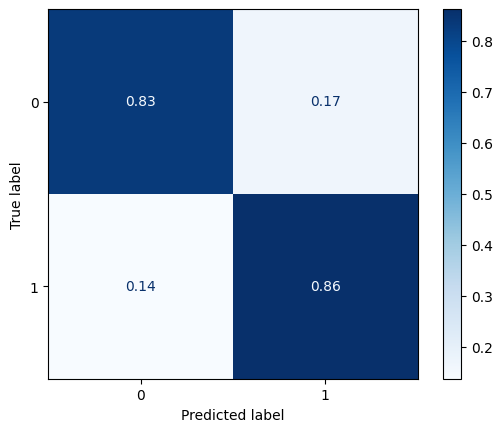

In [6]:
# The solver is 'saga' because it is fast for large dataset
# The max_iter is 2400 because if it is lower the solver fails to converge (it hasn't reached the global optimum* to within the specified tolerance)
# The class_weight is used to consider the different number of sample for each class (malware and benign)

classifier = LogisticRegression(random_state=seed, solver='saga', max_iter=2400, class_weight='balanced')
classifier.fit(document_term_matrix_training, y_train)

train_predictions = classifier.predict(document_term_matrix_training)
validation_predictions = classifier.predict(document_term_matrix_validation)
test_predictions = classifier.predict(document_term_matrix_testing)

# Evaluating the classifier
train_accuracy = accuracy_score(y_train, train_predictions)
validation_accuracy = accuracy_score(y_val, validation_predictions)
test_accuracy = accuracy_score(y_test, test_predictions)

train_precision = precision_score(y_train, train_predictions, average=None)
validation_precision = precision_score(y_val, validation_predictions, average=None)
test_precision = precision_score(y_test, test_predictions, average=None)

train_recall = recall_score(y_train, train_predictions, average=None)
validation_recall = recall_score(y_val, validation_predictions, average=None)
test_recall = recall_score(y_test, test_predictions, average=None)

train_f1 = f1_score(y_train, train_predictions, average=None)
validation_f1 = f1_score(y_val, validation_predictions, average=None)
test_f1 = f1_score(y_test, test_predictions, average=None)

print(f'Train Accuracy: {train_accuracy:.4f}')
print(f'Train Precision Scores: {train_precision}')
print(f'Train Recall Scores: {train_recall}')
print(f'Train F1 Scores: {train_f1}')

print(f'Validation Accuracy: {validation_accuracy:.4f}')
print(f'Validation Precision Scores: {validation_precision}')
print(f'Validation Recall Scores: {validation_recall}')
print(f'Validation F1 Scores: {validation_f1}')

print(f'Test Accuracy: {test_accuracy:.4f}')
print(f'Test Precision Scores: {test_precision}')
print(f'Test Recall Scores: {test_recall}')
print(f'Test F1 Scores: {test_f1}')

# Generate confusion matrix
ConfusionMatrixDisplay.from_predictions(y_test, test_predictions, cmap="Blues", normalize="true")

# Task 2: FFNN

In [7]:
# Computing mean for each API sequence length for training and testing set
api_calls_training_len = [len(seq) for seq in X_train]
api_calls_testing_len = [len(seq) for seq in X_test]

print(f"Training set sequences length -> Mean: {round(np.mean(api_calls_training_len),2)} - Standard deviation: {round(np.std(api_calls_training_len), 2)}")
print(f"Testing set sequences length  -> Mean: {round(np.mean(api_calls_testing_len), 2)} - Standard deviation: {round(np.std(api_calls_testing_len), 2)}")

Training set sequences length -> Mean: 76.13 - Standard deviation: 8.86
Testing set sequences length  -> Mean: 85.75 - Standard deviation: 8.88


## Using sequential IDs

In [8]:
# Assigning sequential IDs to training set
for i in range(0, len(X_train)):
    row = X_train[i]
    for j in range(len(row)):
        row[j] = vectorizer.vocabulary_[row[j].lower()]
    if len(row) < 100:  ## To pad the sequences with less than 100 elements
        for k in range(0, 100 - len(row)):
            row.append(max(vectorizer.vocabulary_.values()) + 1)
    X_train[i] = row

# Assigning sequential IDs to validation set
for i in range(0, len(X_val)):
    row = X_val[i]
    for j in range(len(row)):
        if row[j].lower() not in vectorizer.vocabulary_.keys():  # To manage the out-of-vocabulary words
            row[j] = max(vectorizer.vocabulary_.values()) + 2
        else:
            row[j] = vectorizer.vocabulary_[row[j].lower()]
    if len(row) < 100:  ## To pad the sequences with less than 100 elements
        for k in range(0, 100 - len(row)):
            row.append(max(vectorizer.vocabulary_.values()) + 1)
    X_val[i] = row

# Assigning sequential IDs to testing set
for i in range(0, len(X_test)):
    row = X_test[i]
    for j in range(len(row)):
        if row[j].lower() not in vectorizer.vocabulary_.keys():  # To manage the out-of-vocabulary words
            row[j] = max(vectorizer.vocabulary_.values()) + 2
        else:
            row[j] = vectorizer.vocabulary_[row[j].lower()]
    if len(row) < 100:  ## To pad the sequences with less than 100 elements
        for k in range(0, 100 - len(row)):
            row.append(max(vectorizer.vocabulary_.values()) + 1)
    X_test[i] = row

In [9]:
def training_loop(model, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, criterion, num_epochs, patience=10, min_delta=0.001):
    start_time = time.time()
    train_losses = []
    val_losses = []

    best_val_loss = float('inf')
    epochs_no_improvement = 0

    for epoch in tqdm(range(num_epochs), desc="Training"):  # Train for epochs
        train_loss = 0
        val_loss = 0
        model.train()  # Set model to training mode
        for batch_X, batch_y in train_loader:
            batch_X, batch_y = batch_X.to(device), batch_y.to(device)  # Move batch to GPU
            optimizer.zero_grad()  # Clear previous gradients
            outputs = model(batch_X)  # Forward pass
            loss = criterion(outputs, batch_y)  # Compute loss
            loss.backward()  # Backpropagation
            optimizer.step()  # Update model parameters
            train_loss += loss.item() * batch_X.size(0)
        train_loss /= len(train_dataset)
        train_losses.append(train_loss)  # Store training loss

        # Compute Validation loss during training
        model.eval()  # Set model to evaluation mode
        with torch.no_grad():  # Disable gradient computation for validation
            for batch_X, batch_y in val_loader:
                batch_X, batch_y = batch_X.to(device), batch_y.to(device)  # Move batch to GPU
                val_outputs = model(batch_X)  # Forward pass
                loss = criterion(val_outputs, batch_y)  # Compute validation loss
                val_loss += loss.item() * batch_X.size(0)
            val_loss /= len(val_dataset)
            val_losses.append(val_loss)  # Store validation loss

        # Early stopping
        if best_val_loss - val_loss > min_delta:
            best_val_loss = val_loss
            epochs_no_improvement = 0
            torch.save(model.state_dict(), 'best_model.pth')  # Saving the best model
        else:
            epochs_no_improvement += 1
            if epochs_no_improvement >= patience:
                print(f'Early stopping triggered after {epoch + 1} epochs because there was no improvement over {patience} epochs!')
                print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {train_losses[-1]:.4f}, Val Loss: {val_losses[-1]:.4f}')
                break  # Stop training

        if (epoch + 1) % 20 == 0:
            print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {train_losses[-1]:.4f}, Val Loss: {val_losses[-1]:.4f}')

    end_time = time.time()
    elapsed_time = end_time - start_time

    print(f'The function took {elapsed_time:.2f} seconds to execute.')

    # Restore best model weights
    model.load_state_dict(torch.load('best_model.pth', map_location=device))

    # Plot the training and validation loss
    plt.figure(figsize=(10, 5))
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.grid()
    plt.show()

    return

def testing_model(model, dataloader, device):
    model.eval()  # Set the model to evaluation mode
    all_labels = []
    all_predictions = []

    with torch.no_grad():  # Disable gradient computation for efficiency
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)  # Move batch to GPU
            outputs = model(inputs)
            _, predicted = torch.max(outputs, 1)  # Get the class with the highest score
            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())

    accuracy = accuracy_score(all_labels, all_predictions) * 100
    precision = precision_score(all_labels, all_predictions, average=None) * 100
    recall = recall_score(all_labels, all_predictions, average=None) * 100
    f1 = f1_score(all_labels, all_predictions, average=None) * 100

    return accuracy, precision, recall, f1, all_labels, all_predictions

def stats(accuracy, precision, recall, f1, description):
    print(f'{description} Accuracy: {accuracy:.4f}')
    print(f'{description} Precision Scores: {precision}')
    print(f'{description} Recall Scores: {recall}')
    print(f'{description} F1 Scores: {f1}\n')

In [10]:
class NonLinearModel(nn.Module):
    def __init__(self, in_size, hid1_size, hid2_size, out_size):
        super(NonLinearModel, self).__init__()
        self.l1 = nn.Linear(in_size, hid1_size)
        self.l2 = nn.Linear(hid1_size, hid2_size)
        self.l3 = nn.Linear(hid2_size, out_size)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.4)
        self.bn1 = nn.BatchNorm1d(hid1_size)
        self.bn2 = nn.BatchNorm1d(hid2_size)

    def forward(self, x):
        x = self.l1(x)
        x = self.relu(x)
        x = self.bn1(x)
        x = self.dropout(x)
        x = self.l2(x)
        x = self.bn2(x)
        x = self.relu(x)
        x = self.dropout(x)
        x = self.l3(x)
        return x

Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.5752, Val Loss: 0.5488
Epoch 40/100, Train Loss: 0.5371, Val Loss: 0.4975
Early stopping triggered after 58 epochs because there was no improvement over 10 epochs!
Epoch 58/100, Train Loss: 0.5186, Val Loss: 0.4879
The function took 23.14 seconds to execute.


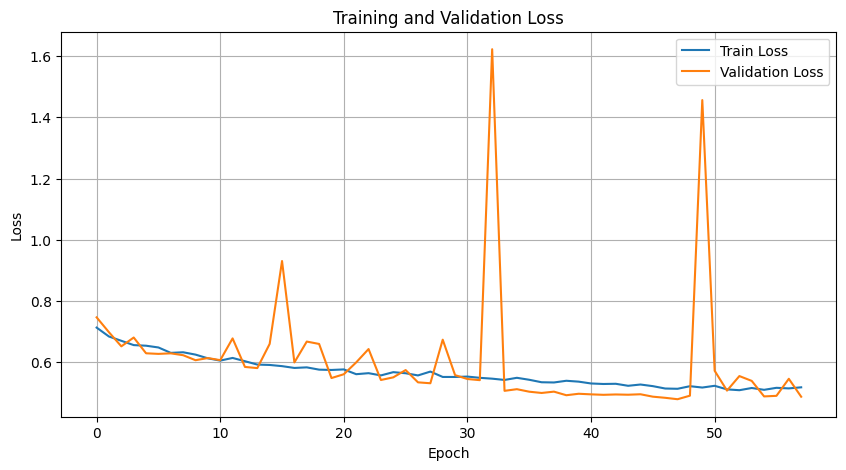

Training Accuracy: 75.4138
Training Precision Scores: [11.72816953 98.55303332]
Training Recall Scores: [74.65116279 75.44715447]
Training F1 Scores: [20.27155036 85.46595292]

Validation Accuracy: 74.9221
Validation Precision Scores: [10.01451379 98.72272485]
Validation Recall Scores: [74.19354839 74.94949495]
Validation F1 Scores: [17.64705882 85.20900322]

Test Accuracy: 75.8334
Test Precision Scores: [ 9.37167199 98.64741364]
Test Recall Scores: [70.4        76.02479222]
Test F1 Scores: [16.54135338 85.87112172]



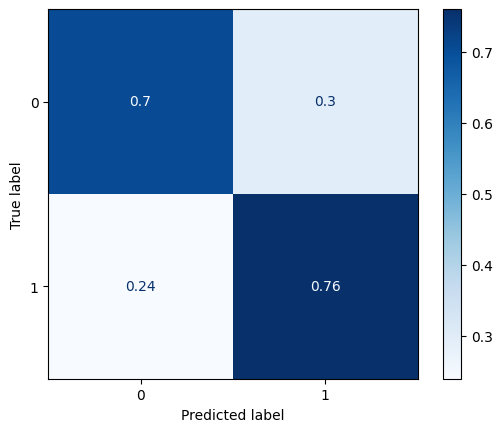

In [11]:
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
y_val_tensor = torch.tensor(y_val, dtype=torch.long)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
val_dataset = TensorDataset(X_val_tensor, y_val_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

vocabulary_size = len(vectorizer.vocabulary_) + 2  # Add 2 for padding and for out-of-vocabulary
input_size = 100
hidden1_size = 32
hidden2_size = 16
output_size = 2

model = NonLinearModel(input_size, hidden1_size, hidden2_size, 2)
model = model.to(device)

class_weight = compute_class_weight(class_weight='balanced', classes=np.unique(y_train), y=y_train)  # Computing class weights
class_weight_tensor = torch.tensor(class_weight, dtype=torch.float32).to(device)  # Converting to PyTorch tensor
criterion = nn.CrossEntropyLoss(weight=class_weight_tensor)

optimizer = optim.AdamW(model.parameters(), lr=0.0001)
num_epochs = 100
training_loop(model, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, criterion, num_epochs)

train_accuracy, train_precisionscores, train_recallscores, train_f1scores, _, _ = testing_model(model,train_loader,device)
val_accuracy, val_precisionscores, val_recallscores, val_f1scores, _, _ = testing_model(model,val_loader,device)
test_accuracy, test_precisionscores, test_recallscores, test_f1scores, all_labels_test, all_predictions_test = testing_model(model,test_loader,device)

stats(train_accuracy, train_precisionscores, train_recallscores, train_f1scores, 'Training')
stats(val_accuracy, val_precisionscores, val_recallscores, val_f1scores, 'Validation')
stats(test_accuracy, test_precisionscores, test_recallscores, test_f1scores, 'Test')

ConfusionMatrixDisplay.from_predictions(all_labels_test, all_predictions_test, normalize='true', cmap='Blues')

## Using embeddings

In [12]:
class EmbeddingsNonLinearModel(nn.Module):
    def __init__(self, vocab_size, seq_size, embed_size, hid_size, out_size):
        super(EmbeddingsNonLinearModel, self).__init__()

        # 1) embedding layer: vocab_size × d
        self.embedding = nn.Embedding(vocab_size, embed_size, padding_idx=max(vectorizer.vocabulary_.values()) + 1)

        # 2) first linear layer:
        self.fc1 = nn.Linear(seq_size * embed_size, hid_size) # (seq_len·d) → H
        self.bn1 = nn.BatchNorm1d(hid_size)

        # 3) second linear layer: H → 2
        self.fc2 = nn.Linear(hid_size, out_size)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(0.5)


    def forward(self, x: torch.LongTensor):
        # a) embedding lookup → (B, seq_len, d) certo, perchè se prima avevo per ogni parola d dim, se qui ho 100 parole avrò 100xd dimensioni
        x = self.embedding(x)

        # b) flatten →
        x = x.view(x.size(0), -1) # (B, seq_len·d) e infatti appatta con primo layer lineare definito sopra, in quanto quello è seq_len * d

        # c) linear + ReLU → (B, H)
        x = self.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.bn1(x)

        # d) final linear layer → (B, 2)
        x = self.fc2(x)
        return x

Training:   0%|          | 0/100 [00:00<?, ?it/s]

Early stopping triggered after 17 epochs because there was no improvement over 10 epochs!
Epoch 17/100, Train Loss: 0.1611, Val Loss: 0.3958
The function took 6.53 seconds to execute.


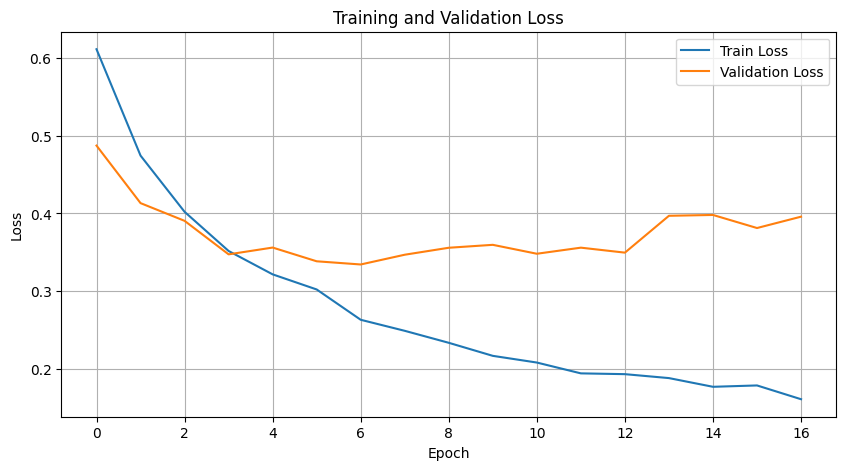

Training Accuracy: 94.1870
Training Precision Scores: [41.67497507 99.87050826]
Training Recall Scores: [97.20930233 94.05487805]
Training F1 Scores: [58.33914864 96.87549066]

Validation Accuracy: 91.9003
Validation Precision Scores: [27.62645914 99.04803116]
Validation Recall Scores: [76.34408602 92.48484848]
Validation F1 Scores: [40.57142857 95.65399081]

Test Accuracy: 92.8290
Test Precision Scores: [29.04689864 99.13277512]
Test Recall Scores: [76.8       93.3934357]
Test F1 Scores: [42.15148189 96.17755857]



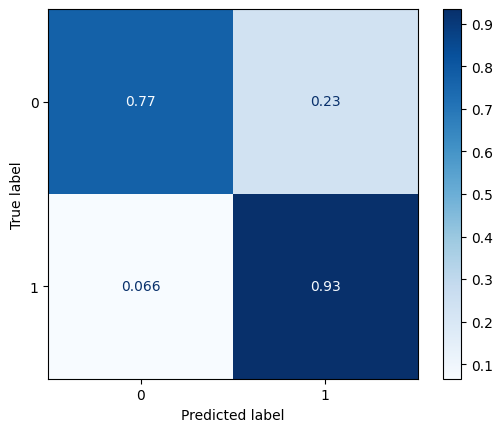

In [13]:
X_train_tensor = torch.tensor(X_train, dtype=torch.long)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
X_val_tensor = torch.tensor(X_val, dtype=torch.long)
y_val_tensor = torch.tensor(y_val, dtype=torch.long)
X_test_tensor = torch.tensor(X_test, dtype=torch.long)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
val_dataset = TensorDataset(X_val_tensor, y_val_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

vocabulary_size_embedding = len(vectorizer.vocabulary_) + 2  # Add 2 for padding for out-of-vocabulary and padding
sequence_size = 100
embedding_size = 8
hidden_size = 32
output_size_embedding = 2

model = EmbeddingsNonLinearModel(vocabulary_size_embedding, sequence_size, embedding_size, hidden_size, output_size_embedding)
model = model.to(device)

class_weight = compute_class_weight(class_weight='balanced', classes=np.unique(y_train), y=y_train)  # Computing class weights
class_weight_tensor_embedding = torch.tensor(class_weight, dtype=torch.float32).to(device)  # Converting to PyTorch tensor
criterion = nn.CrossEntropyLoss(class_weight_tensor_embedding)

optimizer = optim.AdamW(model.parameters(), lr=0.0005, weight_decay=0.0001)
num_epochs = 100
training_loop(model, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, criterion, num_epochs)

train_accuracy, train_precisionscores, train_recallscores, train_f1scores, _, _ = testing_model(model,train_loader,device)
val_accuracy, val_precisionscores, val_recallscores, val_f1scores, _, _ = testing_model(model,val_loader,device)
test_accuracy, test_precisionscores, test_recallscores, test_f1scores, all_labels_test, all_predictions_test = testing_model(model,test_loader,device)

stats(train_accuracy, train_precisionscores, train_recallscores, train_f1scores, 'Training')
stats(val_accuracy, val_precisionscores, val_recallscores, val_f1scores, 'Validation')
stats(test_accuracy, test_precisionscores, test_recallscores, test_f1scores, 'Test')

ConfusionMatrixDisplay.from_predictions(all_labels_test, all_predictions_test, normalize='true', cmap='Blues')

# Task 3: RNN

In [9]:
import random
import time
import numpy as np
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, ConfusionMatrixDisplay, precision_score, f1_score, recall_score
import torch
from sklearn.model_selection import train_test_split
from torch import nn, optim
from torch.utils.data import TensorDataset, DataLoader, Dataset
from sklearn.utils import compute_class_weight
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from torch.nn.utils.rnn import pad_sequence,  pack_padded_sequence

# Set seeds
seed = 69
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

# Set GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"The device is set to: {device}")

The device is set to: cuda


## Preprocessing

In [10]:
data_1 = pd.read_json("/kaggle/input/lab22222/train.json").drop(columns='md5hash')
data_2 = pd.read_json("/kaggle/input/lab22222/test.json").drop(columns='md5hash')

previous_length = len(data_1)
data_1 = data_1.drop_duplicates(subset=["api_call_sequence"])
print(f"Removed {previous_length - len(data_1)} duplicates \nDataset length: {len(data_1)}")

previous_length = len(data_2)
data_2 = data_2.drop_duplicates(subset=["api_call_sequence"])
print(f"Removed {previous_length - len(data_2)} duplicates \nDataset length: {len(data_2)}")

X = data_1.iloc[:, :-1].values # Remove label column
X = [x[0] for x in X]
y = data_1.iloc[:, -1].values

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=seed)  # 80% of the data is used for training
X_test = data_2.iloc[:, :-1].values # Remove label column
X_test = [x[0] for x in X_test]
y_test = data_2.iloc[:, -1].values

X_train_str = [str(x) for x in X_train]
X_val_str = [str(x) for x in X_val]
X_test_str = [str(x) for x in X_test]

vectorizer = CountVectorizer()

# Computing the matrix representing the words contained in each api sequence
document_term_matrix_training = vectorizer.fit_transform(X_train_str)  # The vocabulary is computed on the training set and is used to compute the matrix for the other datasets

Removed 17875 duplicates 
Dataset length: 12838
Removed 5814 duplicates 
Dataset length: 7349


In [11]:
# Assigning sequential IDs to training set
for i in range(0, len(X_train)):
    row = X_train[i]
    for j in range(len(row)):
        row[j] = vectorizer.vocabulary_[row[j].lower()]
    X_train[i] = row

# Assigning sequential IDs to validation set
for i in range(0, len(X_val)):
    row = X_val[i]
    for j in range(len(row)):
        if row[j].lower() not in vectorizer.vocabulary_.keys():  # To manage the out-of-vocabulary words
            row[j] = max(vectorizer.vocabulary_.values()) + 2
        else:
            row[j] = vectorizer.vocabulary_[row[j].lower()]
    X_val[i] = row

# Assigning sequential IDs to testing set
for i in range(0, len(X_test)):
    row = X_test[i]
    for j in range(len(row)):
        if row[j].lower() not in vectorizer.vocabulary_.keys():  # To manage the out-of-vocabulary words
            row[j] = max(vectorizer.vocabulary_.values()) + 2
        else:
            row[j] = vectorizer.vocabulary_[row[j].lower()]
    X_test[i] = row

In [12]:
class TimeSeriesDataset(Dataset):
    def __init__(self, time_series_list, labels_list):
        """
        Initialize the dataset with sequences and corresponding labels.

        Args:
            time_series_list: List of time series sequences
            labels_list: List of corresponding labels
        """
        super(TimeSeriesDataset, self).__init__()
        self.time_series_list = time_series_list  # List of sequences
        self.labels_list = labels_list            # List of labels

    def __len__(self):
        """Returns the total number of samples in the dataset"""
        return len(self.time_series_list)

    def __getitem__(self, idx):
        """
        Retrieves a single sample and its label.

        Args:
            idx: Index of the sample to retrieve

        Returns:
            tuple: (sequence tensor, label tensor)
        """
        sequence = torch.tensor(self.time_series_list[idx], dtype=torch.float32)
        label = torch.tensor(self.labels_list[idx], dtype=torch.long)
        return sequence, label

def collate_fn(batch):
    """
    Custom collate function for DataLoader to handle variable-length sequences.
    Sorts sequences by length (descending) for efficient RNN processing and pads them.

    Args:
        batch: List of (sequence, label) tuples

    Returns:
        tuple: (padded_sequences, sequence_lengths, sorted_labels)
    """
    sequences, labels = zip(*batch) # Unpack batch
    lengths = torch.tensor([len(seq) for seq in sequences]) # Sequence lengths

    # Sort sequences by length (descending) to optimize RNN processing
    sorted_indices = lengths.argsort(descending=True)
    sequences = [sequences[i] for i in sorted_indices]
    labels = torch.stack([labels[i] for i in sorted_indices])  # Convert to tensor
    lengths = lengths[sorted_indices]  # Sort lengths too

    # Pad sequences to have uniform length in a batch
    padded_sequences = pad_sequence(sequences, batch_first=True, padding_value=max(vectorizer.vocabulary_.values()) + 1)
    return padded_sequences, lengths, labels

In [13]:
def training_loop(model, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, criterion, num_epochs, patience=10, min_delta=0.001):
    start_time = time.time()
    train_losses = []
    val_losses = []

    best_val_loss = float('inf')
    epochs_no_improvement = 0

    # Training loop
    for epoch in tqdm(range(num_epochs), desc="Training"):  # Train for epochs
        train_loss = 0
        val_loss = 0
        model.train()  # Set model to training mode
        for batch_X, lengths, batch_y in train_loader:
            batch_X, lengths, batch_y = batch_X.to(device), lengths.to(device), batch_y.to(device)  # Move batch to GPU
            optimizer.zero_grad()  # Clear previous gradients
            outputs = model(batch_X,lengths)  # Forward pass
            loss = criterion(outputs, batch_y)  # Compute loss
            loss.backward()  # Backpropagation
            optimizer.step()  # Update model parameters
            train_loss += loss.item() * batch_X.size(0)
        train_loss /= len(train_dataset)
        train_losses.append(train_loss)  # Store training loss

        # Compute Validation loss during training
        model.eval()  # Set model to evaluation mode
        with torch.no_grad():  # Disable gradient computation for validation
            for batch_X, lengths, batch_y in val_loader:
                batch_X, lengths, batch_y = batch_X.to(device), lengths.to(device), batch_y.to(device)  # Move batch to GPU
                val_outputs = model(batch_X,lengths)  # Forward pass
                loss = criterion(val_outputs, batch_y)  # Compute validation loss
                val_loss += loss.item() * batch_X.size(0)
            val_loss /= len(val_dataset)
            val_losses.append(val_loss)  # Store validation loss

        # Early stopping
        if best_val_loss - val_loss > min_delta:
            best_val_loss = val_loss
            epochs_no_improvement = 0
            torch.save(model.state_dict(), 'best_model.pth')  # Saving the best model
        else:
            epochs_no_improvement += 1
            if epochs_no_improvement >= patience:
                print(f'Early stopping triggered after {epoch + 1} epochs because no improvements over {patience} subsequent epochs!')
                print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {train_losses[-1]:.4f}, Val Loss: {val_losses[-1]:.4f}')
                break  # Stop training

        if (epoch + 1) % 20 == 0:
            print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {train_losses[-1]:.4f}, Val Loss: {val_losses[-1]:.4f}')

    end_time = time.time()
    elapsed_time = end_time - start_time

    print(f'The function took {elapsed_time:.2f} seconds to execute.')

    # Restore best model weights
    model.load_state_dict(torch.load('best_model.pth', map_location=device))

    # Plot the training and validation loss
    plt.figure(figsize=(10, 5))
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.grid()
    plt.show()

    return

def testing_model(model, dataloader, device):
    model.eval()  # Set the model to evaluation mode
    all_labels = []
    all_predictions = []

    with torch.no_grad():  # Disable gradient computation for efficiency
        for inputs, lengths, labels in dataloader:
            inputs, lengths, labels = inputs.to(device), lengths.to(device), labels.to(device)  # Move batch to GPU
            outputs = model(inputs,lengths)
            _, predicted = torch.max(outputs, 1)  # Get the class with the highest score
            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())

    accuracy = accuracy_score(all_labels, all_predictions) * 100
    precision = precision_score(all_labels, all_predictions, average=None) * 100
    recall = recall_score(all_labels, all_predictions, average=None) * 100
    f1 = f1_score(all_labels, all_predictions, average=None) * 100

    return accuracy, precision, recall, f1, all_labels, all_predictions

def stats(accuracy, precision, recall, f1, description):
    print(f'{description} Accuracy: {accuracy:.4f}')
    print(f'{description} Precision Scores: {precision}')
    print(f'{description} Recall Scores: {recall}')
    print(f'{description} F1 Scores: {f1}\n')

## Monodirectional

In [19]:
class MonoDirectionalRNN(nn.Module):
    def __init__(self, vocab_size, embed_size, hid_size, out_size):
        super(MonoDirectionalRNN, self).__init__()

        # 1) embedding layer: vocab_size × d
        self.embedding = nn.Embedding(vocab_size, embed_size, padding_idx=max(vectorizer.vocabulary_.values()) + 1)

        self.hidden_layer_size = hid_size

        # 2) First linear layer: (seq_len·d) → H
        # batch first is used to specify that the matrix in input has dimension: (batch_size, sequence_length, input_size)
        self.rnn = nn.RNN(input_size=embed_size, hidden_size=hid_size, batch_first=True, num_layers=2, nonlinearity="tanh", dropout=0.5)

        # 3) secondo layer lineare: H → 2
        self.linear = nn.Linear(hid_size, out_size)

    """
     Output of rnn:
         - **rnn_out** contains the output for all time steps.
           It has shape (batch_size, sequence_length, hidden_size).
         - **h** contains the hidden states for all layers at the last time step.A
            It has shape (num_layers, batch_size, hidden_size).
         - if different time-series have different sequence_length, rnn_out can generate errors
         - with h we get batch_size instead of sequence_length
           ==> no problem with different sequence_length

         - We do not return them in the tracking loop to
             - avoid problems with the gradient vanish/exploding
             - use the windows independently (if possible) and shuffle the data
        Returns:
         - predictions: The predicted pollution levels for the input sequence.
         Use h from last hidden node helps with time-series having different lengths
    """
    def forward(self, x: torch.LongTensor, lengths):

        # embedding lookup → (B, seq_len, d) # certo, perchè se prima avevo per ogni parola d dim, se qui ho 100 parole avrò 100xd dimensioni
        x = self.embedding(x.long())

        x = pack_padded_sequence(x, lengths.cpu(), batch_first=True, enforce_sorted=True)   # internally it knows, thanks to collate_fn function, which ones are padded

        rnn_out, h = self.rnn(x)

        predictions = self.linear(h[-1])
        return predictions

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 4 and hidden dim 8


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.5264, Val Loss: 0.6036
Epoch 40/100, Train Loss: 0.4578, Val Loss: 0.5140
Epoch 60/100, Train Loss: 0.4027, Val Loss: 0.4801
Early stopping triggered after 68 epochs because no improvements over 10 subsequent epochs!
Epoch 68/100, Train Loss: 0.3889, Val Loss: 0.4896
The function took 122.79 seconds to execute.


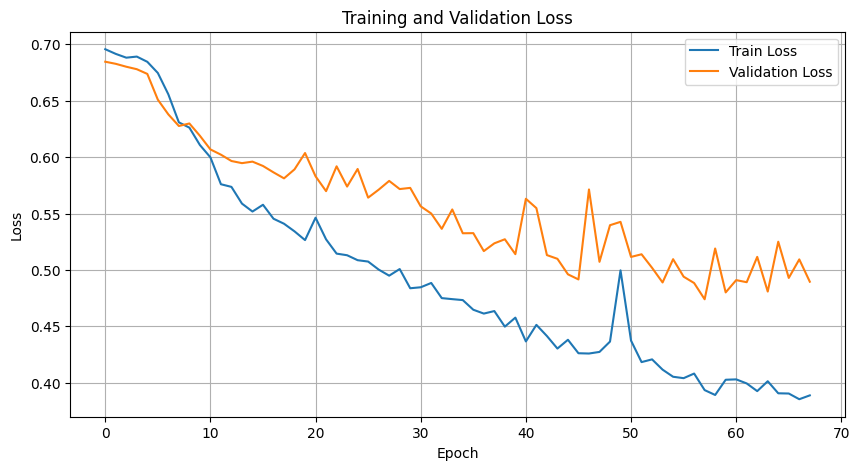

Training Accuracy: 78.8802
Training Precision Scores: [15.31711209 99.40744558]
Training Recall Scores: [89.30232558 78.42479675]
Training F1 Scores: [26.14913177 87.67823666]

Validation Accuracy: 78.5826
Validation Precision Scores: [12.72430669 99.23273657]
Validation Recall Scores: [83.87096774 78.38383838]
Validation F1 Scores: [22.09631728 87.58465011]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 4 and hidden dim 16


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.5278, Val Loss: 0.5982
Epoch 40/100, Train Loss: 0.4726, Val Loss: 0.5960
Epoch 60/100, Train Loss: 0.4490, Val Loss: 0.5663
Early stopping triggered after 69 epochs because no improvements over 10 subsequent epochs!
Epoch 69/100, Train Loss: 0.4747, Val Loss: 0.5710
The function took 124.98 seconds to execute.


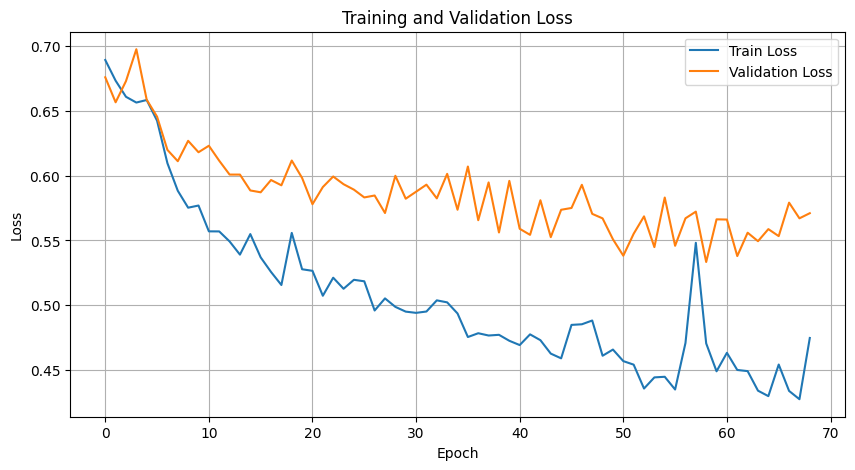

Training Accuracy: 74.6446
Training Precision Scores: [13.10251188 99.39923539]
Training Recall Scores: [89.76744186 73.98373984]
Training F1 Scores: [22.86729858 84.82871126]

Validation Accuracy: 72.8193
Validation Precision Scores: [ 9.93377483 99.00717044]
Validation Recall Scores: [80.64516129 72.52525253]
Validation F1 Scores: [17.68867925 83.72201493]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 4 and hidden dim 32


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.5369, Val Loss: 0.5741
Early stopping triggered after 37 epochs because no improvements over 10 subsequent epochs!
Epoch 37/100, Train Loss: 0.5240, Val Loss: 0.5501
The function took 66.35 seconds to execute.


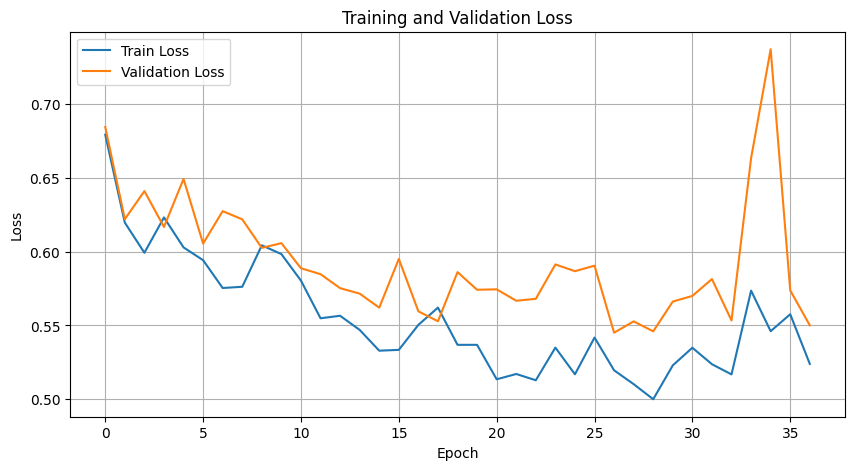

Training Accuracy: 75.9883
Training Precision Scores: [12.79239766 98.93814707]
Training Recall Scores: [81.39534884 75.75203252]
Training F1 Scores: [22.10991788 85.80637735]

Validation Accuracy: 75.5841
Validation Precision Scores: [10.26785714 98.73417722]
Validation Recall Scores: [74.19354839 75.63636364]
Validation F1 Scores: [18.03921569 85.65545642]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 4 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.5217, Val Loss: 0.5784
Early stopping triggered after 23 epochs because no improvements over 10 subsequent epochs!
Epoch 23/100, Train Loss: 0.5247, Val Loss: 0.5611
The function took 41.30 seconds to execute.


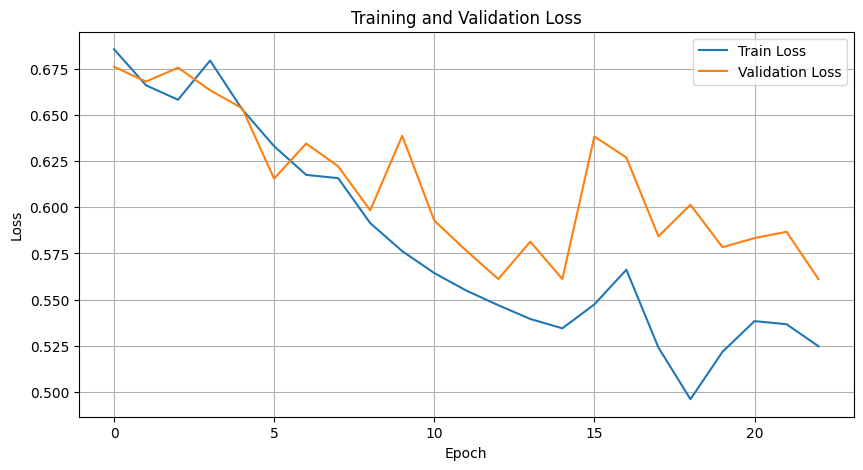

Training Accuracy: 68.7926
Training Precision Scores: [10.14076415 98.86581234]
Training Recall Scores: [82.09302326 68.21138211]
Training F1 Scores: [18.05164919 80.72644176]

Validation Accuracy: 67.9128
Validation Precision Scores: [ 8.13287514 98.7020649 ]
Validation Recall Scores: [76.34408602 67.5959596 ]
Validation F1 Scores: [14.69979296 80.23980815]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 4 and hidden dim 128


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.6701, Val Loss: 0.6778
Early stopping triggered after 26 epochs because no improvements over 10 subsequent epochs!
Epoch 26/100, Train Loss: 0.6693, Val Loss: 0.6487
The function took 52.18 seconds to execute.


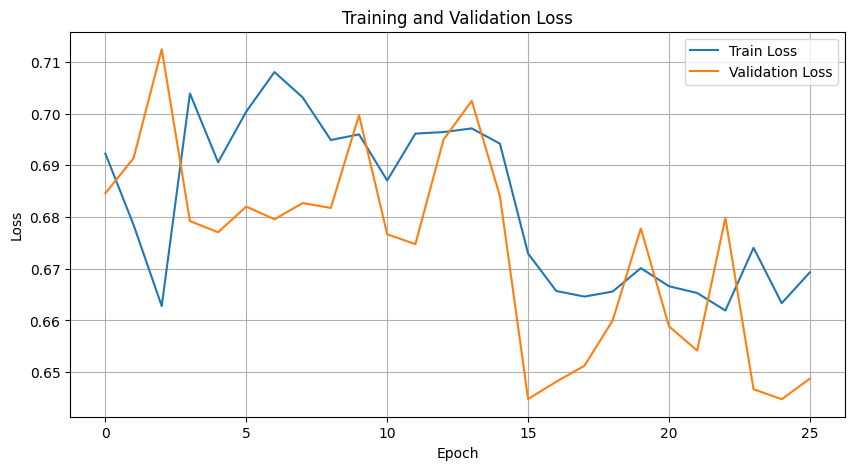

Training Accuracy: 63.3398
Training Precision Scores: [ 6.78932366 97.37950398]
Training Recall Scores: [60.93023256 63.44512195]
Training F1 Scores: [12.21730007 76.83219494]

Validation Accuracy: 62.3832
Validation Precision Scores: [ 6.13065327 97.96567069]
Validation Recall Scores: [65.59139785 62.26262626]
Validation F1 Scores: [11.21323529 76.13636364]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 4 and hidden dim 256


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Early stopping triggered after 11 epochs because no improvements over 10 subsequent epochs!
Epoch 11/100, Train Loss: 0.7072, Val Loss: 0.7769
The function took 23.50 seconds to execute.


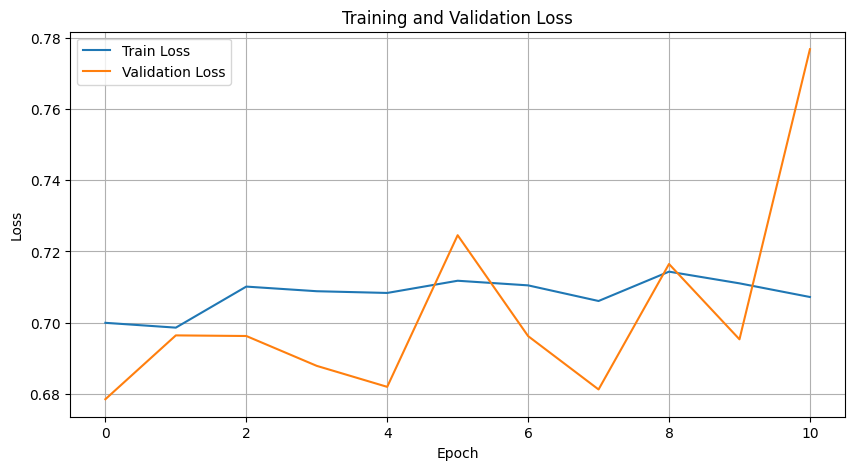

Training Accuracy: 61.2950
Training Precision Scores: [ 5.34139582 96.54023171]
Training Recall Scores: [49.30232558 61.81910569]
Training F1 Scores: [ 9.63855422 75.37327303]

Validation Accuracy: 62.3832
Validation Precision Scores: [ 5.23076923 97.36346516]
Validation Recall Scores: [54.83870968 62.66666667]
Validation F1 Scores: [ 9.5505618  76.25368732]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 4 and hidden dim 320


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Early stopping triggered after 20 epochs because no improvements over 10 subsequent epochs!
Epoch 20/100, Train Loss: 0.7095, Val Loss: 0.7094
The function took 46.25 seconds to execute.


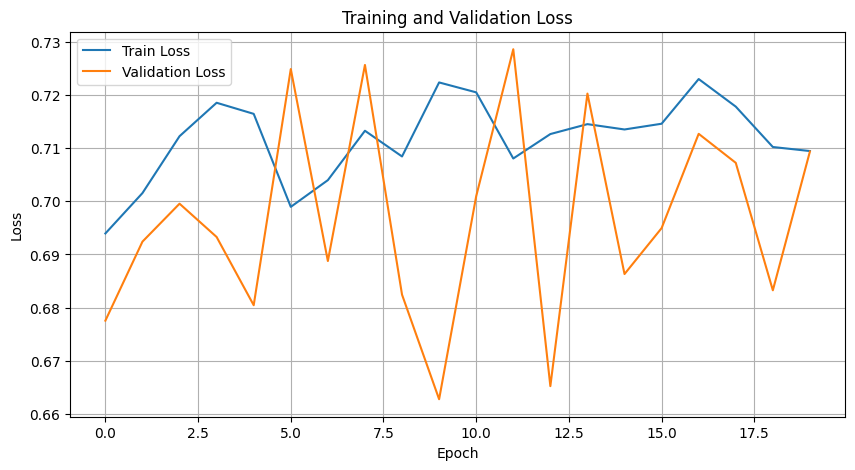

Training Accuracy: 91.2171
Training Precision Scores: [10.53511706 96.20554177]
Training Recall Scores: [14.65116279 94.56300813]
Training F1 Scores: [12.25680934 95.37720377]

Validation Accuracy: 91.0826
Validation Precision Scores: [ 9.03614458 96.75270608]
Validation Recall Scores: [16.12903226 93.8989899 ]
Validation F1 Scores: [11.58301158 95.30449047]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 4 and hidden dim 384


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Early stopping triggered after 20 epochs because no improvements over 10 subsequent epochs!
Epoch 20/100, Train Loss: 0.7065, Val Loss: 0.7233
The function took 49.96 seconds to execute.


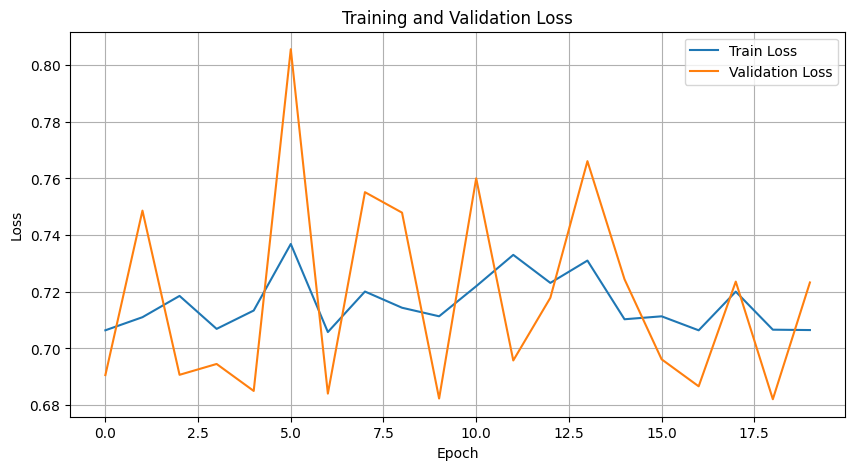

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Accuracy: 95.8130
Training Precision Scores: [ 0.         95.81304771]
Training Recall Scores: [  0. 100.]
Training F1 Scores: [ 0.         97.86176032]

Validation Accuracy: 96.3785
Validation Precision Scores: [ 0.         96.37850467]
Validation Recall Scores: [  0. 100.]
Validation F1 Scores: [ 0.         98.15585961]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 4 and hidden dim 512


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.7350, Val Loss: 0.7335
Early stopping triggered after 22 epochs because no improvements over 10 subsequent epochs!
Epoch 22/100, Train Loss: 0.7337, Val Loss: 0.6847
The function took 70.65 seconds to execute.


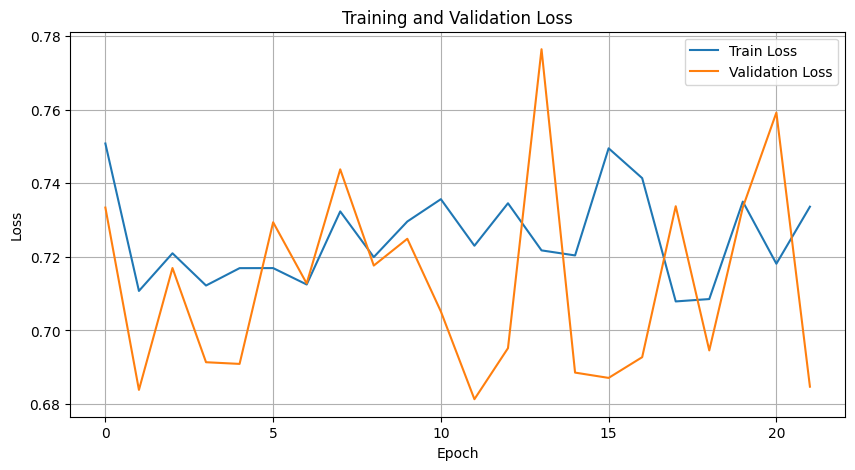

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training Accuracy: 95.8130
Training Precision Scores: [ 0.         95.81304771]
Training Recall Scores: [  0. 100.]
Training F1 Scores: [ 0.         97.86176032]

Validation Accuracy: 96.3785
Validation Precision Scores: [ 0.         96.37850467]
Validation Recall Scores: [  0. 100.]
Validation F1 Scores: [ 0.         98.15585961]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 8 and hidden dim 16


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.5037, Val Loss: 0.5322
Early stopping triggered after 22 epochs because no improvements over 10 subsequent epochs!
Epoch 22/100, Train Loss: 0.4966, Val Loss: 0.5785
The function took 39.86 seconds to execute.


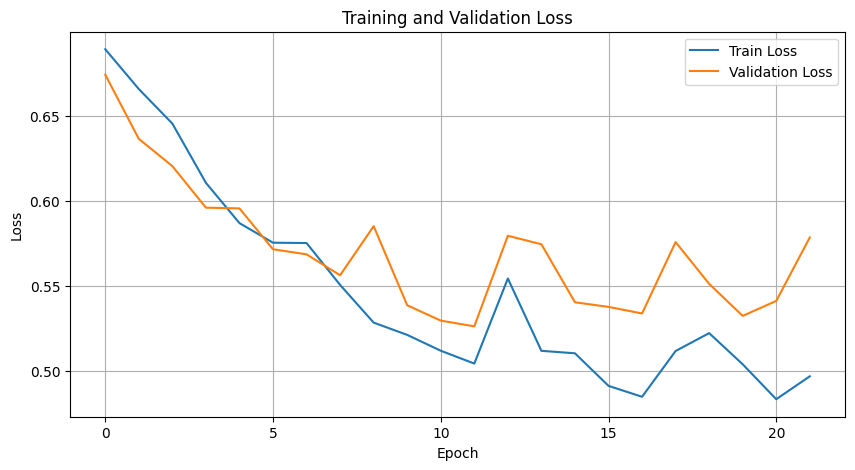

Training Accuracy: 86.4557
Training Precision Scores: [18.15772034 98.21938135]
Training Recall Scores: [63.72093023 87.44918699]
Training F1 Scores: [28.26199072 92.52190742]

Validation Accuracy: 86.4875
Validation Precision Scores: [14.72222222 98.1884058 ]
Validation Recall Scores: [56.98924731 87.5959596 ]
Validation F1 Scores: [23.3995585  92.59021994]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 8 and hidden dim 32


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Early stopping triggered after 16 epochs because no improvements over 10 subsequent epochs!
Epoch 16/100, Train Loss: 0.4756, Val Loss: 0.5743
The function took 28.92 seconds to execute.


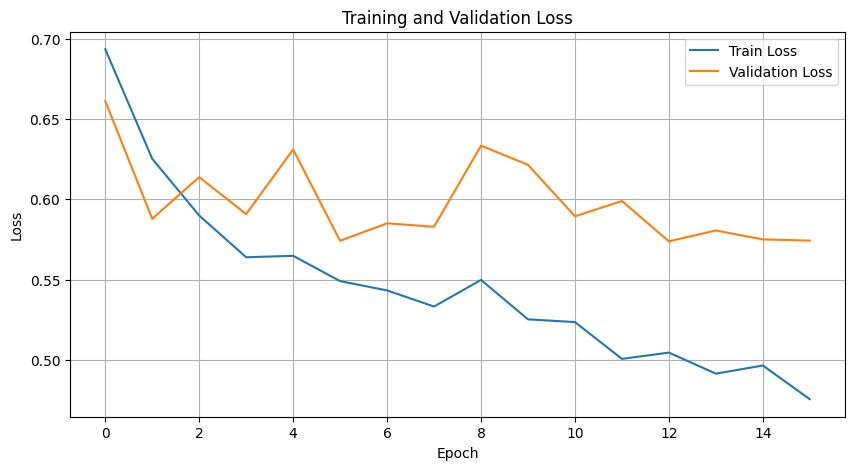

Training Accuracy: 72.5998
Training Precision Scores: [11.223162   98.81878822]
Training Recall Scores: [80.23255814 72.26626016]
Training F1 Scores: [19.69178082 83.48203804]

Validation Accuracy: 71.1449
Validation Precision Scores: [ 8.46153846 98.48993289]
Validation Recall Scores: [70.96774194 71.15151515]
Validation F1 Scores: [15.12027491 82.61787474]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 8 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Early stopping triggered after 19 epochs because no improvements over 10 subsequent epochs!
Epoch 19/100, Train Loss: 0.6490, Val Loss: 0.6160
The function took 34.27 seconds to execute.


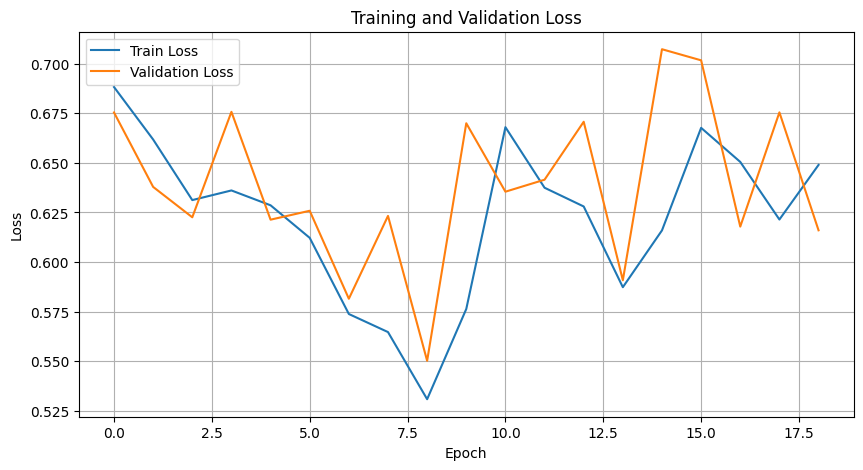

Training Accuracy: 73.8169
Training Precision Scores: [11.46366428 98.71917155]
Training Recall Scores: [78.13953488 73.62804878]
Training F1 Scores: [19.99404939 84.34716805]

Validation Accuracy: 73.5202
Validation Precision Scores: [ 9.17941586 98.53975122]
Validation Recall Scores: [70.96774194 73.61616162]
Validation F1 Scores: [16.25615764 84.27382054]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 8 and hidden dim 128


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Early stopping triggered after 15 epochs because no improvements over 10 subsequent epochs!
Epoch 15/100, Train Loss: 0.6116, Val Loss: 0.6224
The function took 29.91 seconds to execute.


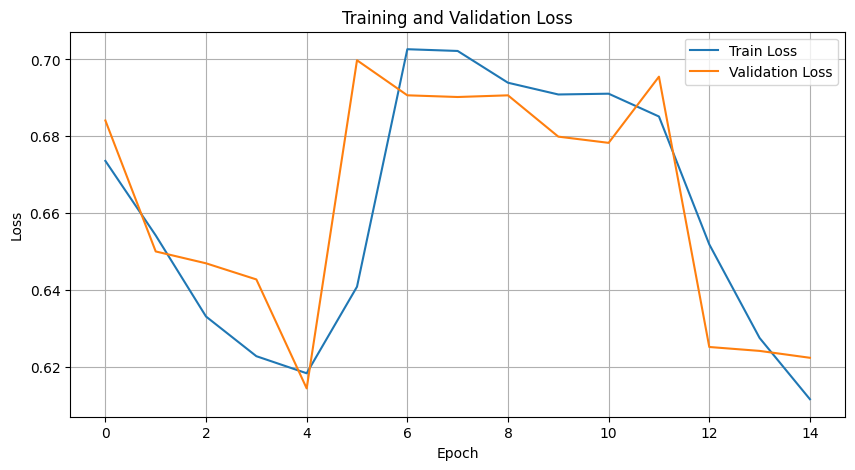

Training Accuracy: 67.0594
Training Precision Scores: [ 8.67618248 98.2081529 ]
Training Recall Scores: [72.09302326 66.83943089]
Training F1 Scores: [15.48838371 79.54284332]

Validation Accuracy: 65.9657
Validation Precision Scores: [ 6.65926748 98.02039592]
Validation Recall Scores: [64.51612903 66.02020202]
Validation F1 Scores: [12.07243461 78.89908257]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 8 and hidden dim 256


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Early stopping triggered after 11 epochs because no improvements over 10 subsequent epochs!
Epoch 11/100, Train Loss: 0.7061, Val Loss: 0.6923
The function took 23.63 seconds to execute.


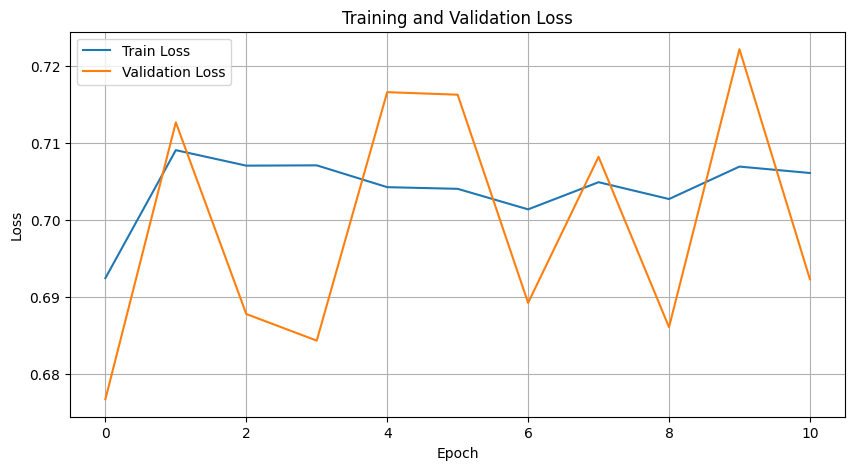

Training Accuracy: 70.3992
Training Precision Scores: [ 6.17864338 96.62643993]
Training Recall Scores: [42.79069767 71.60569106]
Training F1 Scores: [10.79812207 82.25542844]

Validation Accuracy: 69.0031
Validation Precision Scores: [ 4.64516129 96.82097044]
Validation Recall Scores: [38.70967742 70.14141414]
Validation F1 Scores: [ 8.29493088 81.34957826]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 8 and hidden dim 320


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Early stopping triggered after 11 epochs because no improvements over 10 subsequent epochs!
Epoch 11/100, Train Loss: 0.6775, Val Loss: 0.6805
The function took 25.42 seconds to execute.


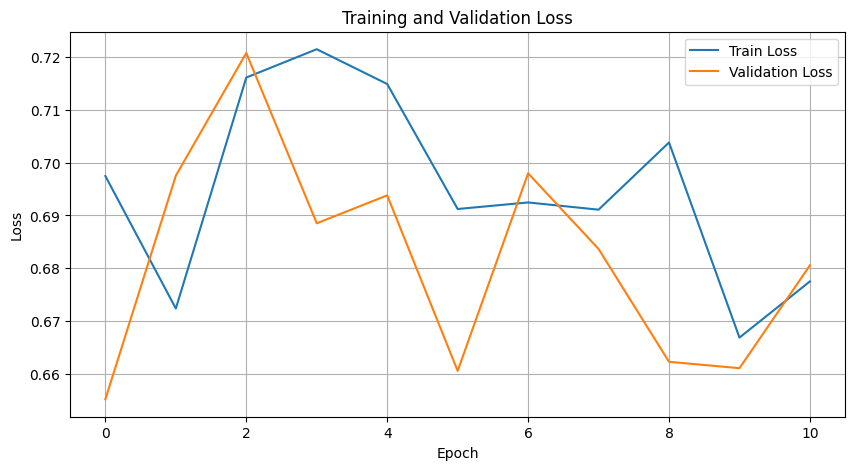

Training Accuracy: 86.4265
Training Precision Scores: [ 9.22165821 96.46786972]
Training Recall Scores: [25.34883721 89.09552846]
Training F1 Scores: [13.5235732  92.63524937]

Validation Accuracy: 86.9938
Validation Precision Scores: [ 7.11743772 96.80804547]
Validation Recall Scores: [21.50537634 89.45454545]
Validation F1 Scores: [10.69518717 92.98614028]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 8 and hidden dim 384


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Early stopping triggered after 11 epochs because no improvements over 10 subsequent epochs!
Epoch 11/100, Train Loss: 0.7177, Val Loss: 0.7133
The function took 27.48 seconds to execute.


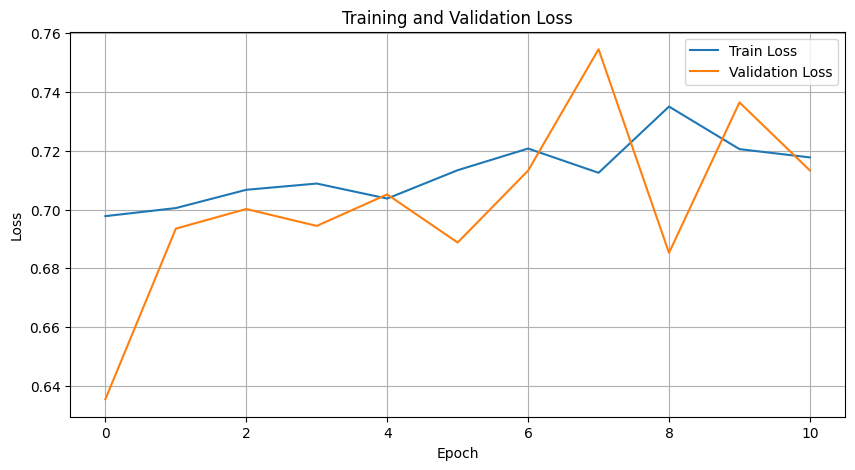

Training Accuracy: 83.5540
Training Precision Scores: [11.54551008 97.20838642]
Training Recall Scores: [43.95348837 85.28455285]
Training F1 Scores: [18.287373   90.85692632]

Validation Accuracy: 82.8271
Validation Precision Scores: [ 8.17307692 97.25836431]
Validation Recall Scores: [36.55913978 84.56565657]
Validation F1 Scores: [13.35952849 90.46898638]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 8 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Early stopping triggered after 17 epochs because no improvements over 10 subsequent epochs!
Epoch 17/100, Train Loss: 0.7261, Val Loss: 0.7342
The function took 54.35 seconds to execute.


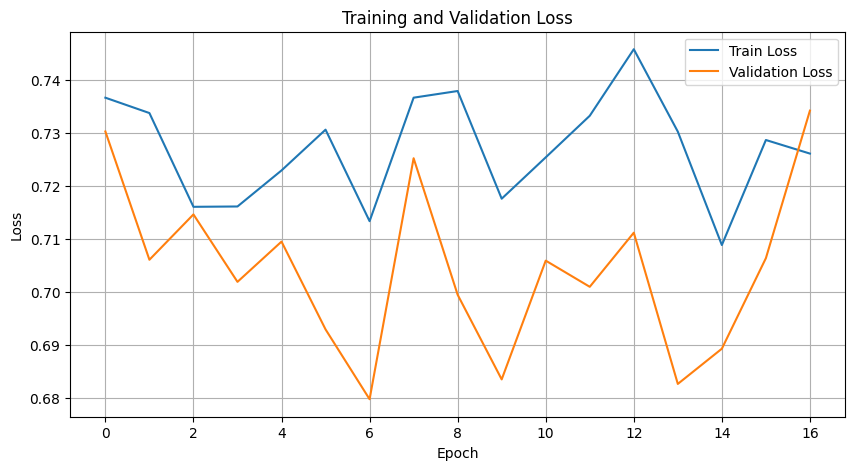

Training Accuracy: 84.7030
Training Precision Scores: [ 4.54183267 95.86245147]
Training Recall Scores: [13.25581395 87.82520325]
Training F1 Scores: [ 6.76557864 91.66799257]

Validation Accuracy: 85.1246
Validation Precision Scores: [ 4.98442368 96.57320872]
Validation Recall Scores: [17.20430108 87.67676768]
Validation F1 Scores: [ 7.7294686  91.91020754]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 16 and hidden dim 32


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.5090, Val Loss: 0.5262
Epoch 40/100, Train Loss: 0.5002, Val Loss: 0.5616
Early stopping triggered after 59 epochs because no improvements over 10 subsequent epochs!
Epoch 59/100, Train Loss: 0.4319, Val Loss: 0.5056
The function took 106.79 seconds to execute.


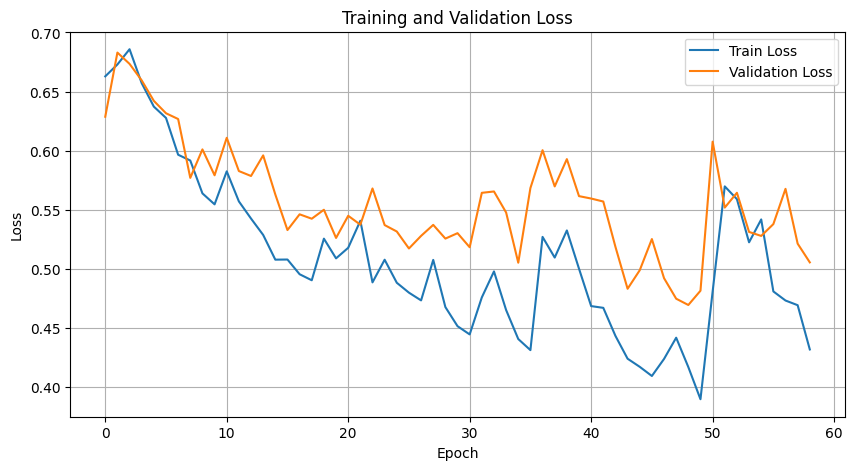

Training Accuracy: 81.0224
Training Precision Scores: [16.58600968 99.33725147]
Training Recall Scores: [87.6744186  80.73170732]
Training F1 Scores: [27.89493156 89.07327465]

Validation Accuracy: 80.3738
Validation Precision Scores: [12.83905967 98.90818859]
Validation Recall Scores: [76.34408602 80.52525253]
Validation F1 Scores: [21.98142415 88.77505568]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 16 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.3999, Val Loss: 0.5504
Early stopping triggered after 27 epochs because no improvements over 10 subsequent epochs!
Epoch 27/100, Train Loss: 0.3650, Val Loss: 0.5606
The function took 48.50 seconds to execute.


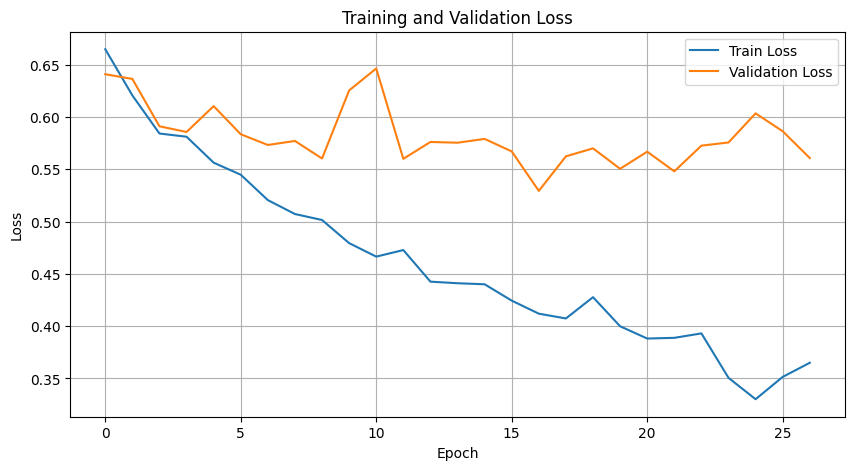

Training Accuracy: 78.9484
Training Precision Scores: [15.47049442 99.45890234]
Training Recall Scores: [90.23255814 78.45528455]
Training F1 Scores: [26.41252553 87.71730485]

Validation Accuracy: 78.3489
Validation Precision Scores: [11.35225376 98.73031996]
Validation Recall Scores: [73.11827957 78.54545455]
Validation F1 Scores: [19.65317919 87.48874887]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 16 and hidden dim 128


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Early stopping triggered after 17 epochs because no improvements over 10 subsequent epochs!
Epoch 17/100, Train Loss: 0.6015, Val Loss: 0.6350
The function took 34.73 seconds to execute.


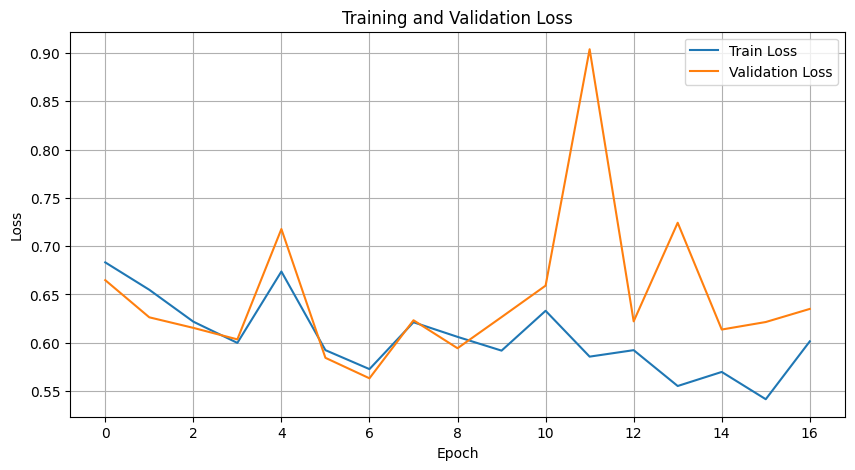

Training Accuracy: 77.5852
Training Precision Scores: [12.61980831 98.53206284]
Training Recall Scores: [73.48837209 77.76422764]
Training F1 Scores: [21.54055896 86.92491196]

Validation Accuracy: 76.8692
Validation Precision Scores: [10.42654028 98.60465116]
Validation Recall Scores: [70.96774194 77.09090909]
Validation F1 Scores: [18.18181818 86.53061224]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 16 and hidden dim 256


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.5524, Val Loss: 0.5688
Early stopping triggered after 31 epochs because no improvements over 10 subsequent epochs!
Epoch 31/100, Train Loss: 0.5593, Val Loss: 0.5685
The function took 66.36 seconds to execute.


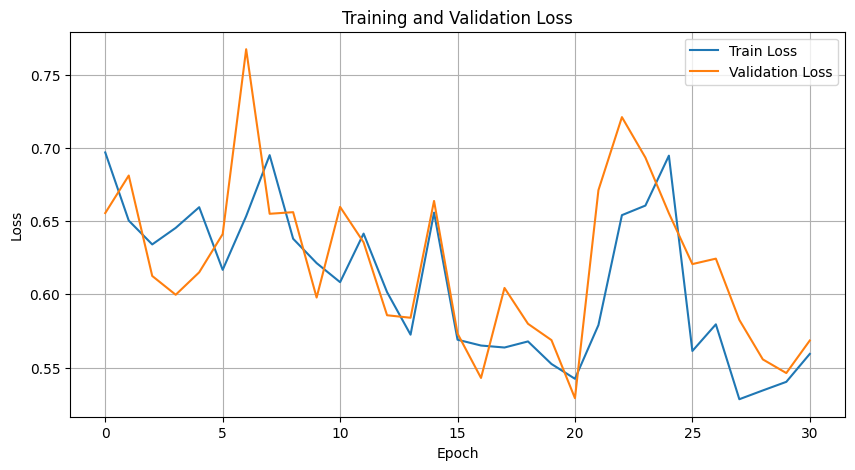

Training Accuracy: 73.8559
Training Precision Scores: [11.94735066 98.95990146]
Training Recall Scores: [82.3255814  73.48577236]
Training F1 Scores: [20.86648983 84.34128419]

Validation Accuracy: 72.5857
Validation Precision Scores: [ 9.64332893 98.89563777]
Validation Recall Scores: [78.49462366 72.36363636]
Validation F1 Scores: [17.17647059 83.57442837]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 16 and hidden dim 320


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Early stopping triggered after 20 epochs because no improvements over 10 subsequent epochs!
Epoch 20/100, Train Loss: 0.6478, Val Loss: 0.6867
The function took 46.19 seconds to execute.


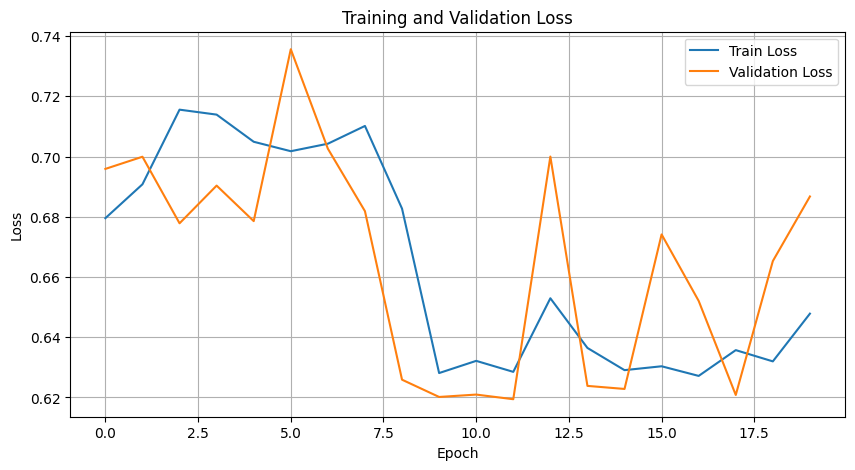

Training Accuracy: 75.3554
Training Precision Scores: [10.13282732 97.86509496]
Training Recall Scores: [62.09302326 75.93495935]
Training F1 Scores: [17.42251223 85.51645207]

Validation Accuracy: 75.3115
Validation Precision Scores: [ 8.44854071 98.01773605]
Validation Recall Scores: [59.13978495 75.91919192]
Validation F1 Scores: [14.78494624 85.56466302]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 16 and hidden dim 384


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Early stopping triggered after 11 epochs because no improvements over 10 subsequent epochs!
Epoch 11/100, Train Loss: 0.7091, Val Loss: 0.6937
The function took 27.40 seconds to execute.


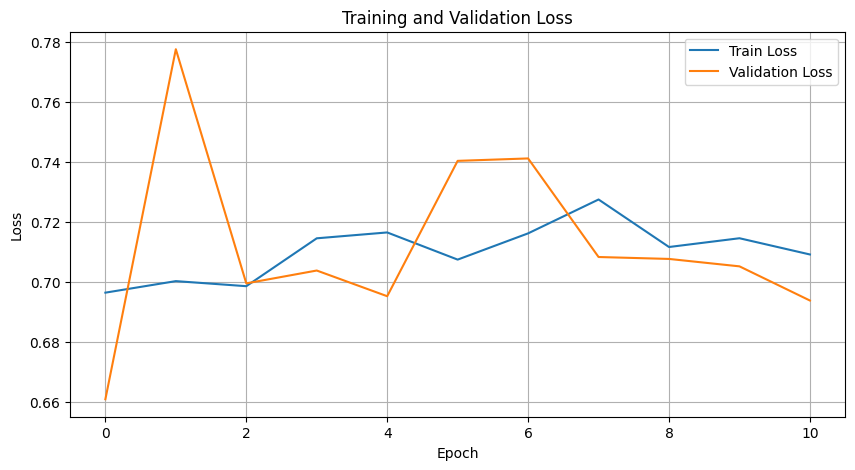

Training Accuracy: 86.9523
Training Precision Scores: [10.0877193  96.54983571]
Training Recall Scores: [26.74418605 89.58333333]
Training F1 Scores: [14.64968153 92.93621508]

Validation Accuracy: 86.6044
Validation Precision Scores: [ 7.74410774 96.91765742]
Validation Recall Scores: [24.7311828  88.92929293]
Validation F1 Scores: [11.79487179 92.75179098]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 16 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Early stopping triggered after 17 epochs because no improvements over 10 subsequent epochs!
Epoch 17/100, Train Loss: 0.7044, Val Loss: 0.6906
The function took 54.39 seconds to execute.


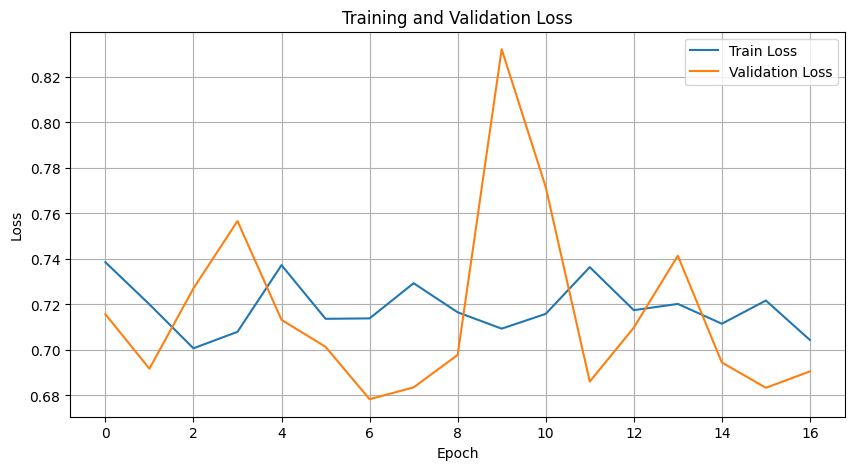

Training Accuracy: 89.1334
Training Precision Scores: [ 7.96568627 96.13920034]
Training Recall Scores: [15.11627907 92.36788618]
Training F1 Scores: [10.43338684 94.21581839]

Validation Accuracy: 88.8240
Validation Precision Scores: [ 5.90909091 96.59284497]
Validation Recall Scores: [13.97849462 91.63636364]
Validation F1 Scores: [ 8.30670927 94.04934688]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 32 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.3621, Val Loss: 0.5710
Early stopping triggered after 36 epochs because no improvements over 10 subsequent epochs!
Epoch 36/100, Train Loss: 0.2202, Val Loss: 0.5258
The function took 64.82 seconds to execute.


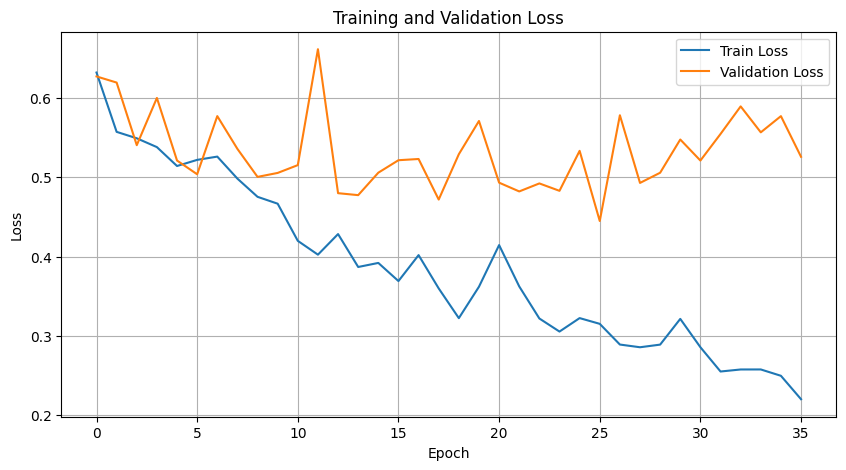

Training Accuracy: 85.3846
Training Precision Scores: [21.59151194 99.72570066]
Training Recall Scores: [94.65116279 84.9796748 ]
Training F1 Scores: [35.16198704 91.76406036]

Validation Accuracy: 84.2679
Validation Precision Scores: [15.82417582 99.00615239]
Validation Recall Scores: [77.41935484 84.52525253]
Validation F1 Scores: [26.27737226 91.19442023]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 32 and hidden dim 128


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.5210, Val Loss: 0.8151
Early stopping triggered after 36 epochs because no improvements over 10 subsequent epochs!
Epoch 36/100, Train Loss: 0.5345, Val Loss: 0.6026
The function took 71.34 seconds to execute.


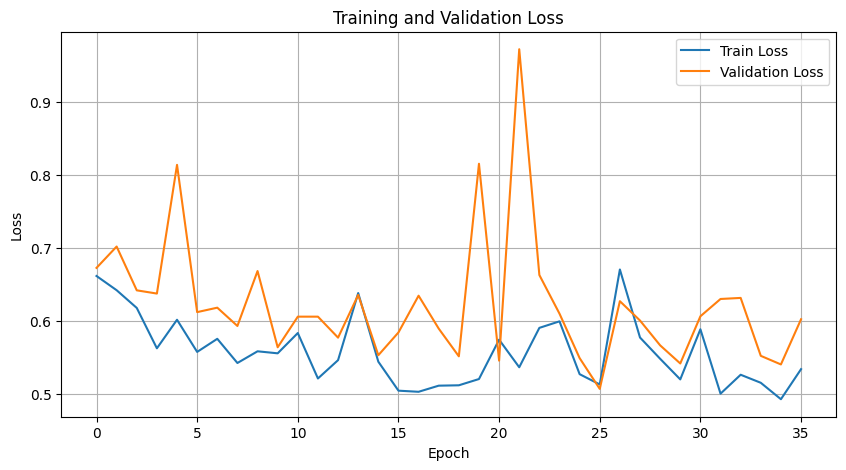

Training Accuracy: 79.4158
Training Precision Scores: [14.20068027 98.78757262]
Training Recall Scores: [77.6744186  79.49186992]
Training F1 Scores: [24.01150252 88.09550625]

Validation Accuracy: 78.8551
Validation Precision Scores: [11.86440678 98.8372093 ]
Validation Recall Scores: [75.2688172  78.98989899]
Validation F1 Scores: [20.49780381 87.8059735 ]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 32 and hidden dim 256


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.6673, Val Loss: 0.6007
Early stopping triggered after 32 epochs because no improvements over 10 subsequent epochs!
Epoch 32/100, Train Loss: 0.5245, Val Loss: 0.5575
The function took 68.49 seconds to execute.


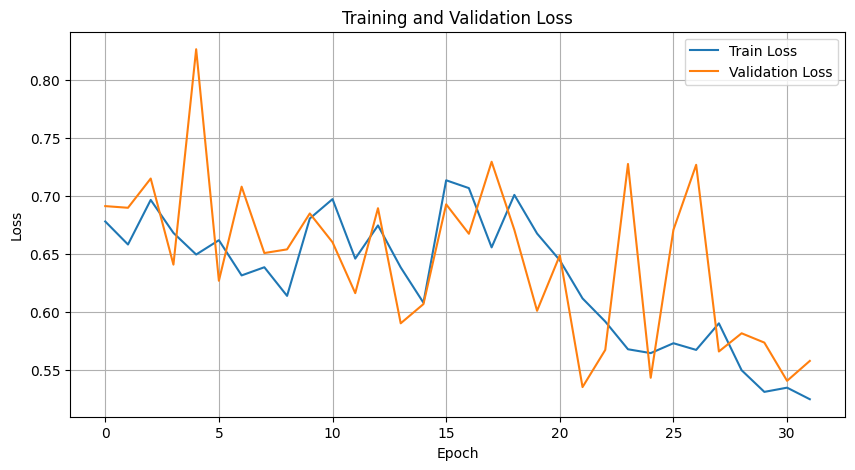

Training Accuracy: 82.4830
Training Precision Scores: [14.40457618 98.16700611]
Training Recall Scores: [64.41860465 83.27235772]
Training F1 Scores: [23.54441139 90.10831913]

Validation Accuracy: 82.7882
Validation Precision Scores: [12.79317697 98.42782277]
Validation Recall Scores: [64.51612903 83.47474747]
Validation F1 Scores: [21.35231317 90.33668561]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 32 and hidden dim 320


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.6055, Val Loss: 0.6328
Early stopping triggered after 36 epochs because no improvements over 10 subsequent epochs!
Epoch 36/100, Train Loss: 0.6901, Val Loss: 0.5833
The function took 83.43 seconds to execute.


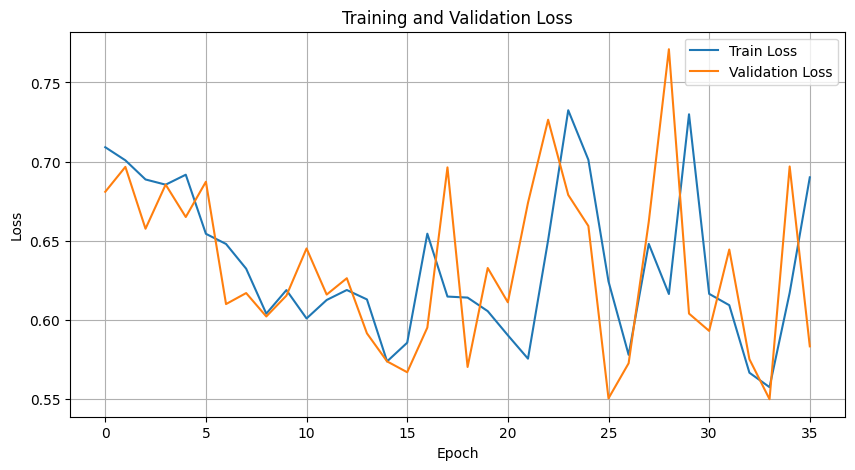

Training Accuracy: 69.7566
Training Precision Scores: [10.71638285 99.0530303 ]
Training Recall Scores: [84.88372093 69.09552846]
Training F1 Scores: [19.03023983 81.40565134]

Validation Accuracy: 68.9642
Validation Precision Scores: [ 8.58823529 98.83585565]
Validation Recall Scores: [78.49462366 68.60606061]
Validation F1 Scores: [15.48250265 80.99212974]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 32 and hidden dim 384


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.7160, Val Loss: 0.6993
Early stopping triggered after 25 epochs because no improvements over 10 subsequent epochs!
Epoch 25/100, Train Loss: 0.7216, Val Loss: 0.7196
The function took 62.64 seconds to execute.


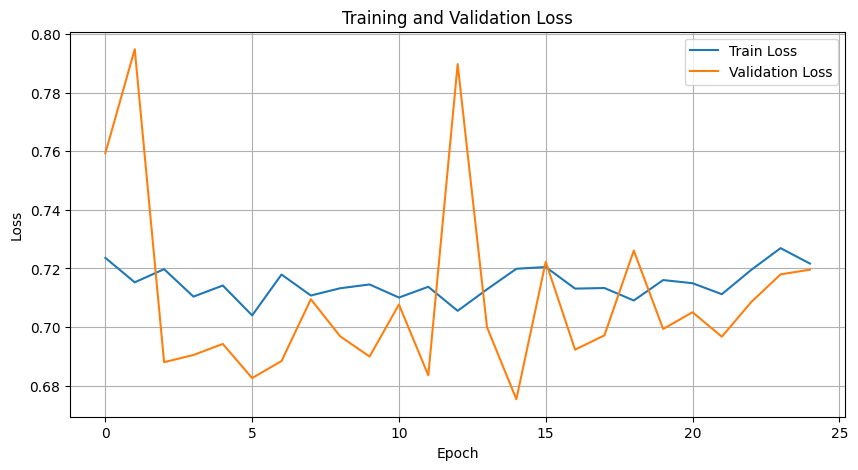

Training Accuracy: 72.3174
Training Precision Scores: [ 4.62579917 95.96636447]
Training Recall Scores: [28.60465116 74.22764228]
Training F1 Scores: [ 7.96374231 83.70866999]

Validation Accuracy: 73.9097
Validation Precision Scores: [ 4.8513302  96.78589943]
Validation Recall Scores: [33.33333333 75.43434343]
Validation F1 Scores: [ 8.46994536 84.78655767]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 32 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Early stopping triggered after 11 epochs because no improvements over 10 subsequent epochs!
Epoch 11/100, Train Loss: 0.7354, Val Loss: 0.8606
The function took 35.27 seconds to execute.


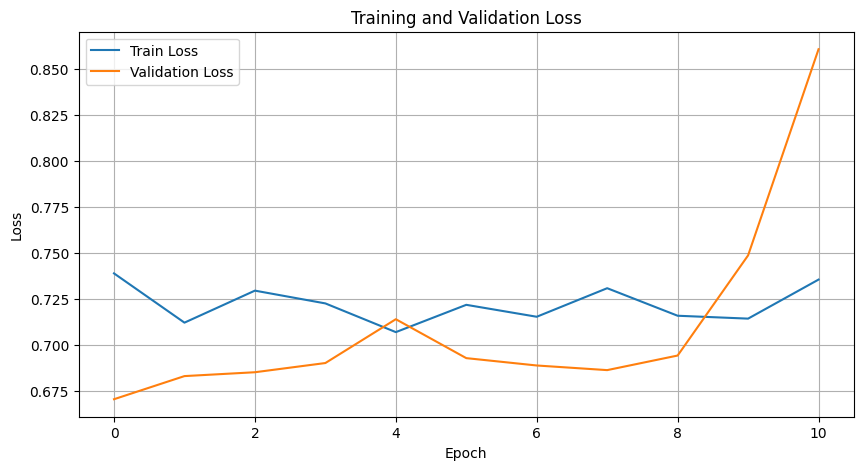

Training Accuracy: 90.6524
Training Precision Scores: [ 8.59375  96.105919]
Training Recall Scores: [12.79069767 94.05487805]
Training F1 Scores: [10.28037383 95.06933744]

Validation Accuracy: 90.6931
Validation Precision Scores: [ 8.98876404 96.77824268]
Validation Recall Scores: [17.20430108 93.45454545]
Validation F1 Scores: [11.80811808 95.08735868]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 64 and hidden dim 128


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.4163, Val Loss: 0.6459
Early stopping triggered after 37 epochs because no improvements over 10 subsequent epochs!
Epoch 37/100, Train Loss: 0.2135, Val Loss: 0.6829
The function took 73.53 seconds to execute.


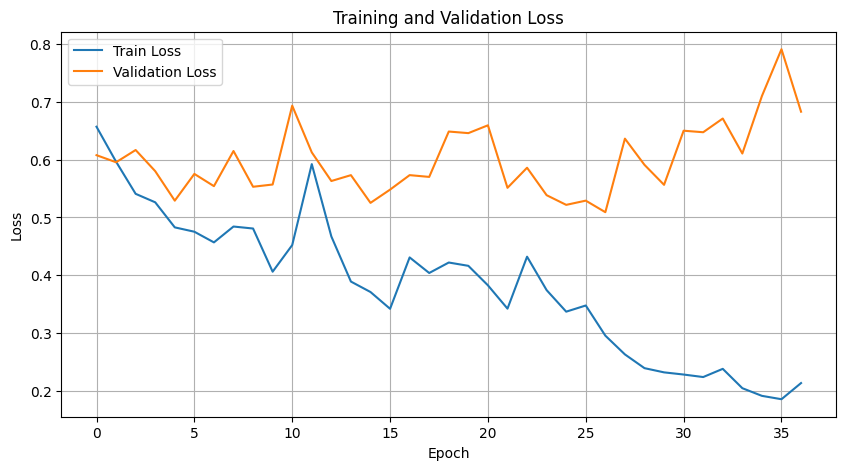

Training Accuracy: 84.4596
Training Precision Scores: [20.67404427 99.77058681]
Training Recall Scores: [95.58139535 83.97357724]
Training F1 Scores: [33.99503722 91.19302505]

Validation Accuracy: 84.1121
Validation Precision Scores: [15.38461538 98.91150024]
Validation Recall Scores: [75.2688172  84.44444444]
Validation F1 Scores: [25.54744526 91.10723627]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 64 and hidden dim 256


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Early stopping triggered after 11 epochs because no improvements over 10 subsequent epochs!
Epoch 11/100, Train Loss: 0.7137, Val Loss: 0.6826
The function took 23.84 seconds to execute.


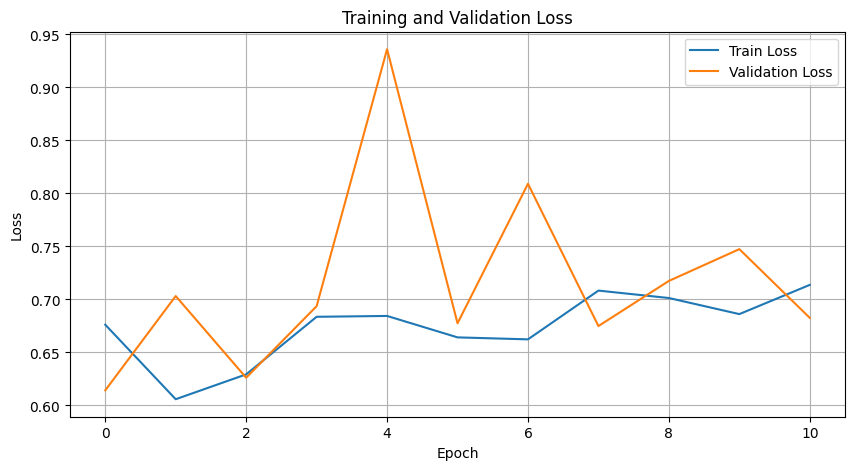

Training Accuracy: 72.0156
Training Precision Scores: [ 8.82749326 97.69926048]
Training Recall Scores: [60.93023256 72.5       ]
Training F1 Scores: [15.42083579 83.23416171]

Validation Accuracy: 72.0794
Validation Precision Scores: [ 7.02479339 97.71986971]
Validation Recall Scores: [54.83870968 72.72727273]
Validation F1 Scores: [12.45421245 83.39124392]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 64 and hidden dim 320


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Early stopping triggered after 11 epochs because no improvements over 10 subsequent epochs!
Epoch 11/100, Train Loss: 0.7111, Val Loss: 0.6905
The function took 25.70 seconds to execute.


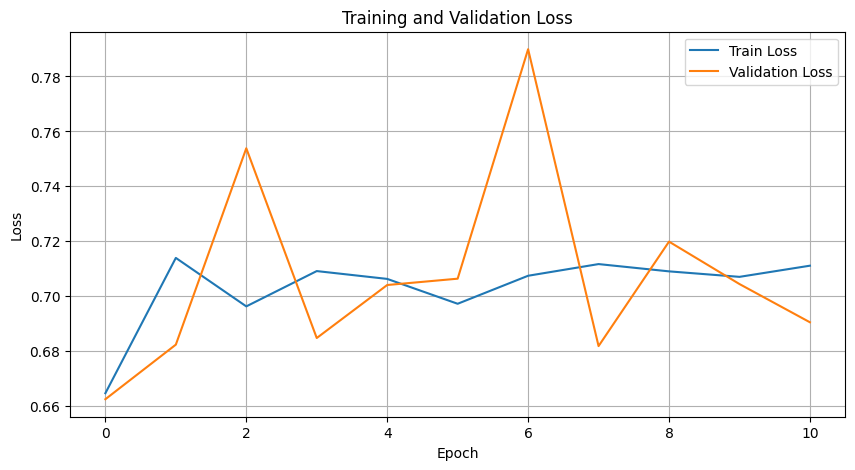

Training Accuracy: 81.2074
Training Precision Scores: [11.85147508 97.62764933]
Training Recall Scores: [54.18604651 82.38821138]
Training F1 Scores: [19.4490818  89.36287478]

Validation Accuracy: 80.4517
Validation Precision Scores: [ 9.34393638 97.77239709]
Validation Recall Scores: [50.53763441 81.57575758]
Validation F1 Scores: [15.77181208 88.94273128]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 64 and hidden dim 384


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Early stopping triggered after 16 epochs because no improvements over 10 subsequent epochs!
Epoch 16/100, Train Loss: 0.6881, Val Loss: 0.6850
The function took 40.26 seconds to execute.


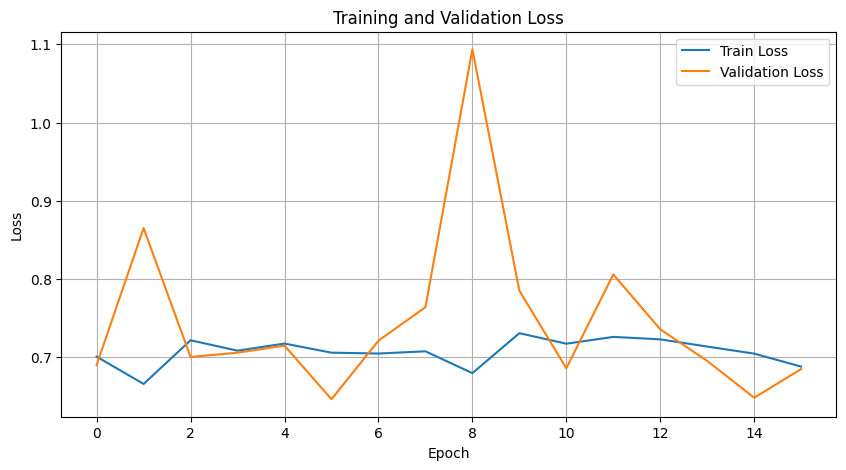

Training Accuracy: 73.7001
Training Precision Scores: [ 9.46090682 97.79086892]
Training Recall Scores: [61.62790698 74.22764228]
Training F1 Scores: [16.40359022 84.39540124]

Validation Accuracy: 72.0405
Validation Precision Scores: [ 6.04781997 97.30748519]
Validation Recall Scores: [46.23655914 73.01010101]
Validation F1 Scores: [10.69651741 83.42566944]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 64 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.7126, Val Loss: 0.7020
Early stopping triggered after 23 epochs because no improvements over 10 subsequent epochs!
Epoch 23/100, Train Loss: 0.7401, Val Loss: 0.7429
The function took 73.86 seconds to execute.


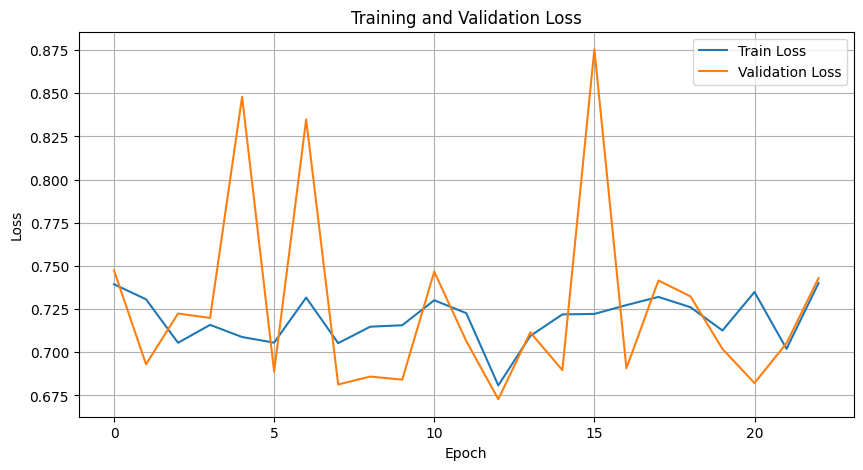

Training Accuracy: 50.9640
Training Precision Scores: [ 4.05027933 95.68276911]
Training Recall Scores: [47.20930233 51.12804878]
Training F1 Scores: [ 7.46049247 66.64458869]

Validation Accuracy: 53.9330
Validation Precision Scores: [ 4.50751252 97.15328467]
Validation Recall Scores: [58.06451613 53.77777778]
Validation F1 Scores: [ 8.36560806 69.23276983]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 128 and hidden dim 256


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Early stopping triggered after 13 epochs because no improvements over 10 subsequent epochs!
Epoch 13/100, Train Loss: 0.6749, Val Loss: 0.7803
The function took 28.68 seconds to execute.


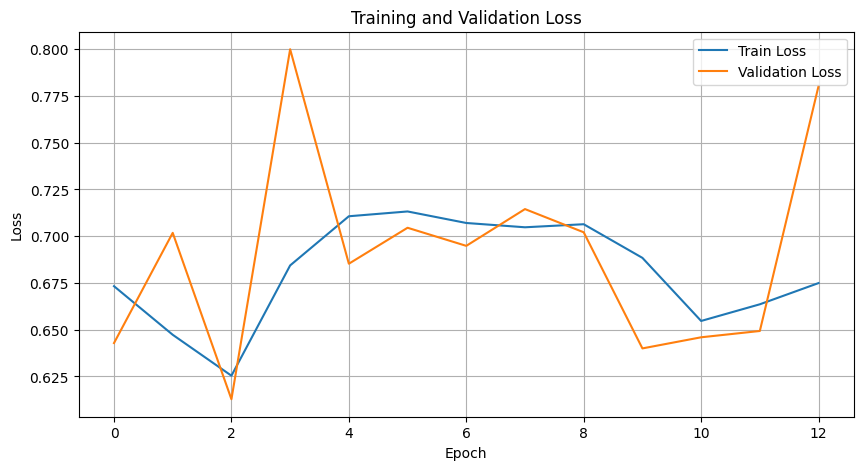

Training Accuracy: 63.9533
Training Precision Scores: [ 8.58227848 98.56012658]
Training Recall Scores: [78.8372093  63.30284553]
Training F1 Scores: [15.47945205 77.09158416]

Validation Accuracy: 63.3178
Validation Precision Scores: [ 6.9035533  98.42072015]
Validation Recall Scores: [73.11827957 62.94949495]
Validation F1 Scores: [12.61595547 76.78659438]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 128 and hidden dim 320


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.5542, Val Loss: 0.5667
Early stopping triggered after 38 epochs because no improvements over 10 subsequent epochs!
Epoch 38/100, Train Loss: 0.6309, Val Loss: 0.5530
The function took 90.81 seconds to execute.


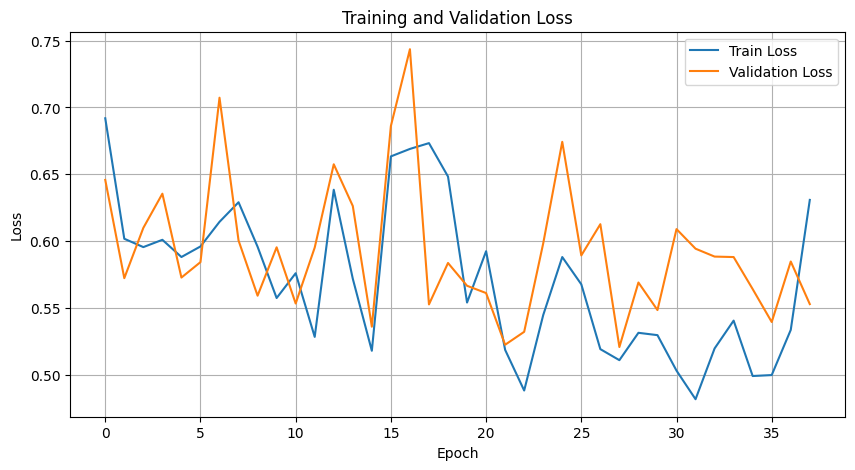

Training Accuracy: 75.0438
Training Precision Scores: [12.48680971 98.990171  ]
Training Recall Scores: [82.55813953 74.71544715]
Training F1 Scores: [21.69263672 85.15665721]

Validation Accuracy: 74.7664
Validation Precision Scores: [10.41369472 98.92876272]
Validation Recall Scores: [78.49462366 74.62626263]
Validation F1 Scores: [18.38790932 85.07600184]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 128 and hidden dim 384


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Early stopping triggered after 17 epochs because no improvements over 10 subsequent epochs!
Epoch 17/100, Train Loss: 0.7153, Val Loss: 0.7114
The function took 43.92 seconds to execute.


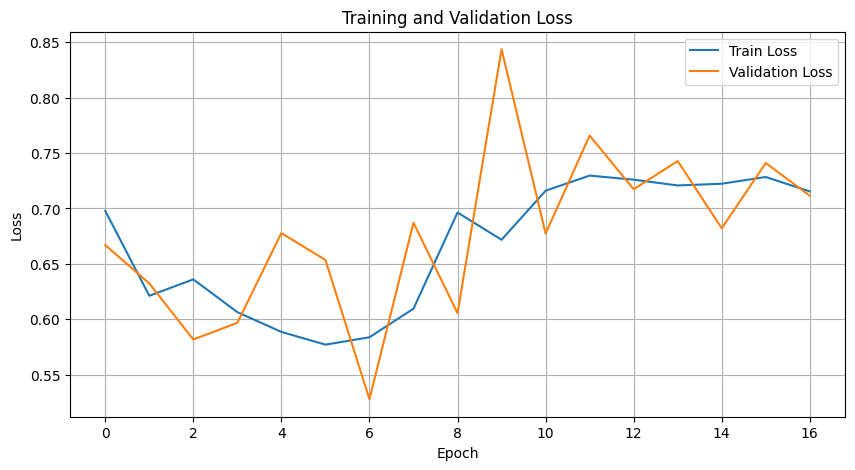

Training Accuracy: 76.6115
Training Precision Scores: [11.78294574 98.36150845]
Training Recall Scores: [70.69767442 76.8699187 ]
Training F1 Scores: [20.19933555 86.29777524]

Validation Accuracy: 76.5576
Validation Precision Scores: [10.17214397 98.54847071]
Validation Recall Scores: [69.89247312 76.80808081]
Validation F1 Scores: [17.75956284 86.33060854]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 128 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.6072, Val Loss: 0.7096
Early stopping triggered after 33 epochs because no improvements over 10 subsequent epochs!
Epoch 33/100, Train Loss: 0.5586, Val Loss: 0.5679
The function took 108.42 seconds to execute.


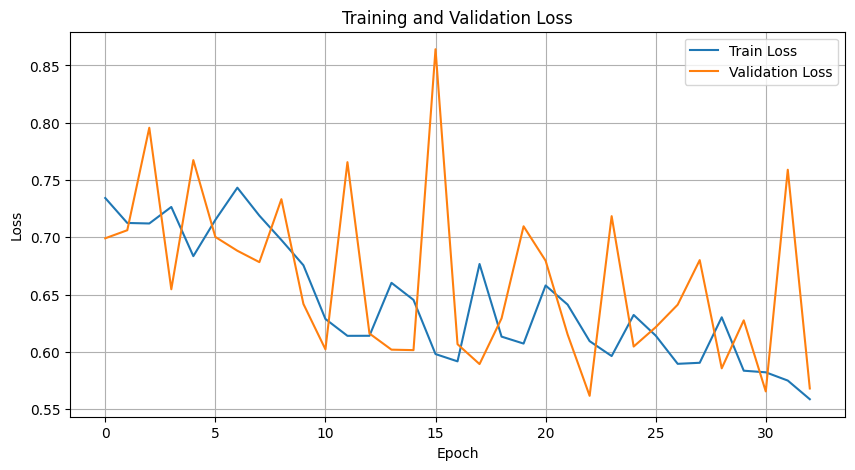

Training Accuracy: 79.3476
Training Precision Scores: [13.03017053 98.34648628]
Training Recall Scores: [69.30232558 79.78658537]
Training F1 Scores: [21.93595878 88.09964652]

Validation Accuracy: 78.3879
Validation Precision Scores: [10.17241379 98.28973843]
Validation Recall Scores: [63.44086022 78.94949495]
Validation F1 Scores: [17.53343239 87.56441855]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 256 and hidden dim 320


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Early stopping triggered after 17 epochs because no improvements over 10 subsequent epochs!
Epoch 17/100, Train Loss: 0.4967, Val Loss: 0.6197
The function took 42.07 seconds to execute.


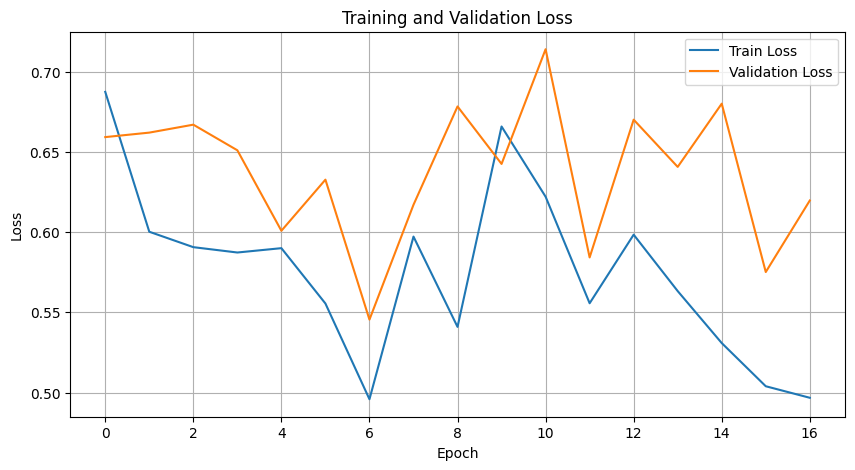

Training Accuracy: 77.8092
Training Precision Scores: [13.61668634 98.91318411]
Training Recall Scores: [80.46511628 77.69308943]
Training F1 Scores: [23.29182094 87.02828846]

Validation Accuracy: 76.5966
Validation Precision Scores: [ 9.93690852 98.44881075]
Validation Recall Scores: [67.74193548 76.92929293]
Validation F1 Scores: [17.33149931 86.36879111]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 256 and hidden dim 384


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.5122, Val Loss: 0.6077
Early stopping triggered after 22 epochs because no improvements over 10 subsequent epochs!
Epoch 22/100, Train Loss: 0.4596, Val Loss: 0.6380
The function took 59.01 seconds to execute.


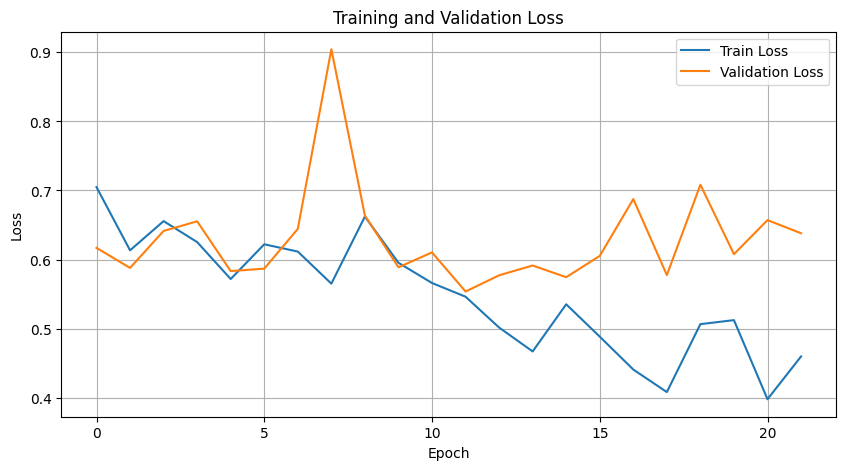

Training Accuracy: 77.7020
Training Precision Scores: [12.71050521 98.5468107 ]
Training Recall Scores: [73.72093023 77.87601626]
Training F1 Scores: [21.68262654 87.00045413]

Validation Accuracy: 76.8692
Validation Precision Scores: [10.04784689 98.45440495]
Validation Recall Scores: [67.74193548 77.21212121]
Validation F1 Scores: [17.5        86.54891304]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 256 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.5964, Val Loss: 0.7276
Early stopping triggered after 34 epochs because no improvements over 10 subsequent epochs!
Epoch 34/100, Train Loss: 0.5583, Val Loss: 0.5655
The function took 114.57 seconds to execute.


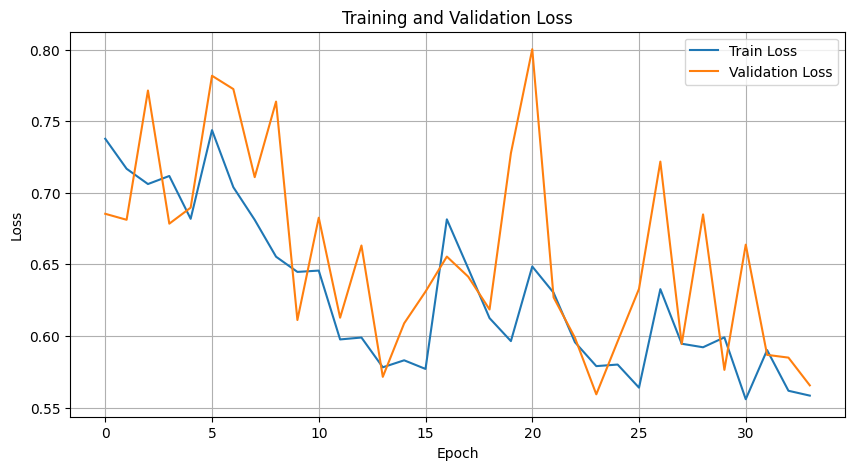

Training Accuracy: 75.5794
Training Precision Scores: [11.48999259 98.41521395]
Training Recall Scores: [72.09302326 75.73170732]
Training F1 Scores: [19.82097187 85.59614059]

Validation Accuracy: 73.3645
Validation Precision Scores: [ 8.55539972 98.27493261]
Validation Recall Scores: [65.59139785 73.65656566]
Validation F1 Scores: [15.13647643 84.20323326]



In [20]:
train_dataset = TimeSeriesDataset(X_train, y_train)
val_dataset = TimeSeriesDataset(X_val, y_val)
test_dataset = TimeSeriesDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=64, collate_fn=collate_fn,shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=64, collate_fn=collate_fn, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=64, collate_fn=collate_fn, shuffle=False)

embedding_sizes = [4,8,16,32,64,128,256]
hidden_dims = [8,16,32,64,128,256,320,384,512]

for i in range(len(embedding_sizes)):
    for j in range(i,len(hidden_dims)):
        embedding_size=embedding_sizes[i]
        hidden_dim=hidden_dims[j]
        print("-------------------------------------------------------------------------")
        print("-------------------------------------------------------------------------")
        print("-------------------------------------------------------------------------")
        print(f"Trying with embedding size {embedding_size} and hidden dim {hidden_dim}")

        vocabulary_size = len(vectorizer.vocabulary_) + 2  # Add 2 for out-of-vocabulary and padding
        output_size = 2
        
        model = MonoDirectionalRNN(vocabulary_size, embedding_size, hidden_dim, output_size)
        model = model.to(device)
        
        class_weight = compute_class_weight(class_weight='balanced', classes=np.unique(y_train), y=y_train)  # Computing class weights
        class_weight_tensor = torch.tensor(class_weight, dtype=torch.float32).to(device)  # Converting to PyTorch tensor
        criterion = nn.CrossEntropyLoss(weight=class_weight_tensor)
        
        optimizer = optim.AdamW(model.parameters(), lr=0.001, weight_decay=0.01)
        num_epochs = 100
        training_loop(model, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, criterion, num_epochs)
        
        train_accuracy, train_precisionscores, train_recallscores, train_f1scores, _, _ = testing_model(model,train_loader,device)
        val_accuracy, val_precisionscores, val_recallscores, val_f1scores, _, _ = testing_model(model,val_loader,device)
        
        stats(train_accuracy, train_precisionscores, train_recallscores, train_f1scores, 'Training')
        stats(val_accuracy, val_precisionscores, val_recallscores, val_f1scores, 'Validation')

Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.3642, Val Loss: 0.5233
Early stopping triggered after 25 epochs because no improvements over 10 subsequent epochs!
Epoch 25/100, Train Loss: 0.4786, Val Loss: 0.6104
The function took 45.15 seconds to execute.


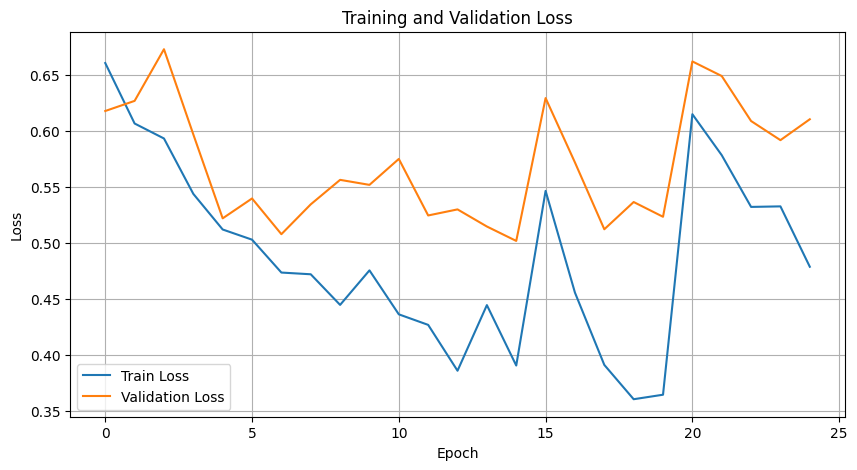

Test Accuracy: 81.6029
Test Precision Scores: [12.61872456 98.9106383 ]
Test Recall Scores: [74.4        81.85659952]
Test F1 Scores: [21.57772622 89.57915832]



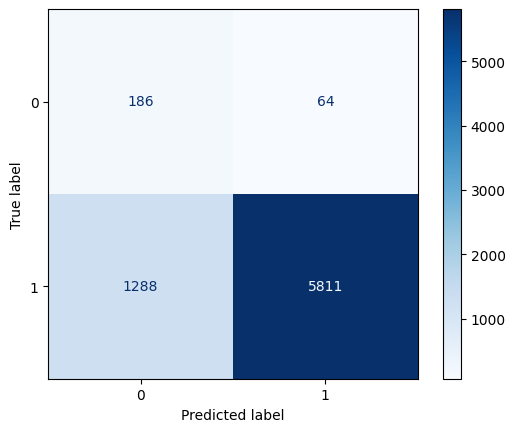

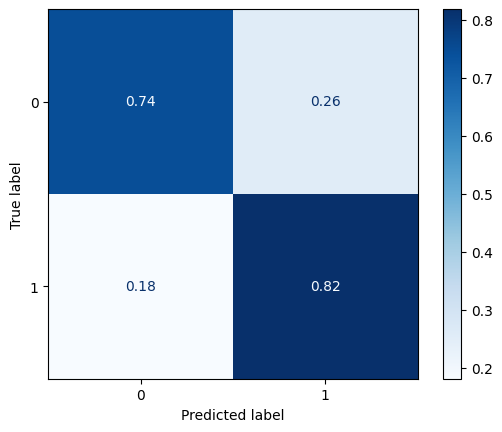

In [21]:
# mettere e istanziare model con iperparam migliori Trying with embedding size 32 and hidden dim 64

train_dataset = TimeSeriesDataset(X_train, y_train)
val_dataset = TimeSeriesDataset(X_val, y_val)
test_dataset = TimeSeriesDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=64, collate_fn=collate_fn,shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=64, collate_fn=collate_fn, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=64, collate_fn=collate_fn, shuffle=False)

embedding_size=32
hidden_dim=64

vocabulary_size = len(vectorizer.vocabulary_) + 2  # Add 2 for out-of-vocabulary and padding
output_size = 2

model = MonoDirectionalRNN(vocabulary_size, embedding_size, hidden_dim, output_size)
model = model.to(device)

class_weight = compute_class_weight(class_weight='balanced', classes=np.unique(y_train), y=y_train)  # Computing class weights
class_weight_tensor = torch.tensor(class_weight, dtype=torch.float32).to(device)  # Converting to PyTorch tensor
criterion = nn.CrossEntropyLoss(weight=class_weight_tensor)

optimizer = optim.AdamW(model.parameters(), lr=0.001, weight_decay=0.01)
num_epochs = 100
training_loop(model, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, criterion, num_epochs)

test_accuracy, test_precisionscores, test_recallscores, test_f1scores, all_labels_test, all_predictions_test = testing_model(model,test_loader,device)
stats(test_accuracy, test_precisionscores, test_recallscores, test_f1scores, 'Test')
ConfusionMatrixDisplay.from_predictions(all_labels_test, all_predictions_test, cmap='Blues')
ConfusionMatrixDisplay.from_predictions(all_labels_test, all_predictions_test, normalize='true', cmap='Blues')

## Bidirectional

In [14]:
class BiDirectionalRNN(nn.Module):
    def __init__(self, vocab_size, embed_size, hid_size, out_size):
        super(BiDirectionalRNN, self).__init__()

        # 1) embedding layer: vocab_size × d
        self.embedding = nn.Embedding(vocab_size, embed_size, padding_idx=max(vectorizer.vocabulary_.values()) + 1)

        self.hidden_layer_size = hid_size

        # 2) first liner layer: (seq_len·d) → H
        #batch first is used to specify that the matrix in input has dimension: (batch_size, sequence_length, input_size)
        self.rnn = nn.RNN(input_size=embed_size, hidden_size=hid_size, batch_first=True, num_layers=2, dropout=0.5, bidirectional=True)

        # 3) second linear layer: H → 2
        self.linear = nn.Linear(hid_size * 2, out_size)

    """
    Args:
        - input_seq: The input sequence tensor of shape
         (batch_size, sequence_length, input_size).
     Output of rnn:
         - **rnn_out** contains the output for all time steps.
           It has shape (batch_size, sequence_length, hidden_size).
         - **h** contains the hidden states for all layers at the last time step.
            It has shape (num_layers, batch_size, hidden_size).
         - if different time-series have different sequence_length, rnn_out can generate errors
         - with h we get batch_size instead of sequence_length
           ==> no problem with different sequence_length

         - We do not return them in the tracking loop to
             - avoid problems with the gradient vanish/exploding
             - use the windows independently (if possible) and shuffle the data
        Returns:
         - predictions: The predicted pollution levels for the input sequence.
         Use h from last hidden node helps with time-series having different lengths
    """
    def forward(self, x: torch.LongTensor, lengths):
        # x è B,seq_len

        # embedding lookup → (B, seq_len, d) # certo, perchè se prima avevo per ogni parola d dim, se qui ho 100 parole avrò 100xd dimensioni
        x = self.embedding(x.long())
        x = pack_padded_sequence(x, lengths.cpu(), batch_first=True, enforce_sorted=True)

        rnn_out, h = self.rnn(x)

        # Concatenate the final forward and backward hidden states
        # hidden[-2] contains the last forward hidden state, hidden[-1] contains the last backward hidden state
        hidden_cat = torch.cat((h[-2], h[-1]), dim=1)

        predictions = self.linear(hidden_cat)
        return predictions

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 4 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.4269, Val Loss: 0.4019
Epoch 40/100, Train Loss: 0.3609, Val Loss: 0.3569
Epoch 60/100, Train Loss: 0.3292, Val Loss: 0.3293
Early stopping triggered after 63 epochs because no improvements over 10 subsequent epochs!
Epoch 63/100, Train Loss: 0.3368, Val Loss: 0.3344
The function took 162.66 seconds to execute.


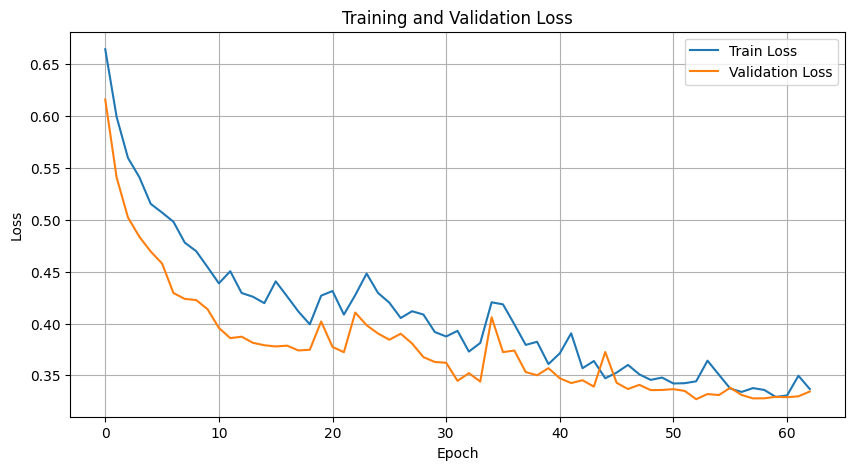

Training Accuracy: 87.9163
Training Precision Scores: [23.40983607 99.16523728]
Training Recall Scores: [83.02325581 88.1300813 ]
Training F1 Scores: [36.52173913 93.32257197]

Validation Accuracy: 87.7336
Validation Precision Scores: [20.4787234  99.27007299]
Validation Recall Scores: [82.79569892 87.91919192]
Validation F1 Scores: [32.8358209  93.25048211]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 4 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.3817, Val Loss: 0.3548
Epoch 40/100, Train Loss: 0.3131, Val Loss: 0.3166
Early stopping triggered after 46 epochs because no improvements over 10 subsequent epochs!
Epoch 46/100, Train Loss: 0.3250, Val Loss: 0.3235
The function took 119.46 seconds to execute.


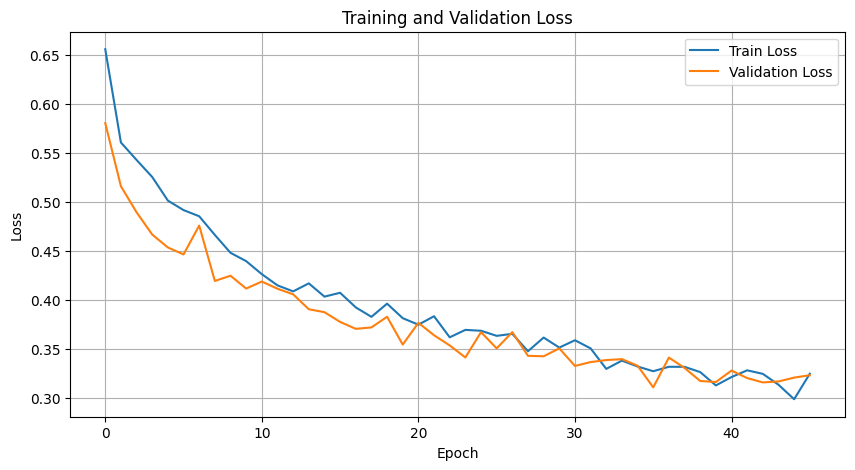

Training Accuracy: 86.0078
Training Precision Scores: [21.37578169 99.36552697]
Training Recall Scores: [87.44186047 85.94512195]
Training F1 Scores: [34.35358611 92.16936407]

Validation Accuracy: 86.0592
Validation Precision Scores: [18.67612293 99.34731935]
Validation Recall Scores: [84.94623656 86.1010101 ]
Validation F1 Scores: [30.62015504 92.25108225]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 4 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.3734, Val Loss: 0.3976
Early stopping triggered after 38 epochs because no improvements over 10 subsequent epochs!
Epoch 38/100, Train Loss: 0.2724, Val Loss: 0.3335
The function took 98.71 seconds to execute.


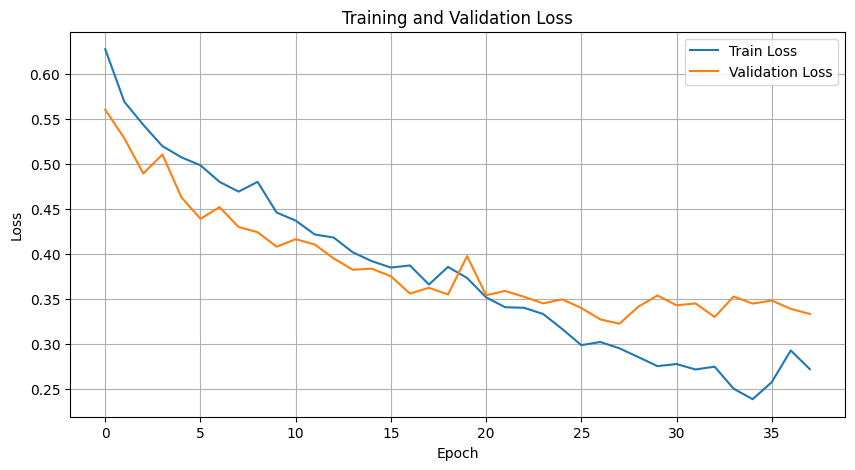

Training Accuracy: 87.3028
Training Precision Scores: [23.83233533 99.62790698]
Training Recall Scores: [92.55813953 87.07317073]
Training F1 Scores: [37.9047619  92.92841649]

Validation Accuracy: 86.9159
Validation Precision Scores: [18.9258312  99.12723932]
Validation Recall Scores: [79.56989247 87.19191919]
Validation F1 Scores: [30.5785124  92.77730009]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 4 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.3720, Val Loss: 0.3803
Early stopping triggered after 27 epochs because no improvements over 10 subsequent epochs!
Epoch 27/100, Train Loss: 0.3863, Val Loss: 0.3883
The function took 70.48 seconds to execute.


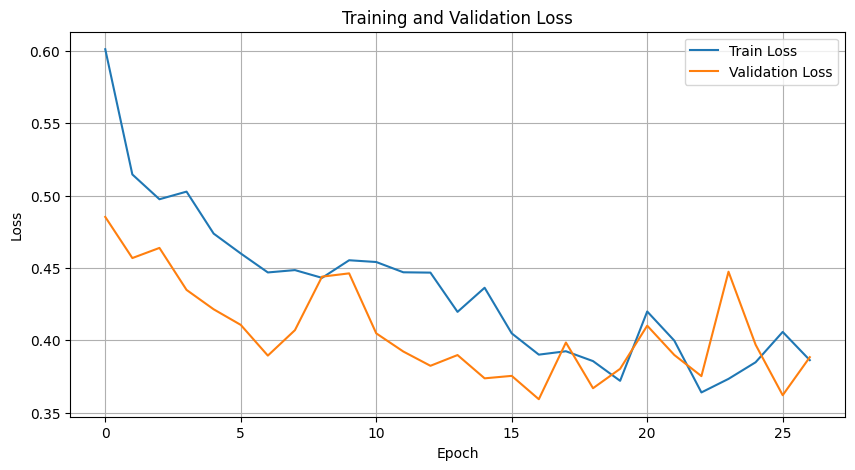

Training Accuracy: 92.5998
Training Precision Scores: [31.20728929 98.33901193]
Training Recall Scores: [63.72093023 93.86178862]
Training F1 Scores: [41.89602446 96.04825291]

Validation Accuracy: 93.5358
Validation Precision Scores: [32.7014218  98.98175647]
Validation Recall Scores: [74.19354839 94.26262626]
Validation F1 Scores: [45.39473684 96.56456954]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 4 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.4983, Val Loss: 0.4490
Epoch 40/100, Train Loss: 0.4622, Val Loss: 0.4087
Early stopping triggered after 44 epochs because no improvements over 10 subsequent epochs!
Epoch 44/100, Train Loss: 0.4802, Val Loss: 0.4559
The function took 131.50 seconds to execute.


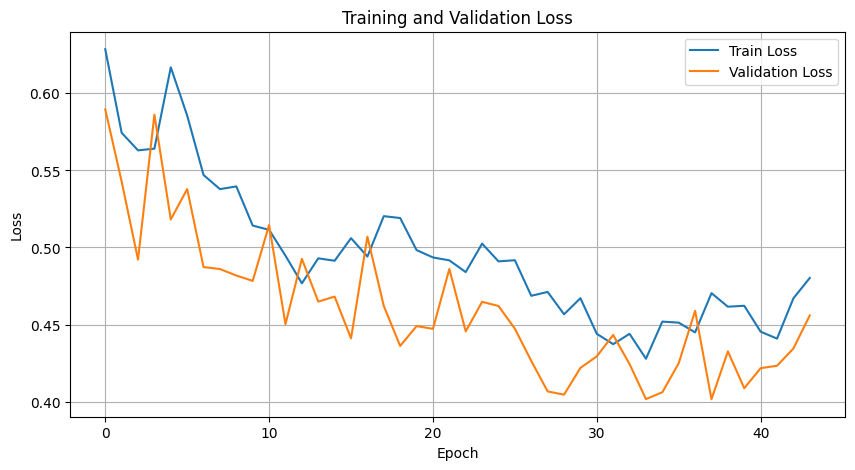

Training Accuracy: 86.6212
Training Precision Scores: [19.46959897 98.5213205 ]
Training Recall Scores: [70.         87.34756098]
Training F1 Scores: [30.46558704 92.59857789]

Validation Accuracy: 86.2150
Validation Precision Scores: [16.45244216 98.66911427]
Validation Recall Scores: [68.8172043  86.86868687]
Validation F1 Scores: [26.5560166  92.39363988]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 4 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.5455, Val Loss: 0.4950
Epoch 40/100, Train Loss: 0.5364, Val Loss: 0.4822
Early stopping triggered after 52 epochs because no improvements over 10 subsequent epochs!
Epoch 52/100, Train Loss: 0.5328, Val Loss: 0.5277
The function took 186.26 seconds to execute.


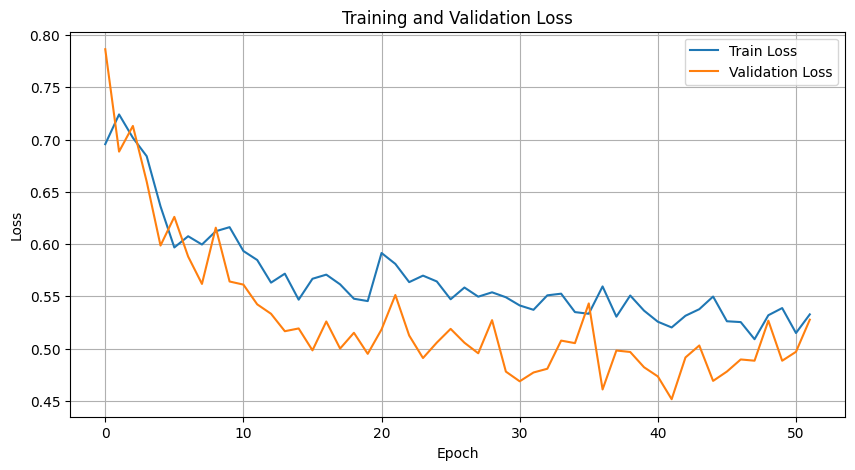

Training Accuracy: 82.2687
Training Precision Scores: [14.49719245 98.24329202]
Training Recall Scores: [66.04651163 82.97764228]
Training F1 Scores: [23.77563834 89.9674949 ]

Validation Accuracy: 81.9315
Validation Precision Scores: [13.12127237 98.69249395]
Validation Recall Scores: [70.96774194 82.34343434]
Validation F1 Scores: [22.14765101 89.77973568]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 4 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.5533, Val Loss: 0.5672
Early stopping triggered after 29 epochs because no improvements over 10 subsequent epochs!
Epoch 29/100, Train Loss: 0.5101, Val Loss: 0.4901
The function took 113.91 seconds to execute.


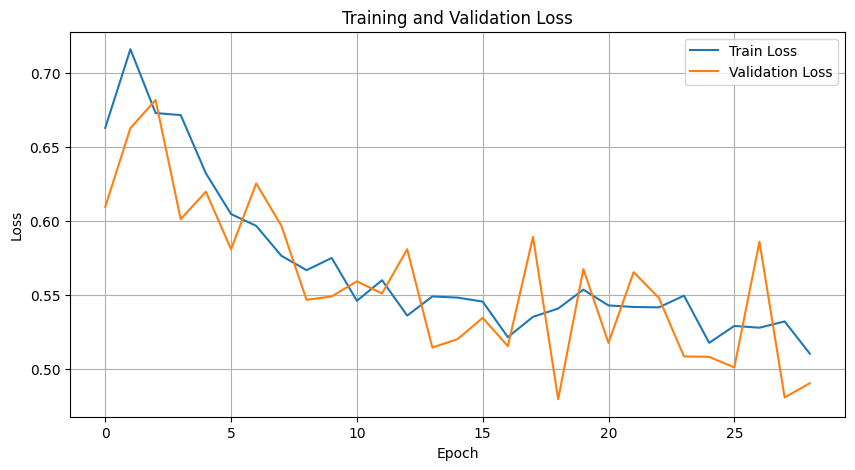

Training Accuracy: 79.9416
Training Precision Scores: [12.44239631 98.02469136]
Training Recall Scores: [62.79069767 80.69105691]
Training F1 Scores: [20.76923077 88.51727982]

Validation Accuracy: 80.3349
Validation Precision Scores: [11.99261993 98.61796644]
Validation Recall Scores: [69.89247312 80.72727273]
Validation F1 Scores: [20.47244094 88.78027105]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 4 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.6289, Val Loss: 0.6024
Early stopping triggered after 34 epochs because no improvements over 10 subsequent epochs!
Epoch 34/100, Train Loss: 0.5164, Val Loss: 0.4968
The function took 147.34 seconds to execute.


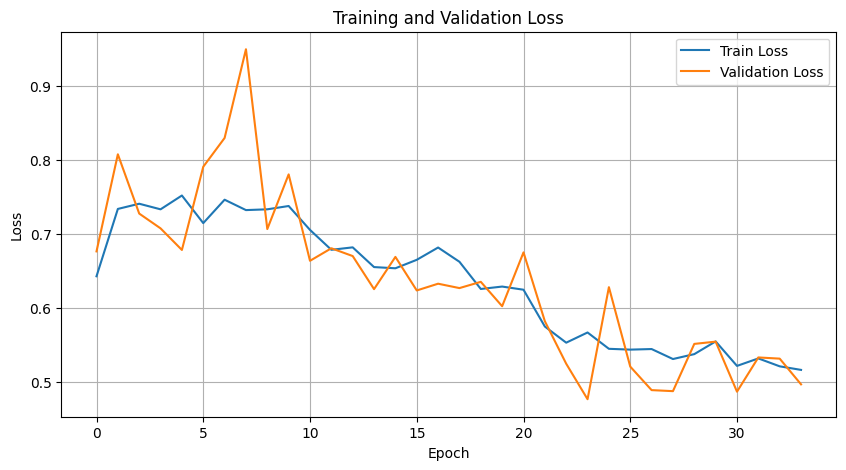

Training Accuracy: 80.6816
Training Precision Scores: [13.         98.07833537]
Training Recall Scores: [63.48837209 81.43292683]
Training F1 Scores: [21.58102767 88.98389783]

Validation Accuracy: 80.5685
Validation Precision Scores: [11.98501873 98.57423795]
Validation Recall Scores: [68.8172043  81.01010101]
Validation F1 Scores: [20.41467305 88.93324462]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 4 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.5504, Val Loss: 0.4642
Early stopping triggered after 37 epochs because no improvements over 10 subsequent epochs!
Epoch 37/100, Train Loss: 0.5703, Val Loss: 0.4478
The function took 227.91 seconds to execute.


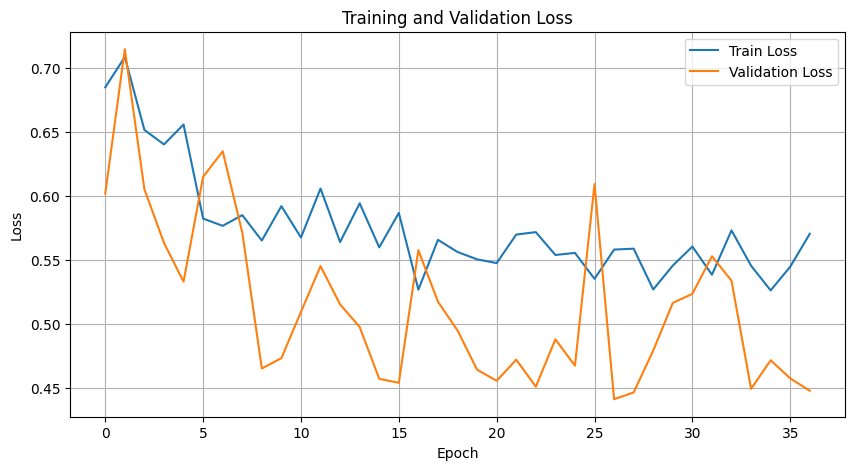

Training Accuracy: 86.7089
Training Precision Scores: [17.55725191 97.99524295]
Training Recall Scores: [58.8372093  87.92682927]
Training F1 Scores: [27.0443613  92.68841395]

Validation Accuracy: 85.9034
Validation Precision Scores: [14.88250653 98.35240275]
Validation Recall Scores: [61.29032258 86.82828283]
Validation F1 Scores: [23.94957983 92.23175966]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 8 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.3687, Val Loss: 0.3807
Epoch 40/100, Train Loss: 0.2608, Val Loss: 0.3019
Early stopping triggered after 55 epochs because no improvements over 10 subsequent epochs!
Epoch 55/100, Train Loss: 0.2327, Val Loss: 0.3513
The function took 141.09 seconds to execute.


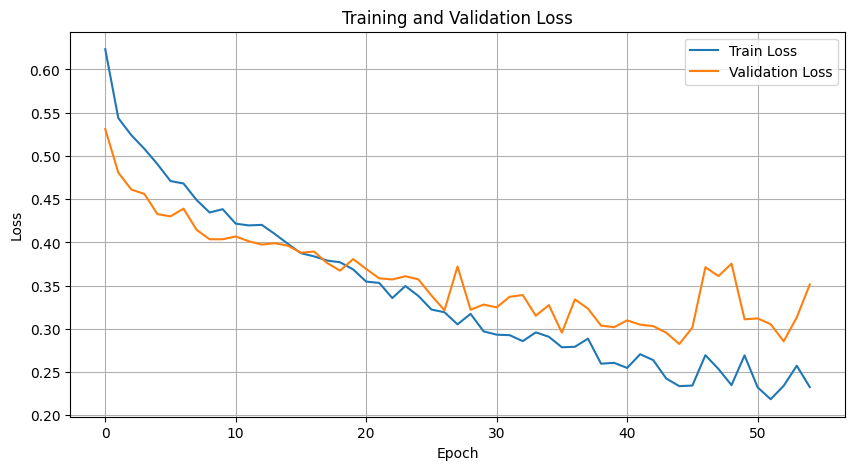

Training Accuracy: 92.8530
Training Precision Scores: [36.15664845 99.64020933]
Training Recall Scores: [92.3255814  92.87601626]
Training F1 Scores: [51.96335079 96.13928045]

Validation Accuracy: 92.0950
Validation Precision Scores: [29.16666667 99.30555556]
Validation Recall Scores: [82.79569892 92.44444444]
Validation F1 Scores: [43.1372549  95.75224942]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 8 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.2930, Val Loss: 0.3499
Early stopping triggered after 34 epochs because no improvements over 10 subsequent epochs!
Epoch 34/100, Train Loss: 0.2475, Val Loss: 0.3510
The function took 87.09 seconds to execute.


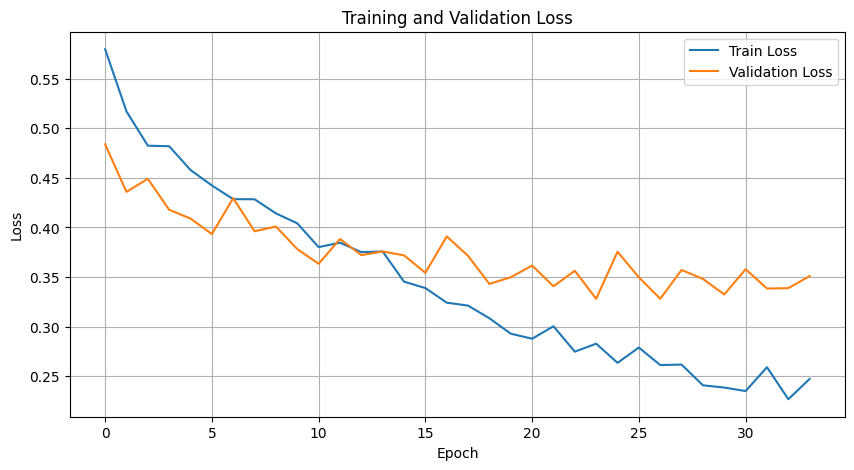

Training Accuracy: 88.2960
Training Precision Scores: [25.22464698 99.57529844]
Training Recall Scores: [91.39534884 88.16056911]
Training F1 Scores: [39.53722334 93.52091419]

Validation Accuracy: 87.8505
Validation Precision Scores: [20.4851752  99.22621757]
Validation Recall Scores: [81.72043011 88.08080808]
Validation F1 Scores: [32.75862069 93.32191781]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 8 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.3650, Val Loss: 0.4621
Epoch 40/100, Train Loss: 0.2754, Val Loss: 0.3950
Early stopping triggered after 42 epochs because no improvements over 10 subsequent epochs!
Epoch 42/100, Train Loss: 0.2623, Val Loss: 0.3861
The function took 107.70 seconds to execute.


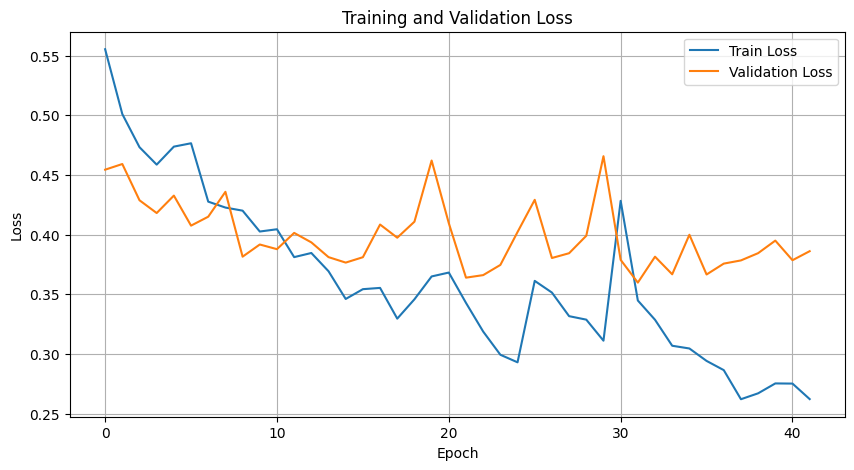

Training Accuracy: 87.1373
Training Precision Scores: [22.61831592 99.28265649]
Training Recall Scores: [85.58139535 87.20528455]
Training F1 Scores: [35.78026252 92.85289185]

Validation Accuracy: 86.8380
Validation Precision Scores: [18.98734177 99.17165209]
Validation Recall Scores: [80.64516129 87.07070707]
Validation F1 Scores: [30.73770492 92.72805508]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 8 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.4698, Val Loss: 0.4499
Early stopping triggered after 24 epochs because no improvements over 10 subsequent epochs!
Epoch 24/100, Train Loss: 0.4268, Val Loss: 0.4094
The function took 71.60 seconds to execute.


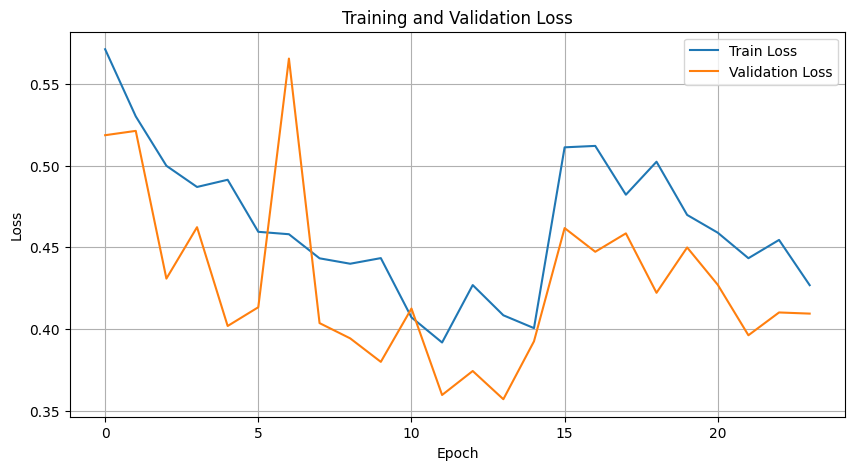

Training Accuracy: 84.8880
Training Precision Scores: [19.0397351  98.99503429]
Training Recall Scores: [80.23255814 85.09146341]
Training F1 Scores: [30.77609277 91.51819871]

Validation Accuracy: 84.7352
Validation Precision Scores: [16.40449438 99.05793688]
Validation Recall Scores: [78.49462366 84.96969697]
Validation F1 Scores: [27.13754647 91.47455415]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 8 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.5004, Val Loss: 0.4955
Early stopping triggered after 21 epochs because no improvements over 10 subsequent epochs!
Epoch 21/100, Train Loss: 0.5102, Val Loss: 0.4821
The function took 75.29 seconds to execute.


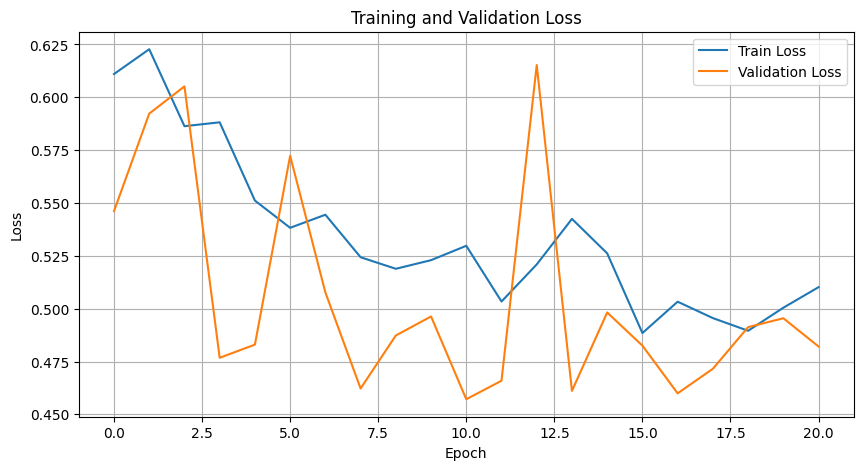

Training Accuracy: 81.3145
Training Precision Scores: [14.5644931  98.48206635]
Training Recall Scores: [71.1627907  81.75813008]
Training F1 Scores: [24.18016594 89.34421678]

Validation Accuracy: 81.8925
Validation Precision Scores: [14.23076923 99.07226562]
Validation Recall Scores: [79.56989247 81.97979798]
Validation F1 Scores: [24.14355628 89.71921291]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 8 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.5312, Val Loss: 0.4531
Early stopping triggered after 30 epochs because no improvements over 10 subsequent epochs!
Epoch 30/100, Train Loss: 0.5243, Val Loss: 0.5038
The function took 117.84 seconds to execute.


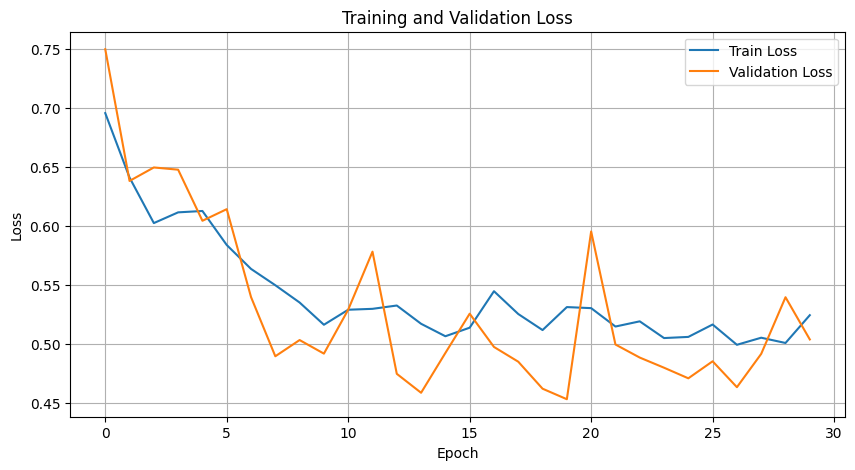

Training Accuracy: 82.9017
Training Precision Scores: [14.31646932 98.05040418]
Training Recall Scores: [61.86046512 83.82113821]
Training F1 Scores: [23.25174825 90.37913653]

Validation Accuracy: 82.7103
Validation Precision Scores: [13.3611691  98.61177597]
Validation Recall Scores: [68.8172043  83.23232323]
Validation F1 Scores: [22.37762238 90.2716915 ]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 8 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.5500, Val Loss: 0.4582
Epoch 40/100, Train Loss: 0.5256, Val Loss: 0.4514
Early stopping triggered after 45 epochs because no improvements over 10 subsequent epochs!
Epoch 45/100, Train Loss: 0.4806, Val Loss: 0.4778
The function took 194.97 seconds to execute.


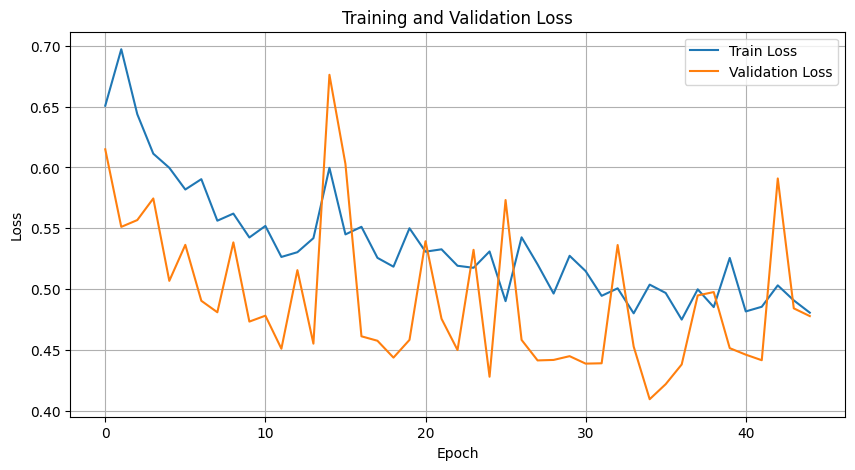

Training Accuracy: 86.7575
Training Precision Scores: [18.01925722 98.09437387]
Training Recall Scores: [60.93023256 87.88617886]
Training F1 Scores: [27.81316348 92.71012007]

Validation Accuracy: 87.1885
Validation Precision Scores: [17.93478261 98.77272727]
Validation Recall Scores: [70.96774194 87.7979798 ]
Validation F1 Scores: [28.63340564 92.96256684]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 8 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.5956, Val Loss: 0.6739
Early stopping triggered after 38 epochs because no improvements over 10 subsequent epochs!
Epoch 38/100, Train Loss: 0.5701, Val Loss: 0.5091
The function took 235.43 seconds to execute.


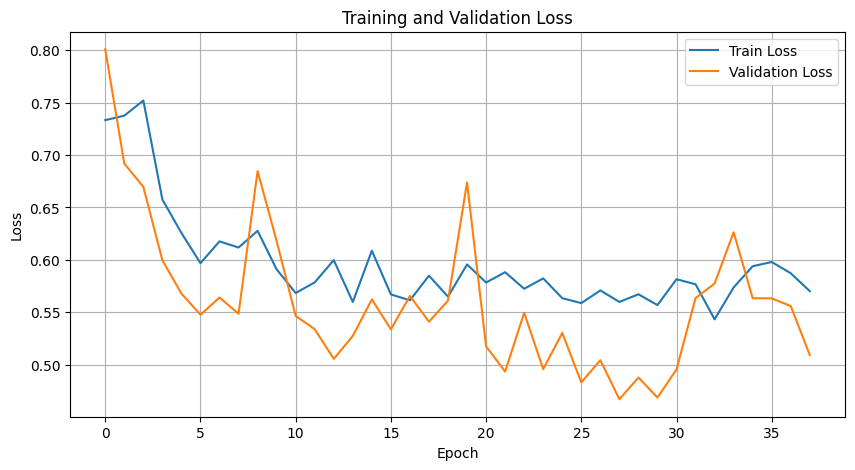

Training Accuracy: 81.7137
Training Precision Scores: [14.71734893 98.44244342]
Training Recall Scores: [70.23255814 82.21544715]
Training F1 Scores: [24.33521354 89.60017721]

Validation Accuracy: 82.5545
Validation Precision Scores: [14.42885772 98.98501692]
Validation Recall Scores: [77.41935484 82.74747475]
Validation F1 Scores: [24.32432432 90.14084507]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 16 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.2625, Val Loss: 0.3526
Early stopping triggered after 32 epochs because no improvements over 10 subsequent epochs!
Epoch 32/100, Train Loss: 0.1860, Val Loss: 0.4197
The function took 81.94 seconds to execute.


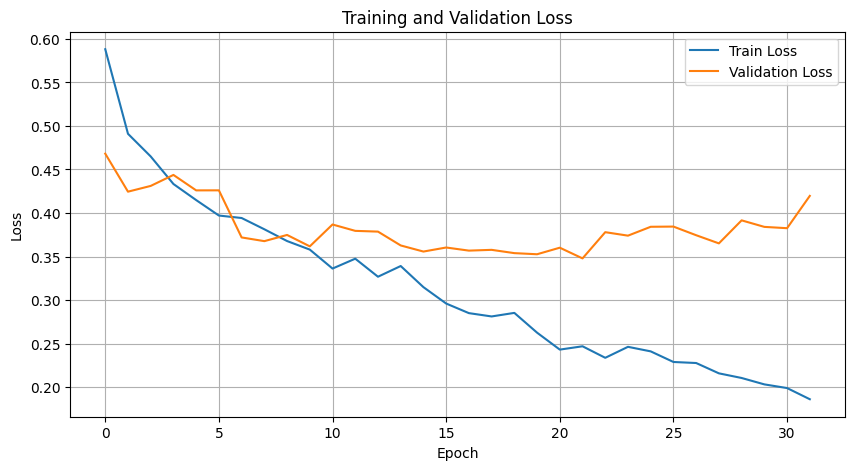

Training Accuracy: 87.8968
Training Precision Scores: [25.16799023 99.79149774]
Training Recall Scores: [95.81395349 87.55081301]
Training F1 Scores: [39.86453798 93.27126076]

Validation Accuracy: 87.3053
Validation Precision Scores: [19.42257218 99.13123   ]
Validation Recall Scores: [79.56989247 87.5959596 ]
Validation F1 Scores: [31.22362869 93.00729301]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 16 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Early stopping triggered after 18 epochs because no improvements over 10 subsequent epochs!
Epoch 18/100, Train Loss: 0.3496, Val Loss: 0.3778
The function took 46.06 seconds to execute.


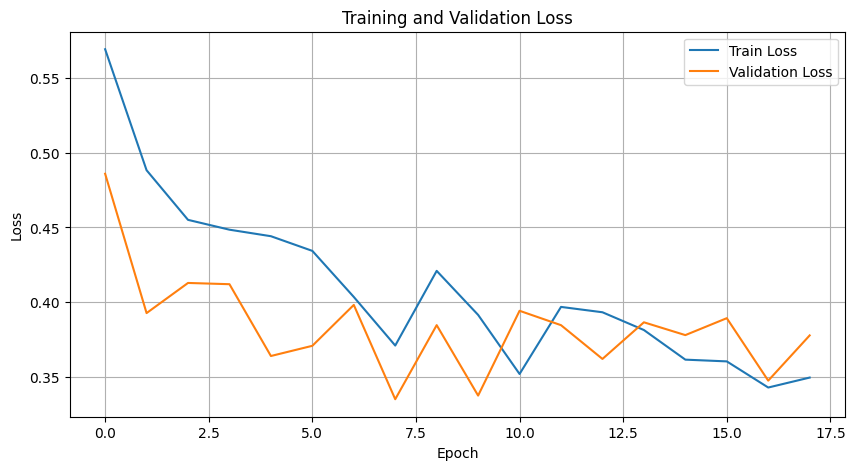

Training Accuracy: 88.6952
Training Precision Scores: [23.87419585 98.91782212]
Training Recall Scores: [77.6744186  89.17682927]
Training F1 Scores: [36.52268999 93.7950938 ]

Validation Accuracy: 89.3302
Validation Precision Scores: [21.63009404 98.93285905]
Validation Recall Scores: [74.19354839 89.8989899 ]
Validation F1 Scores: [33.49514563 94.19983065]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 16 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.4401, Val Loss: 0.3865
Epoch 40/100, Train Loss: 0.3645, Val Loss: 0.3602
Early stopping triggered after 57 epochs because no improvements over 10 subsequent epochs!
Epoch 57/100, Train Loss: 0.2987, Val Loss: 0.3767
The function took 170.23 seconds to execute.


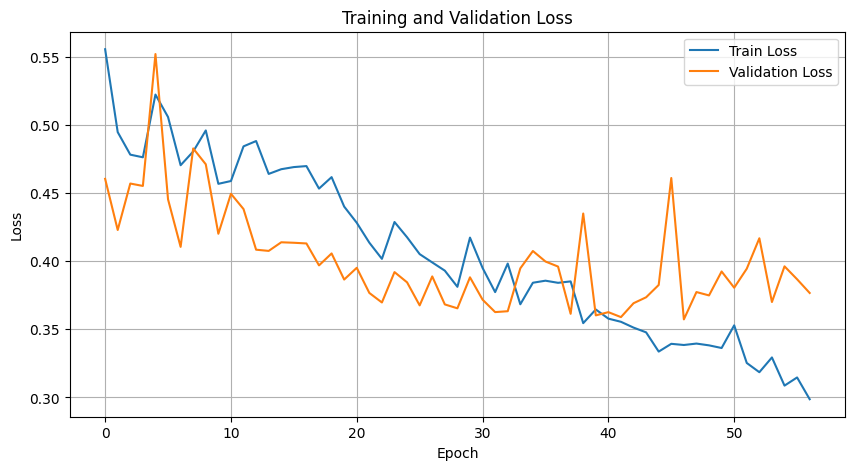

Training Accuracy: 87.5949
Training Precision Scores: [22.73901809 99.1057097 ]
Training Recall Scores: [81.86046512 87.84552846]
Training F1 Scores: [35.59150657 93.13651546]

Validation Accuracy: 87.2664
Validation Precision Scores: [19.04761905 99.04109589]
Validation Recall Scores: [77.41935484 87.63636364]
Validation F1 Scores: [30.57324841 92.9903537 ]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 16 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.4564, Val Loss: 0.4170
Epoch 40/100, Train Loss: 0.4232, Val Loss: 0.3851
Early stopping triggered after 59 epochs because no improvements over 10 subsequent epochs!
Epoch 59/100, Train Loss: 0.4098, Val Loss: 0.4285
The function took 211.90 seconds to execute.


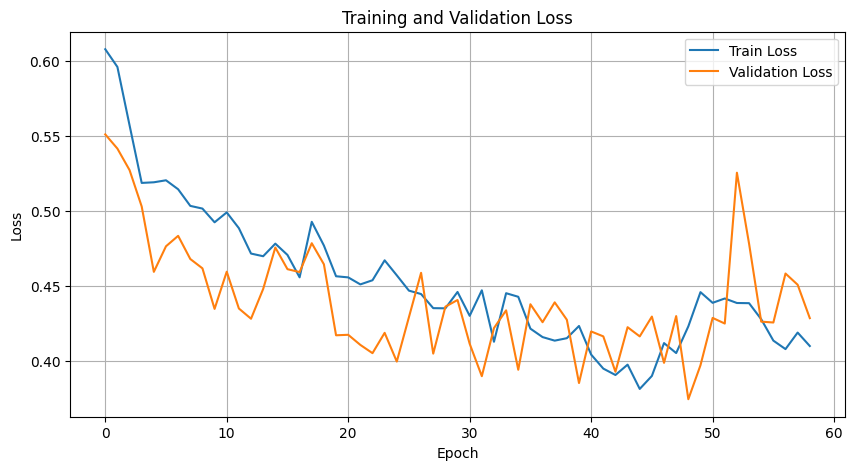

Training Accuracy: 86.3486
Training Precision Scores: [20.25703794 98.85363594]
Training Recall Scores: [76.97674419 86.75813008]
Training F1 Scores: [32.07364341 92.41177744]

Validation Accuracy: 85.2804
Validation Precision Scores: [16.31205674 98.88111888]
Validation Recall Scores: [74.19354839 85.6969697 ]
Validation F1 Scores: [26.74418605 91.81818182]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 16 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.4749, Val Loss: 0.4585
Early stopping triggered after 27 epochs because no improvements over 10 subsequent epochs!
Epoch 27/100, Train Loss: 0.4763, Val Loss: 0.4706
The function took 106.36 seconds to execute.


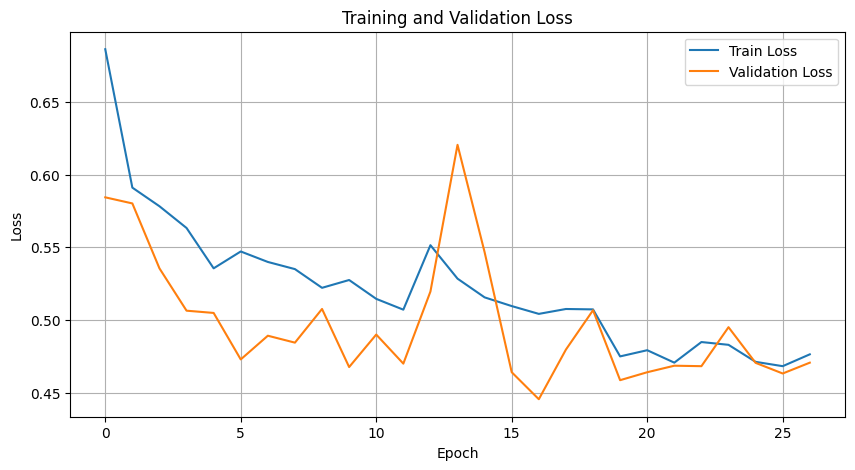

Training Accuracy: 82.6485
Training Precision Scores: [15.29774127 98.41384283]
Training Recall Scores: [69.30232558 83.23170732]
Training F1 Scores: [25.06307822 90.18830525]

Validation Accuracy: 82.7492
Validation Precision Scores: [13.69294606 98.70565676]
Validation Recall Scores: [70.96774194 83.19191919]
Validation F1 Scores: [22.95652174 90.28721772]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 16 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.5002, Val Loss: 0.4705
Epoch 40/100, Train Loss: 0.4820, Val Loss: 0.4745
Early stopping triggered after 43 epochs because no improvements over 10 subsequent epochs!
Epoch 43/100, Train Loss: 0.4835, Val Loss: 0.4752
The function took 187.48 seconds to execute.


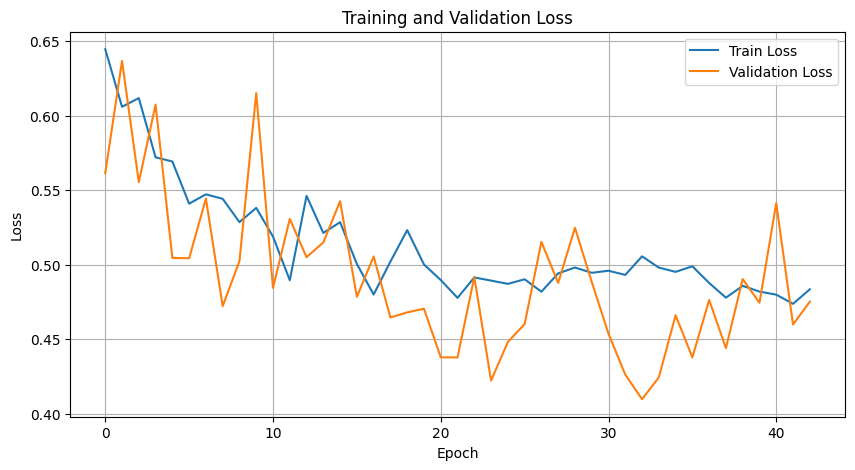

Training Accuracy: 87.9455
Training Precision Scores: [19.94047619 98.1850773 ]
Training Recall Scores: [62.3255814  89.06504065]
Training F1 Scores: [30.21420519 93.40296281]

Validation Accuracy: 88.8240
Validation Precision Scores: [19.10828025 98.53593611]
Validation Recall Scores: [64.51612903 89.73737374]
Validation F1 Scores: [29.48402948 93.93106365]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 16 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.5148, Val Loss: 0.4827
Early stopping triggered after 22 epochs because no improvements over 10 subsequent epochs!
Epoch 22/100, Train Loss: 0.5023, Val Loss: 0.5167
The function took 136.97 seconds to execute.


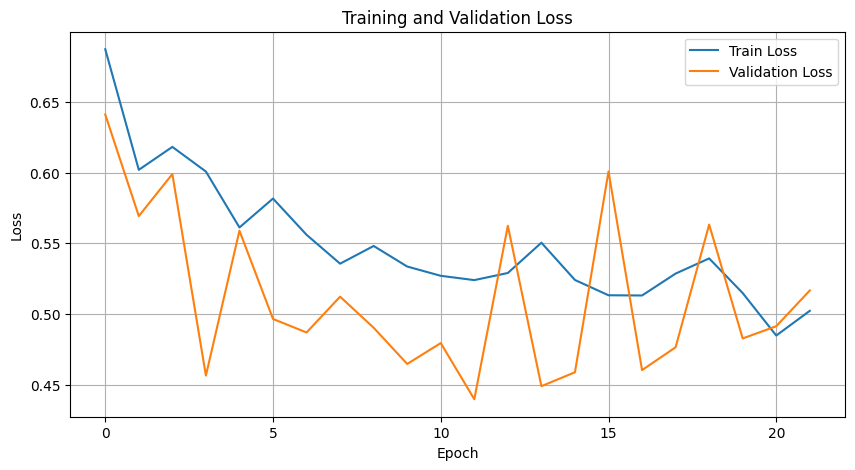

Training Accuracy: 80.3311
Training Precision Scores: [13.53211009 98.33127318]
Training Recall Scores: [68.60465116 80.84349593]
Training F1 Scores: [22.60536398 88.73396542]

Validation Accuracy: 80.0234
Validation Precision Scores: [11.67883212 98.56435644]
Validation Recall Scores: [68.8172043  80.44444444]
Validation F1 Scores: [19.96879875 88.58731924]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 32 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.2019, Val Loss: 0.3709
Early stopping triggered after 28 epochs because no improvements over 10 subsequent epochs!
Epoch 28/100, Train Loss: 0.1565, Val Loss: 0.4636
The function took 71.79 seconds to execute.


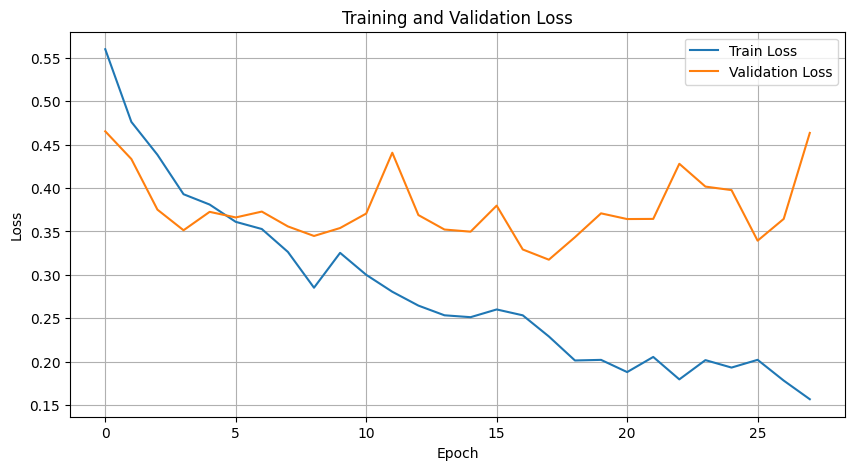

Training Accuracy: 91.6845
Training Precision Scores: [32.87560582 99.74534987]
Training Recall Scores: [94.65116279 91.55487805]
Training F1 Scores: [48.80095923 95.47477745]

Validation Accuracy: 90.3816
Validation Precision Scores: [24.67105263 99.204947  ]
Validation Recall Scores: [80.64516129 90.74747475]
Validation F1 Scores: [37.78337531 94.78792994]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 32 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.3084, Val Loss: 0.3381
Early stopping triggered after 30 epochs because no improvements over 10 subsequent epochs!
Epoch 30/100, Train Loss: 0.2975, Val Loss: 0.3764
The function took 90.13 seconds to execute.


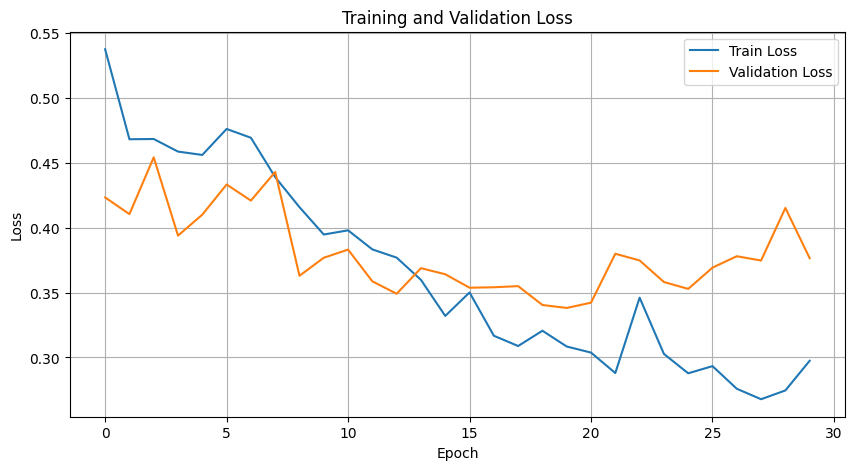

Training Accuracy: 89.1529
Training Precision Scores: [26.73469388 99.57954545]
Training Recall Scores: [91.39534884 89.05487805]
Training F1 Scores: [41.36842105 94.02360515]

Validation Accuracy: 88.2399
Validation Precision Scores: [20.56338028 99.09624944]
Validation Recall Scores: [78.49462366 88.60606061]
Validation F1 Scores: [32.58928571 93.55802048]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 32 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.4369, Val Loss: 0.4589
Early stopping triggered after 31 epochs because no improvements over 10 subsequent epochs!
Epoch 31/100, Train Loss: 0.4092, Val Loss: 0.4276
The function took 111.52 seconds to execute.


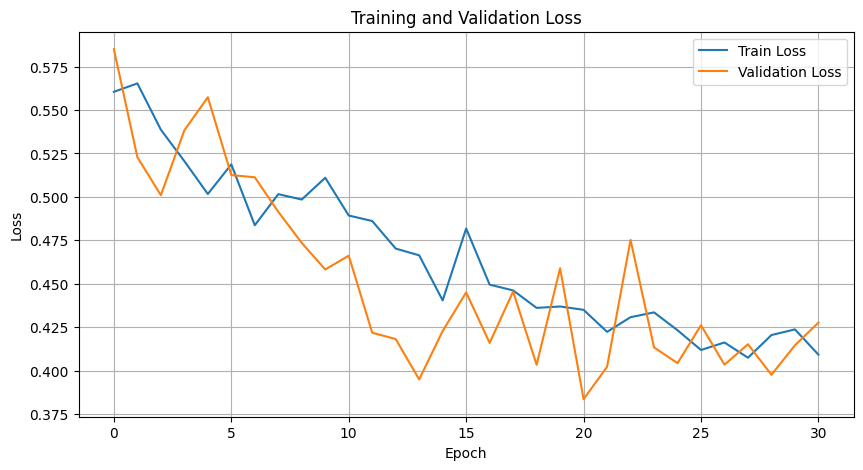

Training Accuracy: 86.0370
Training Precision Scores: [19.53883495 98.7473904 ]
Training Recall Scores: [74.88372093 86.52439024]
Training F1 Scores: [30.99133782 92.23269418]

Validation Accuracy: 86.2928
Validation Precision Scores: [17.38035264 98.89451865]
Validation Recall Scores: [74.19354839 86.74747475]
Validation F1 Scores: [28.16326531 92.42359019]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 32 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.4658, Val Loss: 0.4689
Early stopping triggered after 35 epochs because no improvements over 10 subsequent epochs!
Epoch 35/100, Train Loss: 0.4000, Val Loss: 0.4599
The function took 138.34 seconds to execute.


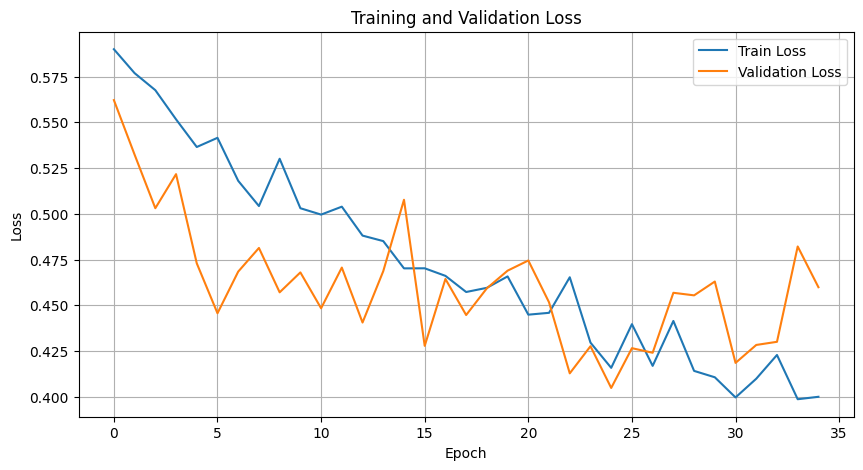

Training Accuracy: 84.8393
Training Precision Scores: [18.78116343 98.92498523]
Training Recall Scores: [78.8372093  85.10162602]
Training F1 Scores: [30.33557047 91.49412729]

Validation Accuracy: 83.0997
Validation Precision Scores: [14.98973306 99.03892359]
Validation Recall Scores: [78.49462366 83.27272727]
Validation F1 Scores: [25.17241379 90.47410009]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 32 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.4639, Val Loss: 0.4308
Early stopping triggered after 27 epochs because no improvements over 10 subsequent epochs!
Epoch 27/100, Train Loss: 0.4502, Val Loss: 0.4576
The function took 117.83 seconds to execute.


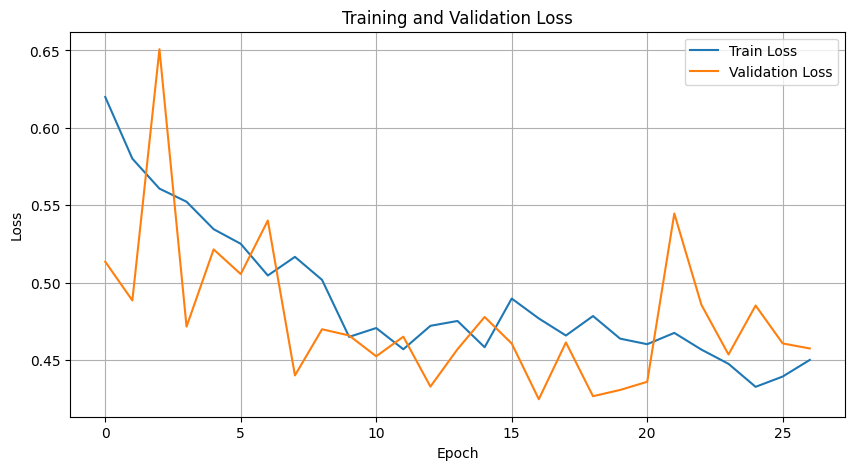

Training Accuracy: 78.3252
Training Precision Scores: [13.67313916 98.82021031]
Training Recall Scores: [78.60465116 78.31300813]
Training F1 Scores: [23.29427981 87.37952149]

Validation Accuracy: 78.6215
Validation Precision Scores: [12.12624585 98.982706  ]
Validation Recall Scores: [78.49462366 78.62626263]
Validation F1 Scores: [21.00719424 87.63791939]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 32 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.4782, Val Loss: 0.4573
Early stopping triggered after 23 epochs because no improvements over 10 subsequent epochs!
Epoch 23/100, Train Loss: 0.4977, Val Loss: 0.4395
The function took 142.85 seconds to execute.


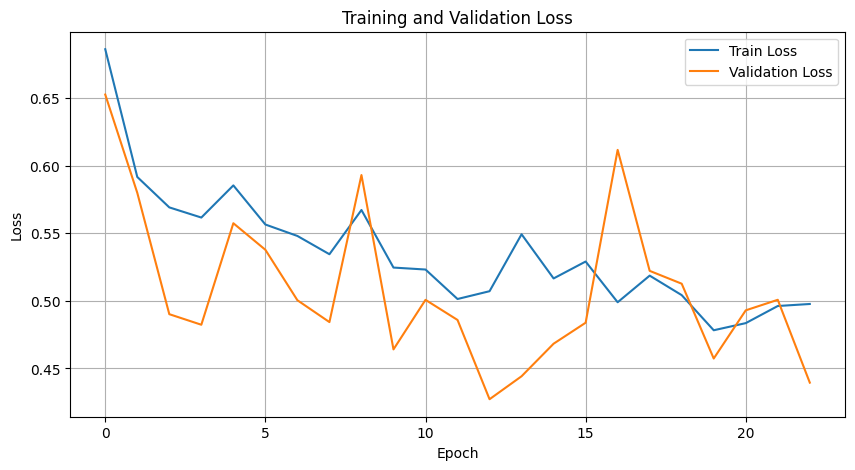

Training Accuracy: 87.4489
Training Precision Scores: [19.07847372 98.14210111]
Training Recall Scores: [61.62790698 88.57723577]
Training F1 Scores: [29.1368884  93.11468404]

Validation Accuracy: 87.8115
Validation Precision Scores: [18.57142857 98.73760144]
Validation Recall Scores: [69.89247312 88.48484848]
Validation F1 Scores: [29.34537246 93.33049222]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 64 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.2777, Val Loss: 0.3811
Early stopping triggered after 26 epochs because no improvements over 10 subsequent epochs!
Epoch 26/100, Train Loss: 0.2391, Val Loss: 0.4375
The function took 77.99 seconds to execute.


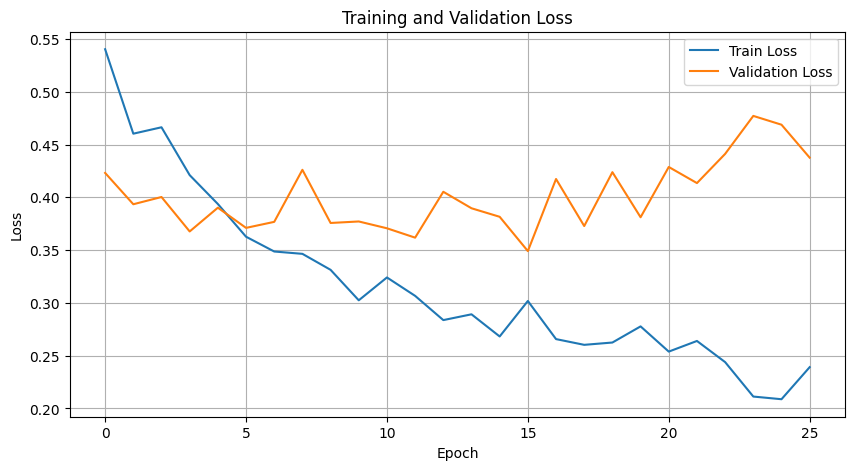

Training Accuracy: 88.6271
Training Precision Scores: [25.72368421 99.55428571]
Training Recall Scores: [90.93023256 88.52642276]
Training F1 Scores: [40.1025641  93.71705218]

Validation Accuracy: 87.3832
Validation Precision Scores: [19.36339523 99.08717481]
Validation Recall Scores: [78.49462366 87.71717172]
Validation F1 Scores: [31.06382979 93.05615088]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 64 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Early stopping triggered after 15 epochs because no improvements over 10 subsequent epochs!
Epoch 15/100, Train Loss: 0.4280, Val Loss: 0.4605
The function took 54.25 seconds to execute.


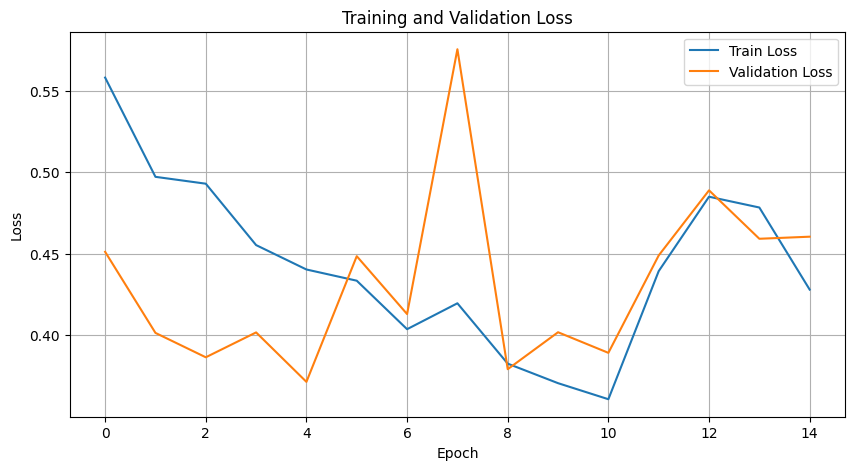

Training Accuracy: 90.8374
Training Precision Scores: [26.7938238  98.52764751]
Training Recall Scores: [68.60465116 91.80894309]
Training F1 Scores: [38.53690398 95.04971329]

Validation Accuracy: 91.2383
Validation Precision Scores: [25.55555556 98.95561358]
Validation Recall Scores: [74.19354839 91.87878788]
Validation F1 Scores: [38.01652893 95.28598366]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 64 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.4494, Val Loss: 0.4666
Early stopping triggered after 39 epochs because no improvements over 10 subsequent epochs!
Epoch 39/100, Train Loss: 0.4450, Val Loss: 0.4094
The function took 155.88 seconds to execute.


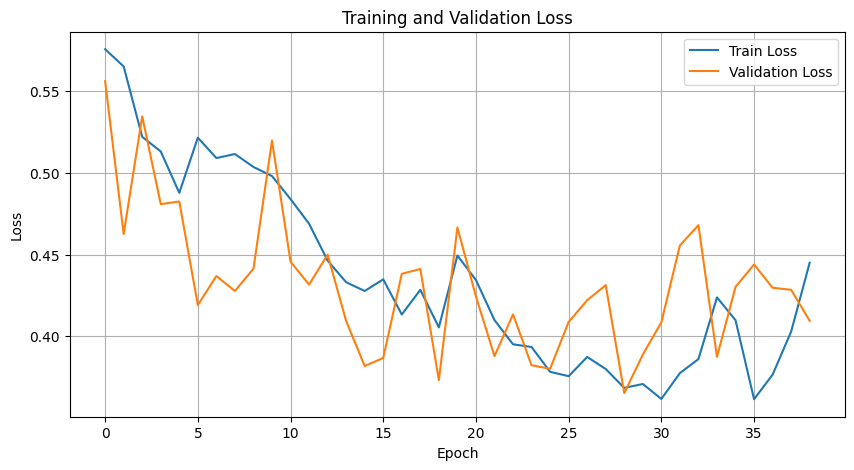

Training Accuracy: 84.0506
Training Precision Scores: [18.96197328 99.26717924]
Training Recall Scores: [85.81395349 83.97357724]
Training F1 Scores: [31.06060606 90.98216252]

Validation Accuracy: 82.7492
Validation Precision Scores: [14.85943775 99.0821256 ]
Validation Recall Scores: [79.56989247 82.86868687]
Validation F1 Scores: [25.04230118 90.2530253 ]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 64 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.4277, Val Loss: 0.4412
Early stopping triggered after 28 epochs because no improvements over 10 subsequent epochs!
Epoch 28/100, Train Loss: 0.3929, Val Loss: 0.4036
The function took 123.58 seconds to execute.


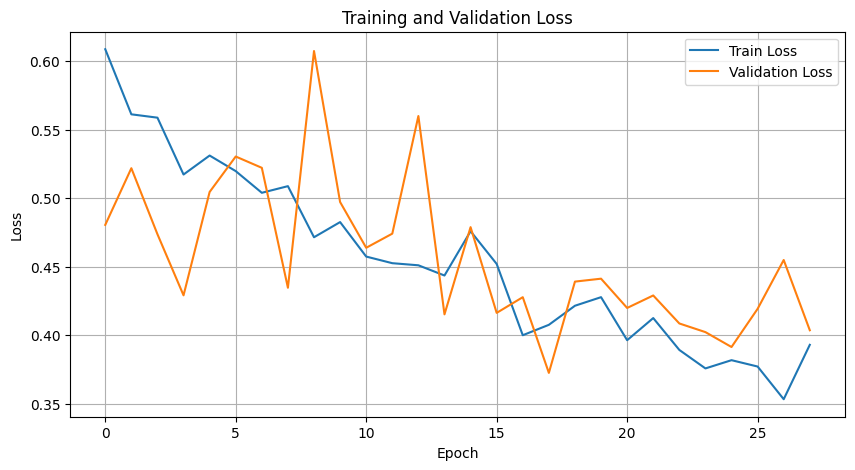

Training Accuracy: 90.5940
Training Precision Scores: [26.24113475 98.53423758]
Training Recall Scores: [68.8372093  91.54471545]
Training F1 Scores: [37.99743261 94.91096829]

Validation Accuracy: 91.0826
Validation Precision Scores: [24.62686567 98.82608696]
Validation Recall Scores: [70.96774194 91.83838384]
Validation F1 Scores: [36.56509695 95.20418848]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 64 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Early stopping triggered after 17 epochs because no improvements over 10 subsequent epochs!
Epoch 17/100, Train Loss: 0.4826, Val Loss: 0.4524
The function took 106.47 seconds to execute.


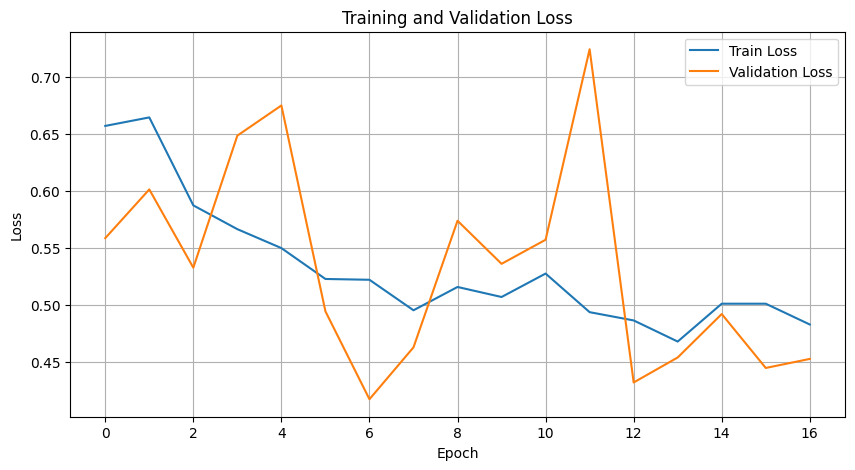

Training Accuracy: 82.5901
Training Precision Scores: [15.49796748 98.49433871]
Training Recall Scores: [70.93023256 83.0995935 ]
Training F1 Scores: [25.43786489 90.14441627]

Validation Accuracy: 83.0607
Validation Precision Scores: [14.375      98.85057471]
Validation Recall Scores: [74.19354839 83.39393939]
Validation F1 Scores: [24.08376963 90.46679816]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 128 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Early stopping triggered after 15 epochs because no improvements over 10 subsequent epochs!
Epoch 15/100, Train Loss: 0.1825, Val Loss: 0.4723
The function took 57.72 seconds to execute.


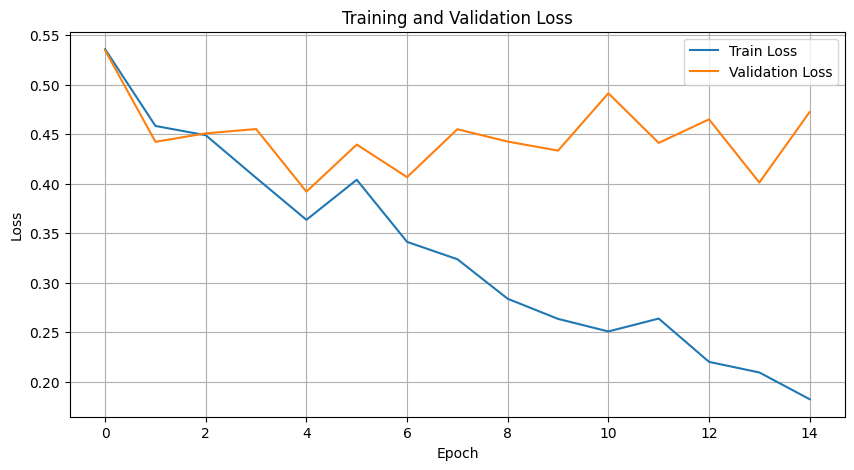

Training Accuracy: 89.0847
Training Precision Scores: [24.65150404 98.94465028]
Training Recall Scores: [78.13953488 89.56300813]
Training F1 Scores: [37.47908533 94.02037659]

Validation Accuracy: 88.6682
Validation Precision Scores: [20.35928144 98.88093107]
Validation Recall Scores: [73.11827957 89.25252525]
Validation F1 Scores: [31.8501171  93.82034402]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 128 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Early stopping triggered after 15 epochs because no improvements over 10 subsequent epochs!
Epoch 15/100, Train Loss: 0.3965, Val Loss: 0.4454
The function took 62.05 seconds to execute.


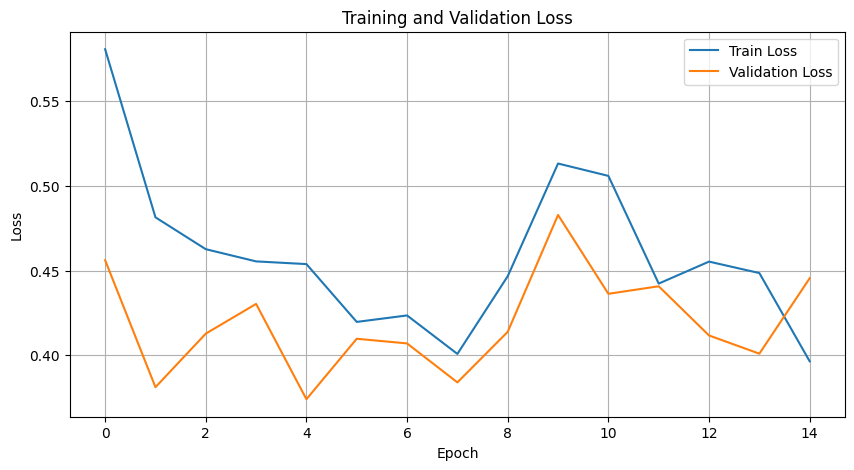

Training Accuracy: 83.1061
Training Precision Scores: [17.29323308 98.97280967]
Training Recall Scores: [80.23255814 83.23170732]
Training F1 Scores: [28.45360825 90.42230196]

Validation Accuracy: 83.0218
Validation Precision Scores: [15.0712831  99.08521907]
Validation Recall Scores: [79.56989247 83.15151515]
Validation F1 Scores: [25.34246575 90.42179262]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 128 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.4046, Val Loss: 0.4632
Early stopping triggered after 27 epochs because no improvements over 10 subsequent epochs!
Epoch 27/100, Train Loss: 0.4374, Val Loss: 0.4332
The function took 121.41 seconds to execute.


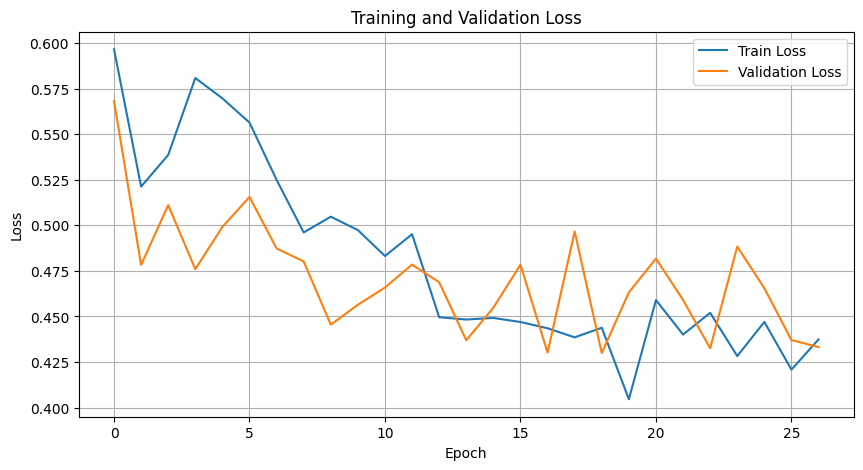

Training Accuracy: 82.6095
Training Precision Scores: [16.99123661 99.01411879]
Training Recall Scores: [81.1627907  82.67276423]
Training F1 Scores: [28.09983897 90.10855117]

Validation Accuracy: 83.2165
Validation Precision Scores: [14.93775934 98.99328859]
Validation Recall Scores: [77.41935484 83.43434343]
Validation F1 Scores: [25.04347826 90.55031791]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 128 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.4142, Val Loss: 0.4088
Early stopping triggered after 22 epochs because no improvements over 10 subsequent epochs!
Epoch 22/100, Train Loss: 0.4625, Val Loss: 0.4649
The function took 136.59 seconds to execute.


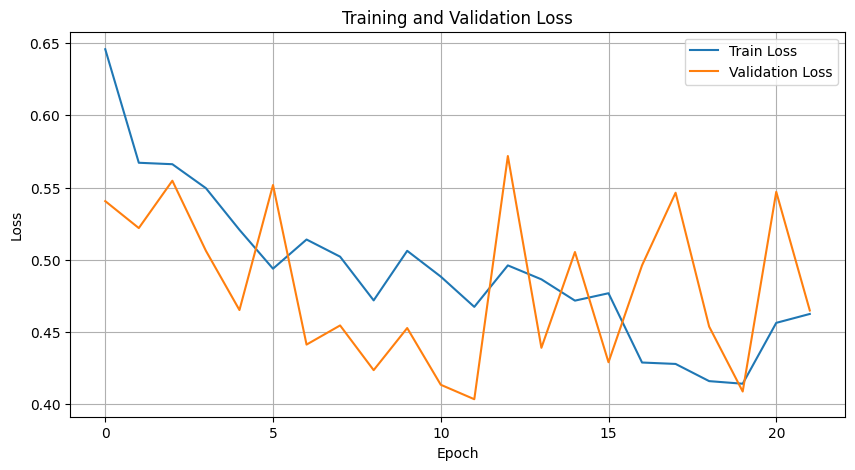

Training Accuracy: 78.0234
Training Precision Scores: [14.02126822 99.04281464]
Training Recall Scores: [82.79069767 77.81504065]
Training F1 Scores: [23.98113843 87.15497126]

Validation Accuracy: 77.7648
Validation Precision Scores: [12.06349206 99.12280702]
Validation Recall Scores: [81.72043011 77.61616162]
Validation F1 Scores: [21.02351314 87.06095627]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 256 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Early stopping triggered after 17 epochs because no improvements over 10 subsequent epochs!
Epoch 17/100, Train Loss: 0.2423, Val Loss: 0.5318
The function took 72.44 seconds to execute.


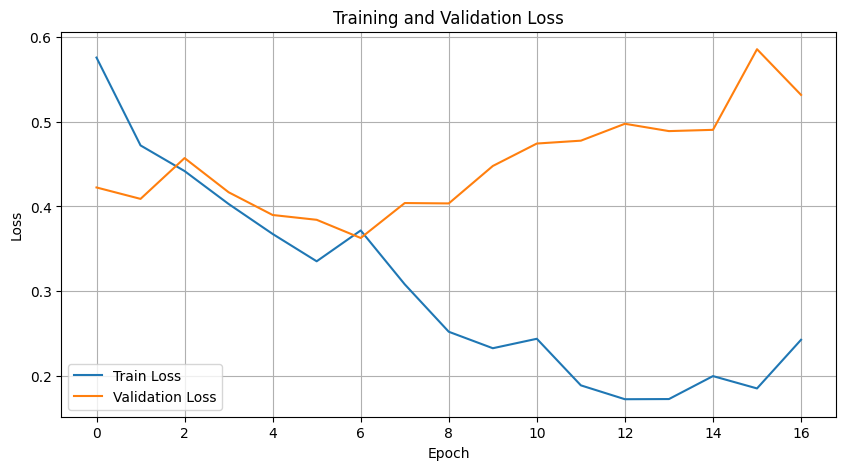

Training Accuracy: 90.0195
Training Precision Scores: [27.37642586 99.21831379]
Training Recall Scores: [83.72093023 90.29471545]
Training F1 Scores: [41.26074499 94.54642192]

Validation Accuracy: 88.5514
Validation Precision Scores: [20.17804154 98.87942627]
Validation Recall Scores: [73.11827957 89.13131313]
Validation F1 Scores: [31.62790698 93.75265618]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 256 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.3648, Val Loss: 0.4749
Early stopping triggered after 21 epochs because no improvements over 10 subsequent epochs!
Epoch 21/100, Train Loss: 0.3530, Val Loss: 0.4558
The function took 96.76 seconds to execute.


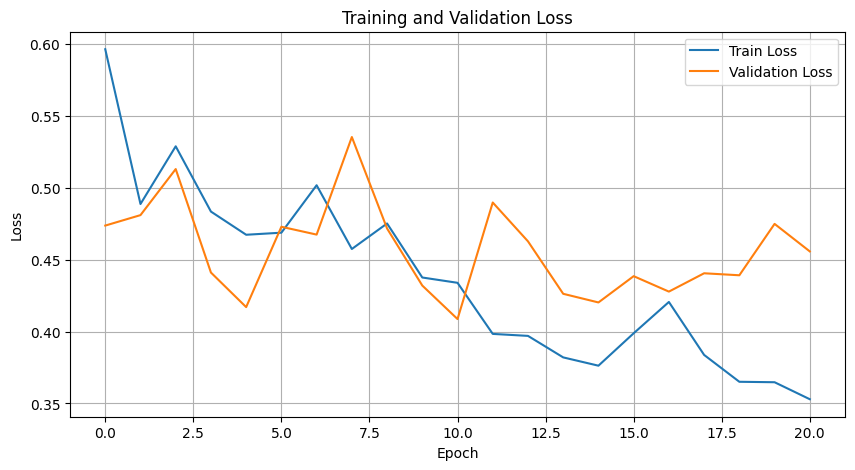

Training Accuracy: 83.2911
Training Precision Scores: [17.85       99.11729141]
Training Recall Scores: [83.02325581 83.30284553]
Training F1 Scores: [29.38271605 90.52457206]

Validation Accuracy: 82.5935
Validation Precision Scores: [14.17004049 98.89103182]
Validation Recall Scores: [75.2688172  82.86868687]
Validation F1 Scores: [23.85008518 90.17366454]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 256 and hidden dim 64


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Early stopping triggered after 17 epochs because no improvements over 10 subsequent epochs!
Epoch 17/100, Train Loss: 0.4210, Val Loss: 0.4302
The function took 108.43 seconds to execute.


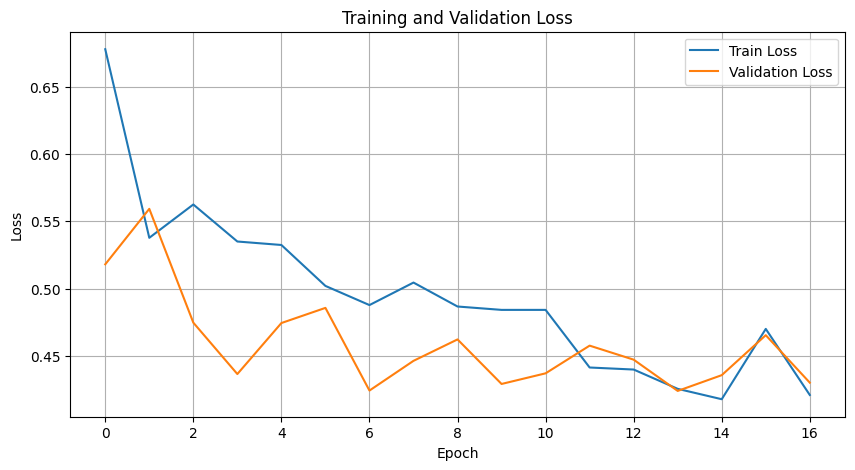

Training Accuracy: 88.3252
Training Precision Scores: [21.37006701 98.39811807]
Training Recall Scores: [66.74418605 89.26829268]
Training F1 Scores: [32.37450649 93.61112591]

Validation Accuracy: 88.0452
Validation Precision Scores: [19.94382022 99.00542495]
Validation Recall Scores: [76.34408602 88.48484848]
Validation F1 Scores: [31.62583519 93.449968  ]



In [23]:
train_dataset = TimeSeriesDataset(X_train, y_train)
val_dataset = TimeSeriesDataset(X_val, y_val)
test_dataset = TimeSeriesDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=64, collate_fn=collate_fn,shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=64, collate_fn=collate_fn, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=64, collate_fn=collate_fn, shuffle=False)

embedding_sizes = [4,8,16,32,64,128,256]
hidden_dims = [8,16,32,64,128,256,320,384,512]

for i in range(len(embedding_sizes)):
    for j in range(i,len(hidden_dims)):
        embedding_size=embedding_sizes[i]
        hidden_size=hidden_dims[j]
        print("-------------------------------------------------------------------------")
        print("-------------------------------------------------------------------------")
        print("-------------------------------------------------------------------------")
        print(f"Trying with embedding size {embedding_size} and hidden dim {hidden_dim}")

        vocabulary_size = len(vectorizer.vocabulary_) + 2  # Add 2 for out-of-vocabulary and padding
        output_size = 2

        model = BiDirectionalRNN(vocabulary_size, embedding_size, hidden_size, output_size)
        model = model.to(device)
        
        class_weight = compute_class_weight(class_weight='balanced', classes=np.unique(y_train), y=y_train)  # Computing class weights
        class_weight_tensor = torch.tensor(class_weight, dtype=torch.float32).to(device)  # Converting to PyTorch tensor
        criterion = nn.CrossEntropyLoss(weight=class_weight_tensor)
        
        optimizer = optim.AdamW(model.parameters(), lr=0.001, weight_decay=0.01)
        num_epochs = 100
        training_loop(model, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, criterion, num_epochs)
        
        train_accuracy, train_precisionscores, train_recallscores, train_f1scores, _, _ = testing_model(model,train_loader,device)
        val_accuracy, val_precisionscores, val_recallscores, val_f1scores, _, _ = testing_model(model,val_loader,device)
        
        stats(train_accuracy, train_precisionscores, train_recallscores, train_f1scores, 'Training')
        stats(val_accuracy, val_precisionscores, val_recallscores, val_f1scores, 'Validation')

Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.2830, Val Loss: 0.3820
Early stopping triggered after 22 epochs because no improvements over 10 subsequent epochs!
Epoch 22/100, Train Loss: 0.2298, Val Loss: 0.3709
The function took 57.16 seconds to execute.


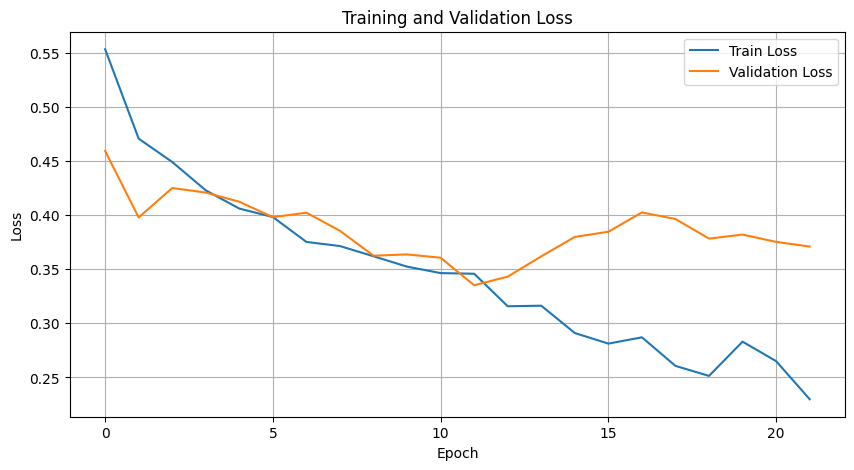

Test Accuracy: 88.1344
Test Precision Scores: [19.32938856 99.14759274]
Test Recall Scores: [78.4        88.47725032]
Test F1 Scores: [31.01265823 93.509007  ]



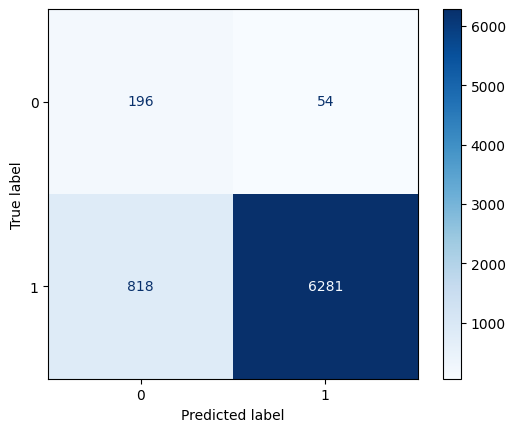

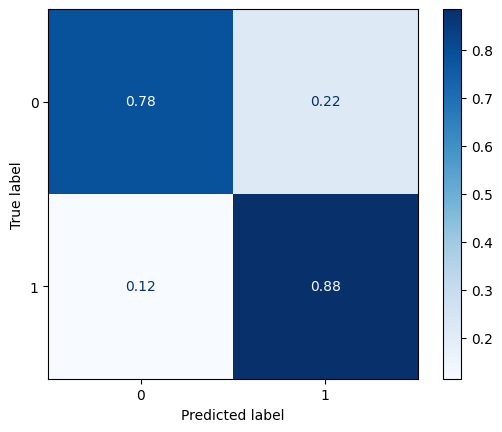

In [15]:
# 16 64

train_dataset = TimeSeriesDataset(X_train, y_train)
val_dataset = TimeSeriesDataset(X_val, y_val)
test_dataset = TimeSeriesDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=64, collate_fn=collate_fn,shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=64, collate_fn=collate_fn, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=64, collate_fn=collate_fn, shuffle=False)

embedding_size=16
hidden_dim=64

vocabulary_size = len(vectorizer.vocabulary_) + 2  # Add 2 for out-of-vocabulary and padding
output_size = 2

model = BiDirectionalRNN(vocabulary_size, embedding_size, hidden_dim, output_size)
model = model.to(device)

class_weight = compute_class_weight(class_weight='balanced', classes=np.unique(y_train), y=y_train)  # Computing class weights
class_weight_tensor = torch.tensor(class_weight, dtype=torch.float32).to(device)  # Converting to PyTorch tensor
criterion = nn.CrossEntropyLoss(weight=class_weight_tensor)

optimizer = optim.AdamW(model.parameters(), lr=0.001, weight_decay=0.01)
num_epochs = 100
training_loop(model, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, criterion, num_epochs)

test_accuracy, test_precisionscores, test_recallscores, test_f1scores, all_labels_test, all_predictions_test = testing_model(model,test_loader,device)
stats(test_accuracy, test_precisionscores, test_recallscores, test_f1scores, 'Test')
ConfusionMatrixDisplay.from_predictions(all_labels_test, all_predictions_test, cmap='Blues')
ConfusionMatrixDisplay.from_predictions(all_labels_test, all_predictions_test, normalize='true', cmap='Blues')

## LSTM

In [16]:
class LSTMClassifier(nn.Module):
    def __init__(self, vocab_size, embed_size, hid_size, out_size):
        super(LSTMClassifier, self).__init__()

        # 1) embedding layer: vocab_size × d
        self.embedding = nn.Embedding(vocab_size, embed_size, padding_idx=max(vectorizer.vocabulary_.values()) + 1)

        # 2) first linear layer: (seq_len·d) → H
        #batch first is used to specify that the matrix in input has dimension:
        #(batch_size, sequence_length, input_size)
        self.lstm = nn.LSTM(input_size=embed_size, hidden_size=hid_size, batch_first=True, num_layers=2, bidirectional=True, dropout=0.5)

        # 3) second linear layer: H → 2
        self.linear = nn.Linear(hid_size * 2, out_size)

        self.dropout = nn.Dropout(0.5)

    """
    Args:
        - input_seq: The input sequence tensor of shape
         (batch_size, sequence_length, input_size).
     Output of rnn:
         - **rnn_out** contains the output for all time steps.
           It has shape (batch_size, sequence_length, hidden_size).
         - **h** contains the hidden states for all layers at the last time step.
            It has shape (num_layers, batch_size, hidden_size).
         - if different time-series have different sequence_length, rnn_out can generate errors
         - with h we get batch_size instead of sequence_length
           ==> no problem with different sequence_length

         - We do not return them in the tracking loop to
             - avoid problems with the gradient vanish/exploding
             - use the windows independently (if possible) and shuffle the data
        Returns:
         - predictions: The predicted pollution levels for the input sequence.
         Use h from last hidden node helps with time-series having different lengths
    """
    def forward(self, x: torch.LongTensor, lengths):

        # embedding lookup → (B, seq_len, d) # certo, perchè se prima avevo per ogni parola d dim, se qui ho 100 parole avrò 100xd dimensioni
        x = self.embedding(x.long())
        x = self.dropout(x)
        x = pack_padded_sequence(x, lengths.cpu(), batch_first=True, enforce_sorted=True)

        x, (hidden, cell) = self.lstm(x)

        # Concatenate the final forward and backward hidden states
        last_forward = hidden[-2, :, :]  # Last layer's forward direction
        last_backward = hidden[-1, :, :]  # Last layer's backward direction

        # Concatenate the final forward and backward hidden states
        hidden_cat = torch.cat((last_forward, last_backward), dim=1)

        output = self.linear(hidden_cat)

        return output

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 4 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.4848, Val Loss: 0.4753
Early stopping triggered after 32 epochs because no improvements over 10 subsequent epochs!
Epoch 32/100, Train Loss: 0.4369, Val Loss: 0.4301
The function took 90.38 seconds to execute.


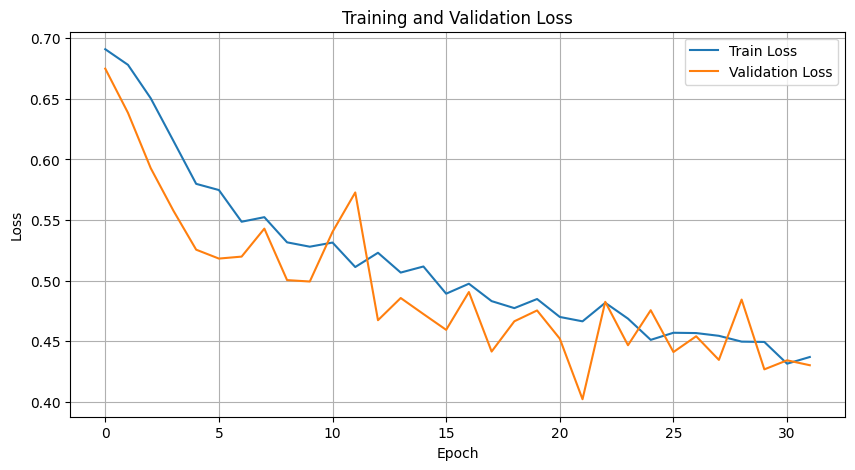

Training Accuracy: 78.8121
Training Precision Scores: [14.01483924 98.85262621]
Training Recall Scores: [79.06976744 78.80081301]
Training F1 Scores: [23.80952381 87.69509161]

Validation Accuracy: 79.5561
Validation Precision Scores: [13.13993174 99.19273461]
Validation Recall Scores: [82.79569892 79.43434343]
Validation F1 Scores: [22.68041237 88.22077631]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 4 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.4722, Val Loss: 0.4299
Epoch 40/100, Train Loss: 0.3970, Val Loss: 0.3658
Early stopping triggered after 43 epochs because no improvements over 10 subsequent epochs!
Epoch 43/100, Train Loss: 0.4133, Val Loss: 0.3598
The function took 121.20 seconds to execute.


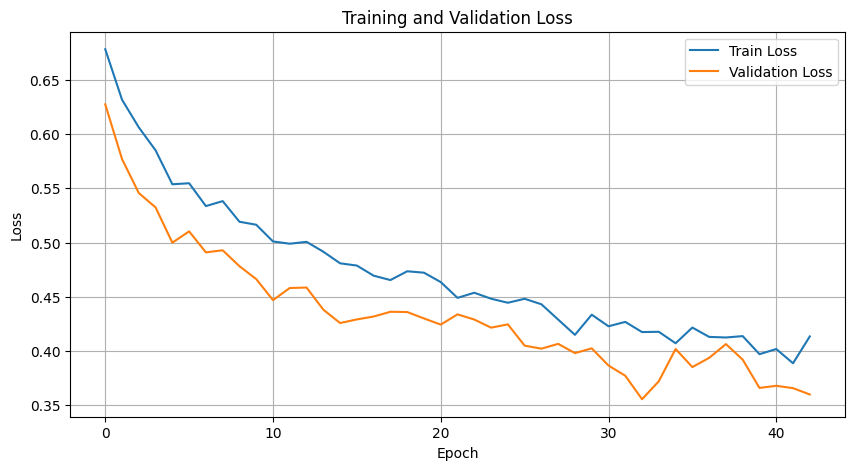

Training Accuracy: 84.7712
Training Precision Scores: [19.45043103 99.1799382 ]
Training Recall Scores: [83.95348837 84.80691057]
Training F1 Scores: [31.58355206 91.4320149 ]

Validation Accuracy: 84.8131
Validation Precision Scores: [17.07317073 99.24421351]
Validation Recall Scores: [82.79569892 84.88888889]
Validation F1 Scores: [28.30882353 91.50696864]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 4 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.4546, Val Loss: 0.3881
Epoch 40/100, Train Loss: 0.4080, Val Loss: 0.3317
Early stopping triggered after 59 epochs because no improvements over 10 subsequent epochs!
Epoch 59/100, Train Loss: 0.3264, Val Loss: 0.3321
The function took 174.52 seconds to execute.


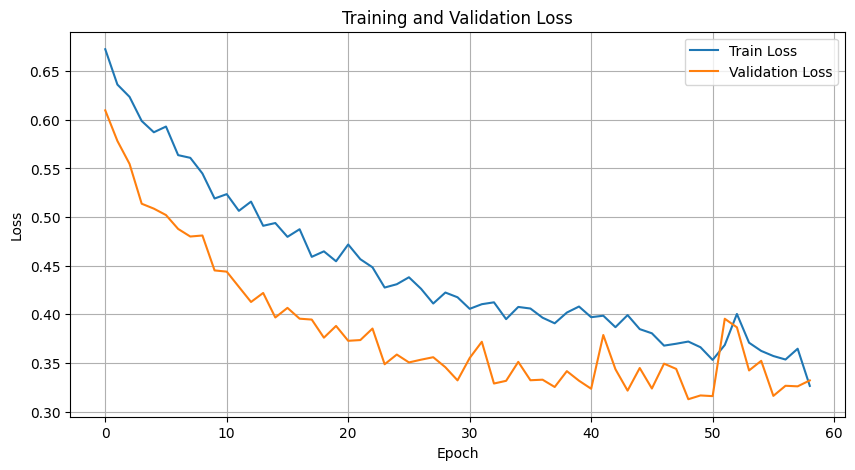

Training Accuracy: 89.8734
Training Precision Scores: [26.71755725 99.10714286]
Training Recall Scores: [81.39534884 90.24390244]
Training F1 Scores: [40.22988506 94.46808511]

Validation Accuracy: 89.6028
Validation Precision Scores: [23.31288344 99.24174844]
Validation Recall Scores: [81.72043011 89.8989899 ]
Validation F1 Scores: [36.27684964 94.33962264]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 4 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.4446, Val Loss: 0.3676
Epoch 40/100, Train Loss: 0.3656, Val Loss: 0.3144
Epoch 60/100, Train Loss: 0.3176, Val Loss: 0.2901
Early stopping triggered after 73 epochs because no improvements over 10 subsequent epochs!
Epoch 73/100, Train Loss: 0.3019, Val Loss: 0.2807
The function took 219.96 seconds to execute.


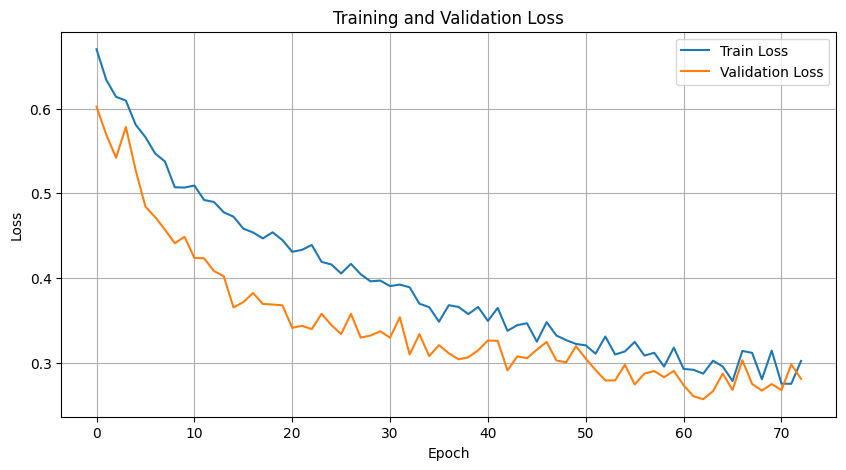

Training Accuracy: 88.3252
Training Precision Scores: [25.6799494 99.7237887]
Training Recall Scores: [94.41860465 88.05894309]
Training F1 Scores: [40.37792143 93.52906255]

Validation Accuracy: 88.3956
Validation Precision Scores: [21.7630854  99.36507937]
Validation Recall Scores: [84.94623656 88.52525253]
Validation F1 Scores: [34.64912281 93.63247863]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 4 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.4343, Val Loss: 0.3774
Epoch 40/100, Train Loss: 0.3284, Val Loss: 0.3239
Early stopping triggered after 57 epochs because no improvements over 10 subsequent epochs!
Epoch 57/100, Train Loss: 0.2932, Val Loss: 0.3372
The function took 225.70 seconds to execute.


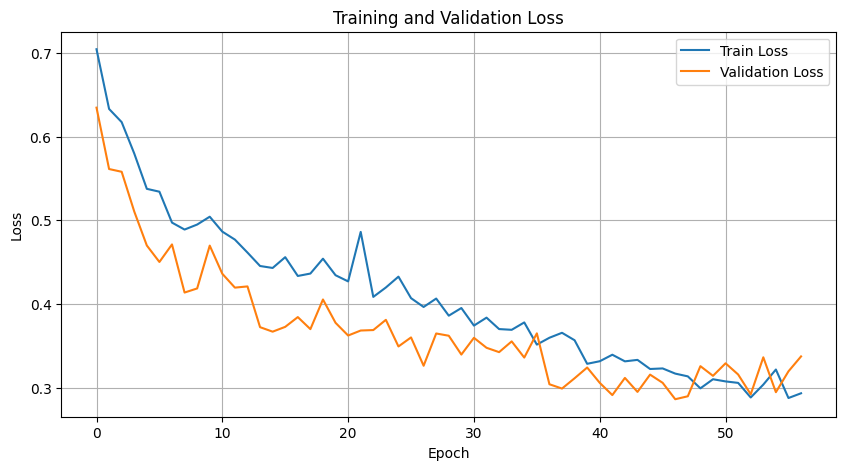

Training Accuracy: 92.7069
Training Precision Scores: [34.99529633 99.37004453]
Training Recall Scores: [86.51162791 92.97764228]
Training F1 Scores: [49.83255191 96.0676222 ]

Validation Accuracy: 92.5623
Validation Precision Scores: [30.24193548 99.22413793]
Validation Recall Scores: [80.64516129 93.01010101]
Validation F1 Scores: [43.98826979 96.01668405]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 4 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.4751, Val Loss: 0.3806
Epoch 40/100, Train Loss: 0.3945, Val Loss: 0.3470
Early stopping triggered after 47 epochs because no improvements over 10 subsequent epochs!
Epoch 47/100, Train Loss: 0.3432, Val Loss: 0.3495
The function took 323.10 seconds to execute.


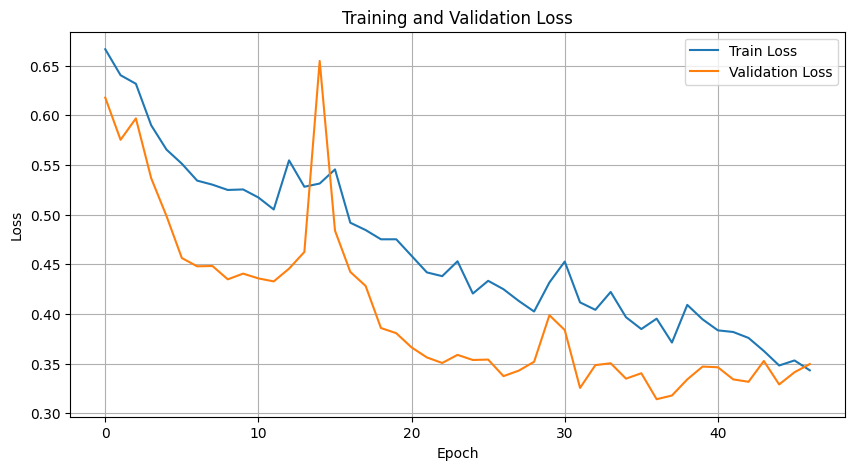

Training Accuracy: 85.4722
Training Precision Scores: [20.5654102  99.30309473]
Training Recall Scores: [86.27906977 85.43699187]
Training F1 Scores: [33.21396598 91.84966678]

Validation Accuracy: 85.8645
Validation Precision Scores: [18.30985915 99.29971989]
Validation Recall Scores: [83.87096774 85.93939394]
Validation F1 Scores: [30.05780347 92.13775179]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 4 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.5626, Val Loss: 0.4673
Epoch 40/100, Train Loss: 0.5162, Val Loss: 0.4244
Epoch 60/100, Train Loss: 0.4560, Val Loss: 0.4116
Epoch 80/100, Train Loss: 0.3689, Val Loss: 0.3630
Early stopping triggered after 96 epochs because no improvements over 10 subsequent epochs!
Epoch 96/100, Train Loss: 0.3140, Val Loss: 0.3561
The function took 770.88 seconds to execute.


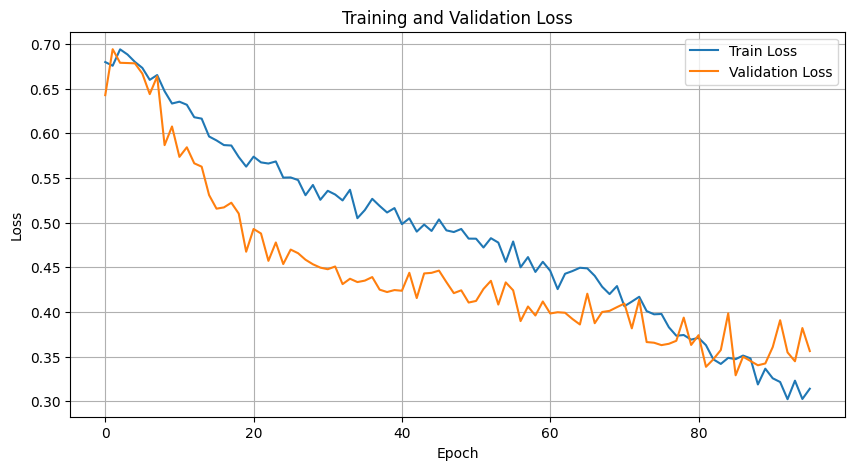

Training Accuracy: 82.9211
Training Precision Scores: [18.74409821 99.59519136]
Training Recall Scores: [92.3255814 82.5101626]
Training F1 Scores: [31.16169545 90.25122277]

Validation Accuracy: 82.9050
Validation Precision Scores: [15.4        99.22630561]
Validation Recall Scores: [82.79569892 82.90909091]
Validation F1 Scores: [25.96964587 90.33678186]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 4 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.4866, Val Loss: 0.3846
Epoch 40/100, Train Loss: 0.3645, Val Loss: 0.3096
Early stopping triggered after 55 epochs because no improvements over 10 subsequent epochs!
Epoch 55/100, Train Loss: 0.3079, Val Loss: 0.3259
The function took 512.56 seconds to execute.


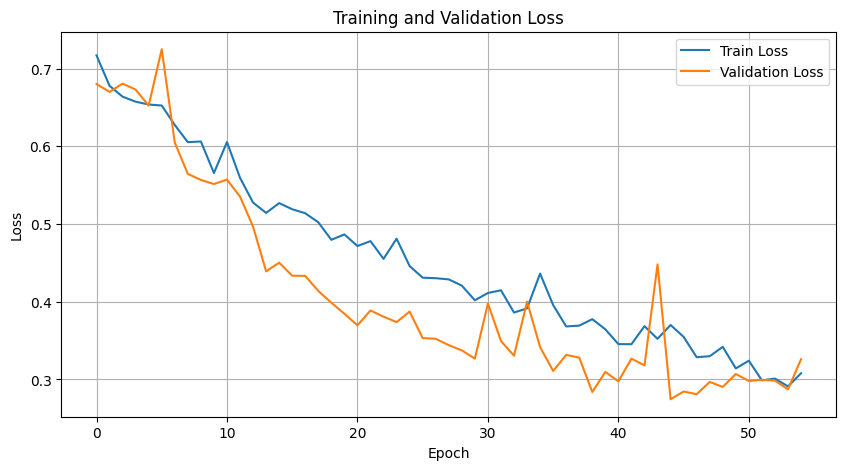

Training Accuracy: 88.6173
Training Precision Scores: [25.31730127 99.41867092]
Training Recall Scores: [88.13953488 88.63821138]
Training F1 Scores: [39.33575506 93.7194434 ]

Validation Accuracy: 88.1231
Validation Precision Scores: [21.03825137 99.27338783]
Validation Recall Scores: [82.79569892 88.32323232]
Validation F1 Scores: [33.55119826 93.47872568]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 4 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.5427, Val Loss: 0.4812
Epoch 40/100, Train Loss: 0.5127, Val Loss: 0.4427
Epoch 60/100, Train Loss: 0.4260, Val Loss: 0.3632
Epoch 80/100, Train Loss: 0.3437, Val Loss: 0.2973
Epoch 100/100, Train Loss: 0.2592, Val Loss: 0.2644
The function took 1295.55 seconds to execute.


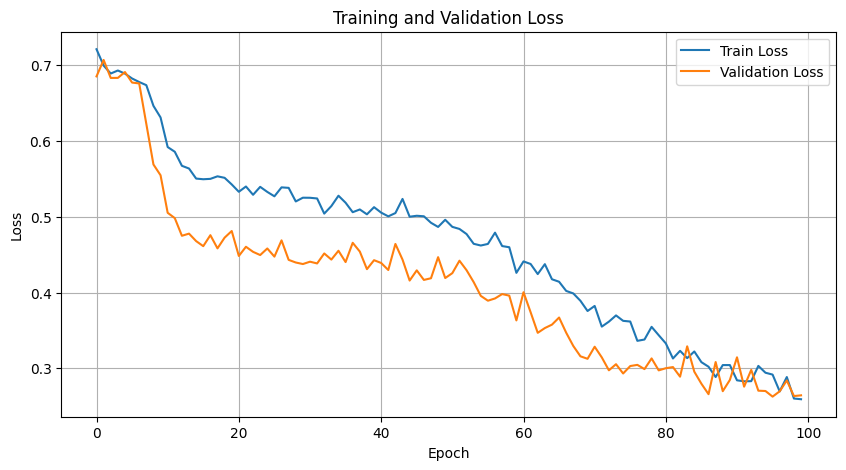

Training Accuracy: 89.6203
Training Precision Scores: [28.03867403 99.72795285]
Training Recall Scores: [94.41860465 89.41056911]
Training F1 Scores: [43.23748669 94.28785768]

Validation Accuracy: 89.3302
Validation Precision Scores: [23.61516035 99.46067416]
Validation Recall Scores: [87.09677419 89.41414141]
Validation F1 Scores: [37.1559633  94.17021277]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 8 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.3968, Val Loss: 0.3498
Epoch 40/100, Train Loss: 0.3312, Val Loss: 0.2744
Early stopping triggered after 51 epochs because no improvements over 10 subsequent epochs!
Epoch 51/100, Train Loss: 0.3015, Val Loss: 0.2640
The function took 144.85 seconds to execute.


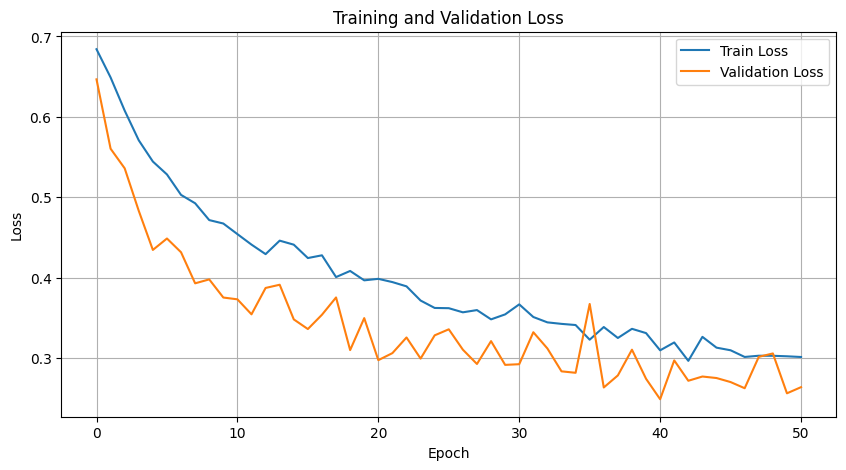

Training Accuracy: 86.5531
Training Precision Scores: [22.27405248 99.43892461]
Training Recall Scores: [88.8372093  86.45325203]
Training F1 Scores: [35.61771562 92.49252514]

Validation Accuracy: 86.6822
Validation Precision Scores: [20.14388489 99.58158996]
Validation Recall Scores: [90.32258065 86.54545455]
Validation F1 Scores: [32.94117647 92.60700389]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 8 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.3772, Val Loss: 0.3162
Epoch 40/100, Train Loss: 0.3012, Val Loss: 0.3339
Epoch 60/100, Train Loss: 0.2327, Val Loss: 0.2085
Epoch 80/100, Train Loss: 0.2110, Val Loss: 0.2154
Early stopping triggered after 94 epochs because no improvements over 10 subsequent epochs!
Epoch 94/100, Train Loss: 0.1928, Val Loss: 0.2086
The function took 278.05 seconds to execute.


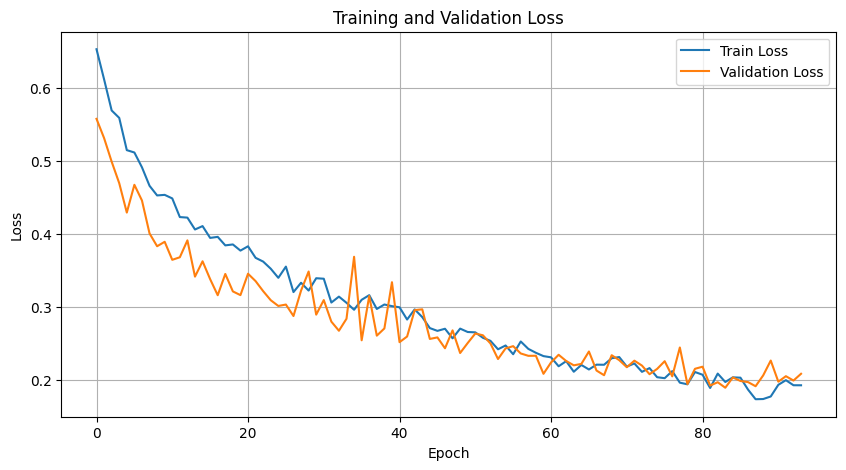

Training Accuracy: 92.9893
Training Precision Scores: [37.16814159 99.89059081]
Training Recall Scores: [97.6744186  92.78455285]
Training F1 Scores: [53.84615385 96.20653319]

Validation Accuracy: 92.6791
Validation Precision Scores: [32.20973783 99.69578444]
Validation Recall Scores: [92.47311828 92.68686869]
Validation F1 Scores: [47.77777778 96.06365159]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 8 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.3685, Val Loss: 0.3253
Epoch 40/100, Train Loss: 0.2873, Val Loss: 0.2614
Epoch 60/100, Train Loss: 0.2145, Val Loss: 0.2305
Early stopping triggered after 68 epochs because no improvements over 10 subsequent epochs!
Epoch 68/100, Train Loss: 0.2091, Val Loss: 0.2361
The function took 204.53 seconds to execute.


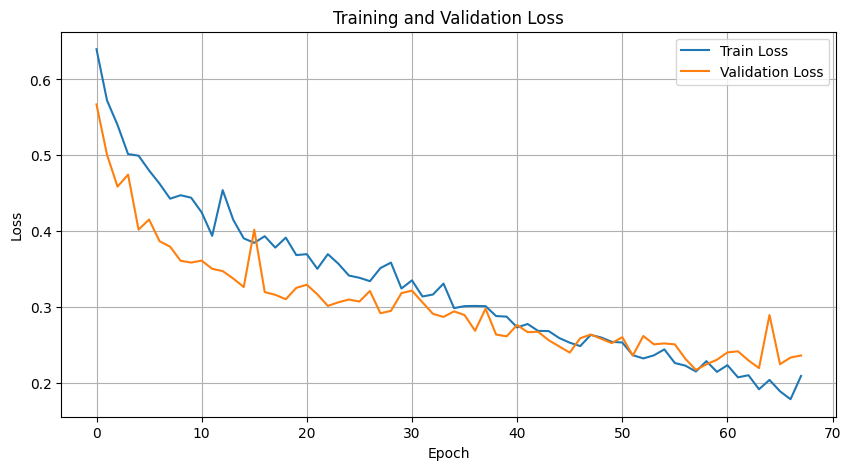

Training Accuracy: 93.7488
Training Precision Scores: [39.66861598 99.75118996]
Training Recall Scores: [94.65116279 93.70934959]
Training F1 Scores: [55.90659341 96.63592538]

Validation Accuracy: 93.5748
Validation Precision Scores: [35.36585366 99.74160207]
Validation Recall Scores: [93.5483871  93.57575758]
Validation F1 Scores: [51.32743363 96.56035022]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 8 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.3799, Val Loss: 0.3259
Epoch 40/100, Train Loss: 0.2324, Val Loss: 0.2484
Early stopping triggered after 57 epochs because no improvements over 10 subsequent epochs!
Epoch 57/100, Train Loss: 0.1693, Val Loss: 0.2157
The function took 225.08 seconds to execute.


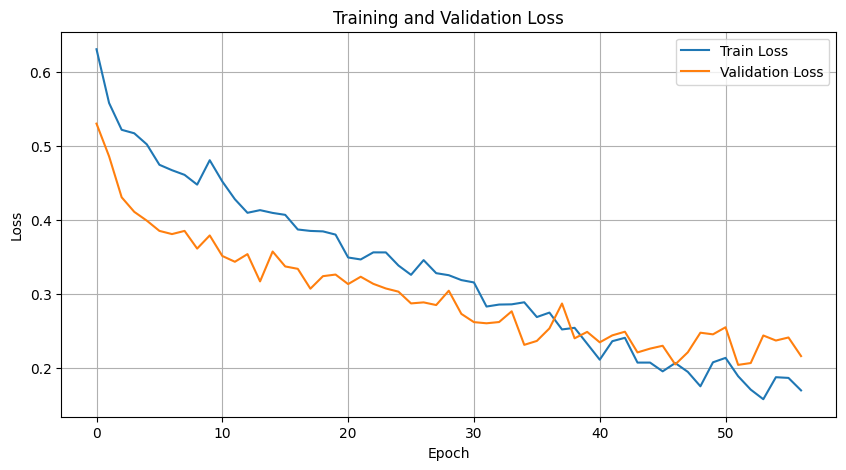

Training Accuracy: 95.1996
Training Precision Scores: [46.48044693 99.85066667]
Training Recall Scores: [96.74418605 95.13211382]
Training F1 Scores: [62.79245283 97.43429612]

Validation Accuracy: 94.0421
Validation Precision Scores: [36.60714286 99.53071672]
Validation Recall Scores: [88.17204301 94.26262626]
Validation F1 Scores: [51.73501577 96.82506744]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 8 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.5091, Val Loss: 0.4553
Early stopping triggered after 25 epochs because no improvements over 10 subsequent epochs!
Epoch 25/100, Train Loss: 0.4523, Val Loss: 0.4013
The function took 171.61 seconds to execute.


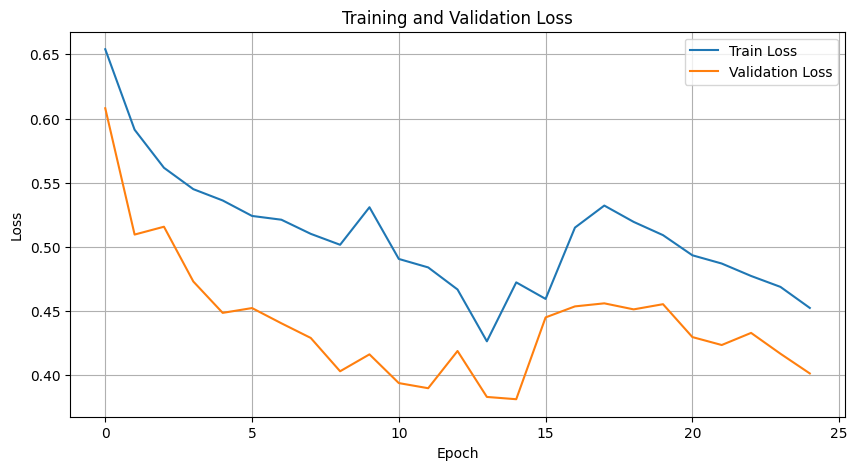

Training Accuracy: 88.0136
Training Precision Scores: [22.12943633 98.73202762]
Training Recall Scores: [73.95348837 88.62804878]
Training F1 Scores: [34.06534547 93.40759385]

Validation Accuracy: 88.5514
Validation Precision Scores: [20.52785924 98.96722048]
Validation Recall Scores: [75.2688172  89.05050505]
Validation F1 Scores: [32.25806452 93.74734156]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 8 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.5027, Val Loss: 0.4288
Epoch 40/100, Train Loss: 0.4555, Val Loss: 0.3999
Epoch 60/100, Train Loss: 0.4093, Val Loss: 0.3962
Epoch 80/100, Train Loss: 0.2993, Val Loss: 0.3113
Epoch 100/100, Train Loss: 0.2190, Val Loss: 0.2351
The function took 803.30 seconds to execute.


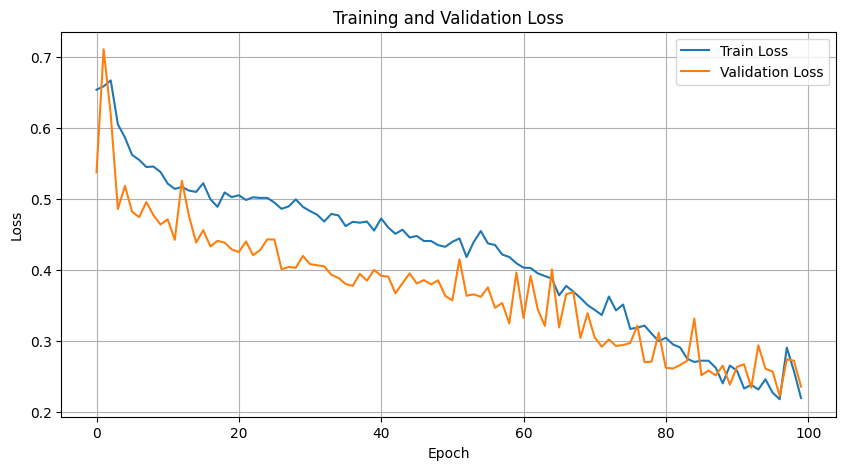

Training Accuracy: 92.0351
Training Precision Scores: [34.12438625 99.85632184]
Training Recall Scores: [96.97674419 91.81910569]
Training F1 Scores: [50.4842615  95.66920796]

Validation Accuracy: 91.1215
Validation Precision Scores: [27.57475083 99.5588884 ]
Validation Recall Scores: [89.24731183 91.19191919]
Validation F1 Scores: [42.1319797  95.19190215]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 8 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Early stopping triggered after 16 epochs because no improvements over 10 subsequent epochs!
Epoch 16/100, Train Loss: 0.5087, Val Loss: 0.4414
The function took 149.36 seconds to execute.


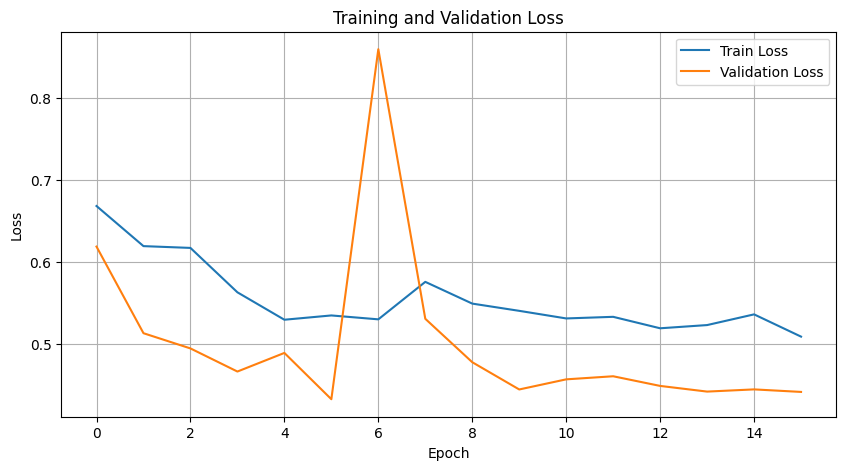

Training Accuracy: 82.7459
Training Precision Scores: [16.00810537 98.62584378]
Training Recall Scores: [73.48837209 83.1504065 ]
Training F1 Scores: [26.28951747 90.22937803]

Validation Accuracy: 82.7492
Validation Precision Scores: [14.71774194 99.03474903]
Validation Recall Scores: [78.49462366 82.90909091]
Validation F1 Scores: [24.78777589 90.25731251]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 8 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.5087, Val Loss: 0.4355
Epoch 40/100, Train Loss: 0.4794, Val Loss: 0.4131
Early stopping triggered after 52 epochs because no improvements over 10 subsequent epochs!
Epoch 52/100, Train Loss: 0.4580, Val Loss: 0.4065
The function took 674.02 seconds to execute.


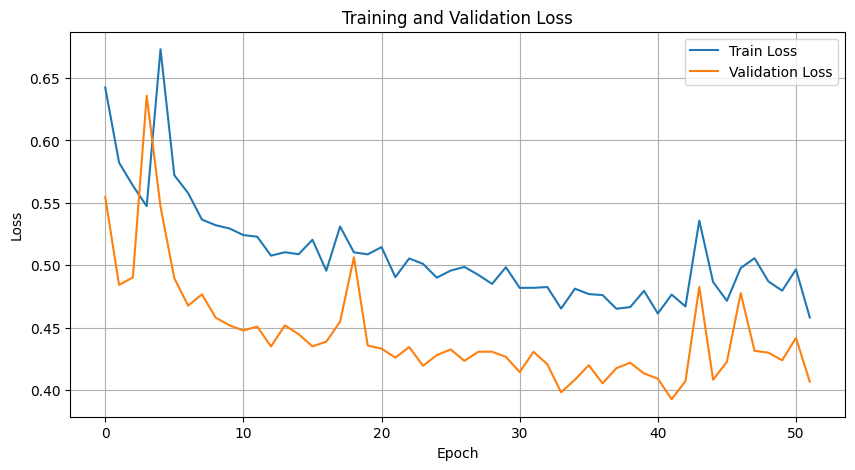

Training Accuracy: 85.2775
Training Precision Scores: [18.17647059 98.58809802]
Training Recall Scores: [71.86046512 85.86382114]
Training F1 Scores: [29.01408451 91.78707224]

Validation Accuracy: 85.4361
Validation Precision Scores: [16.46778043 98.88320149]
Validation Recall Scores: [74.19354839 85.85858586]
Validation F1 Scores: [26.953125   91.91176471]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 16 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.3166, Val Loss: 0.3152
Epoch 40/100, Train Loss: 0.2321, Val Loss: 0.2417
Early stopping triggered after 51 epochs because no improvements over 10 subsequent epochs!
Epoch 51/100, Train Loss: 0.1893, Val Loss: 0.2275
The function took 149.88 seconds to execute.


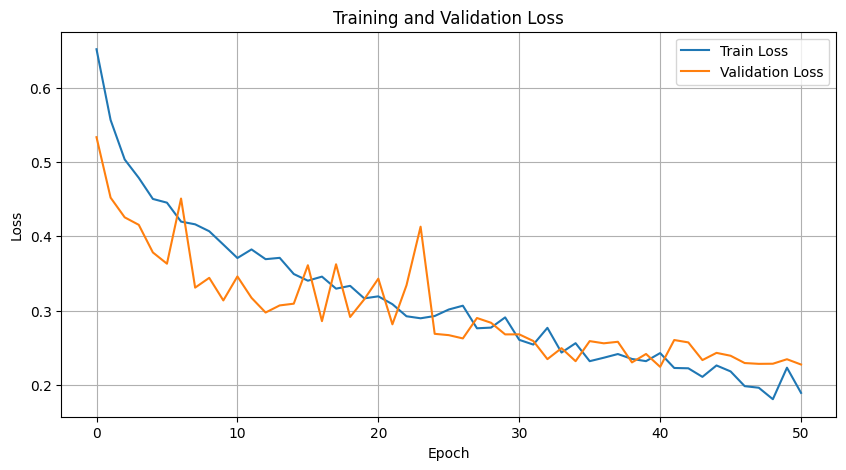

Training Accuracy: 92.1422
Training Precision Scores: [34.27856547 99.79054129]
Training Recall Scores: [95.58139535 91.99186992]
Training F1 Scores: [50.46040516 95.73264238]

Validation Accuracy: 91.9393
Validation Precision Scores: [29.64285714 99.56293706]
Validation Recall Scores: [89.24731183 92.04040404]
Validation F1 Scores: [44.50402145 95.65399958]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 16 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.3062, Val Loss: 0.2841
Early stopping triggered after 26 epochs because no improvements over 10 subsequent epochs!
Epoch 26/100, Train Loss: 0.2738, Val Loss: 0.2806
The function took 78.63 seconds to execute.


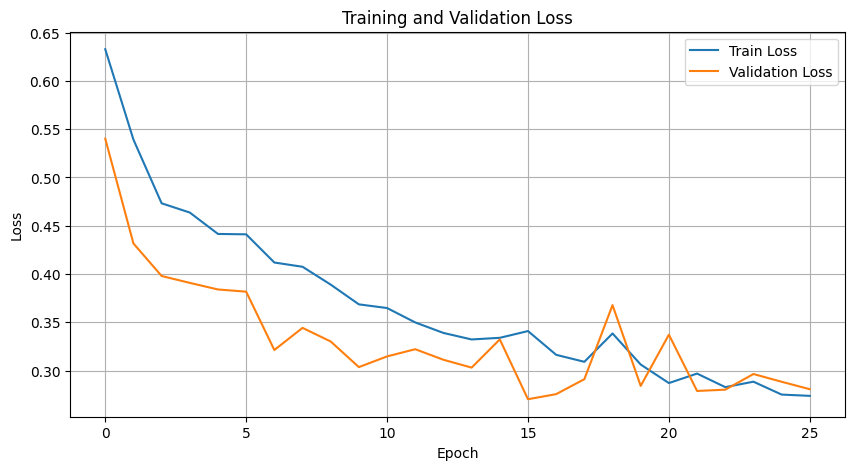

Training Accuracy: 85.1120
Training Precision Scores: [20.9413009  99.59422365]
Training Recall Scores: [92.09302326 84.80691057]
Training F1 Scores: [34.12322275 91.60766233]

Validation Accuracy: 85.2804
Validation Precision Scores: [18.26280624 99.48088721]
Validation Recall Scores: [88.17204301 85.17171717]
Validation F1 Scores: [30.25830258 91.77187636]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 16 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.3060, Val Loss: 0.2644
Epoch 40/100, Train Loss: 0.1650, Val Loss: 0.2089
Early stopping triggered after 43 epochs because no improvements over 10 subsequent epochs!
Epoch 43/100, Train Loss: 0.1599, Val Loss: 0.2396
The function took 171.90 seconds to execute.


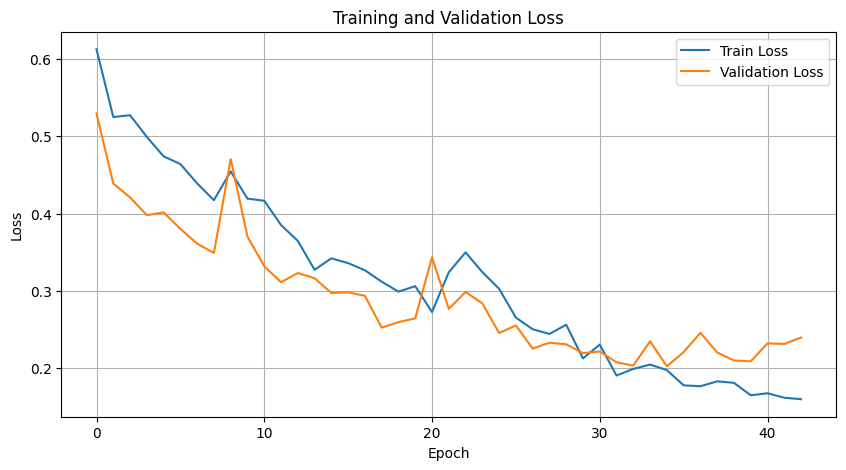

Training Accuracy: 94.1967
Training Precision Scores: [41.51329243 99.7417133 ]
Training Recall Scores: [94.41860465 94.18699187]
Training F1 Scores: [57.67045455 96.88480033]

Validation Accuracy: 94.0031
Validation Precision Scores: [36.44444444 99.53051643]
Validation Recall Scores: [88.17204301 94.22222222]
Validation F1 Scores: [51.57232704 96.80365297]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 16 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.3140, Val Loss: 0.2787
Epoch 40/100, Train Loss: 0.1474, Val Loss: 0.2000
Early stopping triggered after 52 epochs because no improvements over 10 subsequent epochs!
Epoch 52/100, Train Loss: 0.0984, Val Loss: 0.2022
The function took 358.10 seconds to execute.


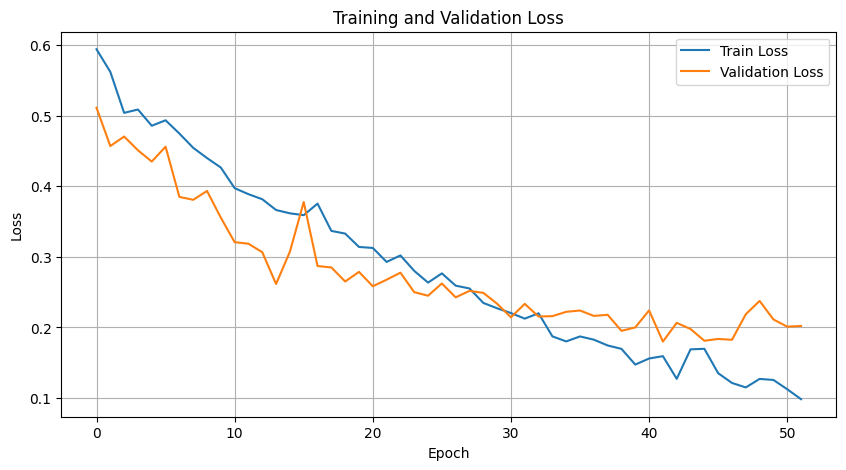

Training Accuracy: 93.9241
Training Precision Scores: [40.65510597 99.91334489]
Training Recall Scores: [98.13953488 93.7398374 ]
Training F1 Scores: [57.49318801 96.72818792]

Validation Accuracy: 93.1075
Validation Precision Scores: [33.72093023 99.74025974]
Validation Recall Scores: [93.5483871  93.09090909]
Validation F1 Scores: [49.57264957 96.30094044]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 16 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.4525, Val Loss: 0.4901
Early stopping triggered after 25 epochs because no improvements over 10 subsequent epochs!
Epoch 25/100, Train Loss: 0.4379, Val Loss: 0.3920
The function took 201.75 seconds to execute.


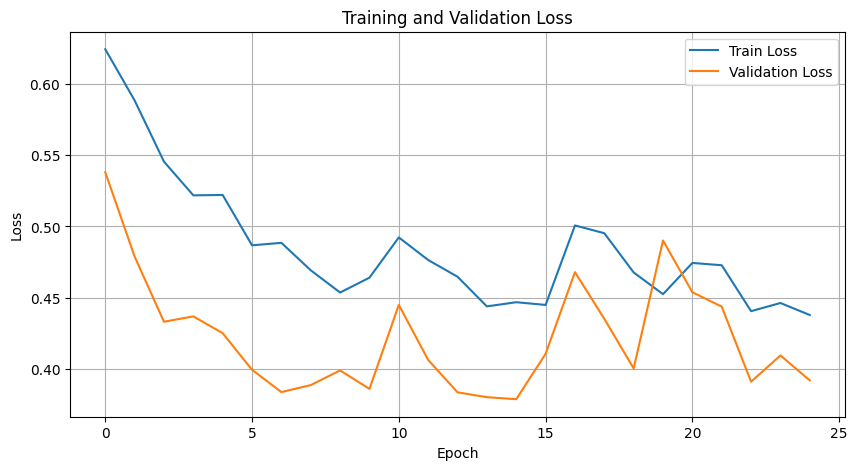

Training Accuracy: 93.0380
Training Precision Scores: [33.17591499 98.4187626 ]
Training Recall Scores: [65.34883721 94.24796748]
Training F1 Scores: [44.00939702 96.28822094]

Validation Accuracy: 93.1075
Validation Precision Scores: [29.61165049 98.64521592]
Validation Recall Scores: [65.59139785 94.14141414]
Validation F1 Scores: [40.80267559 96.34070705]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 16 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.3163, Val Loss: 0.2705
Epoch 40/100, Train Loss: 0.1231, Val Loss: 0.2299
Early stopping triggered after 46 epochs because no improvements over 10 subsequent epochs!
Epoch 46/100, Train Loss: 0.0880, Val Loss: 0.2738
The function took 428.64 seconds to execute.


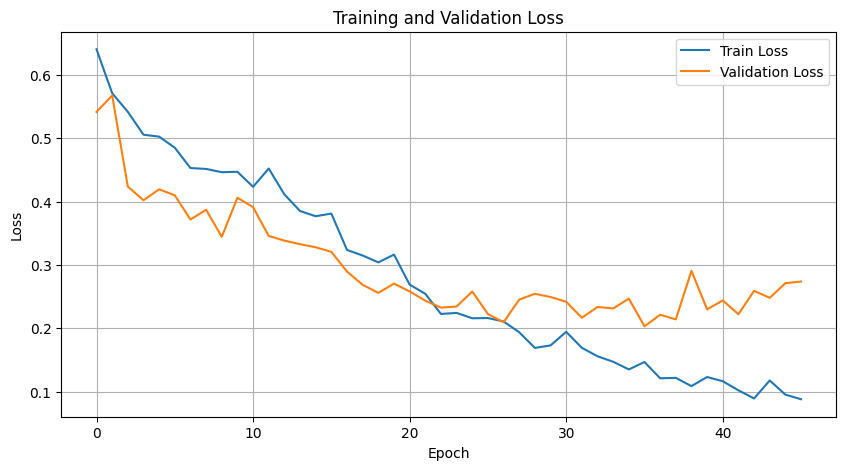

Training Accuracy: 95.9591
Training Precision Scores: [50.89820359 99.94700583]
Training Recall Scores: [98.8372093  95.83333333]
Training F1 Scores: [67.19367589 97.84695201]

Validation Accuracy: 95.2103
Validation Precision Scores: [42.42424242 99.62025316]
Validation Recall Scores: [90.32258065 95.39393939]
Validation F1 Scores: [57.73195876 97.46130031]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 16 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.4553, Val Loss: 0.4246
Epoch 40/100, Train Loss: 0.3181, Val Loss: 0.3209
Epoch 60/100, Train Loss: 0.2522, Val Loss: 0.2788
Early stopping triggered after 78 epochs because no improvements over 10 subsequent epochs!
Epoch 78/100, Train Loss: 0.1235, Val Loss: 0.2309
The function took 1010.80 seconds to execute.


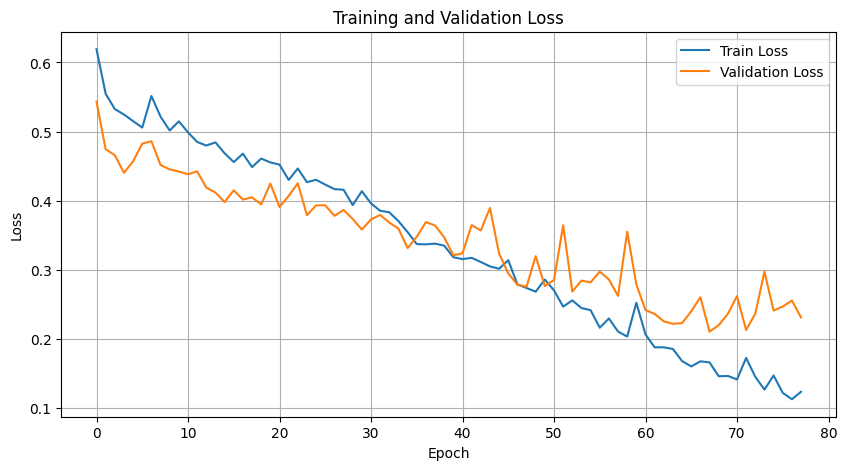

Training Accuracy: 95.6280
Training Precision Scores: [48.89663182 99.9043469 ]
Training Recall Scores: [97.90697674 95.52845528]
Training F1 Scores: [65.2207591  97.66741129]

Validation Accuracy: 94.5093
Validation Precision Scores: [38.46153846 99.44915254]
Validation Recall Scores: [86.02150538 94.82828283]
Validation F1 Scores: [53.15614618 97.08376422]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 32 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.2005, Val Loss: 0.2378
Epoch 40/100, Train Loss: 0.1220, Val Loss: 0.2017
Early stopping triggered after 52 epochs because no improvements over 10 subsequent epochs!
Epoch 52/100, Train Loss: 0.0898, Val Loss: 0.2328
The function took 157.13 seconds to execute.


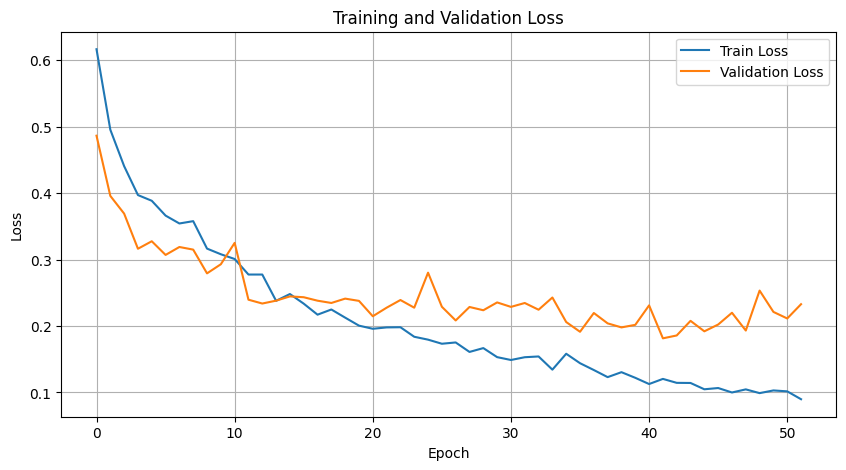

Training Accuracy: 95.5794
Training Precision Scores: [48.63013699 99.95741963]
Training Recall Scores: [99.06976744 95.42682927]
Training F1 Scores: [65.237366   97.63959655]

Validation Accuracy: 94.4704
Validation Precision Scores: [38.60465116 99.57501062]
Validation Recall Scores: [89.24731183 94.66666667]
Validation F1 Scores: [53.8961039  97.05882353]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 32 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Early stopping triggered after 18 epochs because no improvements over 10 subsequent epochs!
Epoch 18/100, Train Loss: 0.2937, Val Loss: 0.3128
The function took 73.48 seconds to execute.


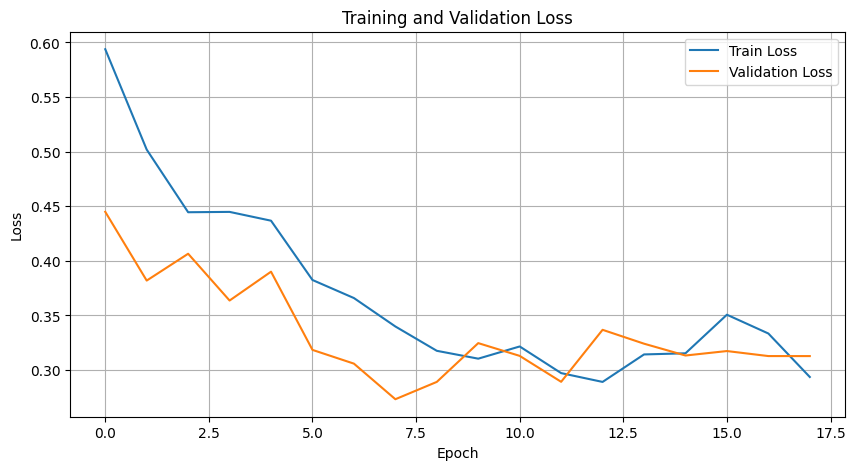

Training Accuracy: 86.8647
Training Precision Scores: [22.56716418 99.39499709]
Training Recall Scores: [87.90697674 86.81910569]
Training F1 Scores: [35.91448931 92.68239761]

Validation Accuracy: 86.9159
Validation Precision Scores: [20.4379562  99.58275382]
Validation Recall Scores: [90.32258065 86.78787879]
Validation F1 Scores: [33.33333333 92.74611399]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 32 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.1932, Val Loss: 0.2361
Early stopping triggered after 32 epochs because no improvements over 10 subsequent epochs!
Epoch 32/100, Train Loss: 0.0912, Val Loss: 0.2201
The function took 223.26 seconds to execute.


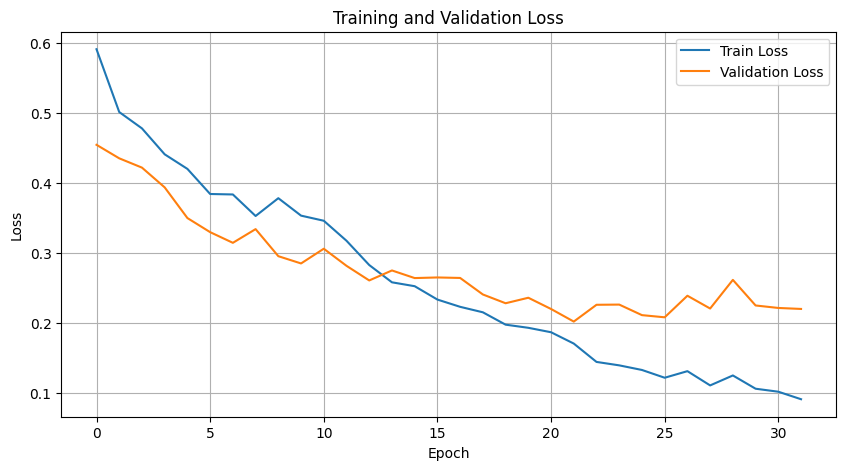

Training Accuracy: 94.4693
Training Precision Scores: [42.87190083 99.83874436]
Training Recall Scores: [96.51162791 94.3800813 ]
Training F1 Scores: [59.37052933 97.03270296]

Validation Accuracy: 93.9642
Validation Precision Scores: [35.77981651 99.36170213]
Validation Recall Scores: [83.87096774 94.34343434]
Validation F1 Scores: [50.1607717  96.78756477]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 32 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.2262, Val Loss: 0.2047
Early stopping triggered after 30 epochs because no improvements over 10 subsequent epochs!
Epoch 30/100, Train Loss: 0.1225, Val Loss: 0.2249
The function took 242.58 seconds to execute.


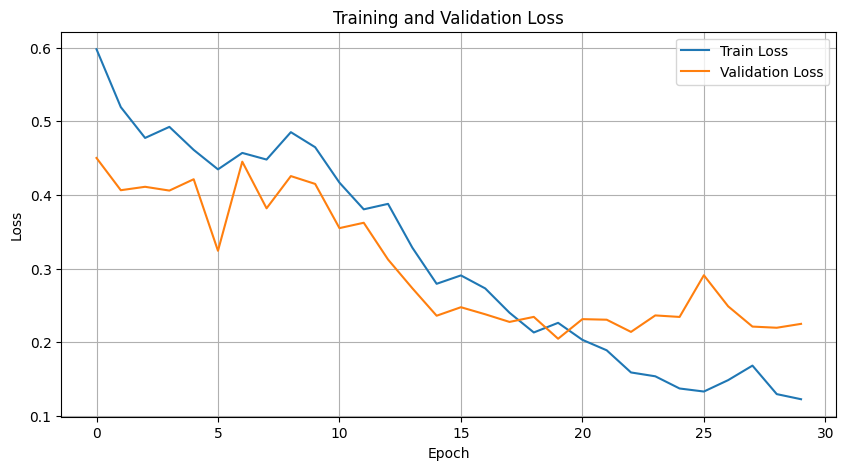

Training Accuracy: 92.9114
Training Precision Scores: [36.69642857 99.79234973]
Training Recall Scores: [95.58139535 92.79471545]
Training F1 Scores: [53.03225806 96.16640337]

Validation Accuracy: 92.2897
Validation Precision Scores: [30.48327138 99.5215311 ]
Validation Recall Scores: [88.17204301 92.44444444]
Validation F1 Scores: [45.3038674  95.85253456]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 32 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.1668, Val Loss: 0.2438
Early stopping triggered after 34 epochs because no improvements over 10 subsequent epochs!
Epoch 34/100, Train Loss: 0.1096, Val Loss: 0.2268
The function took 318.18 seconds to execute.


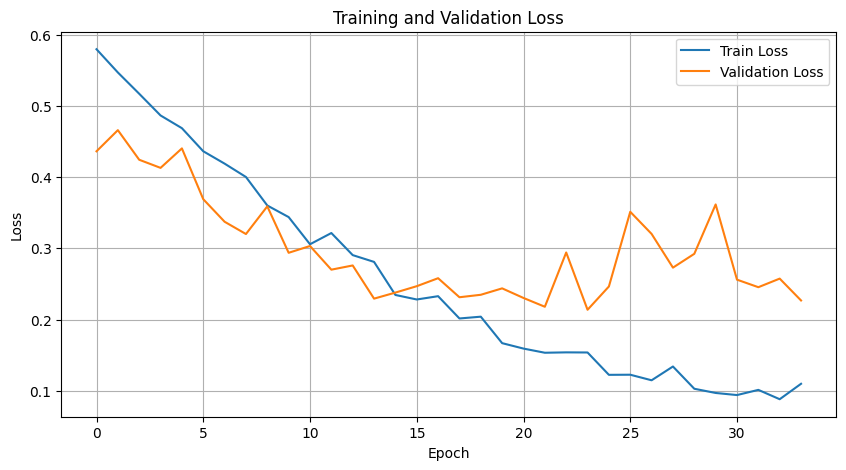

Training Accuracy: 94.3525
Training Precision Scores: [42.42424242 99.89224138]
Training Recall Scores: [97.6744186  94.20731707]
Training F1 Scores: [59.15492958 96.9665272 ]

Validation Accuracy: 94.0031
Validation Precision Scores: [36.56387665 99.57283212]
Validation Recall Scores: [89.24731183 94.18181818]
Validation F1 Scores: [51.875      96.80232558]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 32 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.3856, Val Loss: 0.3260
Early stopping triggered after 40 epochs because no improvements over 10 subsequent epochs!
Epoch 40/100, Train Loss: 0.1792, Val Loss: 0.3007
The function took 519.66 seconds to execute.


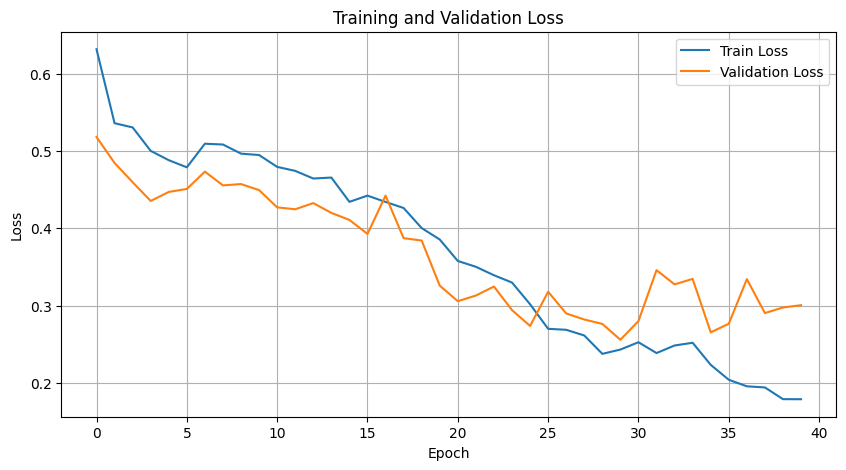

Training Accuracy: 93.1159
Training Precision Scores: [37.21144968 99.70610645]
Training Recall Scores: [93.72093023 93.08943089]
Training F1 Scores: [53.27164574 96.28422768]

Validation Accuracy: 93.0685
Validation Precision Scores: [32.21757322 99.31300988]
Validation Recall Scores: [82.79569892 93.45454545]
Validation F1 Scores: [46.38554217 96.29475437]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 64 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.1324, Val Loss: 0.2169
Early stopping triggered after 21 epochs because no improvements over 10 subsequent epochs!
Epoch 21/100, Train Loss: 0.1151, Val Loss: 0.2434
The function took 87.83 seconds to execute.


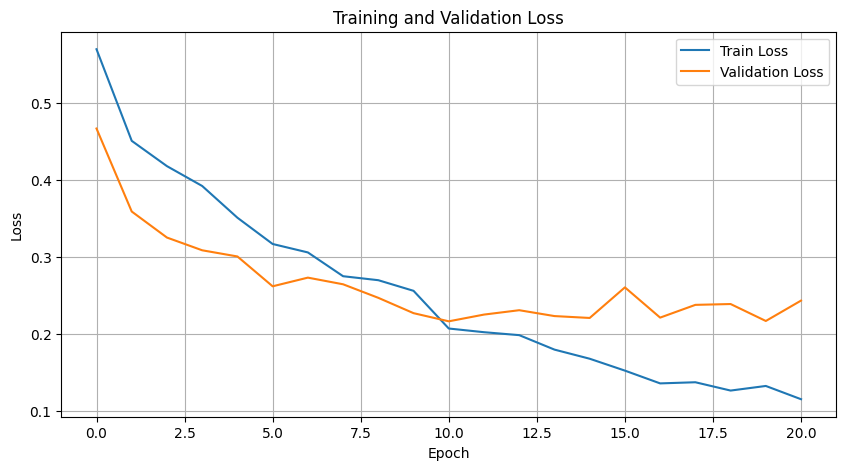

Training Accuracy: 91.1198
Training Precision Scores: [31.57492355 99.8103102 ]
Training Recall Scores: [96.04651163 90.90447154]
Training F1 Scores: [47.52589183 95.14945219]

Validation Accuracy: 91.5109
Validation Precision Scores: [28.37370242 99.51733216]
Validation Recall Scores: [88.17204301 91.63636364]
Validation F1 Scores: [42.93193717 95.41438788]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 64 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.1133, Val Loss: 0.2212
Early stopping triggered after 33 epochs because no improvements over 10 subsequent epochs!
Epoch 33/100, Train Loss: 0.0608, Val Loss: 0.3591
The function took 229.79 seconds to execute.


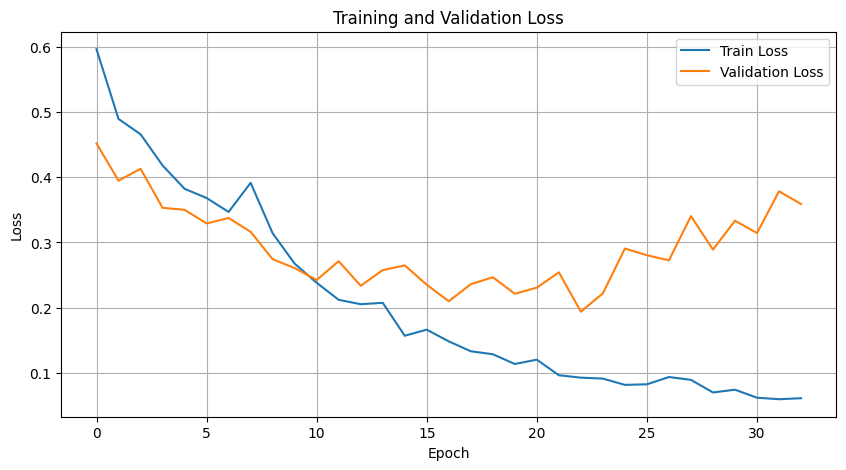

Training Accuracy: 95.9007
Training Precision Scores: [50.53380783 99.95756869]
Training Recall Scores: [99.06976744 95.76219512]
Training F1 Scores: [66.92851532 97.8149167 ]

Validation Accuracy: 94.8209
Validation Precision Scores: [40.0990099  99.49281488]
Validation Recall Scores: [87.09677419 95.11111111]
Validation F1 Scores: [54.91525424 97.25263375]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 64 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.1280, Val Loss: 0.3198
Early stopping triggered after 25 epochs because no improvements over 10 subsequent epochs!
Epoch 25/100, Train Loss: 0.0847, Val Loss: 0.3222
The function took 203.29 seconds to execute.


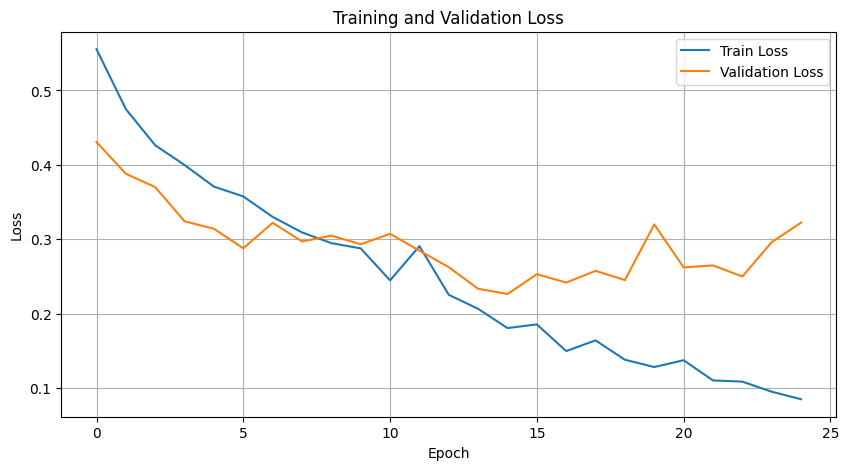

Training Accuracy: 94.3817
Training Precision Scores: [42.56825076 99.90302769]
Training Recall Scores: [97.90697674 94.22764228]
Training F1 Scores: [59.33756166 96.9823754 ]

Validation Accuracy: 93.6137
Validation Precision Scores: [34.63203463 99.44373128]
Validation Recall Scores: [86.02150538 93.8989899 ]
Validation F1 Scores: [49.38271605 96.5918537 ]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 64 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.1103, Val Loss: 0.3099
Early stopping triggered after 32 epochs because no improvements over 10 subsequent epochs!
Epoch 32/100, Train Loss: 0.0568, Val Loss: 0.4732
The function took 299.46 seconds to execute.


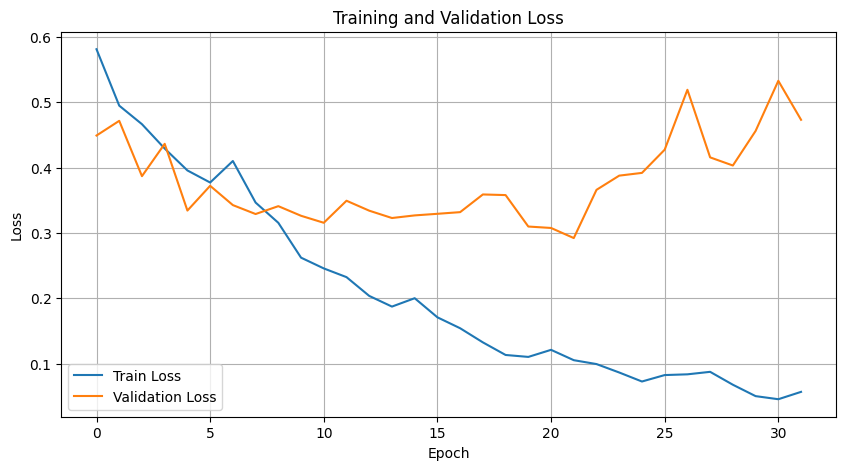

Training Accuracy: 96.1636
Training Precision Scores: [52.200489   99.96826069]
Training Recall Scores: [99.30232558 96.02642276]
Training F1 Scores: [68.42948718 97.95770267]

Validation Accuracy: 95.0156
Validation Precision Scores: [41.02564103 99.45217025]
Validation Recall Scores: [86.02150538 95.35353535]
Validation F1 Scores: [55.55555556 97.35973597]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 64 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.1158, Val Loss: 0.2760
Early stopping triggered after 27 epochs because no improvements over 10 subsequent epochs!
Epoch 27/100, Train Loss: 0.0781, Val Loss: 0.2489
The function took 351.50 seconds to execute.


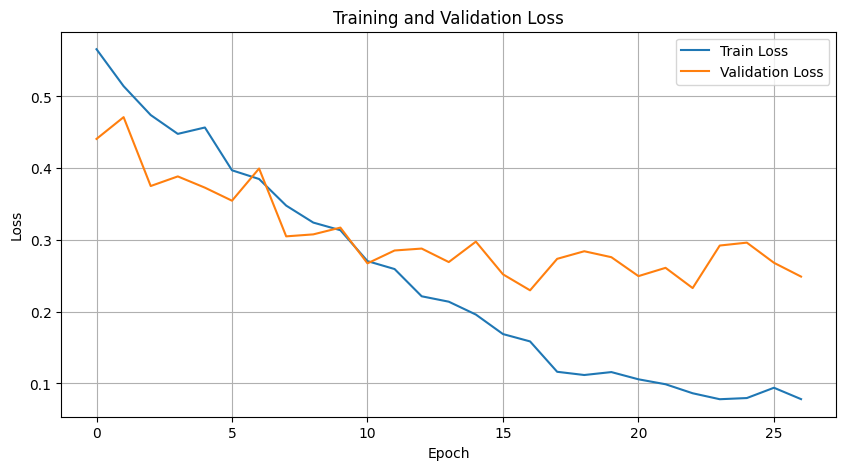

Training Accuracy: 95.3651
Training Precision Scores: [47.40406321 99.89343564]
Training Recall Scores: [97.6744186  95.26422764]
Training F1 Scores: [63.82978723 97.52392842]

Validation Accuracy: 94.5093
Validation Precision Scores: [38.67924528 99.53310696]
Validation Recall Scores: [88.17204301 94.74747475]
Validation F1 Scores: [53.7704918  97.08134962]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 128 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Early stopping triggered after 20 epochs because no improvements over 10 subsequent epochs!
Epoch 20/100, Train Loss: 0.0747, Val Loss: 0.3121
The function took 139.32 seconds to execute.


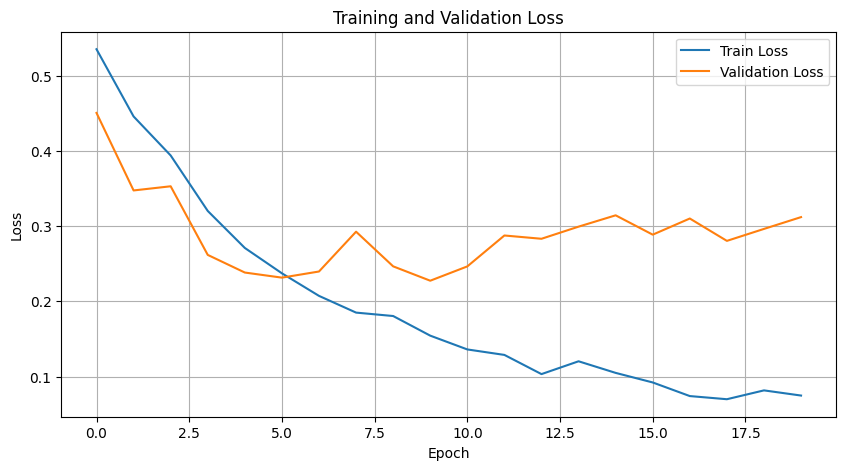

Training Accuracy: 93.7488
Training Precision Scores: [39.98109641 99.92401216]
Training Recall Scores: [98.37209302 93.54674797]
Training F1 Scores: [56.85483871 96.63027504]

Validation Accuracy: 92.8349
Validation Precision Scores: [31.72690763 99.3962915 ]
Validation Recall Scores: [84.94623656 93.13131313]
Validation F1 Scores: [46.19883041 96.161869  ]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 128 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.0726, Val Loss: 0.2646
Early stopping triggered after 21 epochs because no improvements over 10 subsequent epochs!
Epoch 21/100, Train Loss: 0.0700, Val Loss: 0.2781
The function took 170.19 seconds to execute.


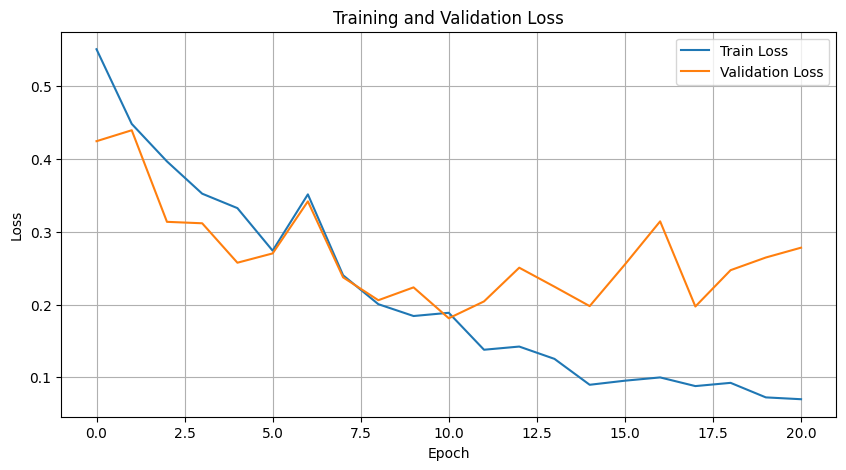

Training Accuracy: 94.6446
Training Precision Scores: [43.68421053 99.83905579]
Training Recall Scores: [96.51162791 94.56300813]
Training F1 Scores: [60.14492754 97.12943633]

Validation Accuracy: 93.7305
Validation Precision Scores: [35.59322034 99.61406518]
Validation Recall Scores: [90.32258065 93.85858586]
Validation F1 Scores: [51.06382979 96.6507177 ]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 128 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.0750, Val Loss: 0.2874
Early stopping triggered after 23 epochs because no improvements over 10 subsequent epochs!
Epoch 23/100, Train Loss: 0.0578, Val Loss: 0.3331
The function took 217.04 seconds to execute.


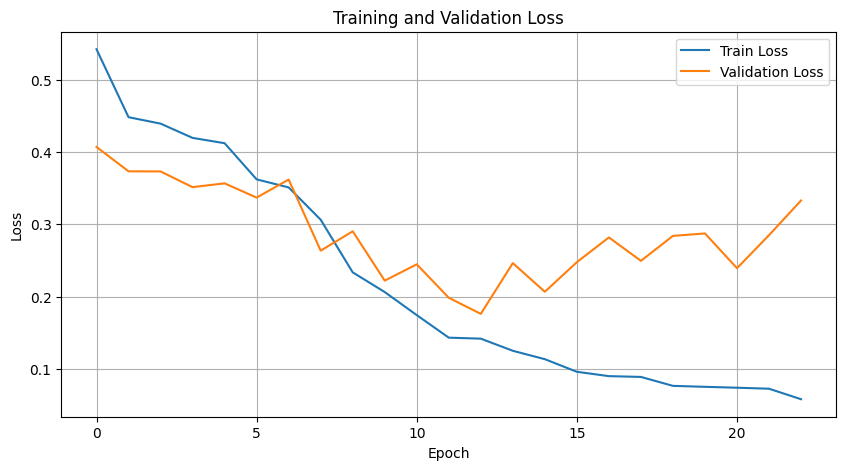

Training Accuracy: 93.7001
Training Precision Scores: [39.81220657 99.93481803]
Training Recall Scores: [98.60465116 93.48577236]
Training F1 Scores: [56.72240803 96.60278288]

Validation Accuracy: 93.3022
Validation Precision Scores: [34.26294821 99.6978852 ]
Validation Recall Scores: [92.47311828 93.33333333]
Validation F1 Scores: [50.         96.41068447]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 128 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.1297, Val Loss: 0.3066
Early stopping triggered after 32 epochs because no improvements over 10 subsequent epochs!
Epoch 32/100, Train Loss: 0.0745, Val Loss: 0.3719
The function took 421.73 seconds to execute.


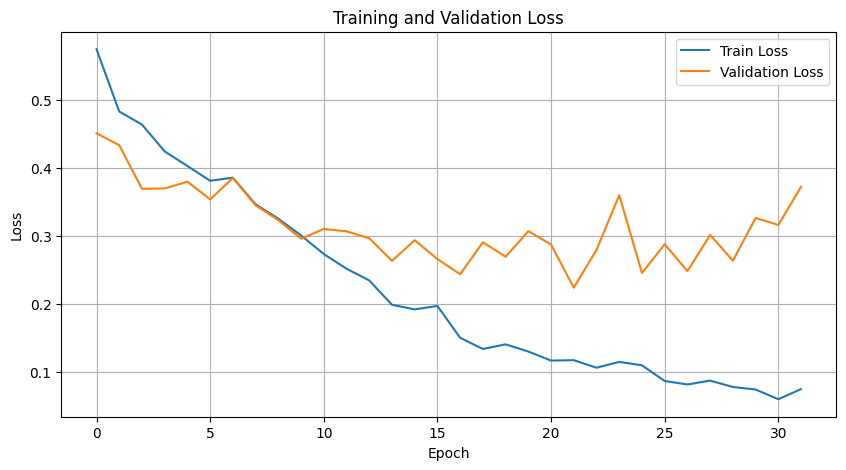

Training Accuracy: 96.8744
Training Precision Scores: [57.47599451 99.8847081 ]
Training Recall Scores: [97.44186047 96.8495935 ]
Training F1 Scores: [72.30371009 98.34373871]

Validation Accuracy: 96.1059
Validation Precision Scores: [47.85276074 99.37629938]
Validation Recall Scores: [83.87096774 96.56565657]
Validation F1 Scores: [60.9375     97.95081967]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 256 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Early stopping triggered after 18 epochs because no improvements over 10 subsequent epochs!
Epoch 18/100, Train Loss: 0.0536, Val Loss: 0.3013
The function took 150.94 seconds to execute.


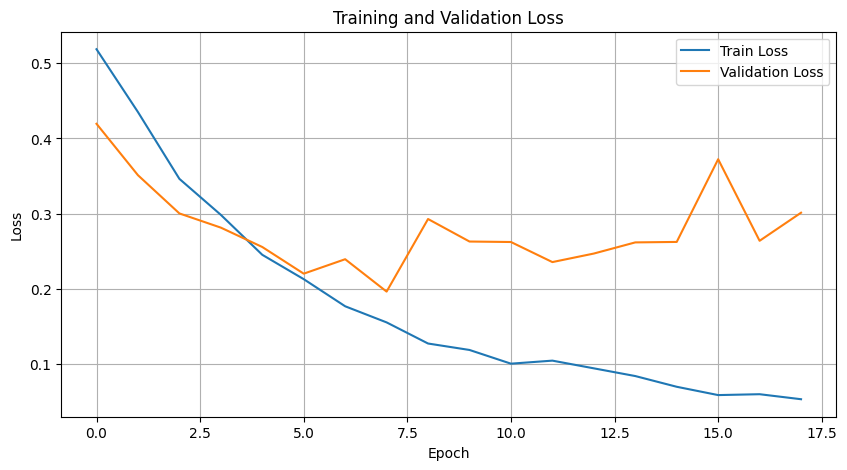

Training Accuracy: 92.1227
Training Precision Scores: [34.42892358 99.87849332]
Training Recall Scores: [97.44186047 91.8902439 ]
Training F1 Scores: [50.88038859 95.71799079]

Validation Accuracy: 91.6667
Validation Precision Scores: [29.06574394 99.60508995]
Validation Recall Scores: [90.32258065 91.71717172]
Validation F1 Scores: [43.97905759 95.49852756]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 256 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Early stopping triggered after 20 epochs because no improvements over 10 subsequent epochs!
Epoch 20/100, Train Loss: 0.0398, Val Loss: 0.4037
The function took 195.21 seconds to execute.


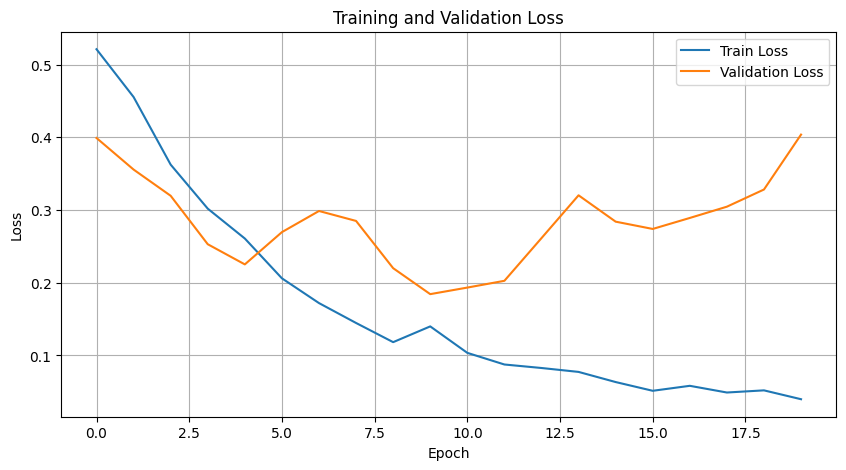

Training Accuracy: 95.9494
Training Precision Scores: [50.84541063 99.90468121]
Training Recall Scores: [97.90697674 95.86382114]
Training F1 Scores: [66.93163752 97.84254745]

Validation Accuracy: 94.9377
Validation Precision Scores: [40.7960199  99.53527672]
Validation Recall Scores: [88.17204301 95.19191919]
Validation F1 Scores: [55.78231293 97.31515903]

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 256 and hidden dim 512


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.0408, Val Loss: 0.3947
Early stopping triggered after 25 epochs because no improvements over 10 subsequent epochs!
Epoch 25/100, Train Loss: 0.0339, Val Loss: 0.4991
The function took 339.62 seconds to execute.


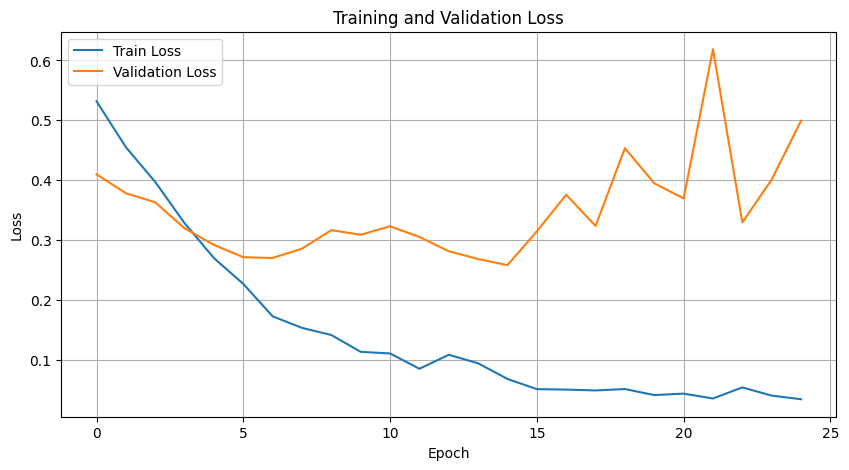

Training Accuracy: 97.8384
Training Precision Scores: [66.19937695 99.94806813]
Training Recall Scores: [98.8372093  97.79471545]
Training F1 Scores: [79.29104478 98.85966715]

Validation Accuracy: 96.5343
Validation Precision Scores: [51.2987013  99.42004971]
Validation Recall Scores: [84.94623656 96.96969697]
Validation F1 Scores: [63.96761134 98.17958683]



In [26]:
train_dataset = TimeSeriesDataset(X_train, y_train)
val_dataset = TimeSeriesDataset(X_val, y_val)
test_dataset = TimeSeriesDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=64, collate_fn=collate_fn,shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=64, collate_fn=collate_fn, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=64, collate_fn=collate_fn, shuffle=False)

embedding_sizes = [4,8,16,32,64,128,256]
hidden_dims = [8,16,32,64,128,256,320,384,512]

for i in range(len(embedding_sizes)):
    for j in range(i,len(hidden_dims)):
        embedding_size=embedding_sizes[i]
        hidden_size=hidden_dims[j]
        print("-------------------------------------------------------------------------")
        print("-------------------------------------------------------------------------")
        print("-------------------------------------------------------------------------")
        print(f"Trying with embedding size {embedding_size} and hidden dim {hidden_dim}")

        vocabulary_size = len(vectorizer.vocabulary_) + 2  # Add 2 for out-of-vocabulary and padding
        output_size = 2

        model = LSTMClassifier(vocabulary_size, embedding_size, hidden_size, output_size)
        model = model.to(device)
        
        class_weight = compute_class_weight(class_weight='balanced', classes=np.unique(y_train), y=y_train)  # Computing class weights
        class_weight_tensor = torch.tensor(class_weight, dtype=torch.float32).to(device)  # Converting to PyTorch tensor
        criterion = nn.CrossEntropyLoss(weight=class_weight_tensor)
        
        optimizer = optim.AdamW(model.parameters(), lr=0.001, weight_decay=0.01)
        num_epochs = 100
        training_loop(model, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, criterion, num_epochs)
        
        train_accuracy, train_precisionscores, train_recallscores, train_f1scores, _, _ = testing_model(model,train_loader,device)
        val_accuracy, val_precisionscores, val_recallscores, val_f1scores, _, _ = testing_model(model,val_loader,device)
        
        stats(train_accuracy, train_precisionscores, train_recallscores, train_f1scores, 'Training')
        stats(val_accuracy, val_precisionscores, val_recallscores, val_f1scores, 'Validation')


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 20/100, Train Loss: 0.4789, Val Loss: 0.3905
Epoch 40/100, Train Loss: 0.4123, Val Loss: 0.3309
Epoch 60/100, Train Loss: 0.1518, Val Loss: 0.2850
Early stopping triggered after 61 epochs because no improvements over 10 subsequent epochs!
Epoch 61/100, Train Loss: 0.1539, Val Loss: 0.2404
The function took 787.23 seconds to execute.


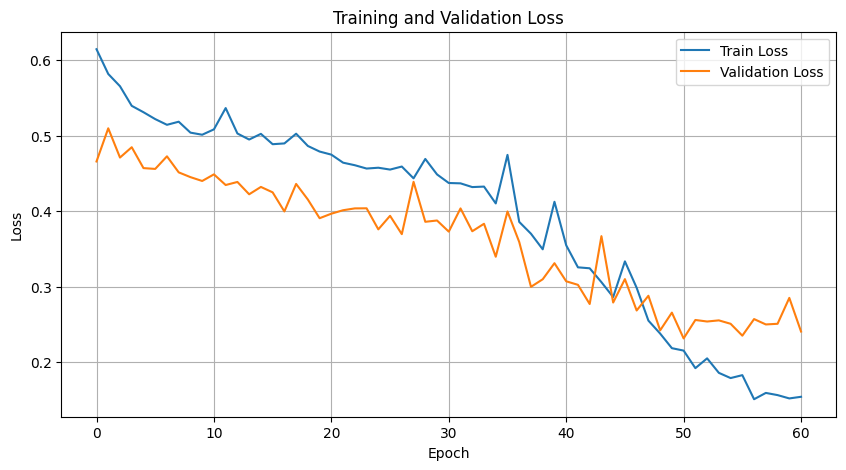

Test Accuracy: 91.9445
Test Precision Scores: [27.734375   99.43777541]
Test Recall Scores: [85.2        92.18199746]
Test F1 Scores: [41.84675835 95.67251462]



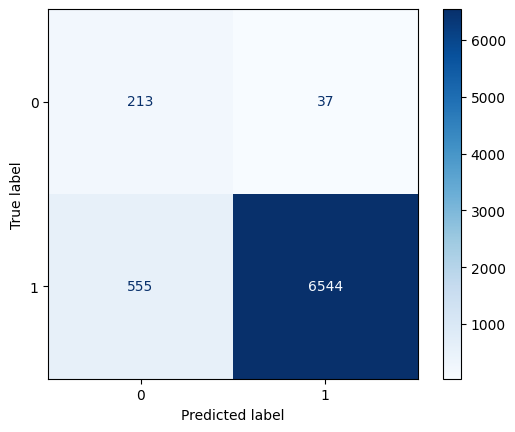

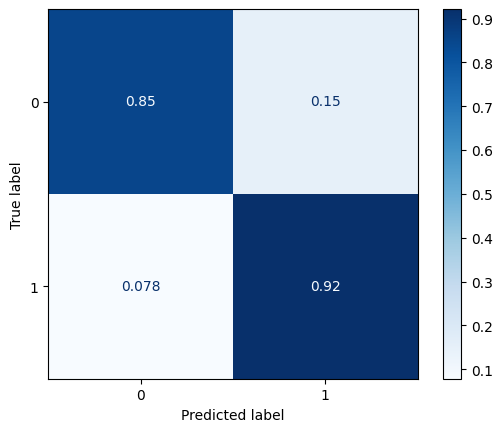

In [18]:
#16 and hidden dim 512

train_dataset = TimeSeriesDataset(X_train, y_train)
val_dataset = TimeSeriesDataset(X_val, y_val)
test_dataset = TimeSeriesDataset(X_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=64, collate_fn=collate_fn,shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=64, collate_fn=collate_fn, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=64, collate_fn=collate_fn, shuffle=False)

embedding_size=16
hidden_dim=512

vocabulary_size = len(vectorizer.vocabulary_) + 2  # Add 2 for out-of-vocabulary and padding
output_size = 2

model = LSTMClassifier(vocabulary_size, embedding_size, hidden_dim, output_size)
model = model.to(device)

class_weight = compute_class_weight(class_weight='balanced', classes=np.unique(y_train), y=y_train)  # Computing class weights
class_weight_tensor = torch.tensor(class_weight, dtype=torch.float32).to(device)  # Converting to PyTorch tensor
criterion = nn.CrossEntropyLoss(weight=class_weight_tensor)

optimizer = optim.AdamW(model.parameters(), lr=0.001, weight_decay=0.01)
num_epochs = 100
training_loop(model, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, criterion, num_epochs)

test_accuracy, test_precisionscores, test_recallscores, test_f1scores, all_labels_test, all_predictions_test = testing_model(model,test_loader,device)
stats(test_accuracy, test_precisionscores, test_recallscores, test_f1scores, 'Test')
ConfusionMatrixDisplay.from_predictions(all_labels_test, all_predictions_test, cmap='Blues')
ConfusionMatrixDisplay.from_predictions(all_labels_test, all_predictions_test, normalize='true', cmap='Blues')

# Task 4: GNN

In [4]:
from datetime import time
import numpy as np
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import accuracy_score, precision_score, f1_score, recall_score, ConfusionMatrixDisplay
import torch
from sklearn.model_selection import train_test_split
from torch import nn, optim
from tqdm.notebook import tqdm
import time
!pip install torch_geometric
from torch_geometric.data import Data, Dataset
from sklearn.preprocessing import OneHotEncoder
import matplotlib.pyplot as plt
from torch_geometric.nn import GCNConv, SAGEConv, GATConv, global_mean_pool
import torch.nn.functional as F
import torch_geometric
from sklearn.utils.class_weight import compute_class_weight
import networkx as nx
import random

# Set seeds
seed = 69
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

# Set GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"The device is set to: {device}")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.1/63.1 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 29.4 MB/s eta 0:00:0000:01
The device is set to: cuda


In [5]:
def seq_to_edge_lists(seq):
    """
    Dato seq = [c0, c1, …, cN-1], costruisce:
      sources = [m(c0), m(c1), …, m(cN-2)]
      dests   = [m(c1), m(c2), …, m(cN-1)]
    dove m(x) è l'indice interno assegnato in ordine di prima apparizione.

    Esempio:
      seq = [3,7,1,3,1,3,2]
      mapping = {3:0, 7:1, 1:2, 2:3}
      sources  = [0,1,2,0,2,0]
      dests    = [1,2,0,2,0,3]
    """
    mapping = {}     # comando_originale -> nuovo_indice
    next_id = 0

    # 1) Crea la mappatura comando->indice
    for cmd in seq:
        if cmd not in mapping:
            mapping[cmd] = next_id
            next_id += 1

    # 2) Costruisci le liste di archi (consecutive pairs)
    sources = []
    dests   = []
    for u, v in zip(seq, seq[1:]):  # zip(seq, seq[1:]) è equivalente a fare for i in range(len(seq) - 1) e prendere u = seq[i] e v = seq[i + 1]
        sources.append(mapping[u])
        dests.append(mapping[v])

    return sources, dests

class GraphDataset(Dataset):
    def __init__(self, data, labels, embedds):
        """
        Initialize dataset by pre-processing all graphs into PyG `Data` format.

        Args:
            data (list of np.array): List of sequences.
            labels (list of int): List of graph labels.
            embeds embedding created outside.
        """
        super().__init__()
        self.graphs = []  # Store processed graphs

        # Create embedding layer with the given vocabulary size and embedding size
        self.embedding_layer = embedds

        for i in range(len(data)):
            # Convert adjacency matrix to edge index
            edge_index = seq_to_edge_lists(data[i])  # shape = (2, E)
            edge_index = torch.tensor(edge_index, dtype=torch.long)

            # Convert node features to embeddings
            x = torch.tensor(data[i], dtype=torch.long)  # Node feature indices
            x = self.embedding_layer(x)  # Convert indices to embeddings
            # Ensure `y` is a single integer label
            #y = torch.tensor(labels[i].nonzero()[0], dtype=torch.long).unsqueeze(0)  # Class index of the graph
            # labels[i].nonzero()[0] to encode the label from a one-hot-encoding representation into a numerical version
            y = labels[i].nonzero()[0].clone().detach().to(dtype=torch.long).unsqueeze(0)


            # Create Data object and store it
            self.graphs.append(Data(x=x, edge_index=edge_index, y=y))

    def len(self):
        return len(self.graphs)

    def get(self, idx):
        return self.graphs[idx]  # Return a pre-processed graph

## Preprocessing

In [6]:
data_1 = pd.read_json("/kaggle/input/lab22222/train.json").drop(columns='md5hash')
data_2 = pd.read_json("/kaggle/input/lab22222/test.json").drop(columns='md5hash')

previous_length = len(data_1)
data_1 = data_1.drop_duplicates(subset=["api_call_sequence"])
print(f"Removed {previous_length - len(data_1)} duplicates \nDataset length: {len(data_1)}")

previous_length = len(data_2)
data_2 = data_2.drop_duplicates(subset=["api_call_sequence"])
print(f"Removed {previous_length - len(data_2)} duplicates \nDataset length: {len(data_2)}")

X = data_1.iloc[:, :-1].values # Remove label column
X = [x[0] for x in X]
y = data_1.iloc[:, -1].values
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=seed)  # 80% of the data is used for training
X_test = data_2.iloc[:, :-1].values # Remove label column
X_test = [x[0] for x in X_test]
y_test = data_2.iloc[:, -1].values

X_train_str = [str(x) for x in X_train]
vectorizer = CountVectorizer()

# Computing the matrix representing the words contained in each api sequence
document_term_matrix_training = vectorizer.fit_transform(X_train_str)  # The vocabulary is computed on the training set and is used to compute the matrix for the other datasets

# Assigning sequential IDs to training set
for i in range(0, len(X_train)):
    row = X_train[i]
    for j in range(len(row)):
        row[j] = vectorizer.vocabulary_[row[j].lower()]
    X_train[i] = row

# Assigning sequential IDs to validation set
for i in range(0, len(X_val)):
    row = X_val[i]
    for j in range(len(row)):
        if row[j].lower() not in vectorizer.vocabulary_.keys():  # To manage the out-of-vocabulary words
            row[j] = max(vectorizer.vocabulary_.values()) + 1
        else:
            row[j] = vectorizer.vocabulary_[row[j].lower()]
    X_val[i] = row

# Assigning sequential IDs to testing set
for i in range(0, len(X_test)):
    row = X_test[i]
    for j in range(len(row)):
        if row[j].lower() not in vectorizer.vocabulary_.keys():  # To manage the out-of-vocabulary words
            row[j] = max(vectorizer.vocabulary_.values()) + 1
        else:
            row[j] = vectorizer.vocabulary_[row[j].lower()]
    X_test[i] = row

def stats(accuracy, precision, recall, f1, description):
    print(f'{description} Accuracy: {accuracy:.4f}')
    print(f'{description} Precision Scores: {precision}')
    print(f'{description} Recall Scores: {recall}')
    print(f'{description} F1 Scores: {f1}\n')

Removed 17875 duplicates 
Dataset length: 12838
Removed 5814 duplicates 
Dataset length: 7349


## Modifying the labels using one hot encoding

In [7]:
# Reshape the labels to ensure compatibility with OneHotEncoder
y_train_original = y_train
y_val_original = y_val
y_test_original = y_test
y_train_reshaped = np.array(y_train).reshape(-1, 1).astype('long')
y_val_reshaped = np.array(y_val).reshape(-1, 1).astype('long')
y_test_reshaped = np.array(y_test).reshape(-1, 1).astype('long')

# Initialize the OneHotEncoder
encoder = OneHotEncoder(sparse_output=False)

# Fit and transform the labels
y_train = torch.tensor(encoder.fit_transform(y_train_reshaped)).to(torch.long)
y_val = torch.tensor(encoder.transform(y_val_reshaped)).to(torch.long)
y_test = torch.tensor(encoder.transform(y_test_reshaped)).to(torch.long)

In [8]:
# Create embedding layer with the given vocabulary size and embedding size
embedding_size = 8 # initially 8 but then we modify it
vocabulary_size = len(vectorizer.vocabulary_) + 1  # Add 1 for out-of-vocabulary
embeddings = nn.Embedding(vocabulary_size, embedding_size)
X_train_graph = GraphDataset(X_train, y_train, embeddings)
X_val_graph = GraphDataset(X_val, y_val, embeddings)
X_test_graph = GraphDataset(X_test, y_test, embeddings)

NetworkX graph has 26 nodes and 54 edges


/tmp/ipykernel_36/2669503328.py:38: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


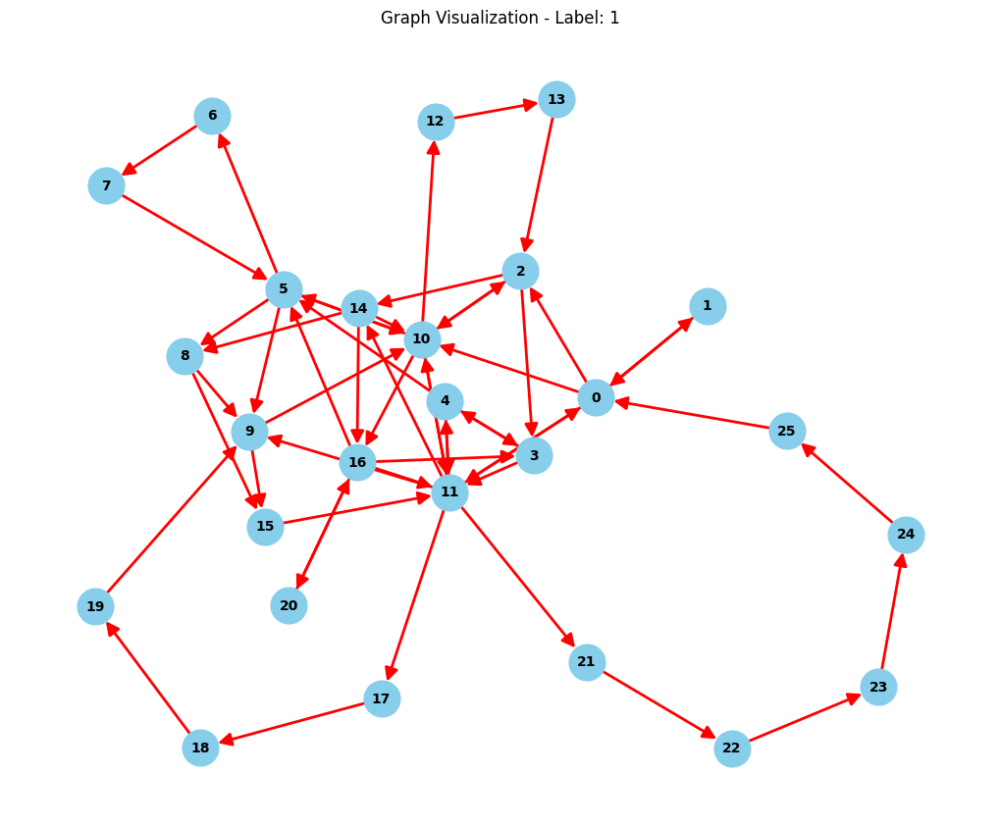

In [9]:
def plot_graph_simple(data):
    edge_index = data.edge_index.numpy()

    # Create directed graph
    G = nx.DiGraph()

    # Calculate unique nodes strictly from edge_index
    unique_nodes = set(np.concatenate(edge_index))
    for node in unique_nodes:
        G.add_node(node)  # Add only nodes present in edges

    # Add edges to the graph
    for i in range(edge_index.shape[1]):
        source = edge_index[0, i]
        target = edge_index[1, i]
        G.add_edge(source, target)

    # Print graph info
    print(f"NetworkX graph has {G.number_of_nodes()} nodes and {G.number_of_edges()} edges")

    # Plot with different layout options
    plt.figure(figsize=(10, 8))
    pos = nx.kamada_kawai_layout(G)  # Use kamada_kawai_layout for better structure

    # Draw with high visibility settings
    nx.draw(G, pos,
            with_labels=True,
            node_color='skyblue',
            node_size=700,
            font_size=10,
            font_weight='bold',
            arrowsize=20,
            width=2,
            edge_color='red',
            arrows=True)

    plt.title(f"Graph Visualization - Label: {data.y.item()}")
    plt.tight_layout()
    plt.show()

# Re-run the plot
plot_graph_simple(X_train_graph[4])

## GNN

In [10]:
def training_loop(model, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, num_epochs, criterion, patience=10, min_delta=0.001):
    start_time = time.time()
    train_losses = []
    val_losses = []

    best_val_loss = float('inf')
    epochs_no_improvement = 0

    # Training loop
    for epoch in tqdm(range(num_epochs)):  # Train for epochs
        train_loss = 0
        val_loss = 0
        model.train()  # Set model to training mode
        for batch in train_loader:
            batch = batch.to(device)  # Move batch to GPU
            optimizer.zero_grad()  # Clear previous gradients
            outputs = model(batch)  # Forward pass
            loss = criterion(outputs, batch.y.squeeze())  # Compute loss
            loss.backward(retain_graph=True)  # Backpropagation
            optimizer.step()  # Update model parameters
            train_loss += loss.item() * batch.size(0)
        train_loss /= len(train_dataset)
        train_losses.append(train_loss)  # Store training loss

        # Compute Validation loss during training
        model.eval()  # Set model to evaluation mode
        with torch.no_grad():  # Disable gradient computation for validation
            for batch in val_loader:
                batch = batch.to(device)  # Move batch to GPU
                val_outputs = model(batch)  # Forward pass
                loss = criterion(val_outputs, batch.y.squeeze())  # Compute validation loss. .squeeze() is used to reduce from 2D to 1D vector
                val_loss += loss.item() * batch.size(0)
            val_loss /= len(val_dataset)
            val_losses.append(val_loss)  # Store validation loss

        # Early stopping
        if best_val_loss - val_loss > min_delta:
            best_val_loss = val_loss
            epochs_no_improvement = 0
            torch.save(model.state_dict(), 'best_model.pth')  # Saving the best model
        else:
            epochs_no_improvement += 1
            if epochs_no_improvement >= patience:
                print(f'Early stopping triggered after {epoch + 1} epochs because no improvements over {patience} subsequent epochs!')
                print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {train_losses[-1]:.4f}, Val Loss: {val_losses[-1]:.4f}')
                break  # Stop training

        if (epoch + 1) % 5 == 0:
            print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {train_losses[-1]:.4f}, Val Loss: {val_losses[-1]:.4f}')

    end_time = time.time()
    elapsed_time = end_time - start_time

    print(f'The function took {elapsed_time:.2f} seconds to execute.')

    # Restore best model weights
    model.load_state_dict(torch.load('best_model.pth', map_location=device))

    # Plot the training and validation loss
    plt.figure(figsize=(10, 5))
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.grid()
    plt.show()

    return

def testing_model(model, dataloader, device):
    model.eval()  # Set the model to evaluation mode
    all_labels = []
    all_predictions = []

    with torch.no_grad():  # Disable gradient computation for efficiency
        for batch in dataloader:
            batch = batch.to(device)  # Move batch to GPU
            outputs = model(batch)
            _, predicted = torch.max(outputs, 1)  # Get the class with highest score
            all_labels.extend(batch.y.squeeze().cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())

    accuracy = accuracy_score(all_labels, all_predictions) * 100
    precision = precision_score(all_labels, all_predictions, average=None) * 100
    recall = recall_score(all_labels, all_predictions, average=None) * 100
    f1 = f1_score(all_labels, all_predictions, average=None) * 100

    return accuracy, precision, recall, f1, all_labels, all_predictions

def testing_model_with_threshold(model, dataloader, device, threshold=0.5):
    model.eval()
    all_labels = []
    all_predictions = []
    with torch.no_grad():
        for batch in dataloader:
            batch = batch.to(device)
            outputs = model(batch)
            probabilities = F.softmax(outputs, dim=1)  # Convert logits to probabilities
            predicted = (probabilities[:, 0] > threshold).long()  # 1 if p_class0 > threshold, else 0
            predicted_classes = 1 - predicted  # If predicted=1, class=0; if predicted=0, class=1
            all_labels.extend(batch.y.squeeze().cpu().numpy())
            all_predictions.extend(predicted_classes.cpu().numpy())
    accuracy = accuracy_score(all_labels, all_predictions) * 100
    precision = precision_score(all_labels, all_predictions, average=None) * 100
    recall = recall_score(all_labels, all_predictions, average=None) * 100
    f1 = f1_score(all_labels, all_predictions, average=None) * 100
    return accuracy, precision, recall, f1, all_labels, all_predictions

class GCN(torch.nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(GCN, self).__init__()
        self.conv1 = GCNConv(input_dim, hidden_dim)
        self.conv2 = GCNConv(hidden_dim, hidden_dim)
        self.fc = torch.nn.Linear(hidden_dim, output_dim)
        self.bn = torch.nn.BatchNorm1d(hidden_dim)
        self.dropout = torch.nn.Dropout(0.4)

    def forward(self, data):
        x, edge_index, batch = data.x, data.edge_index, data.batch
        x = F.relu(self.conv1(x, edge_index))
        x = self.dropout(x)
        x = self.bn(x)
        x = F.relu(self.conv2(x, edge_index))
        x = global_mean_pool(x, batch)  # Aggregate node features from Node to Graph features
        x = self.fc(x)
        return x

class GraphSAGE(torch.nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(GraphSAGE, self).__init__()
        self.conv1 = SAGEConv(input_dim, hidden_dim)
        self.conv2 = SAGEConv(hidden_dim, hidden_dim)
        self.fc = torch.nn.Linear(hidden_dim, output_dim)
        self.dropout = torch.nn.Dropout(0.4)

    def forward(self, data):
        x, edge_index, batch = data.x, data.edge_index, data.batch
        x = F.relu(self.conv1(x, edge_index))
        x = self.dropout(x)
        x = F.relu(self.conv2(x, edge_index))
        x = global_mean_pool(x, batch) # Aggregate node features. From Node to Graph Features
        x = self.fc(x)
        return x

class GAT(torch.nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim, heads=4):
        super(GAT, self).__init__()
        self.conv1 = GATConv(input_dim, hidden_dim, heads=heads, concat=True)
        self.conv2 = GATConv(hidden_dim * heads, hidden_dim, heads=1, concat=False)
        self.fc = torch.nn.Linear(hidden_dim, output_dim)

    def forward(self, data):
        x, edge_index, batch = data.x, data.edge_index, data.batch
        x = F.elu(self.conv1(x, edge_index))
        x = F.elu(self.conv2(x, edge_index))
        x = global_mean_pool(x, batch) # Aggregate node features. From Node to Graph Features
        x = self.fc(x)
        return x

## Simple GCN

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 8 and hidden dim 8


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 46.1322, Val Loss: 44.1200
Epoch 10/50, Train Loss: 43.3972, Val Loss: 43.6996
Epoch 15/50, Train Loss: 41.7698, Val Loss: 43.1021
Epoch 20/50, Train Loss: 43.0420, Val Loss: 42.7623
Early stopping triggered after 22 epochs because no improvements over 10 subsequent epochs!
Epoch 22/50, Train Loss: 43.3233, Val Loss: 41.6739
The function took 30.87 seconds to execute.


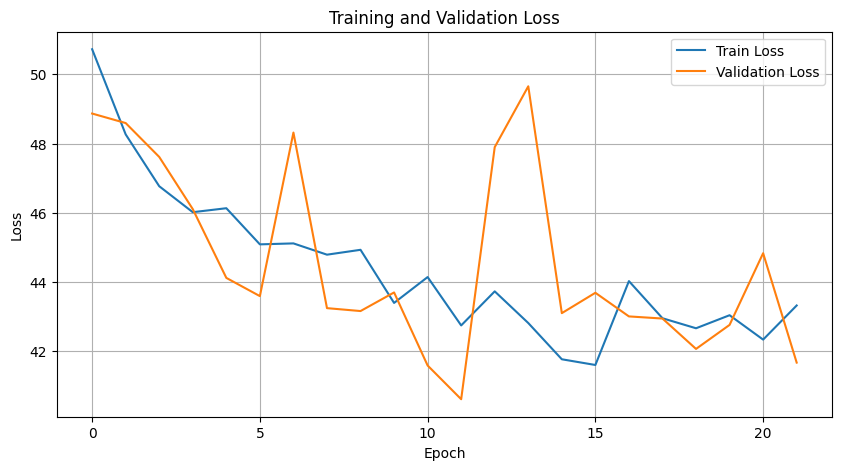

Training Accuracy: 72.8432
Training Precision Scores: [11.05975569 98.68802652]
Training Recall Scores: [77.90697674 72.62195122]
Training F1 Scores: [19.36976005 83.67191616]

Validation Accuracy: 70.8333
Validation Precision Scores: [ 9.2039801  98.92290249]
Validation Recall Scores: [79.56989247 70.50505051]
Validation F1 Scores: [16.49944259 82.33073838]

Threshold: 0.5
Validation Accuracy: 70.8333
Validation Precision Scores: [ 9.2039801  98.92290249]
Validation Recall Scores: [79.56989247 70.50505051]
Validation F1 Scores: [16.49944259 82.33073838]


Threshold: 0.6
Validation Accuracy: 79.5561
Validation Precision Scores: [11.5658363  98.60418744]
Validation Recall Scores: [69.89247312 79.91919192]
Validation F1 Scores: [19.84732824 88.28386521]


Threshold: 0.7
Validation Accuracy: 86.9159
Validation Precision Scores: [13.06990881 97.76686021]
Validation Recall Scores: [46.23655914 88.44444444]
Validation F1 Scores: [20.37914692 92.87229529]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 42.9639, Val Loss: 42.7165
Epoch 10/50, Train Loss: 39.4247, Val Loss: 38.9916
Epoch 15/50, Train Loss: 38.9545, Val Loss: 42.3849
Epoch 20/50, Train Loss: 38.6360, Val Loss: 37.6971
Epoch 25/50, Train Loss: 37.5386, Val Loss: 36.4397
Epoch 30/50, Train Loss: 37.9233, Val Loss: 37.0997
Epoch 35/50, Train Loss: 37.3246, Val Loss: 35.8904
Epoch 40/50, Train Loss: 36.9472, Val Loss: 36.9899
Early stopping triggered after 43 epochs because no improvements over 10 subsequent epochs!
Epoch 43/50, Train Loss: 36.8017, Val Loss: 38.0919
The function took 60.72 seconds to execute.


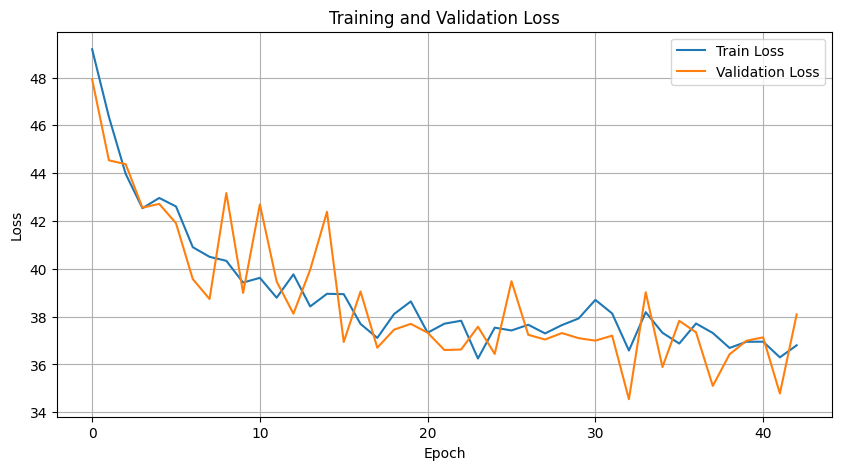

Training Accuracy: 82.4343
Training Precision Scores: [15.92261905 98.67942816]
Training Recall Scores: [74.65116279 82.77439024]
Training F1 Scores: [26.24693377 90.02984415]

Validation Accuracy: 82.2040
Validation Precision Scores: [14.453125   99.07587549]
Validation Recall Scores: [79.56989247 82.3030303 ]
Validation F1 Scores: [24.46280992 89.91392629]

Threshold: 0.5
Validation Accuracy: 82.2040
Validation Precision Scores: [14.453125   99.07587549]
Validation Recall Scores: [79.56989247 82.3030303 ]
Validation F1 Scores: [24.46280992 89.91392629]


Threshold: 0.6
Validation Accuracy: 88.0062
Validation Precision Scores: [15.87301587 98.09143364]
Validation Recall Scores: [53.76344086 89.29292929]
Validation F1 Scores: [24.50980392 93.4856176 ]


Threshold: 0.7
Validation Accuracy: 91.9003
Validation Precision Scores: [17.14285714 97.36732135]
Validation Recall Scores: [32.25806452 94.14141414]
Validation F1 Scores: [22.3880597  95.72719803]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 40.6945, Val Loss: 37.1508
Epoch 10/50, Train Loss: 37.8760, Val Loss: 34.2618
Epoch 15/50, Train Loss: 36.9977, Val Loss: 32.8120
Epoch 20/50, Train Loss: 35.8666, Val Loss: 37.7323
Early stopping triggered after 25 epochs because no improvements over 10 subsequent epochs!
Epoch 25/50, Train Loss: 36.9255, Val Loss: 34.5277
The function took 34.81 seconds to execute.


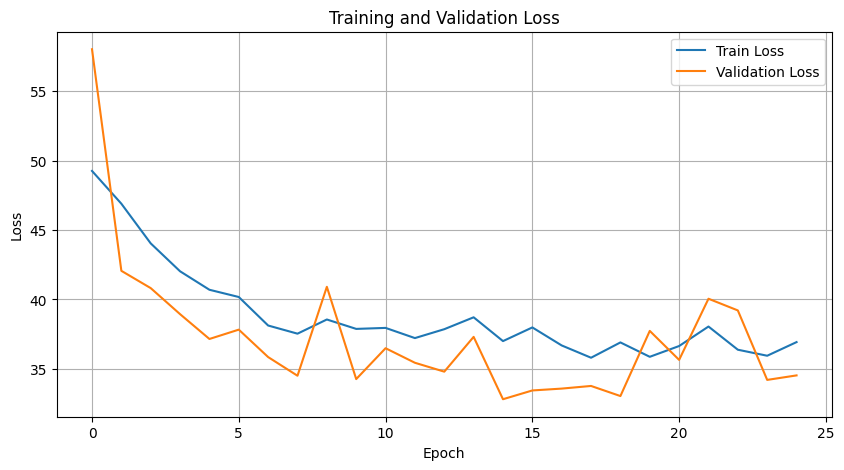

Training Accuracy: 82.9503
Training Precision Scores: [16.11082606 98.60593679]
Training Recall Scores: [73.02325581 83.38414634]
Training F1 Scores: [26.39764607 90.35846044]

Validation Accuracy: 83.5670
Validation Precision Scores: [15.07430998 98.95088221]
Validation Recall Scores: [76.34408602 83.83838384]
Validation F1 Scores: [25.17730496 90.76990376]

Threshold: 0.5
Validation Accuracy: 83.5670
Validation Precision Scores: [15.07430998 98.95088221]
Validation Recall Scores: [76.34408602 83.83838384]
Validation F1 Scores: [25.17730496 90.76990376]


Threshold: 0.6
Validation Accuracy: 89.4860
Validation Precision Scores: [19.58762887 98.41897233]
Validation Recall Scores: [61.29032258 90.54545455]
Validation F1 Scores: [29.6875     94.31818182]


Threshold: 0.7
Validation Accuracy: 92.9128
Validation Precision Scores: [23.35329341 97.75093711]
Validation Recall Scores: [41.93548387 94.82828283]
Validation F1 Scores: [30.         96.26743232]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 42.0951, Val Loss: 40.8983
Epoch 10/50, Train Loss: 40.5234, Val Loss: 38.8316
Epoch 15/50, Train Loss: 37.3142, Val Loss: 35.2674
Epoch 20/50, Train Loss: 35.8519, Val Loss: 35.5465
Epoch 25/50, Train Loss: 33.6738, Val Loss: 34.7888
Early stopping triggered after 27 epochs because no improvements over 10 subsequent epochs!
Epoch 27/50, Train Loss: 34.1043, Val Loss: 33.0375
The function took 37.50 seconds to execute.


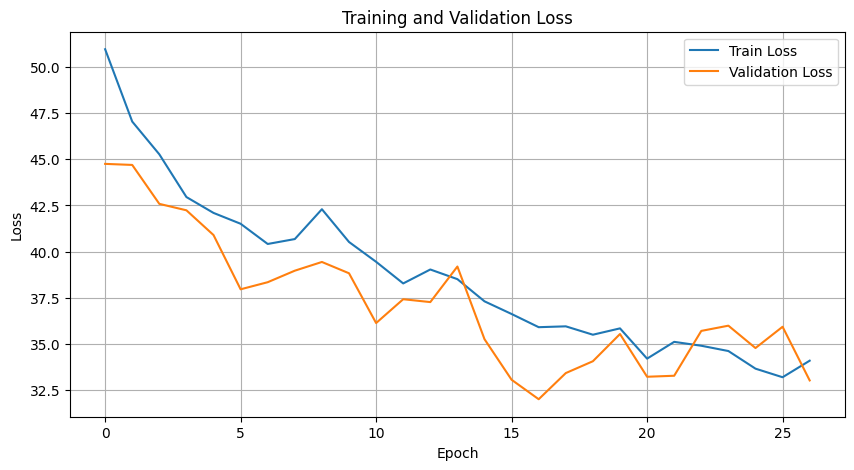

Training Accuracy: 82.1422
Training Precision Scores: [15.78947368 98.71014845]
Training Recall Scores: [75.34883721 82.43902439]
Training F1 Scores: [26.10797744 89.84383653]

Validation Accuracy: 81.8536
Validation Precision Scores: [13.78640777 98.92839747]
Validation Recall Scores: [76.34408602 82.06060606]
Validation F1 Scores: [23.35526316 89.70848057]

Threshold: 0.5
Validation Accuracy: 81.8536
Validation Precision Scores: [13.78640777 98.92839747]
Validation Recall Scores: [76.34408602 82.06060606]
Validation F1 Scores: [23.35526316 89.70848057]


Threshold: 0.6
Validation Accuracy: 92.1340
Validation Precision Scores: [25.33936652 98.42351939]
Validation Recall Scores: [60.21505376 93.33333333]
Validation F1 Scores: [35.66878981 95.81086686]


Threshold: 0.7
Validation Accuracy: 95.2103
Validation Precision Scores: [36.36363636 97.84377543]
Validation Recall Scores: [43.01075269 97.17171717]
Validation F1 Scores: [39.408867   97.50658828]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 37.9157, Val Loss: 38.1506
Epoch 10/50, Train Loss: 34.5610, Val Loss: 35.3705
Epoch 15/50, Train Loss: 31.8463, Val Loss: 34.1669
Epoch 20/50, Train Loss: 30.4339, Val Loss: 29.8353
Epoch 25/50, Train Loss: 29.4598, Val Loss: 29.9372
Epoch 30/50, Train Loss: 28.5810, Val Loss: 30.2653
Epoch 35/50, Train Loss: 28.2348, Val Loss: 30.8683
Epoch 40/50, Train Loss: 29.0202, Val Loss: 29.2636
Epoch 45/50, Train Loss: 28.3602, Val Loss: 27.1610
Epoch 50/50, Train Loss: 27.9718, Val Loss: 27.8682
The function took 71.18 seconds to execute.


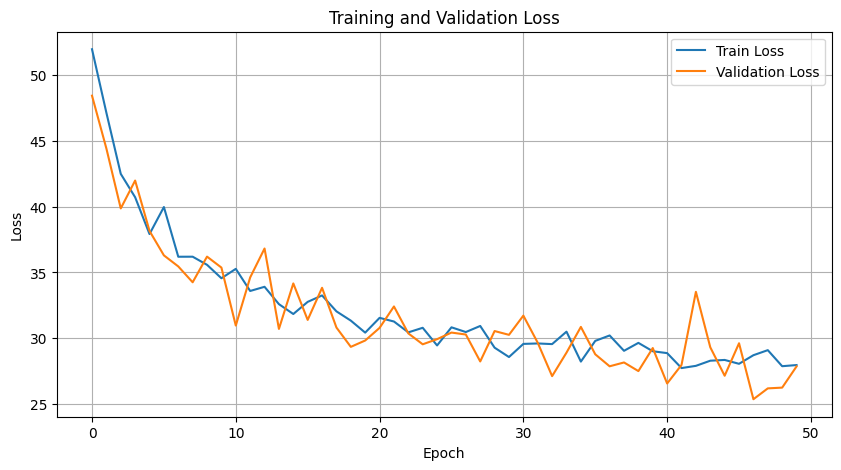

Training Accuracy: 88.5394
Training Precision Scores: [24.43531828 99.17130208]
Training Recall Scores: [83.02325581 88.7804878 ]
Training F1 Scores: [37.75780011 93.68866963]

Validation Accuracy: 88.8629
Validation Precision Scores: [22.02898551 99.23526766]
Validation Recall Scores: [81.72043011 89.13131313]
Validation F1 Scores: [34.70319635 93.91230311]

Threshold: 0.5
Validation Accuracy: 88.8629
Validation Precision Scores: [22.02898551 99.23526766]
Validation Recall Scores: [81.72043011 89.13131313]
Validation F1 Scores: [34.70319635 93.91230311]


Threshold: 0.6
Validation Accuracy: 92.1340
Validation Precision Scores: [27.93522267 98.96596295]
Validation Recall Scores: [74.19354839 92.80808081]
Validation F1 Scores: [40.58823529 95.7881568 ]


Threshold: 0.7
Validation Accuracy: 94.1978
Validation Precision Scores: [34.09090909 98.62040134]
Validation Recall Scores: [64.51612903 95.31313131]
Validation F1 Scores: [44.60966543 96.93856585]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 41.8085, Val Loss: 43.3539
Epoch 10/50, Train Loss: 37.8155, Val Loss: 37.3237
Epoch 15/50, Train Loss: 33.2925, Val Loss: 33.2437
Epoch 20/50, Train Loss: 33.1030, Val Loss: 33.7355
Epoch 25/50, Train Loss: 32.8212, Val Loss: 33.5139
Epoch 30/50, Train Loss: 31.0872, Val Loss: 33.5573
Early stopping triggered after 31 epochs because no improvements over 10 subsequent epochs!
Epoch 31/50, Train Loss: 30.2494, Val Loss: 33.6207
The function took 47.91 seconds to execute.


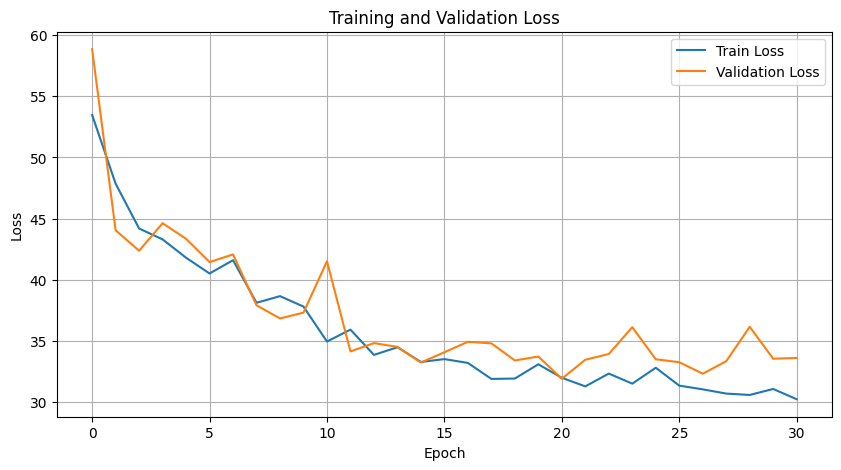

Training Accuracy: 83.6806
Training Precision Scores: [18.14928425 99.09790714]
Training Recall Scores: [82.55813953 83.7296748 ]
Training F1 Scores: [29.75691534 90.76787485]

Validation Accuracy: 83.1386
Validation Precision Scores: [15.86345382 99.3236715 ]
Validation Recall Scores: [84.94623656 83.07070707]
Validation F1 Scores: [26.73434856 90.4730473 ]

Threshold: 0.5
Validation Accuracy: 83.1386
Validation Precision Scores: [15.86345382 99.3236715 ]
Validation Recall Scores: [84.94623656 83.07070707]
Validation F1 Scores: [26.73434856 90.4730473 ]


Threshold: 0.6
Validation Accuracy: 88.5125
Validation Precision Scores: [19.94047619 98.83512545]
Validation Recall Scores: [72.04301075 89.13131313]
Validation F1 Scores: [31.23543124 93.73273847]


Threshold: 0.7
Validation Accuracy: 92.7181
Validation Precision Scores: [24.7311828  98.02686818]
Validation Recall Scores: [49.46236559 94.34343434]
Validation F1 Scores: [32.97491039 96.14988676]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 36.9133, Val Loss: 35.4967
Epoch 10/50, Train Loss: 34.1310, Val Loss: 35.7951
Epoch 15/50, Train Loss: 32.3173, Val Loss: 37.1734
Epoch 20/50, Train Loss: 30.8698, Val Loss: 32.0957
Epoch 25/50, Train Loss: 29.4846, Val Loss: 30.0476
Epoch 30/50, Train Loss: 28.3141, Val Loss: 35.0944
Epoch 35/50, Train Loss: 27.7885, Val Loss: 28.3369
Epoch 40/50, Train Loss: 27.2158, Val Loss: 29.9063
Early stopping triggered after 42 epochs because no improvements over 10 subsequent epochs!
Epoch 42/50, Train Loss: 26.4782, Val Loss: 27.9826
The function took 68.72 seconds to execute.


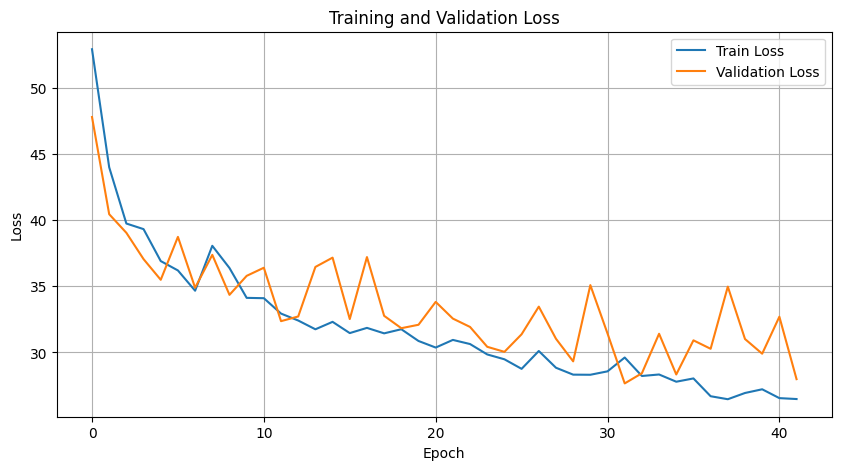

Training Accuracy: 87.4684
Training Precision Scores: [23.0672533  99.27410992]
Training Recall Scores: [85.34883721 87.56097561]
Training F1 Scores: [36.31865413 93.05038069]

Validation Accuracy: 87.8505
Validation Precision Scores: [21.10817942 99.40612152]
Validation Recall Scores: [86.02150538 87.91919192]
Validation F1 Scores: [33.89830508 93.31046312]

Threshold: 0.5
Validation Accuracy: 87.8505
Validation Precision Scores: [21.10817942 99.40612152]
Validation Recall Scores: [86.02150538 87.91919192]
Validation F1 Scores: [33.89830508 93.31046312]


Threshold: 0.6
Validation Accuracy: 91.5888
Validation Precision Scores: [26.07003891 98.87494591]
Validation Recall Scores: [72.04301075 92.32323232]
Validation F1 Scores: [38.28571429 95.48683661]


Threshold: 0.7
Validation Accuracy: 93.9642
Validation Precision Scores: [32.18390805 98.45446951]
Validation Recall Scores: [60.21505376 95.23232323]
Validation F1 Scores: [41.94756554 96.81659478]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 38.8210, Val Loss: 36.2724
Epoch 10/50, Train Loss: 34.6908, Val Loss: 35.7989
Epoch 15/50, Train Loss: 34.0336, Val Loss: 33.9518
Epoch 20/50, Train Loss: 33.6006, Val Loss: 37.7107
Epoch 25/50, Train Loss: 31.2911, Val Loss: 35.0181
Epoch 30/50, Train Loss: 29.9647, Val Loss: 33.0264
Epoch 35/50, Train Loss: 28.2764, Val Loss: 29.0928
Epoch 40/50, Train Loss: 28.5746, Val Loss: 34.4996
Early stopping triggered after 45 epochs because no improvements over 10 subsequent epochs!
Epoch 45/50, Train Loss: 28.8282, Val Loss: 29.3745
The function took 77.47 seconds to execute.


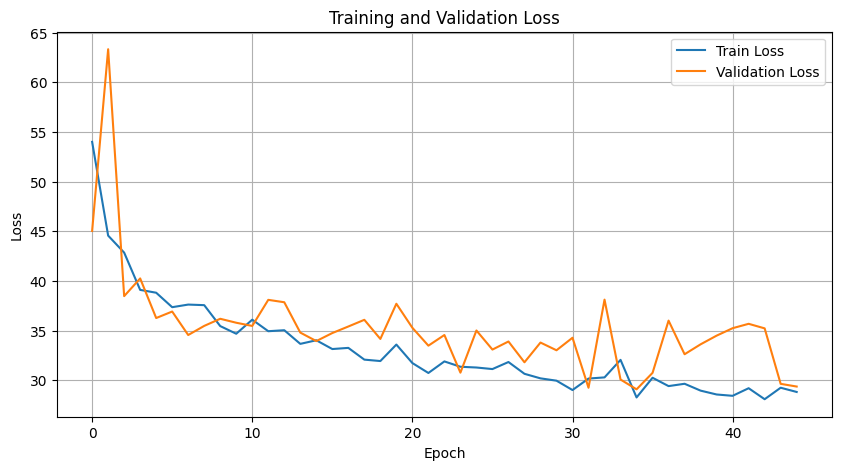

Training Accuracy: 83.7098
Training Precision Scores: [18.33927662 99.15733719]
Training Recall Scores: [83.72093023 83.70934959]
Training F1 Scores: [30.08775595 90.78084532]

Validation Accuracy: 83.1386
Validation Precision Scores: [16.         99.37137331]
Validation Recall Scores: [86.02150538 83.03030303]
Validation F1 Scores: [26.98145025 90.46885318]

Threshold: 0.5
Validation Accuracy: 83.1386
Validation Precision Scores: [16.         99.37137331]
Validation Recall Scores: [86.02150538 83.03030303]
Validation F1 Scores: [26.98145025 90.46885318]


Threshold: 0.6
Validation Accuracy: 89.4860
Validation Precision Scores: [21.9047619  98.93475366]
Validation Recall Scores: [74.19354839 90.06060606]
Validation F1 Scores: [33.82352941 94.2893401 ]


Threshold: 0.7
Validation Accuracy: 92.7960
Validation Precision Scores: [28.5046729  98.64061172]
Validation Recall Scores: [65.59139785 93.81818182]
Validation F1 Scores: [39.73941368 96.16897908]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 39.7102, Val Loss: 38.5145
Epoch 10/50, Train Loss: 36.0425, Val Loss: 35.0467
Epoch 15/50, Train Loss: 33.7809, Val Loss: 34.0456
Epoch 20/50, Train Loss: 32.1476, Val Loss: 33.4125
Epoch 25/50, Train Loss: 30.7288, Val Loss: 32.3429
Epoch 30/50, Train Loss: 30.3039, Val Loss: 31.8330
Epoch 35/50, Train Loss: 29.6560, Val Loss: 32.0833
Epoch 40/50, Train Loss: 28.5426, Val Loss: 33.0498
Epoch 45/50, Train Loss: 27.5094, Val Loss: 35.7289
Epoch 50/50, Train Loss: 27.4977, Val Loss: 31.9988
The function took 92.57 seconds to execute.


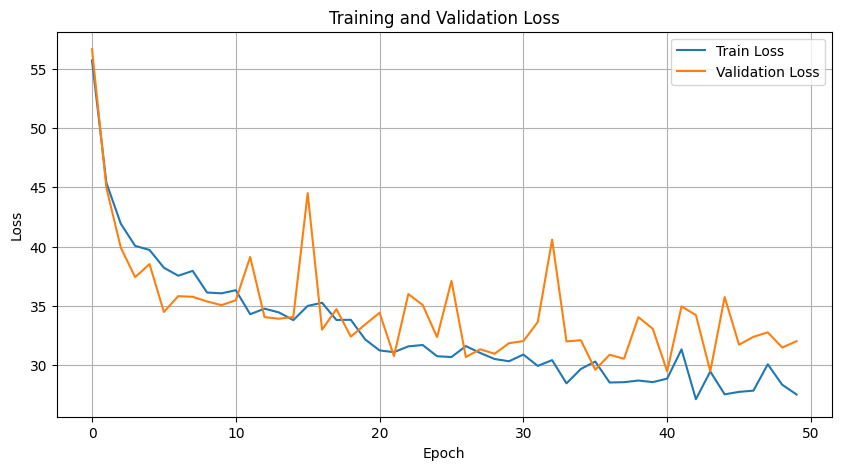

Training Accuracy: 84.9075
Training Precision Scores: [20.05347594 99.3452381 ]
Training Recall Scores: [87.20930233 84.80691057]
Training F1 Scores: [32.60869565 91.50219298]

Validation Accuracy: 84.2290
Validation Precision Scores: [16.52360515 99.23882017]
Validation Recall Scores: [82.79569892 84.28282828]
Validation F1 Scores: [27.54919499 91.15140922]

Threshold: 0.5
Validation Accuracy: 84.2290
Validation Precision Scores: [16.52360515 99.23882017]
Validation Recall Scores: [82.79569892 84.28282828]
Validation F1 Scores: [27.54919499 91.15140922]


Threshold: 0.6
Validation Accuracy: 89.0187
Validation Precision Scores: [21.62162162 99.06040268]
Validation Recall Scores: [77.41935484 89.45454545]
Validation F1 Scores: [33.8028169  94.01273885]


Threshold: 0.7
Validation Accuracy: 93.1464
Validation Precision Scores: [29.14572864 98.52258337]
Validation Recall Scores: [62.3655914 94.3030303]
Validation F1 Scores: [39.7260274  96.36663914]


Threshold: 0.8
Validation Accuracy: 9

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 37.9200, Val Loss: 36.6346
Epoch 10/50, Train Loss: 36.9178, Val Loss: 33.5208
Epoch 15/50, Train Loss: 36.7597, Val Loss: 33.1844
Epoch 20/50, Train Loss: 34.9843, Val Loss: 34.1674
Epoch 25/50, Train Loss: 33.9700, Val Loss: 33.2079
Epoch 30/50, Train Loss: 34.6220, Val Loss: 33.3061
Epoch 35/50, Train Loss: 33.2025, Val Loss: 34.8476
Epoch 40/50, Train Loss: 33.1363, Val Loss: 31.5165
Epoch 45/50, Train Loss: 33.9778, Val Loss: 33.7626
Epoch 50/50, Train Loss: 32.9925, Val Loss: 31.8226
The function took 70.55 seconds to execute.


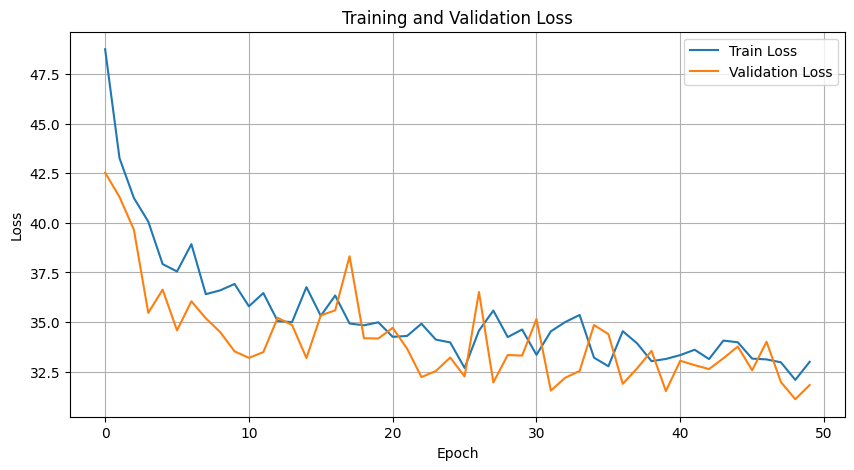

Training Accuracy: 77.7313
Training Precision Scores: [14.38434983 99.28226543]
Training Recall Scores: [87.20930233 77.31707317]
Training F1 Scores: [24.69542311 86.93366851]

Validation Accuracy: 78.2321
Validation Precision Scores: [12.89808917 99.3814433 ]
Validation Recall Scores: [87.09677419 77.8989899 ]
Validation F1 Scores: [22.46879334 87.33861835]

Threshold: 0.5
Validation Accuracy: 78.2321
Validation Precision Scores: [12.89808917 99.3814433 ]
Validation Recall Scores: [87.09677419 77.8989899 ]
Validation F1 Scores: [22.46879334 87.33861835]


Threshold: 0.6
Validation Accuracy: 86.0202
Validation Precision Scores: [17.56097561 99.02687674]
Validation Recall Scores: [77.41935484 86.34343434]
Validation F1 Scores: [28.62823062 92.2512411 ]


Threshold: 0.7
Validation Accuracy: 91.3162
Validation Precision Scores: [24.40944882 98.66032844]
Validation Recall Scores: [66.66666667 92.24242424]
Validation F1 Scores: [35.73487032 95.34349551]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 37.5914, Val Loss: 36.9375
Epoch 10/50, Train Loss: 35.3452, Val Loss: 33.3349
Epoch 15/50, Train Loss: 33.9796, Val Loss: 32.1849
Epoch 20/50, Train Loss: 32.2270, Val Loss: 32.5368
Epoch 25/50, Train Loss: 33.5316, Val Loss: 32.5335
Early stopping triggered after 29 epochs because no improvements over 10 subsequent epochs!
Epoch 29/50, Train Loss: 32.5992, Val Loss: 31.4920
The function took 41.59 seconds to execute.


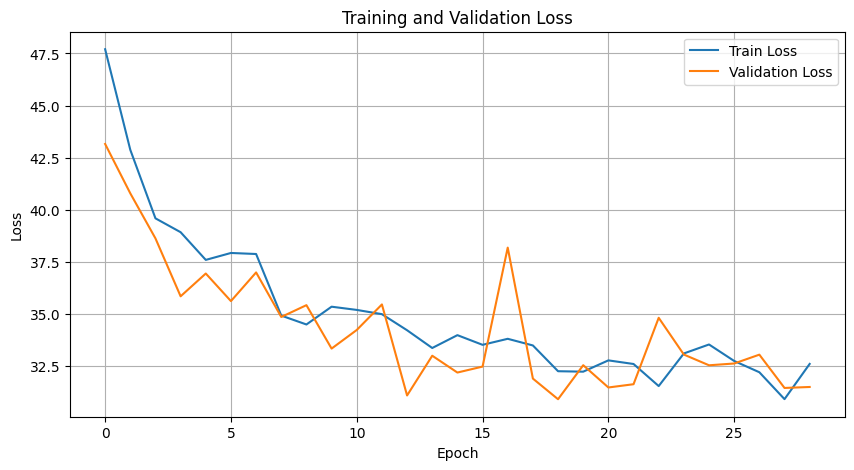

Training Accuracy: 86.2804
Training Precision Scores: [19.69040248 98.70595032]
Training Recall Scores: [73.95348837 86.81910569]
Training F1 Scores: [31.1002445  92.38172479]

Validation Accuracy: 86.9159
Validation Precision Scores: [18.60465116 99.03713893]
Validation Recall Scores: [77.41935484 87.27272727]
Validation F1 Scores: [30.         92.78350515]

Threshold: 0.5
Validation Accuracy: 86.9159
Validation Precision Scores: [18.60465116 99.03713893]
Validation Recall Scores: [77.41935484 87.27272727]
Validation F1 Scores: [30.         92.78350515]


Threshold: 0.6
Validation Accuracy: 91.3941
Validation Precision Scores: [23.55371901 98.45227859]
Validation Recall Scores: [61.29032258 92.52525253]
Validation F1 Scores: [34.02985075 95.39679233]


Threshold: 0.7
Validation Accuracy: 94.5872
Validation Precision Scores: [31.74603175 97.82964783]
Validation Recall Scores: [43.01075269 96.52525253]
Validation F1 Scores: [36.52968037 97.17307301]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 35.5042, Val Loss: 35.9069
Epoch 10/50, Train Loss: 33.5398, Val Loss: 35.0139
Epoch 15/50, Train Loss: 31.4917, Val Loss: 32.9719
Epoch 20/50, Train Loss: 30.3578, Val Loss: 30.2027
Epoch 25/50, Train Loss: 29.3772, Val Loss: 30.8651
Early stopping triggered after 30 epochs because no improvements over 10 subsequent epochs!
Epoch 30/50, Train Loss: 28.8099, Val Loss: 31.9625
The function took 42.55 seconds to execute.


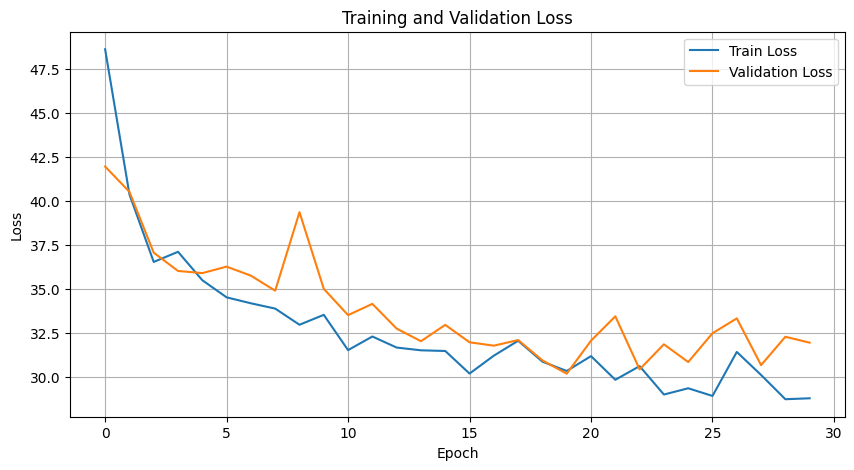

Training Accuracy: 84.7420
Training Precision Scores: [19.96830428 99.37925272]
Training Recall Scores: [87.90697674 84.60365854]
Training F1 Scores: [32.54412398 91.39814459]

Validation Accuracy: 84.3458
Validation Precision Scores: [17.0575693  99.38065746]
Validation Recall Scores: [86.02150538 84.28282828]
Validation F1 Scores: [28.46975089 91.2111937 ]

Threshold: 0.5
Validation Accuracy: 84.3458
Validation Precision Scores: [17.0575693  99.38065746]
Validation Recall Scores: [86.02150538 84.28282828]
Validation F1 Scores: [28.46975089 91.2111937 ]


Threshold: 0.6
Validation Accuracy: 88.9019
Validation Precision Scores: [21.42857143 99.05913978]
Validation Recall Scores: [77.41935484 89.33333333]
Validation F1 Scores: [33.56643357 93.94518802]


Threshold: 0.7
Validation Accuracy: 92.5234
Validation Precision Scores: [27.18894009 98.55380689]
Validation Recall Scores: [63.44086022 93.61616162]
Validation F1 Scores: [38.06451613 96.02154994]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 35.5609, Val Loss: 35.6651
Epoch 10/50, Train Loss: 32.0268, Val Loss: 34.0040
Epoch 15/50, Train Loss: 29.9121, Val Loss: 29.0933
Epoch 20/50, Train Loss: 28.1188, Val Loss: 27.1686
Epoch 25/50, Train Loss: 25.8208, Val Loss: 27.7698
Epoch 30/50, Train Loss: 24.7274, Val Loss: 27.7432
Epoch 35/50, Train Loss: 26.0880, Val Loss: 26.7918
Epoch 40/50, Train Loss: 23.8051, Val Loss: 25.9526
Early stopping triggered after 42 epochs because no improvements over 10 subsequent epochs!
Epoch 42/50, Train Loss: 23.7856, Val Loss: 27.0014
The function took 61.28 seconds to execute.


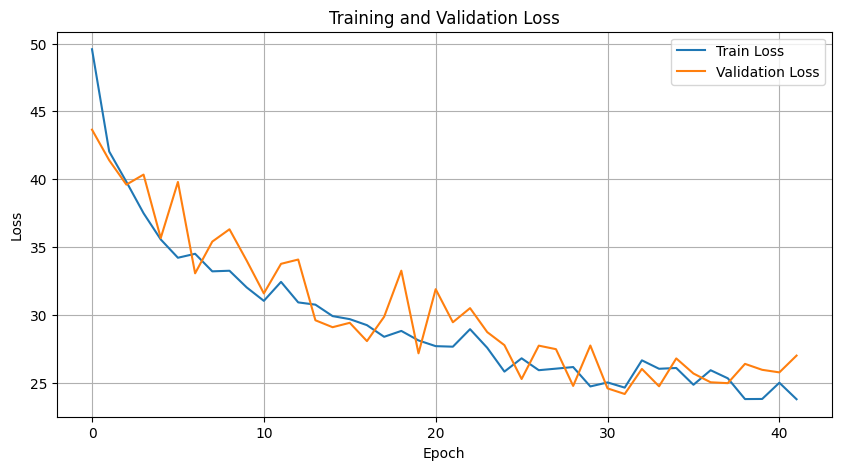

Training Accuracy: 89.8734
Training Precision Scores: [27.37388724 99.31629679]
Training Recall Scores: [85.81395349 90.05081301]
Training F1 Scores: [41.50731159 94.45688093]

Validation Accuracy: 90.9268
Validation Precision Scores: [26.82119205 99.47043248]
Validation Recall Scores: [87.09677419 91.07070707]
Validation F1 Scores: [41.01265823 95.08542502]

Threshold: 0.5
Validation Accuracy: 90.9268
Validation Precision Scores: [26.82119205 99.47043248]
Validation Recall Scores: [87.09677419 91.07070707]
Validation F1 Scores: [41.01265823 95.08542502]


Threshold: 0.6
Validation Accuracy: 93.3801
Validation Precision Scores: [32.25806452 99.0216929 ]
Validation Recall Scores: [75.2688172  94.06060606]
Validation F1 Scores: [45.16129032 96.47741401]


Threshold: 0.7
Validation Accuracy: 95.0935
Validation Precision Scores: [39.07284768 98.59329748]
Validation Recall Scores: [63.44086022 96.28282828]
Validation F1 Scores: [48.36065574 97.42436631]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 36.0009, Val Loss: 41.8602
Epoch 10/50, Train Loss: 33.0101, Val Loss: 31.5693
Epoch 15/50, Train Loss: 29.2946, Val Loss: 28.6842
Epoch 20/50, Train Loss: 28.0412, Val Loss: 28.0675
Epoch 25/50, Train Loss: 26.3218, Val Loss: 31.5809
Epoch 30/50, Train Loss: 24.9840, Val Loss: 31.0275
Epoch 35/50, Train Loss: 25.1489, Val Loss: 26.9191
Early stopping triggered after 39 epochs because no improvements over 10 subsequent epochs!
Epoch 39/50, Train Loss: 26.4979, Val Loss: 26.4603
The function took 61.82 seconds to execute.


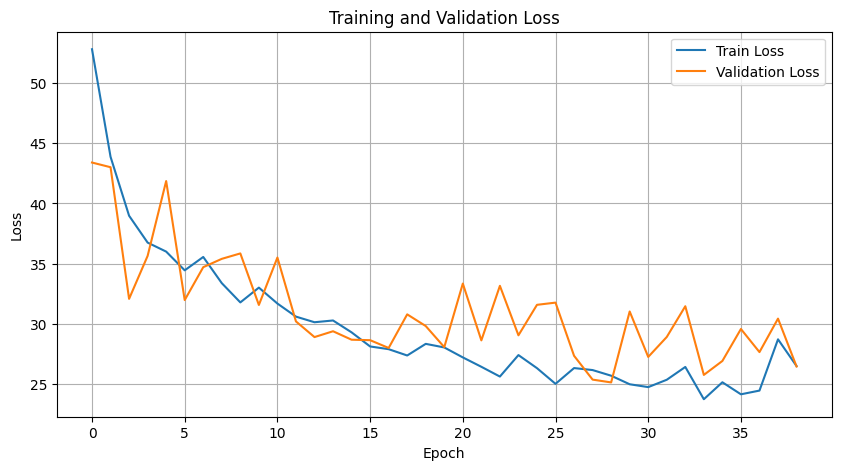

Training Accuracy: 84.7225
Training Precision Scores: [20.04208311 99.41450591]
Training Recall Scores: [88.60465116 84.55284553]
Training F1 Scores: [32.68983269 91.38338184]

Validation Accuracy: 83.4502
Validation Precision Scores: [16.93227092 99.61277832]
Validation Recall Scores: [91.39784946 83.15151515]
Validation F1 Scores: [28.57142857 90.64082801]

Threshold: 0.5
Validation Accuracy: 83.4502
Validation Precision Scores: [16.93227092 99.61277832]
Validation Recall Scores: [91.39784946 83.15151515]
Validation F1 Scores: [28.57142857 90.64082801]


Threshold: 0.6
Validation Accuracy: 88.8629
Validation Precision Scores: [22.96918768 99.50248756]
Validation Recall Scores: [88.17204301 88.88888889]
Validation F1 Scores: [36.44444444 93.89671362]


Threshold: 0.7
Validation Accuracy: 92.5234
Validation Precision Scores: [30.58823529 99.35149157]
Validation Recall Scores: [83.87096774 92.84848485]
Validation F1 Scores: [44.82758621 95.98997494]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 36.3107, Val Loss: 36.0038
Epoch 10/50, Train Loss: 30.5308, Val Loss: 34.2500
Epoch 15/50, Train Loss: 29.9332, Val Loss: 30.1224
Epoch 20/50, Train Loss: 28.6690, Val Loss: 31.5205
Epoch 25/50, Train Loss: 27.1884, Val Loss: 32.4599
Epoch 30/50, Train Loss: 27.0552, Val Loss: 31.5213
Early stopping triggered after 34 epochs because no improvements over 10 subsequent epochs!
Epoch 34/50, Train Loss: 26.0408, Val Loss: 28.4373
The function took 57.91 seconds to execute.


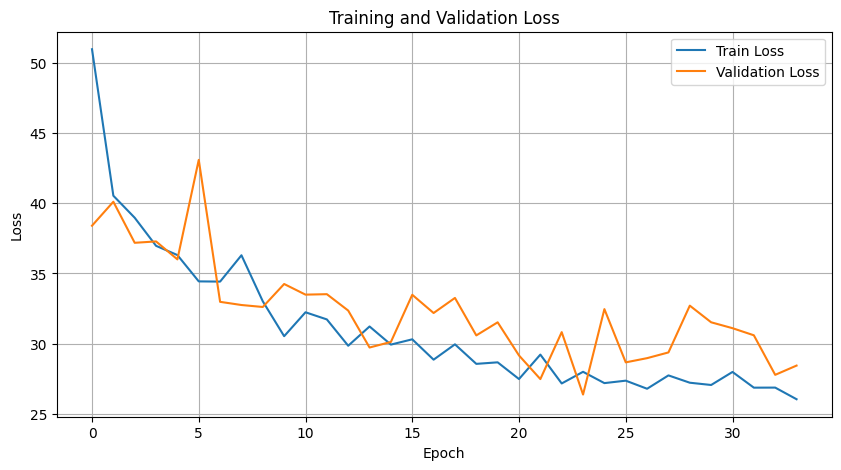

Training Accuracy: 87.9455
Training Precision Scores: [23.59477124 99.21052632]
Training Recall Scores: [83.95348837 88.1199187 ]
Training F1 Scores: [36.83673469 93.33692142]

Validation Accuracy: 87.9673
Validation Precision Scores: [20.96774194 99.31693989]
Validation Recall Scores: [83.87096774 88.12121212]
Validation F1 Scores: [33.5483871  93.38471419]

Threshold: 0.5
Validation Accuracy: 87.9673
Validation Precision Scores: [20.96774194 99.31693989]
Validation Recall Scores: [83.87096774 88.12121212]
Validation F1 Scores: [33.5483871  93.38471419]


Threshold: 0.6
Validation Accuracy: 92.4065
Validation Precision Scores: [28.38983051 98.88507719]
Validation Recall Scores: [72.04301075 93.17171717]
Validation F1 Scores: [40.72948328 95.94341585]


Threshold: 0.7
Validation Accuracy: 94.1978
Validation Precision Scores: [33.13253012 98.41798501]
Validation Recall Scores: [59.13978495 95.51515152]
Validation F1 Scores: [42.47104247 96.94484314]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 35.4706, Val Loss: 39.4470
Epoch 10/50, Train Loss: 31.8939, Val Loss: 29.7429
Epoch 15/50, Train Loss: 28.6640, Val Loss: 25.0956
Epoch 20/50, Train Loss: 25.3407, Val Loss: 28.3385
Early stopping triggered after 25 epochs because no improvements over 10 subsequent epochs!
Epoch 25/50, Train Loss: 25.6033, Val Loss: 26.8250
The function took 45.01 seconds to execute.


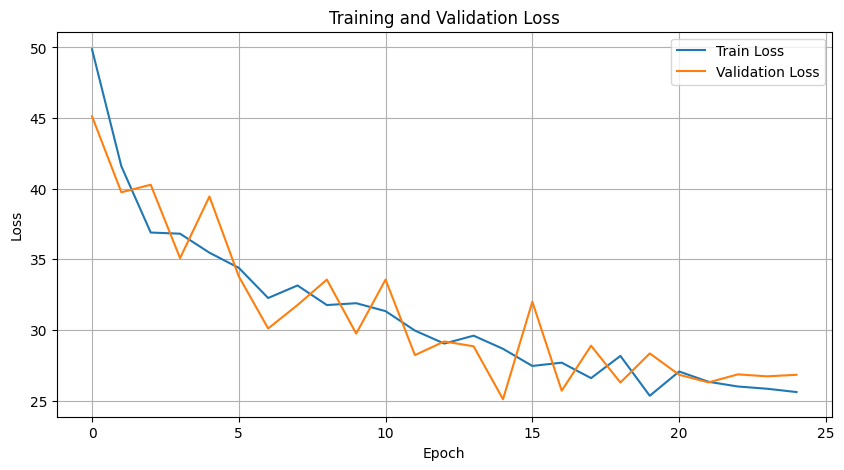

Training Accuracy: 87.3515
Training Precision Scores: [22.79273638 99.23901764]
Training Recall Scores: [84.65116279 87.4695122 ]
Training F1 Scores: [35.91514554 92.98330903]

Validation Accuracy: 87.6947
Validation Precision Scores: [20.42440318 99.26973984]
Validation Recall Scores: [82.79569892 87.87878788]
Validation F1 Scores: [32.76595745 93.22760394]

Threshold: 0.5
Validation Accuracy: 87.6947
Validation Precision Scores: [20.42440318 99.26973984]
Validation Recall Scores: [82.79569892 87.87878788]
Validation F1 Scores: [32.76595745 93.22760394]


Threshold: 0.6
Validation Accuracy: 91.4720
Validation Precision Scores: [27.3381295  99.25764192]
Validation Recall Scores: [81.72043011 91.83838384]
Validation F1 Scores: [40.9703504  95.40398741]


Threshold: 0.7
Validation Accuracy: 94.0031
Validation Precision Scores: [34.19689119 98.86315789]
Validation Recall Scores: [70.96774194 94.86868687]
Validation F1 Scores: [46.15384615 96.82474227]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 37.0629, Val Loss: 33.0329
Epoch 10/50, Train Loss: 30.8857, Val Loss: 30.0271
Epoch 15/50, Train Loss: 29.0917, Val Loss: 28.1318
Epoch 20/50, Train Loss: 29.9781, Val Loss: 26.4795
Epoch 25/50, Train Loss: 27.4135, Val Loss: 37.4790
Epoch 30/50, Train Loss: 26.3547, Val Loss: 29.3664
Epoch 35/50, Train Loss: 24.5625, Val Loss: 25.1090
Epoch 40/50, Train Loss: 24.3150, Val Loss: 23.0054
Epoch 45/50, Train Loss: 24.7122, Val Loss: 27.3990
Early stopping triggered after 50 epochs because no improvements over 10 subsequent epochs!
Epoch 50/50, Train Loss: 23.3842, Val Loss: 27.9558
The function took 97.56 seconds to execute.


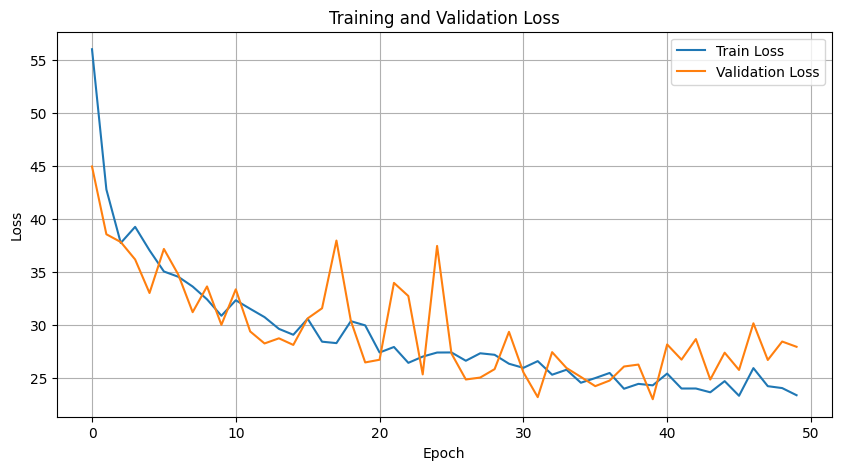

Training Accuracy: 89.1237
Training Precision Scores: [26.29399586 99.44450743]
Training Recall Scores: [88.60465116 89.14634146]
Training F1 Scores: [40.5534859  94.01425433]

Validation Accuracy: 88.5514
Validation Precision Scores: [22.46575342 99.50068089]
Validation Recall Scores: [88.17204301 88.56565657]
Validation F1 Scores: [35.80786026 93.71526293]

Threshold: 0.5
Validation Accuracy: 88.5514
Validation Precision Scores: [22.46575342 99.50068089]
Validation Recall Scores: [88.17204301 88.56565657]
Validation F1 Scores: [35.80786026 93.71526293]


Threshold: 0.6
Validation Accuracy: 91.9393
Validation Precision Scores: [28.57142857 99.26151173]
Validation Recall Scores: [81.72043011 92.32323232]
Validation F1 Scores: [42.33983287 95.66673645]


Threshold: 0.7
Validation Accuracy: 94.1589
Validation Precision Scores: [35.23316062 98.94736842]
Validation Recall Scores: [73.11827957 94.94949495]
Validation F1 Scores: [47.55244755 96.90721649]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 36.4349, Val Loss: 32.5019
Epoch 10/50, Train Loss: 31.7313, Val Loss: 35.7801
Epoch 15/50, Train Loss: 31.1630, Val Loss: 32.6056
Epoch 20/50, Train Loss: 30.6161, Val Loss: 30.7822
Epoch 25/50, Train Loss: 30.0166, Val Loss: 31.5883
Epoch 30/50, Train Loss: 28.6403, Val Loss: 31.3023
Epoch 35/50, Train Loss: 28.4866, Val Loss: 31.9818
Epoch 40/50, Train Loss: 28.2116, Val Loss: 29.4441
Early stopping triggered after 42 epochs because no improvements over 10 subsequent epochs!
Epoch 42/50, Train Loss: 28.5507, Val Loss: 31.9648
The function took 63.52 seconds to execute.


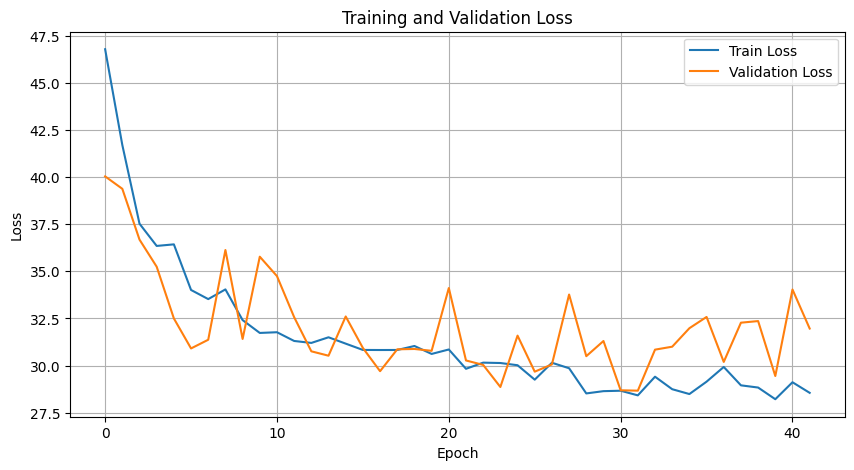

Training Accuracy: 82.0448
Training Precision Scores: [17.86363636 99.54151177]
Training Recall Scores: [91.39534884 81.63617886]
Training F1 Scores: [29.88593156 89.70407594]

Validation Accuracy: 81.6199
Validation Precision Scores: [14.84230056 99.35929029]
Validation Recall Scores: [86.02150538 81.45454545]
Validation F1 Scores: [25.3164557  89.52042629]

Threshold: 0.5
Validation Accuracy: 81.6199
Validation Precision Scores: [14.84230056 99.35929029]
Validation Recall Scores: [86.02150538 81.45454545]
Validation F1 Scores: [25.3164557  89.52042629]


Threshold: 0.6
Validation Accuracy: 87.7726
Validation Precision Scores: [20.05420054 99.1359709 ]
Validation Recall Scores: [79.56989247 88.08080808]
Validation F1 Scores: [32.03463203 93.28198545]


Threshold: 0.7
Validation Accuracy: 92.5623
Validation Precision Scores: [28.31858407 98.7617421 ]
Validation Recall Scores: [68.8172043  93.45454545]
Validation F1 Scores: [40.12539185 96.03487648]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 34.4116, Val Loss: 34.1422
Epoch 10/50, Train Loss: 31.0055, Val Loss: 31.1288
Epoch 15/50, Train Loss: 30.2672, Val Loss: 30.4491
Epoch 20/50, Train Loss: 28.3933, Val Loss: 28.0525
Epoch 25/50, Train Loss: 28.0069, Val Loss: 32.2816
Early stopping triggered after 30 epochs because no improvements over 10 subsequent epochs!
Epoch 30/50, Train Loss: 27.5881, Val Loss: 28.7767
The function took 45.11 seconds to execute.


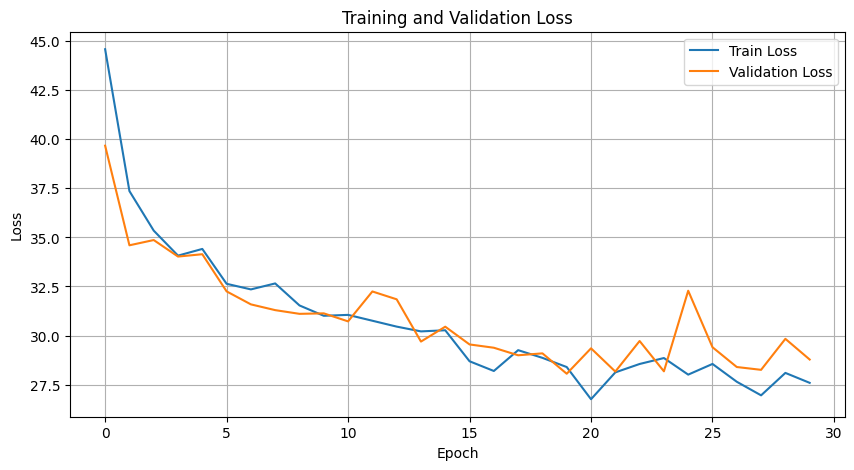

Training Accuracy: 87.6436
Training Precision Scores: [22.81270253 99.10622207]
Training Recall Scores: [81.86046512 87.89634146]
Training F1 Scores: [35.68170299 93.16529326]

Validation Accuracy: 87.5779
Validation Precision Scores: [19.78609626 99.13400182]
Validation Recall Scores: [79.56989247 87.87878788]
Validation F1 Scores: [31.69164882 93.16770186]

Threshold: 0.5
Validation Accuracy: 87.5779
Validation Precision Scores: [19.78609626 99.13400182]
Validation Recall Scores: [79.56989247 87.87878788]
Validation F1 Scores: [31.69164882 93.16770186]


Threshold: 0.6
Validation Accuracy: 91.0436
Validation Precision Scores: [23.55212355 98.61411867]
Validation Recall Scores: [65.59139785 92.        ]
Validation F1 Scores: [34.65909091 95.19230769]


Threshold: 0.7
Validation Accuracy: 94.7819
Validation Precision Scores: [36.05442177 98.34779017]
Validation Recall Scores: [56.98924731 96.2020202 ]
Validation F1 Scores: [44.16666667 97.2630719 ]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 34.0942, Val Loss: 30.2014
Epoch 10/50, Train Loss: 30.4436, Val Loss: 29.2898
Epoch 15/50, Train Loss: 27.6922, Val Loss: 30.9038
Epoch 20/50, Train Loss: 26.7772, Val Loss: 27.7113
Epoch 25/50, Train Loss: 25.4282, Val Loss: 27.2100
Epoch 30/50, Train Loss: 24.9330, Val Loss: 27.0306
Epoch 35/50, Train Loss: 23.4029, Val Loss: 32.4968
Epoch 40/50, Train Loss: 22.4740, Val Loss: 26.0224
Epoch 45/50, Train Loss: 22.2819, Val Loss: 31.8307
Epoch 50/50, Train Loss: 22.2843, Val Loss: 28.0718
The function took 76.20 seconds to execute.


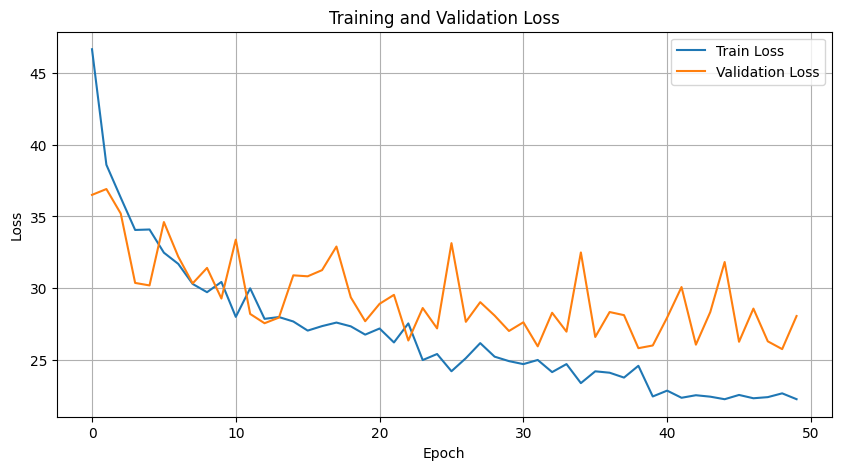

Training Accuracy: 85.4333
Training Precision Scores: [21.46680942 99.65484408]
Training Recall Scores: [93.25581395 85.09146341]
Training F1 Scores: [34.89991297 91.79914483]

Validation Accuracy: 85.5140
Validation Precision Scores: [18.36734694 99.43582511]
Validation Recall Scores: [87.09677419 85.45454545]
Validation F1 Scores: [30.33707865 91.91655802]

Threshold: 0.5
Validation Accuracy: 85.5140
Validation Precision Scores: [18.36734694 99.43582511]
Validation Recall Scores: [87.09677419 85.45454545]
Validation F1 Scores: [30.33707865 91.91655802]


Threshold: 0.6
Validation Accuracy: 89.0187
Validation Precision Scores: [22.76657061 99.36965331]
Validation Recall Scores: [84.94623656 89.17171717]
Validation F1 Scores: [35.90909091 93.99488927]


Threshold: 0.7
Validation Accuracy: 91.9003
Validation Precision Scores: [28.62453532 99.30404524]
Validation Recall Scores: [82.79569892 92.24242424]
Validation F1 Scores: [42.54143646 95.64306661]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 35.6669, Val Loss: 44.4312
Epoch 10/50, Train Loss: 31.5893, Val Loss: 31.2708
Epoch 15/50, Train Loss: 28.8944, Val Loss: 31.8371
Epoch 20/50, Train Loss: 25.7686, Val Loss: 30.8845
Epoch 25/50, Train Loss: 24.6262, Val Loss: 25.2845
Early stopping triggered after 29 epochs because no improvements over 10 subsequent epochs!
Epoch 29/50, Train Loss: 25.4325, Val Loss: 27.1847
The function took 47.95 seconds to execute.


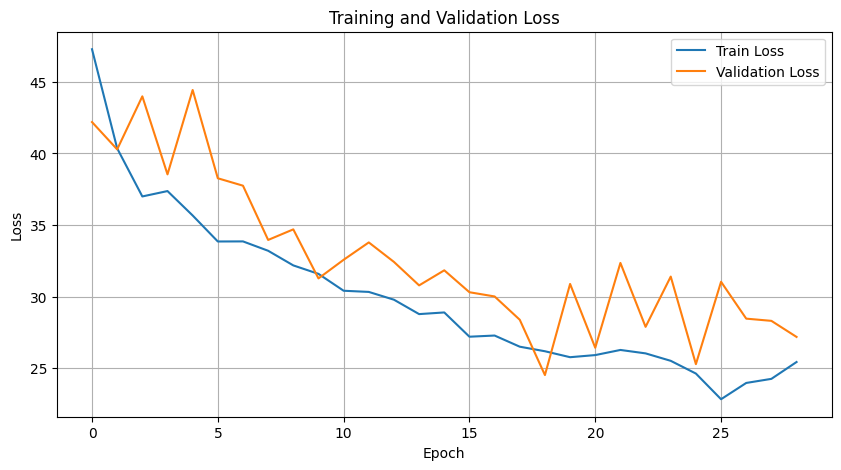

Training Accuracy: 84.8880
Training Precision Scores: [20.38014784 99.47468959]
Training Recall Scores: [89.76744186 84.67479675]
Training F1 Scores: [33.21858864 91.48001757]

Validation Accuracy: 84.6573
Validation Precision Scores: [17.77301927 99.52403617]
Validation Recall Scores: [89.24731183 84.48484848]
Validation F1 Scores: [29.64285714 91.38986014]

Threshold: 0.5
Validation Accuracy: 84.6573
Validation Precision Scores: [17.77301927 99.52403617]
Validation Recall Scores: [89.24731183 84.48484848]
Validation F1 Scores: [29.64285714 91.38986014]


Threshold: 0.6
Validation Accuracy: 90.4206
Validation Precision Scores: [25.24271845 99.33598938]
Validation Recall Scores: [83.87096774 90.66666667]
Validation F1 Scores: [38.80597015 94.8035488 ]


Threshold: 0.7
Validation Accuracy: 94.3536
Validation Precision Scores: [37.12871287 99.23922232]
Validation Recall Scores: [80.64516129 94.86868687]
Validation F1 Scores: [50.84745763 97.00475108]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 36.0812, Val Loss: 37.8928
Epoch 10/50, Train Loss: 30.2141, Val Loss: 30.0322
Epoch 15/50, Train Loss: 28.2051, Val Loss: 25.2592
Epoch 20/50, Train Loss: 26.0859, Val Loss: 33.7236
Epoch 25/50, Train Loss: 23.1307, Val Loss: 24.2374
Epoch 30/50, Train Loss: 22.8347, Val Loss: 25.2409
Epoch 35/50, Train Loss: 21.3108, Val Loss: 26.8158
Early stopping triggered after 37 epochs because no improvements over 10 subsequent epochs!
Epoch 37/50, Train Loss: 22.0978, Val Loss: 27.1195
The function took 64.19 seconds to execute.


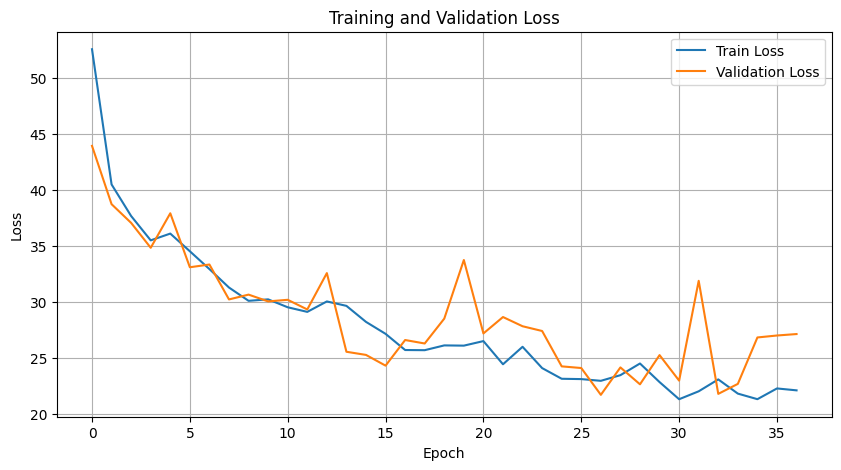

Training Accuracy: 87.5560
Training Precision Scores: [23.95577396 99.53714418]
Training Recall Scores: [90.69767442 87.41869919]
Training F1 Scores: [37.90087464 93.08516394]

Validation Accuracy: 87.5779
Validation Precision Scores: [21.46464646 99.63167587]
Validation Recall Scores: [91.39784946 87.43434343]
Validation F1 Scores: [34.76482618 93.13535614]

Threshold: 0.5
Validation Accuracy: 87.5779
Validation Precision Scores: [21.46464646 99.63167587]
Validation Recall Scores: [91.39784946 87.43434343]
Validation F1 Scores: [34.76482618 93.13535614]


Threshold: 0.6
Validation Accuracy: 91.5888
Validation Precision Scores: [28.71972318 99.56121106]
Validation Recall Scores: [89.24731183 91.67676768]
Validation F1 Scores: [43.45549738 95.45645772]


Threshold: 0.7
Validation Accuracy: 94.0421
Validation Precision Scores: [35.71428571 99.23664122]
Validation Recall Scores: [80.64516129 94.54545455]
Validation F1 Scores: [49.5049505  96.83426443]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 35.9466, Val Loss: 36.9110
Epoch 10/50, Train Loss: 29.9527, Val Loss: 28.3663
Epoch 15/50, Train Loss: 28.3227, Val Loss: 27.7759
Epoch 20/50, Train Loss: 26.2488, Val Loss: 26.8327
Epoch 25/50, Train Loss: 23.9363, Val Loss: 35.4073
Epoch 30/50, Train Loss: 25.0184, Val Loss: 28.4684
Epoch 35/50, Train Loss: 23.5111, Val Loss: 27.3258
Early stopping triggered after 39 epochs because no improvements over 10 subsequent epochs!
Epoch 39/50, Train Loss: 23.8274, Val Loss: 32.3510
The function took 71.95 seconds to execute.


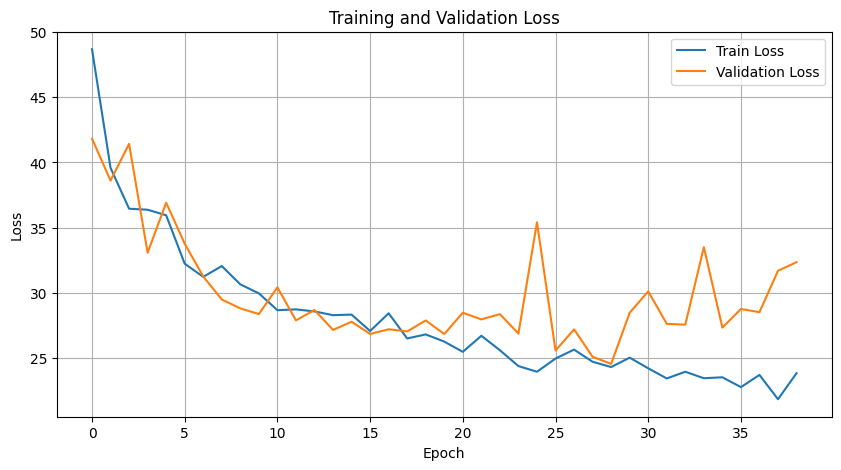

Training Accuracy: 89.2210
Training Precision Scores: [26.54192654 99.46754277]
Training Recall Scores: [89.06976744 89.22764228]
Training F1 Scores: [40.89695675 94.06974875]

Validation Accuracy: 89.3692
Validation Precision Scores: [23.98843931 99.549955  ]
Validation Recall Scores: [89.24731183 89.37373737]
Validation F1 Scores: [37.81321185 94.18777943]

Threshold: 0.5
Validation Accuracy: 89.3692
Validation Precision Scores: [23.98843931 99.549955  ]
Validation Recall Scores: [89.24731183 89.37373737]
Validation F1 Scores: [37.81321185 94.18777943]


Threshold: 0.6
Validation Accuracy: 92.0950
Validation Precision Scores: [29.32330827 99.3483927 ]
Validation Recall Scores: [83.87096774 92.4040404 ]
Validation F1 Scores: [43.454039   95.75047101]


Threshold: 0.7
Validation Accuracy: 94.1589
Validation Precision Scores: [36.09756098 99.19593737]
Validation Recall Scores: [79.56989247 94.70707071]
Validation F1 Scores: [49.66442953 96.89954527]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 36.4858, Val Loss: 36.4897
Epoch 10/50, Train Loss: 32.2860, Val Loss: 33.9348
Epoch 15/50, Train Loss: 26.9803, Val Loss: 28.0244
Epoch 20/50, Train Loss: 26.4693, Val Loss: 30.8505
Epoch 25/50, Train Loss: 23.4717, Val Loss: 31.7018
Early stopping triggered after 26 epochs because no improvements over 10 subsequent epochs!
Epoch 26/50, Train Loss: 24.5232, Val Loss: 32.1517
The function took 51.10 seconds to execute.


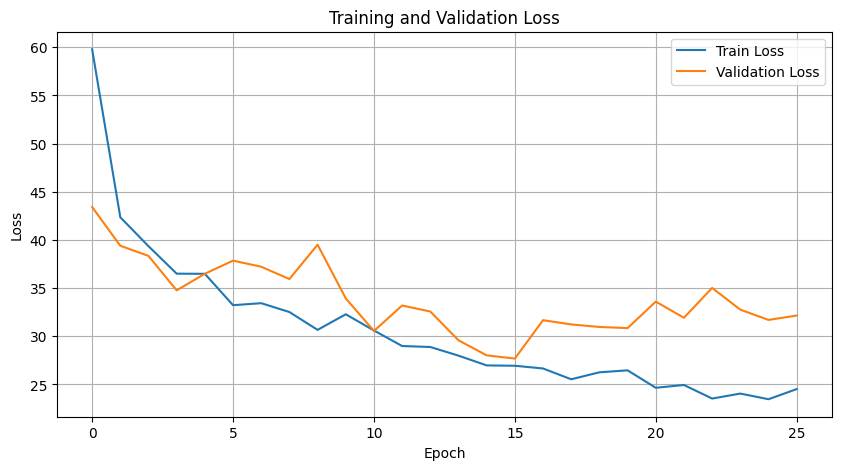

Training Accuracy: 85.7936
Training Precision Scores: [21.11173498 99.36388267]
Training Recall Scores: [87.44186047 85.72154472]
Training F1 Scores: [34.01175938 92.03993671]

Validation Accuracy: 85.7866
Validation Precision Scores: [18.66359447 99.43767573]
Validation Recall Scores: [87.09677419 85.73737374]
Validation F1 Scores: [30.74003795 92.08071165]

Threshold: 0.5
Validation Accuracy: 85.7866
Validation Precision Scores: [18.66359447 99.43767573]
Validation Recall Scores: [87.09677419 85.73737374]
Validation F1 Scores: [30.74003795 92.08071165]


Threshold: 0.6
Validation Accuracy: 92.7181
Validation Precision Scores: [29.56521739 98.93071001]
Validation Recall Scores: [73.11827957 93.45454545]
Validation F1 Scores: [42.10526316 96.11468938]


Threshold: 0.7
Validation Accuracy: 95.4050
Validation Precision Scores: [40.74074074 98.43814221]
Validation Recall Scores: [59.13978495 96.76767677]
Validation F1 Scores: [48.24561404 97.59576202]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 32.2481, Val Loss: 39.4665
Epoch 10/50, Train Loss: 28.7178, Val Loss: 28.8997
Epoch 15/50, Train Loss: 27.4231, Val Loss: 27.0659
Epoch 20/50, Train Loss: 25.3129, Val Loss: 25.4436
Epoch 25/50, Train Loss: 25.5814, Val Loss: 25.3141
Epoch 30/50, Train Loss: 23.1528, Val Loss: 25.7879
Epoch 35/50, Train Loss: 22.2994, Val Loss: 24.2995
Epoch 40/50, Train Loss: 23.8188, Val Loss: 27.1253
Early stopping triggered after 45 epochs because no improvements over 10 subsequent epochs!
Epoch 45/50, Train Loss: 22.6098, Val Loss: 24.3395
The function took 72.56 seconds to execute.


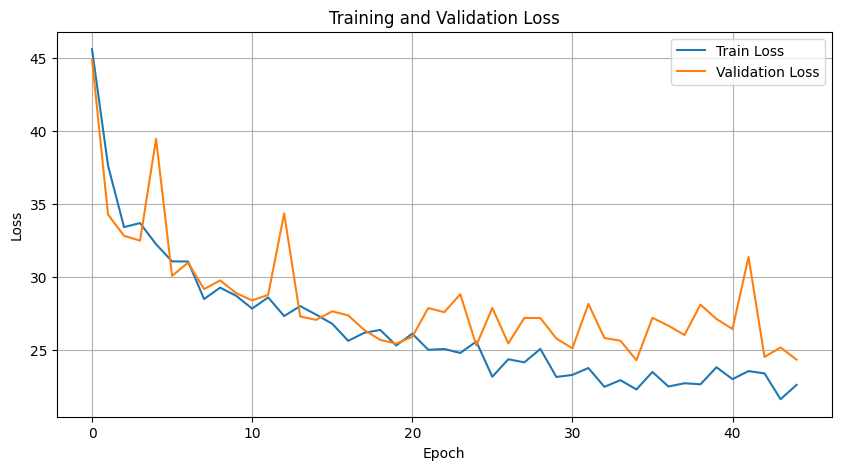

Training Accuracy: 88.1986
Training Precision Scores: [25.03192848 99.56341912]
Training Recall Scores: [91.1627907  88.06910569]
Training F1 Scores: [39.27855711 93.46419327]

Validation Accuracy: 88.2009
Validation Precision Scores: [21.77419355 99.45355191]
Validation Recall Scores: [87.09677419 88.24242424]
Validation F1 Scores: [34.83870968 93.51316635]

Threshold: 0.5
Validation Accuracy: 88.2009
Validation Precision Scores: [21.77419355 99.45355191]
Validation Recall Scores: [87.09677419 88.24242424]
Validation F1 Scores: [34.83870968 93.51316635]


Threshold: 0.6
Validation Accuracy: 92.0561
Validation Precision Scores: [28.57142857 99.17713296]
Validation Recall Scores: [79.56989247 92.52525253]
Validation F1 Scores: [42.04545455 95.73578595]


Threshold: 0.7
Validation Accuracy: 94.4704
Validation Precision Scores: [36.89839572 98.99202016]
Validation Recall Scores: [74.19354839 95.23232323]
Validation F1 Scores: [49.28571429 97.07578254]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 31.4871, Val Loss: 30.3308
Epoch 10/50, Train Loss: 28.1825, Val Loss: 29.4798
Epoch 15/50, Train Loss: 27.1969, Val Loss: 27.6052
Epoch 20/50, Train Loss: 25.1495, Val Loss: 29.6689
Epoch 25/50, Train Loss: 23.8057, Val Loss: 29.8742
Epoch 30/50, Train Loss: 23.4593, Val Loss: 26.0290
Epoch 35/50, Train Loss: 22.3585, Val Loss: 30.7845
Early stopping triggered after 40 epochs because no improvements over 10 subsequent epochs!
Epoch 40/50, Train Loss: 22.1124, Val Loss: 26.3411
The function took 64.92 seconds to execute.


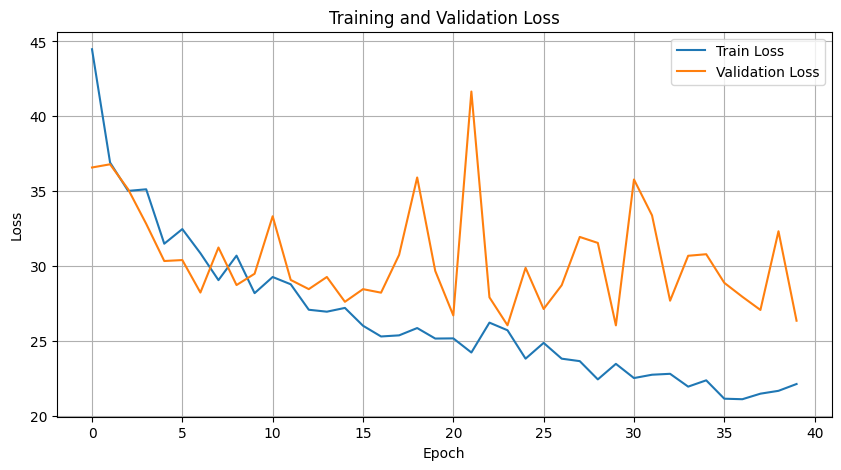

Training Accuracy: 86.3486
Training Precision Scores: [22.44897959 99.60028215]
Training Recall Scores: [92.09302326 86.09756098]
Training F1 Scores: [36.09845032 92.3580072 ]

Validation Accuracy: 86.2928
Validation Precision Scores: [19.23990499 99.44108058]
Validation Recall Scores: [87.09677419 86.26262626]
Validation F1 Scores: [31.51750973 92.38424924]

Threshold: 0.5
Validation Accuracy: 86.2928
Validation Precision Scores: [19.23990499 99.44108058]
Validation Recall Scores: [87.09677419 86.26262626]
Validation F1 Scores: [31.51750973 92.38424924]


Threshold: 0.6
Validation Accuracy: 90.8489
Validation Precision Scores: [26.01351351 99.29577465]
Validation Recall Scores: [82.79569892 91.15151515]
Validation F1 Scores: [39.58868895 95.04950495]


Threshold: 0.7
Validation Accuracy: 93.7305
Validation Precision Scores: [34.11214953 99.15038233]
Validation Recall Scores: [78.49462366 94.3030303 ]
Validation F1 Scores: [47.55700326 96.66597639]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 31.5433, Val Loss: 31.1909
Epoch 10/50, Train Loss: 27.9040, Val Loss: 26.5501
Epoch 15/50, Train Loss: 24.9998, Val Loss: 27.7084
Epoch 20/50, Train Loss: 23.4445, Val Loss: 26.7385
Early stopping triggered after 24 epochs because no improvements over 10 subsequent epochs!
Epoch 24/50, Train Loss: 21.2309, Val Loss: 25.3292
The function took 43.24 seconds to execute.


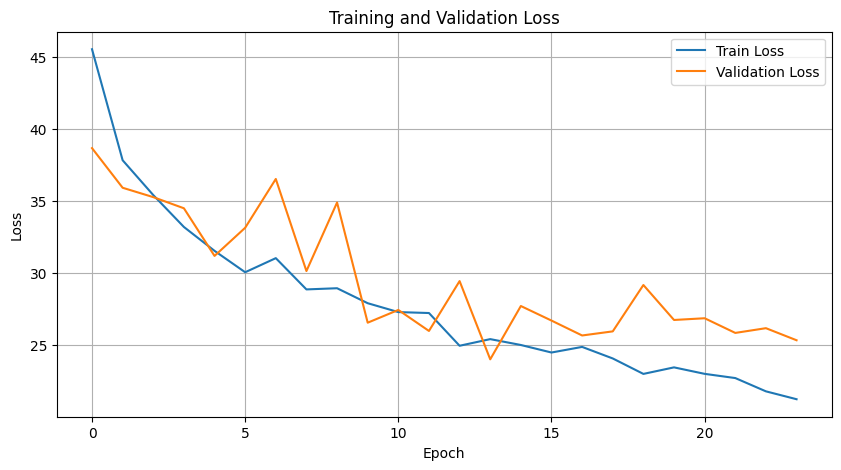

Training Accuracy: 88.4713
Training Precision Scores: [25.22996058 99.47416552]
Training Recall Scores: [89.30232558 88.43495935]
Training F1 Scores: [39.3442623  93.63029912]

Validation Accuracy: 88.3178
Validation Precision Scores: [21.79836512 99.40935938]
Validation Recall Scores: [86.02150538 88.4040404 ]
Validation F1 Scores: [34.7826087  93.58426005]

Threshold: 0.5
Validation Accuracy: 88.3178
Validation Precision Scores: [21.79836512 99.40935938]
Validation Recall Scores: [86.02150538 88.4040404 ]
Validation F1 Scores: [34.7826087  93.58426005]


Threshold: 0.6
Validation Accuracy: 92.5234
Validation Precision Scores: [30.12048193 99.22380336]
Validation Recall Scores: [80.64516129 92.96969697]
Validation F1 Scores: [43.85964912 95.99499374]


Threshold: 0.7
Validation Accuracy: 94.9766
Validation Precision Scores: [39.53488372 98.95659432]
Validation Recall Scores: [73.11827957 95.7979798 ]
Validation F1 Scores: [51.32075472 97.35167317]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 31.8201, Val Loss: 30.1860
Epoch 10/50, Train Loss: 28.8874, Val Loss: 30.1681
Epoch 15/50, Train Loss: 26.4350, Val Loss: 27.4466
Epoch 20/50, Train Loss: 24.0498, Val Loss: 28.3749
Epoch 25/50, Train Loss: 23.2077, Val Loss: 27.4230
Early stopping triggered after 26 epochs because no improvements over 10 subsequent epochs!
Epoch 26/50, Train Loss: 22.9098, Val Loss: 28.1542
The function took 49.34 seconds to execute.


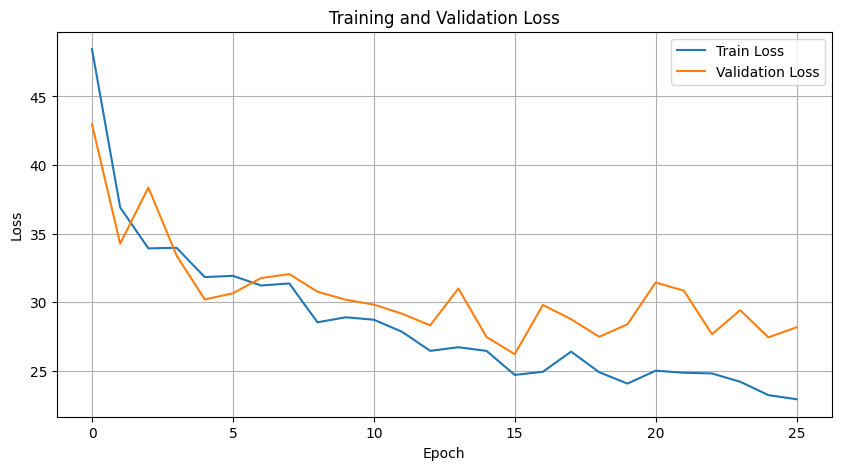

Training Accuracy: 89.1237
Training Precision Scores: [25.72438163 99.25465839]
Training Recall Scores: [84.65116279 89.31910569]
Training F1 Scores: [39.45799458 94.02514041]

Validation Accuracy: 88.4346
Validation Precision Scores: [22.2826087 99.5      ]
Validation Recall Scores: [88.17204301 88.44444444]
Validation F1 Scores: [35.57483731 93.64705882]

Threshold: 0.5
Validation Accuracy: 88.4346
Validation Precision Scores: [22.2826087 99.5      ]
Validation Recall Scores: [88.17204301 88.44444444]
Validation F1 Scores: [35.57483731 93.64705882]


Threshold: 0.6
Validation Accuracy: 93.0296
Validation Precision Scores: [30.45454545 98.89267462]
Validation Recall Scores: [72.04301075 93.81818182]
Validation F1 Scores: [42.8115016  96.28861704]


Threshold: 0.7
Validation Accuracy: 95.1713
Validation Precision Scores: [39.73509934 98.63467108]
Validation Recall Scores: [64.51612903 96.32323232]
Validation F1 Scores: [49.18032787 97.46524939]


Threshold: 0.8
Validation Accuracy: 96.

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 32.7942, Val Loss: 38.8752
Epoch 10/50, Train Loss: 29.2502, Val Loss: 33.2500
Epoch 15/50, Train Loss: 24.9828, Val Loss: 28.8606
Epoch 20/50, Train Loss: 24.3056, Val Loss: 29.5028
Early stopping triggered after 21 epochs because no improvements over 10 subsequent epochs!
Epoch 21/50, Train Loss: 23.8951, Val Loss: 30.7951
The function took 42.14 seconds to execute.


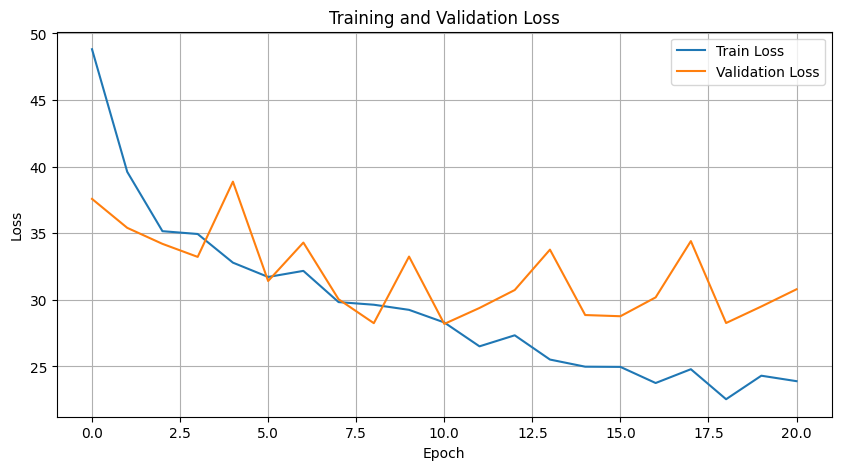

Training Accuracy: 84.2064
Training Precision Scores: [19.24664603 99.31589054]
Training Recall Scores: [86.74418605 84.09552846]
Training F1 Scores: [31.50337838 91.07418006]

Validation Accuracy: 84.5405
Validation Precision Scores: [17.38197425 99.42911513]
Validation Recall Scores: [87.09677419 84.44444444]
Validation F1 Scores: [28.980322  91.3261962]

Threshold: 0.5
Validation Accuracy: 84.5405
Validation Precision Scores: [17.38197425 99.42911513]
Validation Recall Scores: [87.09677419 84.44444444]
Validation F1 Scores: [28.980322  91.3261962]


Threshold: 0.6
Validation Accuracy: 89.1745
Validation Precision Scores: [22.05438066 99.10594546]
Validation Recall Scores: [78.49462366 89.57575758]
Validation F1 Scores: [34.43396226 94.10016978]


Threshold: 0.7
Validation Accuracy: 92.2508
Validation Precision Scores: [26.95652174 98.67408041]
Validation Recall Scores: [66.66666667 93.21212121]
Validation F1 Scores: [38.39009288 95.86536464]


Threshold: 0.8
Validation Accuracy: 94.

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 34.8962, Val Loss: 37.0460
Epoch 10/50, Train Loss: 28.3177, Val Loss: 30.9490
Epoch 15/50, Train Loss: 27.4451, Val Loss: 27.0874
Epoch 20/50, Train Loss: 24.4178, Val Loss: 29.4363
Epoch 25/50, Train Loss: 22.9420, Val Loss: 27.8007
Epoch 30/50, Train Loss: 24.4667, Val Loss: 25.1280
Early stopping triggered after 32 epochs because no improvements over 10 subsequent epochs!
Epoch 32/50, Train Loss: 23.1241, Val Loss: 25.6815
The function took 67.02 seconds to execute.


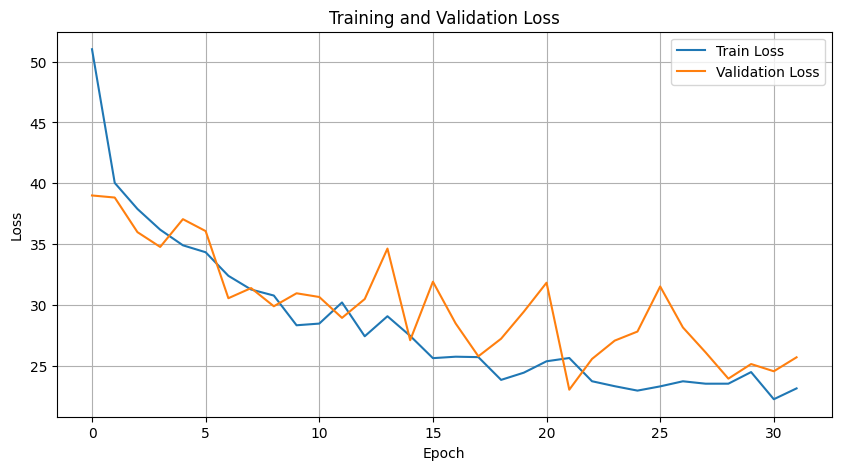

Training Accuracy: 84.6543
Training Precision Scores: [20.03138075 99.43766451]
Training Recall Scores: [89.06976744 84.46138211]
Training F1 Scores: [32.70708796 91.33970766]

Validation Accuracy: 84.6184
Validation Precision Scores: [17.45689655 99.42965779]
Validation Recall Scores: [87.09677419 84.52525253]
Validation F1 Scores: [29.08438061 91.37366237]

Threshold: 0.5
Validation Accuracy: 84.6184
Validation Precision Scores: [17.45689655 99.42965779]
Validation Recall Scores: [87.09677419 84.52525253]
Validation F1 Scores: [29.08438061 91.37366237]


Threshold: 0.6
Validation Accuracy: 90.2259
Validation Precision Scores: [24.01315789 99.11660777]
Validation Recall Scores: [78.49462366 90.66666667]
Validation F1 Scores: [36.77581864 94.70352395]


Threshold: 0.7
Validation Accuracy: 93.2632
Validation Precision Scores: [30.76923077 98.77118644]
Validation Recall Scores: [68.8172043  94.18181818]
Validation F1 Scores: [42.52491694 96.42192347]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 30.9684, Val Loss: 37.8827
Epoch 10/50, Train Loss: 27.4666, Val Loss: 30.3953
Epoch 15/50, Train Loss: 26.3469, Val Loss: 29.2560
Epoch 20/50, Train Loss: 24.6003, Val Loss: 28.1082
Epoch 25/50, Train Loss: 22.7924, Val Loss: 28.2675
Epoch 30/50, Train Loss: 22.2489, Val Loss: 24.6500
Epoch 35/50, Train Loss: 19.1823, Val Loss: 25.8477
Early stopping triggered after 36 epochs because no improvements over 10 subsequent epochs!
Epoch 36/50, Train Loss: 21.0164, Val Loss: 25.3100
The function took 65.85 seconds to execute.


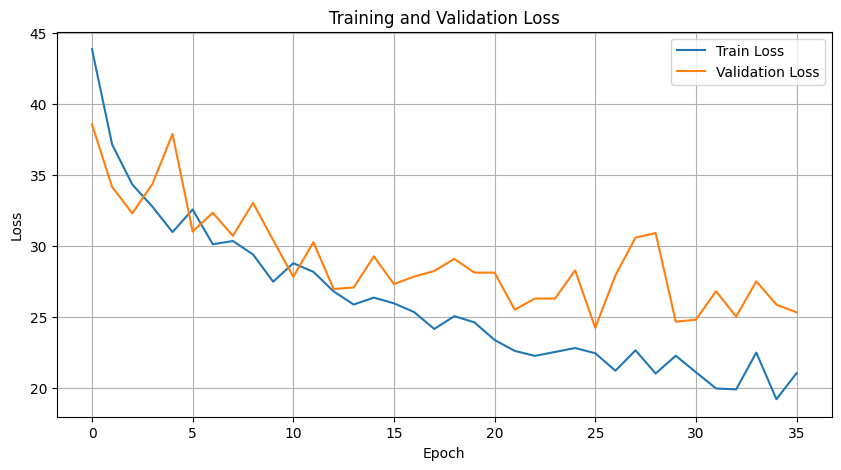

Training Accuracy: 90.8374
Training Precision Scores: [30.23975251 99.56555642]
Training Recall Scores: [90.93023256 90.83333333]
Training F1 Scores: [45.38595473 94.99920285]

Validation Accuracy: 90.8879
Validation Precision Scores: [26.57807309 99.42655492]
Validation Recall Scores: [86.02150538 91.07070707]
Validation F1 Scores: [40.60913706 95.06537326]

Threshold: 0.5
Validation Accuracy: 90.8879
Validation Precision Scores: [26.57807309 99.42655492]
Validation Recall Scores: [86.02150538 91.07070707]
Validation F1 Scores: [40.60913706 95.06537326]


Threshold: 0.6
Validation Accuracy: 93.8863
Validation Precision Scores: [35.45454545 99.36115843]
Validation Recall Scores: [83.87096774 94.26262626]
Validation F1 Scores: [49.84025559 96.74476467]


Threshold: 0.7
Validation Accuracy: 95.7165
Validation Precision Scores: [43.97163121 98.72270293]
Validation Recall Scores: [66.66666667 96.80808081]
Validation F1 Scores: [52.99145299 97.75601795]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 31.0657, Val Loss: 34.7423
Epoch 10/50, Train Loss: 30.2400, Val Loss: 30.1931
Epoch 15/50, Train Loss: 29.0654, Val Loss: 30.7214
Epoch 20/50, Train Loss: 24.2088, Val Loss: 27.2114
Epoch 25/50, Train Loss: 22.4656, Val Loss: 29.3814
Epoch 30/50, Train Loss: 20.3861, Val Loss: 33.9755
Early stopping triggered after 34 epochs because no improvements over 10 subsequent epochs!
Epoch 34/50, Train Loss: 21.8881, Val Loss: 31.7635
The function took 66.42 seconds to execute.


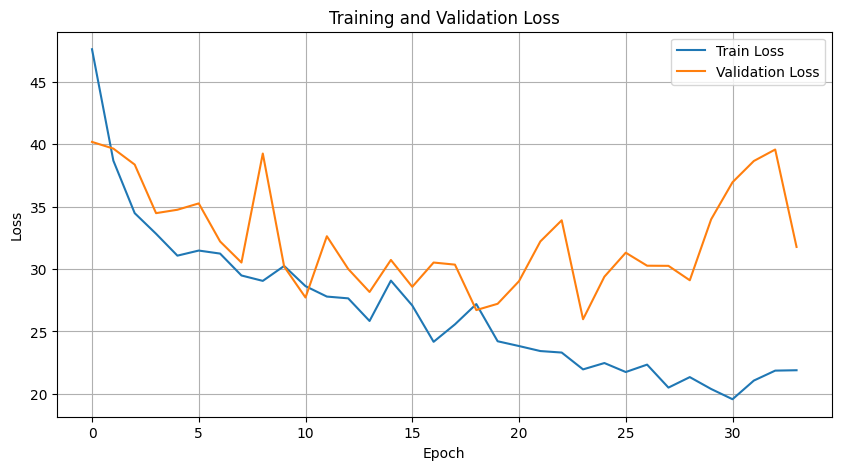

Training Accuracy: 88.4031
Training Precision Scores: [25.08185986 99.46242708]
Training Recall Scores: [89.06976744 88.37398374]
Training F1 Scores: [39.14154318 93.59091643]

Validation Accuracy: 88.3956
Validation Precision Scores: [22.07084469 99.45479328]
Validation Recall Scores: [87.09677419 88.44444444]
Validation F1 Scores: [35.2173913  93.62703165]

Threshold: 0.5
Validation Accuracy: 88.3956
Validation Precision Scores: [22.07084469 99.45479328]
Validation Recall Scores: [87.09677419 88.44444444]
Validation F1 Scores: [35.2173913  93.62703165]


Threshold: 0.6
Validation Accuracy: 92.2118
Validation Precision Scores: [28.68525896 99.09365559]
Validation Recall Scores: [77.41935484 92.76767677]
Validation F1 Scores: [41.86046512 95.8263773 ]


Threshold: 0.7
Validation Accuracy: 94.6262
Validation Precision Scores: [36.19631902 98.58627859]
Validation Recall Scores: [63.44086022 95.7979798 ]
Validation F1 Scores: [46.09375    97.17213115]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 32.0823, Val Loss: 33.7521
Epoch 10/50, Train Loss: 28.7652, Val Loss: 33.3932
Epoch 15/50, Train Loss: 25.1126, Val Loss: 36.3572
Epoch 20/50, Train Loss: 23.3557, Val Loss: 32.0674
Epoch 25/50, Train Loss: 21.2063, Val Loss: 31.1142
Early stopping triggered after 28 epochs because no improvements over 10 subsequent epochs!
Epoch 28/50, Train Loss: 20.4974, Val Loss: 33.7039
The function took 58.09 seconds to execute.


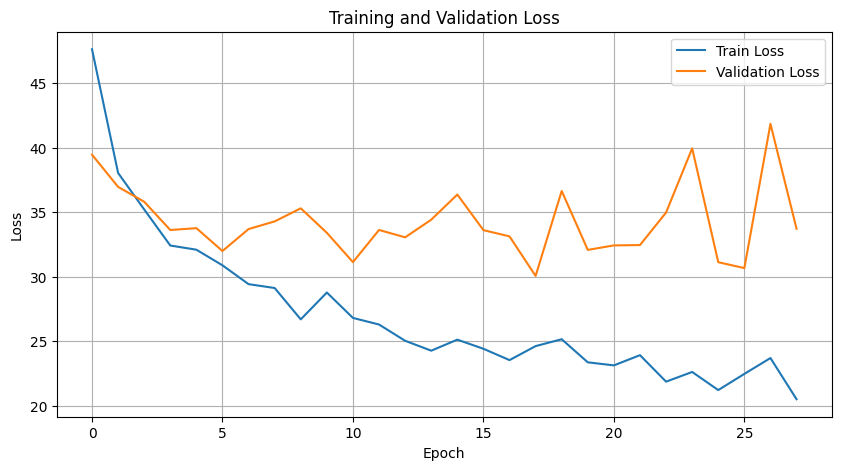

Training Accuracy: 88.9094
Training Precision Scores: [25.60220234 99.34217988]
Training Recall Scores: [86.51162791 89.01422764]
Training F1 Scores: [39.51141795 93.8950528 ]

Validation Accuracy: 88.9408
Validation Precision Scores: [22.31884058 99.28025191]
Validation Recall Scores: [82.79569892 89.17171717]
Validation F1 Scores: [35.15981735 93.95487441]

Threshold: 0.5
Validation Accuracy: 88.9408
Validation Precision Scores: [22.31884058 99.28025191]
Validation Recall Scores: [82.79569892 89.17171717]
Validation F1 Scores: [35.15981735 93.95487441]


Threshold: 0.6
Validation Accuracy: 92.2897
Validation Precision Scores: [28.91566265 99.09443726]
Validation Recall Scores: [77.41935484 92.84848485]
Validation F1 Scores: [42.10526316 95.8698373 ]


Threshold: 0.7
Validation Accuracy: 94.5093
Validation Precision Scores: [36.36363636 98.78762542]
Validation Recall Scores: [68.8172043  95.47474747]
Validation F1 Scores: [47.58364312 97.10293815]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 32.7077, Val Loss: 33.1561
Epoch 10/50, Train Loss: 28.0669, Val Loss: 27.3432
Epoch 15/50, Train Loss: 24.0067, Val Loss: 25.1995
Epoch 20/50, Train Loss: 22.3045, Val Loss: 28.9219
Epoch 25/50, Train Loss: 22.5515, Val Loss: 27.4518
Epoch 30/50, Train Loss: 20.5674, Val Loss: 29.9700
Epoch 35/50, Train Loss: 18.9417, Val Loss: 25.9597
Early stopping triggered after 39 epochs because no improvements over 10 subsequent epochs!
Epoch 39/50, Train Loss: 20.8148, Val Loss: 26.2574
The function took 83.45 seconds to execute.


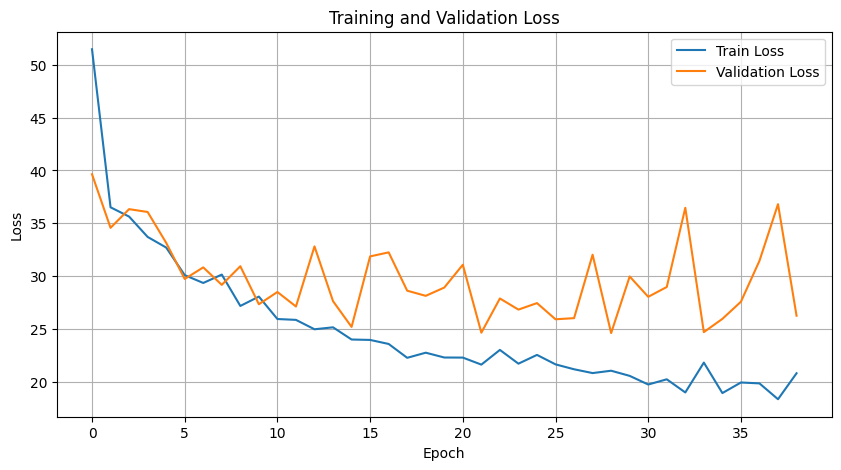

Training Accuracy: 91.9085
Training Precision Scores: [32.55004352 99.38603223]
Training Recall Scores: [86.97674419 92.12398374]
Training F1 Scores: [47.37175427 95.61731976]

Validation Accuracy: 91.6277
Validation Precision Scores: [27.73722628 99.25893636]
Validation Recall Scores: [81.72043011 92.        ]
Validation F1 Scores: [41.41689373 95.49171734]

Threshold: 0.5
Validation Accuracy: 91.6277
Validation Precision Scores: [27.73722628 99.25893636]
Validation Recall Scores: [81.72043011 92.        ]
Validation F1 Scores: [41.41689373 95.49171734]


Threshold: 0.6
Validation Accuracy: 94.6262
Validation Precision Scores: [38.21989529 99.15860328]
Validation Recall Scores: [78.49462366 95.23232323]
Validation F1 Scores: [51.4084507  97.15581204]


Threshold: 0.7
Validation Accuracy: 95.9112
Validation Precision Scores: [45.94594595 98.96694215]
Validation Recall Scores: [73.11827957 96.76767677]
Validation F1 Scores: [56.43153527 97.85495403]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 31.7973, Val Loss: 36.4783
Epoch 10/50, Train Loss: 27.1004, Val Loss: 30.5018
Epoch 15/50, Train Loss: 24.9957, Val Loss: 34.0907
Epoch 20/50, Train Loss: 23.2362, Val Loss: 44.2907
Early stopping triggered after 23 epochs because no improvements over 10 subsequent epochs!
Epoch 23/50, Train Loss: 24.0044, Val Loss: 37.5148
The function took 52.31 seconds to execute.


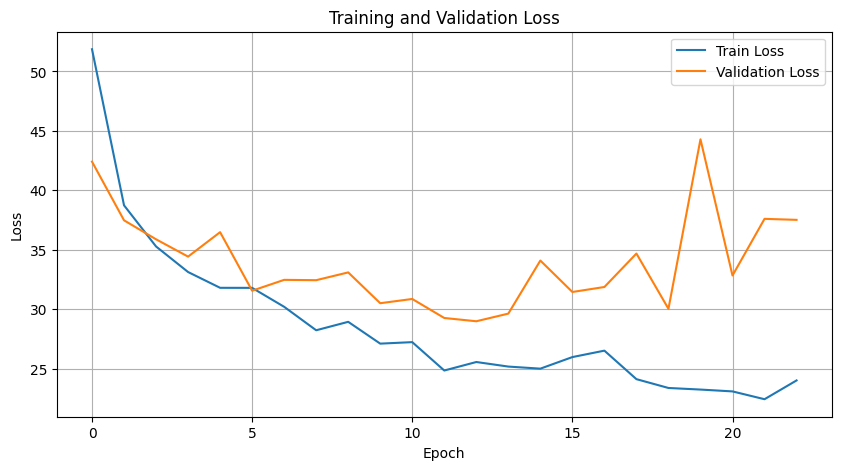

Training Accuracy: 88.2668
Training Precision Scores: [24.45616348 99.32594539]
Training Recall Scores: [86.27906977 88.35365854]
Training F1 Scores: [38.10991269 93.51906632]

Validation Accuracy: 87.8115
Validation Precision Scores: [20.58823529 99.27073838]
Validation Recall Scores: [82.79569892 88.        ]
Validation F1 Scores: [32.9764454  93.29620904]

Threshold: 0.5
Validation Accuracy: 87.8115
Validation Precision Scores: [20.58823529 99.27073838]
Validation Recall Scores: [82.79569892 88.        ]
Validation F1 Scores: [32.9764454  93.29620904]


Threshold: 0.6
Validation Accuracy: 93.4969
Validation Precision Scores: [32.03883495 98.85690093]
Validation Recall Scores: [70.96774194 94.34343434]
Validation F1 Scores: [44.14715719 96.54744676]


Threshold: 0.7
Validation Accuracy: 95.4050
Validation Precision Scores: [41.00719424 98.5179086 ]
Validation Recall Scores: [61.29032258 96.68686869]
Validation F1 Scores: [49.13793103 97.59380098]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 30.8141, Val Loss: 35.5175
Epoch 10/50, Train Loss: 29.4359, Val Loss: 32.4896
Epoch 15/50, Train Loss: 25.1992, Val Loss: 27.5151
Epoch 20/50, Train Loss: 23.7240, Val Loss: 29.3530
Epoch 25/50, Train Loss: 22.9097, Val Loss: 26.6015
Epoch 30/50, Train Loss: 22.5855, Val Loss: 30.5687
Epoch 35/50, Train Loss: 22.1428, Val Loss: 30.6985
Epoch 40/50, Train Loss: 20.1300, Val Loss: 28.6704
Early stopping triggered after 42 epochs because no improvements over 10 subsequent epochs!
Epoch 42/50, Train Loss: 18.2156, Val Loss: 28.3854
The function took 100.90 seconds to execute.


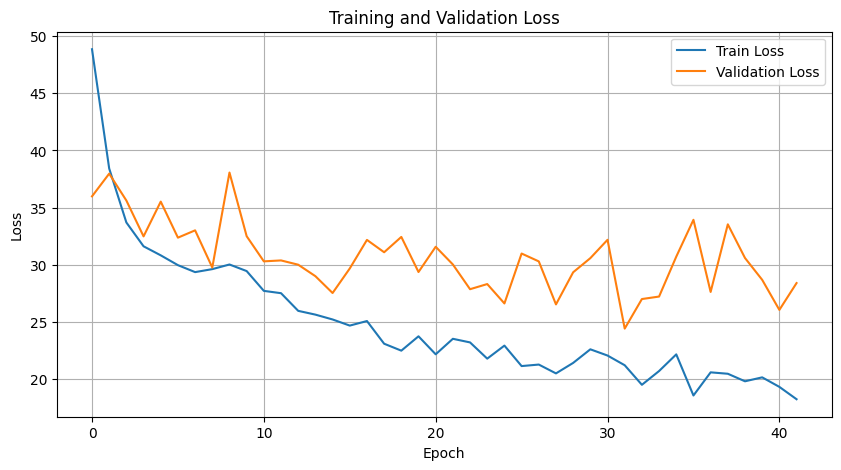

Training Accuracy: 91.8500
Training Precision Scores: [32.44176014 99.40730985]
Training Recall Scores: [87.44186047 92.04268293]
Training F1 Scores: [47.32536186 95.58334653]

Validation Accuracy: 91.0047
Validation Precision Scores: [25.53191489 99.08136483]
Validation Recall Scores: [77.41935484 91.51515152]
Validation F1 Scores: [38.4        95.14807813]

Threshold: 0.5
Validation Accuracy: 91.0047
Validation Precision Scores: [25.53191489 99.08136483]
Validation Recall Scores: [77.41935484 91.51515152]
Validation F1 Scores: [38.4        95.14807813]


Threshold: 0.6
Validation Accuracy: 93.6137
Validation Precision Scores: [33.17535545 99.02418328]
Validation Recall Scores: [75.2688172 94.3030303]
Validation F1 Scores: [46.05263158 96.60596026]


Threshold: 0.7
Validation Accuracy: 94.6651
Validation Precision Scores: [36.74698795 98.66777685]
Validation Recall Scores: [65.59139785 95.75757576]
Validation F1 Scores: [47.1042471  97.19089604]


Threshold: 0.8
Validation Accuracy: 9

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 31.4625, Val Loss: 30.0590
Epoch 10/50, Train Loss: 27.3243, Val Loss: 29.2751
Epoch 15/50, Train Loss: 24.6347, Val Loss: 29.9443
Epoch 20/50, Train Loss: 22.1066, Val Loss: 26.0488
Epoch 25/50, Train Loss: 20.2852, Val Loss: 35.0586
Early stopping triggered after 29 epochs because no improvements over 10 subsequent epochs!
Epoch 29/50, Train Loss: 20.3637, Val Loss: 31.4996
The function took 72.44 seconds to execute.


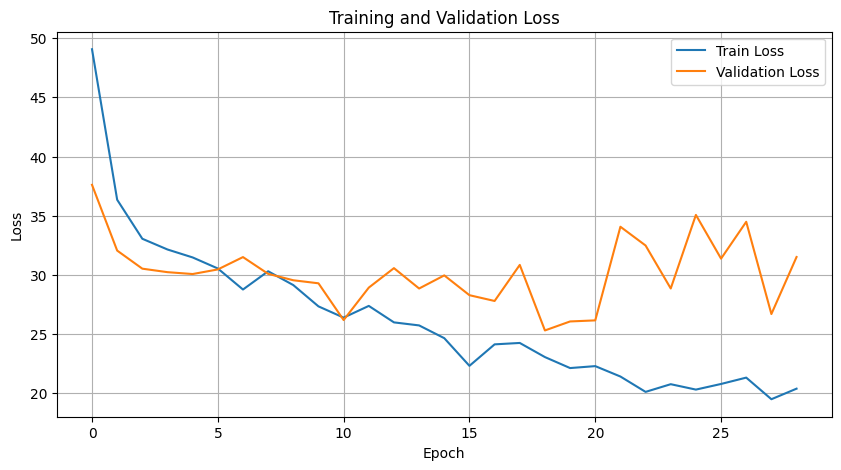

Training Accuracy: 88.1500
Training Precision Scores: [24.69453376 99.47217441]
Training Recall Scores: [89.30232558 88.0995935 ]
Training F1 Scores: [38.69017632 93.44112099]

Validation Accuracy: 88.2788
Validation Precision Scores: [21.27071823 99.27470535]
Validation Recall Scores: [82.79569892 88.48484848]
Validation F1 Scores: [33.84615385 93.56975005]

Threshold: 0.5
Validation Accuracy: 88.2788
Validation Precision Scores: [21.27071823 99.27470535]
Validation Recall Scores: [82.79569892 88.48484848]
Validation F1 Scores: [33.84615385 93.56975005]


Threshold: 0.6
Validation Accuracy: 91.5498
Validation Precision Scores: [27.53623188 99.2582897 ]
Validation Recall Scores: [81.72043011 91.91919192]
Validation F1 Scores: [41.19241192 95.44787078]


Threshold: 0.7
Validation Accuracy: 93.5748
Validation Precision Scores: [33.33333333 99.10714286]
Validation Recall Scores: [77.41935484 94.18181818]
Validation F1 Scores: [46.60194175 96.58172778]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 32.7715, Val Loss: 30.0201
Epoch 10/50, Train Loss: 27.9554, Val Loss: 25.9073
Epoch 15/50, Train Loss: 22.8058, Val Loss: 26.2922
Epoch 20/50, Train Loss: 20.4925, Val Loss: 27.4988
Early stopping triggered after 22 epochs because no improvements over 10 subsequent epochs!
Epoch 22/50, Train Loss: 21.4532, Val Loss: 27.3474
The function took 59.51 seconds to execute.


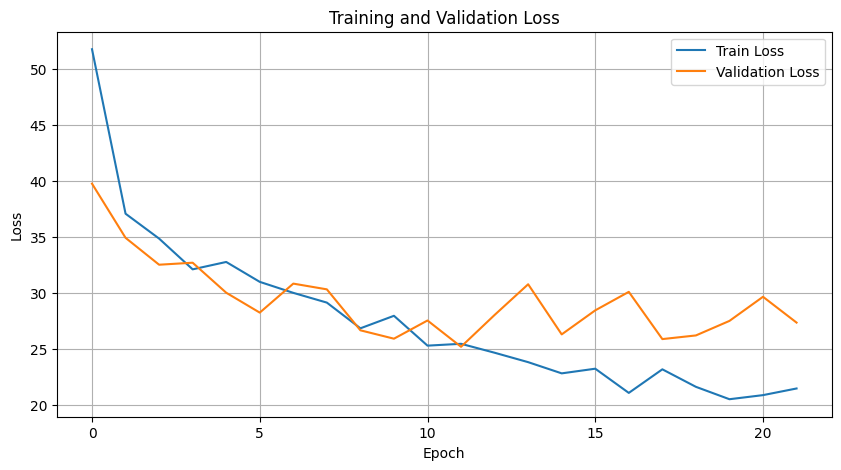

Training Accuracy: 86.0078
Training Precision Scores: [21.56973461 99.43522767]
Training Recall Scores: [88.8372093  85.88414634]
Training F1 Scores: [34.71149478 92.16424014]

Validation Accuracy: 85.4751
Validation Precision Scores: [18.75      99.5754717]
Validation Recall Scores: [90.32258065 85.29292929]
Validation F1 Scores: [31.05360444 91.88248096]

Threshold: 0.5
Validation Accuracy: 85.4751
Validation Precision Scores: [18.75      99.5754717]
Validation Recall Scores: [90.32258065 85.29292929]
Validation F1 Scores: [31.05360444 91.88248096]


Threshold: 0.6
Validation Accuracy: 91.5888
Validation Precision Scores: [27.95698925 99.34469201]
Validation Recall Scores: [83.87096774 91.87878788]
Validation F1 Scores: [41.93548387 95.46599496]


Threshold: 0.7
Validation Accuracy: 94.3925
Validation Precision Scores: [36.64921466 99.03239377]
Validation Recall Scores: [75.2688172  95.11111111]
Validation F1 Scores: [49.29577465 97.03215169]


Threshold: 0.8
Validation Accuracy: 95.

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 31.5426, Val Loss: 33.8985
Epoch 10/50, Train Loss: 27.9802, Val Loss: 31.7689
Epoch 15/50, Train Loss: 24.5303, Val Loss: 32.4647
Epoch 20/50, Train Loss: 25.6952, Val Loss: 28.4733
Epoch 25/50, Train Loss: 20.9132, Val Loss: 30.1094
Epoch 30/50, Train Loss: 19.8588, Val Loss: 29.6673
Early stopping triggered after 32 epochs because no improvements over 10 subsequent epochs!
Epoch 32/50, Train Loss: 20.8468, Val Loss: 32.5793
The function took 92.62 seconds to execute.


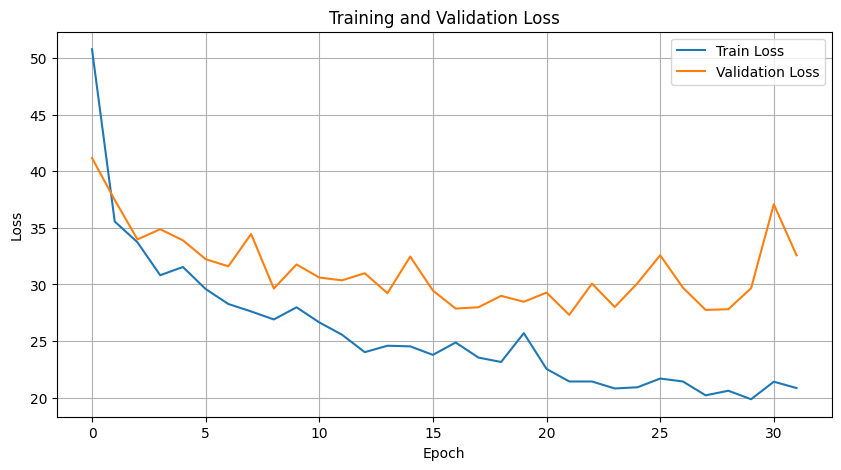

Training Accuracy: 90.0487
Training Precision Scores: [27.71084337 99.30664281]
Training Recall Scores: [85.58139535 90.24390244]
Training F1 Scores: [41.86575654 94.55861996]

Validation Accuracy: 90.0701
Validation Precision Scores: [24.36708861 99.28952043]
Validation Recall Scores: [82.79569892 90.34343434]
Validation F1 Scores: [37.65281174 94.60545801]

Threshold: 0.5
Validation Accuracy: 90.0701
Validation Precision Scores: [24.36708861 99.28952043]
Validation Recall Scores: [82.79569892 90.34343434]
Validation F1 Scores: [37.65281174 94.60545801]


Threshold: 0.6
Validation Accuracy: 92.8738
Validation Precision Scores: [30.43478261 99.01625321]
Validation Recall Scores: [75.2688172  93.53535354]
Validation F1 Scores: [43.34365325 96.19779763]


Threshold: 0.7
Validation Accuracy: 94.1589
Validation Precision Scores: [34.25414365 98.7012987 ]
Validation Recall Scores: [66.66666667 95.19191919]
Validation F1 Scores: [45.25547445 96.91484986]


Threshold: 0.8
Validation Accuracy:

In [12]:
embedding_sizes = [8,16,32,64,128,256]
hidden_dims = [8,16,32,64,128,256,320, 384, 512]

for i in range(len(embedding_sizes)):
    for j in range(i,len(hidden_dims)):
        embedding_size=embedding_sizes[i]
        hidden_dim=hidden_dims[j]
        print("-------------------------------------------------------------------------")
        print("-------------------------------------------------------------------------")
        print("-------------------------------------------------------------------------")
        print(f"Trying with embedding size {embedding_size} and hidden dim {hidden_dim}")

        # Create embedding layer with the given vocabulary size and embedding size
        vocabulary_size = len(vectorizer.vocabulary_) + 1  # Add 1 for out-of-vocabulary
        embeddings = nn.Embedding(vocabulary_size, embedding_size)
        X_train_graph = GraphDataset(X_train, y_train, embeddings)
        X_val_graph = GraphDataset(X_val, y_val, embeddings)
        X_test_graph = GraphDataset(X_test, y_test, embeddings)
        
        # Create DataLoader for batching
        # NOTICE: This data loader is from torch_geometric.loader!! It is not from torch.utils.data
        batch_size = 64
        train_loader = torch_geometric.loader.DataLoader(X_train_graph, batch_size=batch_size, shuffle=True)
        val_loader = torch_geometric.loader.DataLoader(X_val_graph, batch_size=batch_size, shuffle=False)
        test_loader = torch_geometric.loader.DataLoader(X_test_graph, batch_size=batch_size, shuffle=False)
        
        class_weight = compute_class_weight(class_weight='balanced', classes=np.unique(y_train_original), y=y_train_original)  # Computing class weights
        class_weight_tensor = torch.tensor(class_weight, dtype=torch.float32).to(device)  # Converting to PyTorch tensor
        criterion = nn.CrossEntropyLoss(weight=class_weight_tensor)
        num_epochs = 50
        model = GCN(input_dim=embedding_size, hidden_dim=hidden_dim, output_dim=2).to(device)
        optimizer = optim.AdamW(model.parameters(), lr=0.01, weight_decay=0.01)
        training_loop(model, train_loader, val_loader, X_train_graph, X_val_graph, device, optimizer, num_epochs, criterion)
        
        train_accuracy, train_precisionscores, train_recallscores, train_f1scores, _, _ = testing_model(model,train_loader,device)
        val_accuracy, val_precisionscores, val_recallscores, val_f1scores, _, _ = testing_model(model,val_loader,device)
        #test_accuracy, test_precisionscores, test_recallscores, test_f1scores, all_labels_test, all_predictions_test = testing_model(model,test_loader,device)
        
        stats(train_accuracy, train_precisionscores, train_recallscores, train_f1scores, 'Training')
        stats(val_accuracy, val_precisionscores, val_recallscores, val_f1scores, 'Validation')
        #stats(test_accuracy, test_precisionscores, test_recallscores, test_f1scores, 'Test')
        #ConfusionMatrixDisplay.from_predictions(all_labels_test, all_predictions_test, cmap='Blues')
        #ConfusionMatrixDisplay.from_predictions(all_labels_test, all_predictions_test, normalize='true', cmap='Blues')
        
        # Test with different thresholds
        for threshold in [0.5, 0.6, 0.7, 0.8, 0.9]:
            print(f"Threshold: {threshold}")
            val_accuracy, val_precisionscores, val_recallscores, val_f1scores, _, _ = testing_model_with_threshold(model,val_loader,device,threshold=threshold)
            stats(val_accuracy, val_precisionscores, val_recallscores, val_f1scores, 'Validation')
            print()

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 37.3670, Val Loss: 41.0201
Epoch 10/50, Train Loss: 33.9726, Val Loss: 34.1704
Epoch 15/50, Train Loss: 31.5596, Val Loss: 29.4678
Epoch 20/50, Train Loss: 30.3961, Val Loss: 26.6791
Epoch 25/50, Train Loss: 27.9115, Val Loss: 27.4083
Epoch 30/50, Train Loss: 26.0020, Val Loss: 25.5574
Epoch 35/50, Train Loss: 26.8470, Val Loss: 27.6204
Early stopping triggered after 40 epochs because no improvements over 10 subsequent epochs!
Epoch 40/50, Train Loss: 25.3462, Val Loss: 26.0847
The function took 57.13 seconds to execute.


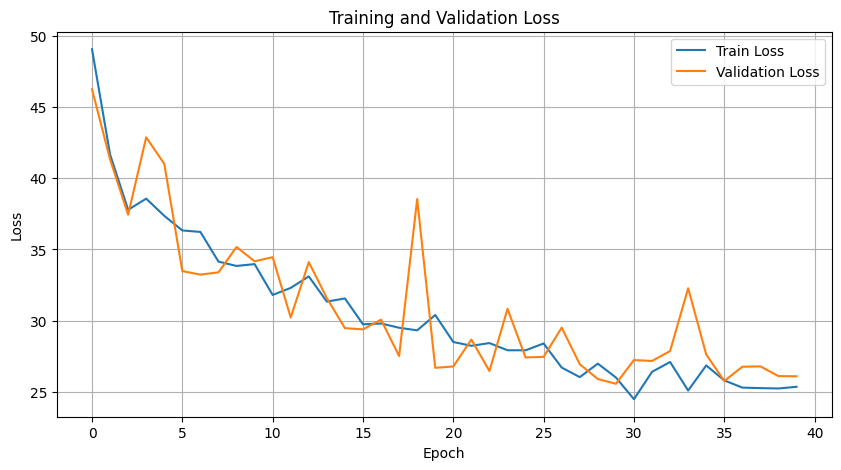

Test Accuracy: 96.4953
Test Precision Scores: [52.83018868 97.41550696]
Test Recall Scores: [30.10752688 98.98989899]
Test F1 Scores: [38.35616438 98.19639279]



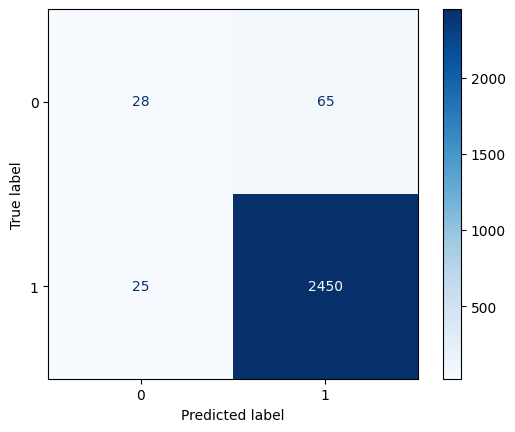

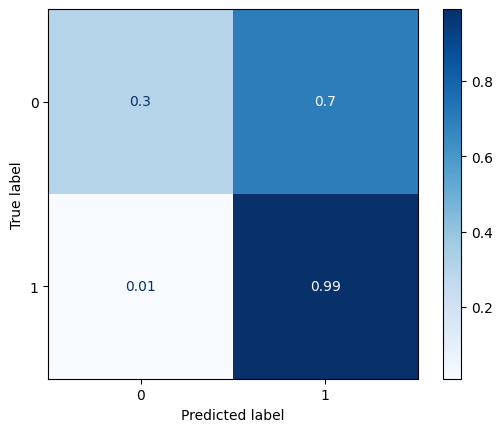

In [26]:
# 16 and hidden dim 128 threshold 0.9

embedding_size=16
hidden_dim=128
threshold = 0.9 

# Create embedding layer with the given vocabulary size and embedding size
vocabulary_size = len(vectorizer.vocabulary_) + 1  # Add 1 for out-of-vocabulary
embeddings = nn.Embedding(vocabulary_size, embedding_size)
X_train_graph = GraphDataset(X_train, y_train, embeddings)
X_val_graph = GraphDataset(X_val, y_val, embeddings)
X_test_graph = GraphDataset(X_test, y_test, embeddings)

# Create DataLoader for batching
# NOTICE: This data loader is from torch_geometric.loader!! It is not from torch.utils.data
batch_size = 64
train_loader = torch_geometric.loader.DataLoader(X_train_graph, batch_size=batch_size, shuffle=True)
val_loader = torch_geometric.loader.DataLoader(X_val_graph, batch_size=batch_size, shuffle=False)
test_loader = torch_geometric.loader.DataLoader(X_test_graph, batch_size=batch_size, shuffle=False)

class_weight = compute_class_weight(class_weight='balanced', classes=np.unique(y_train_original), y=y_train_original)  # Computing class weights
class_weight_tensor = torch.tensor(class_weight, dtype=torch.float32).to(device)  # Converting to PyTorch tensor
criterion = nn.CrossEntropyLoss(weight=class_weight_tensor)
num_epochs = 50
model = GCN(input_dim=embedding_size, hidden_dim=hidden_dim, output_dim=2).to(device)
optimizer = optim.AdamW(model.parameters(), lr=0.01, weight_decay=0.01)
training_loop(model, train_loader, val_loader, X_train_graph, X_val_graph, device, optimizer, num_epochs, criterion)

test_accuracy, test_precisionscores, test_recallscores, test_f1scores, all_labels_test, all_predictions_test = testing_model_with_threshold(model,val_loader,device,threshold=threshold)

stats(test_accuracy, test_precisionscores, test_recallscores, test_f1scores, 'Test')
ConfusionMatrixDisplay.from_predictions(all_labels_test, all_predictions_test, cmap='Blues')
ConfusionMatrixDisplay.from_predictions(all_labels_test, all_predictions_test, normalize='true', cmap='Blues')

## Graph SAGE

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 8 and hidden dim 8


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 42.4182, Val Loss: 40.8873
Epoch 10/50, Train Loss: 40.8287, Val Loss: 38.8620
Epoch 15/50, Train Loss: 39.1520, Val Loss: 40.7064
Epoch 20/50, Train Loss: 38.8658, Val Loss: 34.9887
Epoch 25/50, Train Loss: 37.7685, Val Loss: 34.5356
Epoch 30/50, Train Loss: 36.5703, Val Loss: 33.0668
Epoch 35/50, Train Loss: 36.5097, Val Loss: 33.4247
Epoch 40/50, Train Loss: 35.6928, Val Loss: 38.1752
Epoch 45/50, Train Loss: 35.5721, Val Loss: 36.1797
Early stopping triggered after 46 epochs because no improvements over 10 subsequent epochs!
Epoch 46/50, Train Loss: 35.4310, Val Loss: 35.4654
The function took 60.77 seconds to execute.


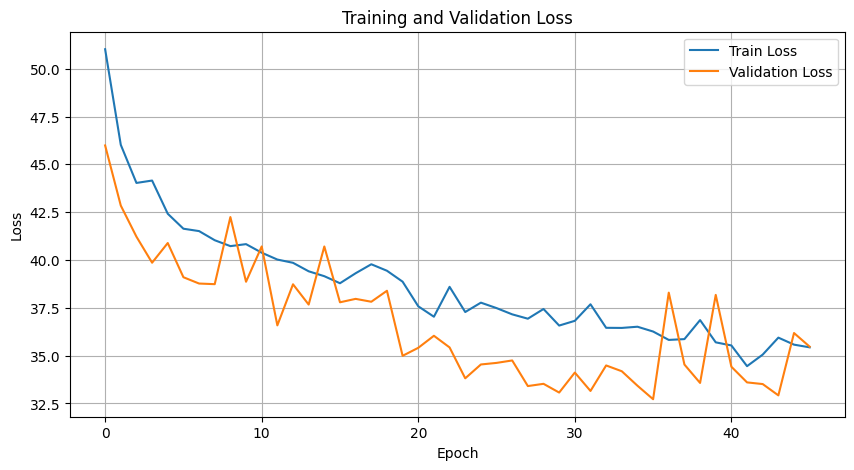

Training Accuracy: 85.0828
Training Precision Scores: [17.31909846 98.39235788]
Training Recall Scores: [67.90697674 85.83333333]
Training F1 Scores: [27.59924386 91.68475901]

Validation Accuracy: 85.5919
Validation Precision Scores: [15.97051597 98.70430356]
Validation Recall Scores: [69.89247312 86.18181818]
Validation F1 Scores: [26.         92.01898188]

Threshold: 0.5
Validation Accuracy: 85.5919
Validation Precision Scores: [15.97051597 98.70430356]
Validation Recall Scores: [69.89247312 86.18181818]
Validation F1 Scores: [26.         92.01898188]


Threshold: 0.6
Validation Accuracy: 90.6153
Validation Precision Scores: [21.53846154 98.39688042]
Validation Recall Scores: [60.21505376 91.75757576]
Validation F1 Scores: [31.72804533 94.96132135]


Threshold: 0.7
Validation Accuracy: 94.1589
Validation Precision Scores: [30.87248322 98.05704837]
Validation Recall Scores: [49.46236559 95.83838384]
Validation F1 Scores: [38.01652893 96.93502248]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 37.8303, Val Loss: 35.5702
Epoch 10/50, Train Loss: 34.6404, Val Loss: 31.7704
Epoch 15/50, Train Loss: 34.0041, Val Loss: 30.7726
Epoch 20/50, Train Loss: 33.7227, Val Loss: 28.8863
Epoch 25/50, Train Loss: 32.1090, Val Loss: 29.3035
Epoch 30/50, Train Loss: 31.4762, Val Loss: 28.6804
Epoch 35/50, Train Loss: 32.0113, Val Loss: 29.1743
Early stopping triggered after 36 epochs because no improvements over 10 subsequent epochs!
Epoch 36/50, Train Loss: 30.5809, Val Loss: 28.0976
The function took 46.85 seconds to execute.


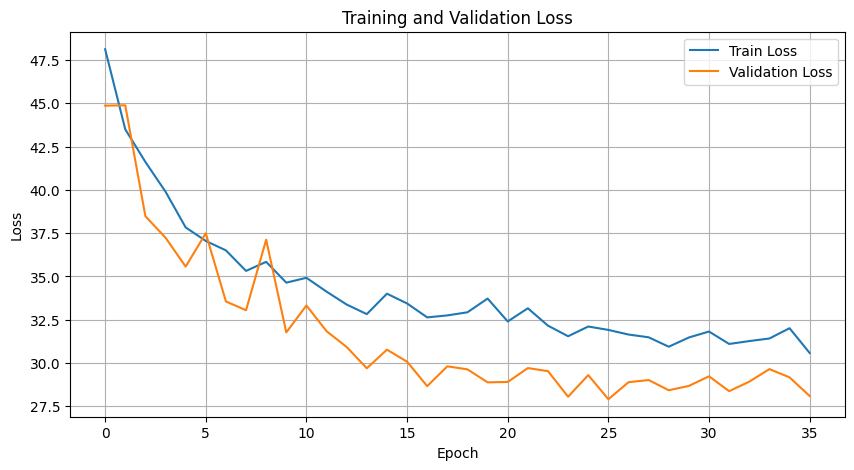

Training Accuracy: 85.6475
Training Precision Scores: [19.65116279 98.92397661]
Training Recall Scores: [78.60465116 85.95528455]
Training F1 Scores: [31.44186047 91.98477433]

Validation Accuracy: 85.9034
Validation Precision Scores: [17.89976134 99.16240112]
Validation Recall Scores: [80.64516129 86.1010101 ]
Validation F1 Scores: [29.296875   92.17128028]

Threshold: 0.5
Validation Accuracy: 85.9034
Validation Precision Scores: [17.89976134 99.16240112]
Validation Recall Scores: [80.64516129 86.1010101 ]
Validation F1 Scores: [29.296875   92.17128028]


Threshold: 0.6
Validation Accuracy: 93.1075
Validation Precision Scores: [29.61165049 98.64521592]
Validation Recall Scores: [65.59139785 94.14141414]
Validation F1 Scores: [40.80267559 96.34070705]


Threshold: 0.7
Validation Accuracy: 95.4050
Validation Precision Scores: [39.31623932 98.08241534]
Validation Recall Scores: [49.46236559 97.13131313]
Validation F1 Scores: [43.80952381 97.6045473 ]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 37.2210, Val Loss: 33.0439
Epoch 10/50, Train Loss: 32.3825, Val Loss: 30.1625
Epoch 15/50, Train Loss: 30.3157, Val Loss: 25.6824
Epoch 20/50, Train Loss: 28.3542, Val Loss: 26.6730
Epoch 25/50, Train Loss: 27.3200, Val Loss: 23.7659
Epoch 30/50, Train Loss: 25.7724, Val Loss: 25.0714
Epoch 35/50, Train Loss: 25.4951, Val Loss: 22.5241
Epoch 40/50, Train Loss: 25.2975, Val Loss: 24.5805
Epoch 45/50, Train Loss: 25.4734, Val Loss: 22.4624
Epoch 50/50, Train Loss: 25.4526, Val Loss: 23.5583
The function took 66.54 seconds to execute.


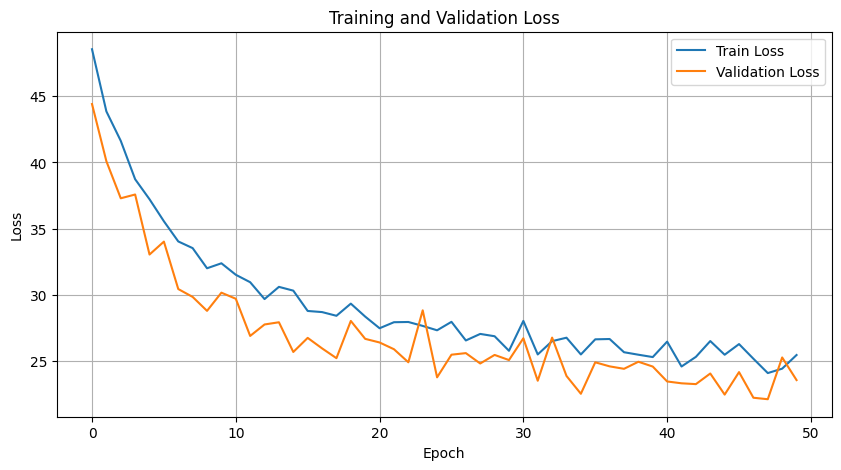

Training Accuracy: 86.6310
Training Precision Scores: [22.57126236 99.50882938]
Training Recall Scores: [90.23255814 86.47357724]
Training F1 Scores: [36.10981852 92.53439182]

Validation Accuracy: 86.6433
Validation Precision Scores: [19.80676329 99.48932219]
Validation Recall Scores: [88.17204301 86.58585859]
Validation F1 Scores: [32.34714004 92.59019227]

Threshold: 0.5
Validation Accuracy: 86.6433
Validation Precision Scores: [19.80676329 99.48932219]
Validation Recall Scores: [88.17204301 86.58585859]
Validation F1 Scores: [32.34714004 92.59019227]


Threshold: 0.6
Validation Accuracy: 91.5498
Validation Precision Scores: [27.53623188 99.2582897 ]
Validation Recall Scores: [81.72043011 91.91919192]
Validation F1 Scores: [41.19241192 95.44787078]


Threshold: 0.7
Validation Accuracy: 93.9252
Validation Precision Scores: [34.01015228 98.90341628]
Validation Recall Scores: [72.04301075 94.74747475]
Validation F1 Scores: [46.20689655 96.78085019]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 34.5065, Val Loss: 31.3549
Epoch 10/50, Train Loss: 30.3636, Val Loss: 26.4867
Epoch 15/50, Train Loss: 27.3372, Val Loss: 23.9069
Epoch 20/50, Train Loss: 26.0689, Val Loss: 23.4022
Epoch 25/50, Train Loss: 25.2115, Val Loss: 24.3649
Epoch 30/50, Train Loss: 23.1272, Val Loss: 22.7020
Epoch 35/50, Train Loss: 23.0623, Val Loss: 21.2380
Epoch 40/50, Train Loss: 21.8498, Val Loss: 21.7553
Epoch 45/50, Train Loss: 20.9374, Val Loss: 20.4812
Epoch 50/50, Train Loss: 20.5698, Val Loss: 19.9628
The function took 65.80 seconds to execute.


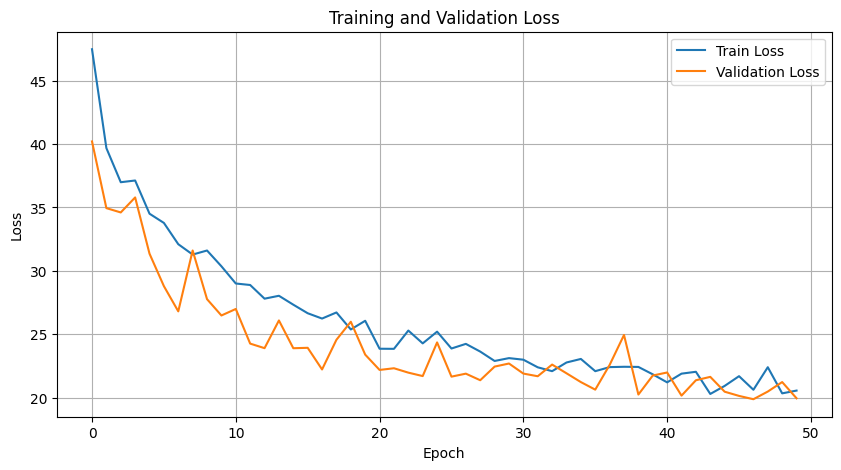

Training Accuracy: 90.7205
Training Precision Scores: [30.02291826 99.58709965]
Training Recall Scores: [91.39534884 90.69105691]
Training F1 Scores: [45.19838988 94.93112069]

Validation Accuracy: 91.8224
Validation Precision Scores: [28.41328413 99.30343927]
Validation Recall Scores: [82.79569892 92.16161616]
Validation F1 Scores: [42.30769231 95.59932942]

Threshold: 0.5
Validation Accuracy: 91.8224
Validation Precision Scores: [28.41328413 99.30343927]
Validation Recall Scores: [82.79569892 92.16161616]
Validation F1 Scores: [42.30769231 95.59932942]


Threshold: 0.6
Validation Accuracy: 93.6526
Validation Precision Scores: [33.64485981 99.10790144]
Validation Recall Scores: [77.41935484 94.26262626]
Validation F1 Scores: [46.90553746 96.62455995]


Threshold: 0.7
Validation Accuracy: 95.4439
Validation Precision Scores: [42.10526316 98.79966887]
Validation Recall Scores: [68.8172043  96.44444444]
Validation F1 Scores: [52.24489796 97.60785116]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 31.5982, Val Loss: 26.0502
Epoch 10/50, Train Loss: 27.2356, Val Loss: 23.9215
Epoch 15/50, Train Loss: 25.8572, Val Loss: 23.1321
Epoch 20/50, Train Loss: 23.4081, Val Loss: 21.9953
Epoch 25/50, Train Loss: 21.3468, Val Loss: 22.0461
Epoch 30/50, Train Loss: 20.7593, Val Loss: 23.4379
Epoch 35/50, Train Loss: 20.6026, Val Loss: 21.9598
Early stopping triggered after 37 epochs because no improvements over 10 subsequent epochs!
Epoch 37/50, Train Loss: 18.4854, Val Loss: 25.5915
The function took 50.37 seconds to execute.


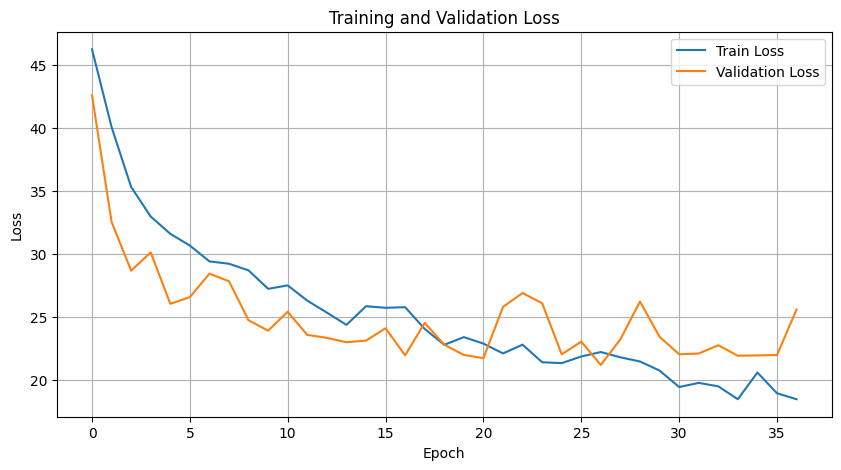

Training Accuracy: 88.6758
Training Precision Scores: [26.09262883 99.65663271]
Training Recall Scores: [93.02325581 88.48577236]
Training F1 Scores: [40.75394804 93.73957044]

Validation Accuracy: 88.4735
Validation Precision Scores: [22.03856749 99.41043084]
Validation Recall Scores: [86.02150538 88.56565657]
Validation F1 Scores: [35.0877193  93.67521368]

Threshold: 0.5
Validation Accuracy: 88.4735
Validation Precision Scores: [22.03856749 99.41043084]
Validation Recall Scores: [86.02150538 88.56565657]
Validation F1 Scores: [35.0877193  93.67521368]


Threshold: 0.6
Validation Accuracy: 93.1464
Validation Precision Scores: [32.48945148 99.31359931]
Validation Recall Scores: [82.79569892 93.53535354]
Validation F1 Scores: [46.66666667 96.33791094]


Threshold: 0.7
Validation Accuracy: 95.0545
Validation Precision Scores: [40.4494382  99.12133891]
Validation Recall Scores: [77.41935484 95.71717172]
Validation F1 Scores: [53.13653137 97.38951696]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 36.0655, Val Loss: 32.1638
Epoch 10/50, Train Loss: 30.1694, Val Loss: 28.1263
Epoch 15/50, Train Loss: 28.0407, Val Loss: 25.2822
Epoch 20/50, Train Loss: 24.9453, Val Loss: 23.8011
Epoch 25/50, Train Loss: 22.6054, Val Loss: 23.6676
Epoch 30/50, Train Loss: 23.0338, Val Loss: 24.7605
Early stopping triggered after 31 epochs because no improvements over 10 subsequent epochs!
Epoch 31/50, Train Loss: 21.3550, Val Loss: 23.1818
The function took 47.70 seconds to execute.


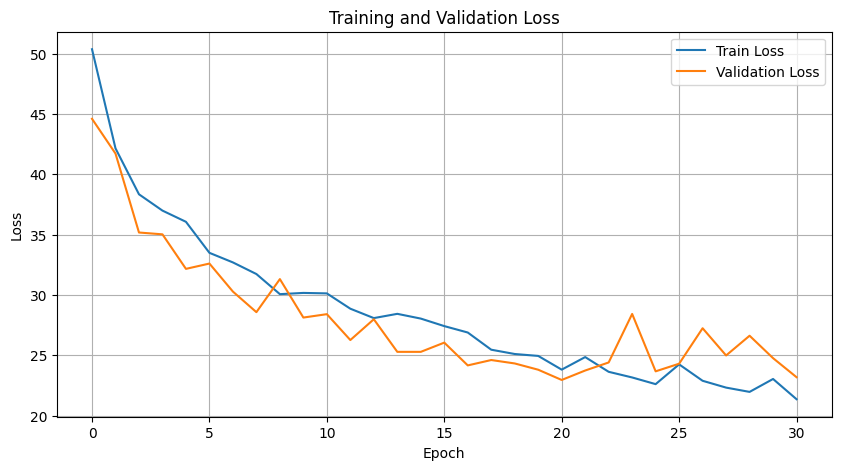

Training Accuracy: 86.0565
Training Precision Scores: [22.01117318 99.5754717 ]
Training Recall Scores: [91.62790698 85.81300813]
Training F1 Scores: [35.4954955  92.18340611]

Validation Accuracy: 85.3583
Validation Precision Scores: [18.05869074 99.38823529]
Validation Recall Scores: [86.02150538 85.33333333]
Validation F1 Scores: [29.85074627 91.82608696]

Threshold: 0.5
Validation Accuracy: 85.3583
Validation Precision Scores: [18.05869074 99.38823529]
Validation Recall Scores: [86.02150538 85.33333333]
Validation F1 Scores: [29.85074627 91.82608696]


Threshold: 0.6
Validation Accuracy: 89.8754
Validation Precision Scores: [23.82445141 99.24410849]
Validation Recall Scores: [81.72043011 90.18181818]
Validation F1 Scores: [36.89320388 94.49618967]


Threshold: 0.7
Validation Accuracy: 93.8084
Validation Precision Scores: [33.5        98.90202703]
Validation Recall Scores: [72.04301075 94.62626263]
Validation F1 Scores: [45.7337884  96.71691101]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 38.0492, Val Loss: 39.9160
Epoch 10/50, Train Loss: 34.4964, Val Loss: 33.7861
Epoch 15/50, Train Loss: 32.5805, Val Loss: 31.2247
Epoch 20/50, Train Loss: 29.4139, Val Loss: 31.2502
Epoch 25/50, Train Loss: 30.1032, Val Loss: 31.2633
Early stopping triggered after 29 epochs because no improvements over 10 subsequent epochs!
Epoch 29/50, Train Loss: 27.2673, Val Loss: 30.8472
The function took 46.94 seconds to execute.


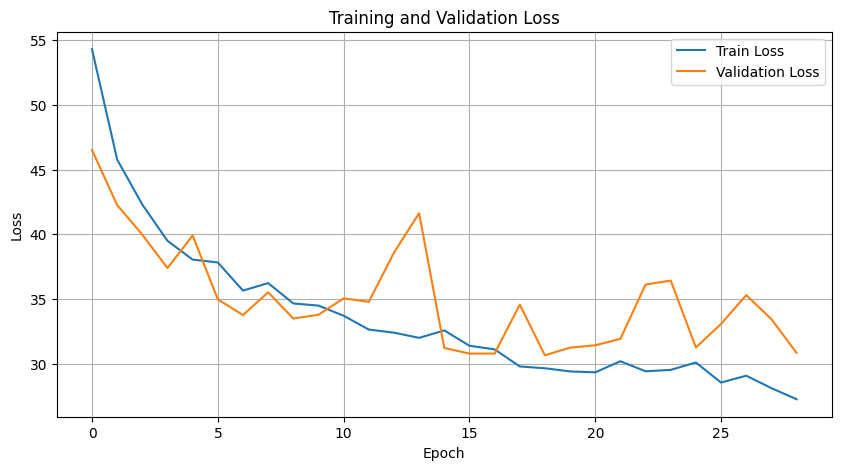

Training Accuracy: 81.9182
Training Precision Scores: [17.1954023  99.30821495]
Training Recall Scores: [86.97674419 81.69715447]
Training F1 Scores: [28.71401152 89.64594369]

Validation Accuracy: 81.3474
Validation Precision Scores: [13.72180451 99.01768173]
Validation Recall Scores: [78.49462366 81.45454545]
Validation F1 Scores: [23.36       89.38151186]

Threshold: 0.5
Validation Accuracy: 81.3474
Validation Precision Scores: [13.72180451 99.01768173]
Validation Recall Scores: [78.49462366 81.45454545]
Validation F1 Scores: [23.36       89.38151186]


Threshold: 0.6
Validation Accuracy: 85.9813
Validation Precision Scores: [17.1990172  98.93567793]
Validation Recall Scores: [75.2688172  86.38383838]
Validation F1 Scores: [28.         92.23468507]


Threshold: 0.7
Validation Accuracy: 90.2259
Validation Precision Scores: [19.61538462 98.18024263]
Validation Recall Scores: [54.83870968 91.55555556]
Validation F1 Scores: [28.89518414 94.75224754]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 33.5160, Val Loss: 29.7610
Epoch 10/50, Train Loss: 27.6643, Val Loss: 27.9568
Epoch 15/50, Train Loss: 25.4291, Val Loss: 25.8682
Epoch 20/50, Train Loss: 22.8433, Val Loss: 22.7760
Epoch 25/50, Train Loss: 21.6136, Val Loss: 25.5551
Early stopping triggered after 30 epochs because no improvements over 10 subsequent epochs!
Epoch 30/50, Train Loss: 20.2564, Val Loss: 28.3856
The function took 51.55 seconds to execute.


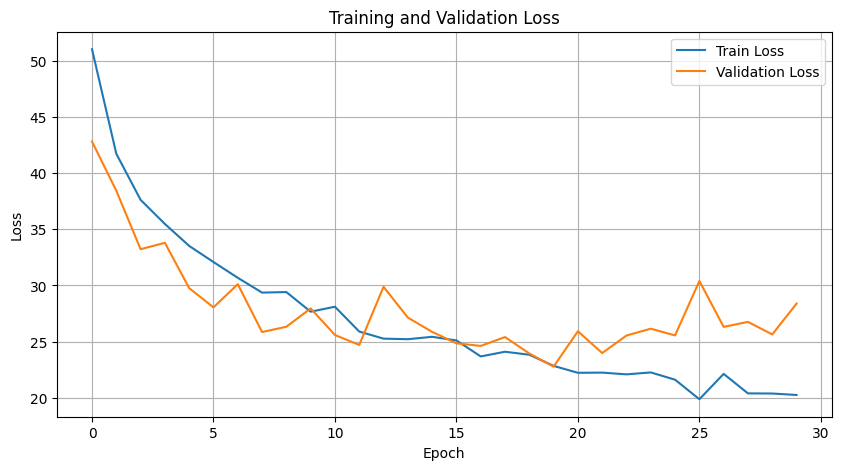

Training Accuracy: 87.9649
Training Precision Scores: [24.74937343 99.59649527]
Training Recall Scores: [91.86046512 87.79471545]
Training F1 Scores: [38.99308983 93.32397105]

Validation Accuracy: 87.2274
Validation Precision Scores: [20.25316456 99.40174873]
Validation Recall Scores: [86.02150538 87.27272727]
Validation F1 Scores: [32.78688525 92.94320138]

Threshold: 0.5
Validation Accuracy: 87.2274
Validation Precision Scores: [20.25316456 99.40174873]
Validation Recall Scores: [86.02150538 87.27272727]
Validation F1 Scores: [32.78688525 92.94320138]


Threshold: 0.6
Validation Accuracy: 90.7321
Validation Precision Scores: [25.08591065 99.1216513 ]
Validation Recall Scores: [78.49462366 91.19191919]
Validation F1 Scores: [38.02083333 94.99158249]


Threshold: 0.7
Validation Accuracy: 93.9642
Validation Precision Scores: [34.18367347 98.90387858]
Validation Recall Scores: [72.04301075 94.78787879]
Validation F1 Scores: [46.36678201 96.80214566]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 34.9152, Val Loss: 33.8550
Epoch 10/50, Train Loss: 30.6803, Val Loss: 31.2540
Epoch 15/50, Train Loss: 27.8084, Val Loss: 30.1717
Epoch 20/50, Train Loss: 26.6109, Val Loss: 31.6220
Epoch 25/50, Train Loss: 25.8288, Val Loss: 34.2404
Epoch 30/50, Train Loss: 24.0120, Val Loss: 29.9978
Epoch 35/50, Train Loss: 22.7645, Val Loss: 30.4257
Epoch 40/50, Train Loss: 23.8147, Val Loss: 31.4199
Early stopping triggered after 41 epochs because no improvements over 10 subsequent epochs!
Epoch 41/50, Train Loss: 25.4356, Val Loss: 30.3844
The function took 74.64 seconds to execute.


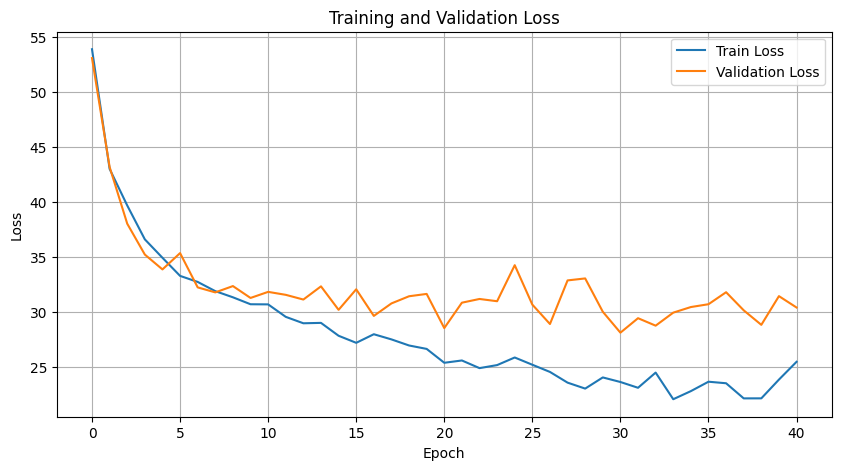

Training Accuracy: 86.4362
Training Precision Scores: [22.34348076 99.51928714]
Training Recall Scores: [90.46511628 86.2601626 ]
Training F1 Scores: [35.83602027 92.4165714 ]

Validation Accuracy: 86.1371
Validation Precision Scores: [18.76484561 99.34792734]
Validation Recall Scores: [84.94623656 86.18181818]
Validation F1 Scores: [30.73929961 92.29770662]

Threshold: 0.5
Validation Accuracy: 86.1371
Validation Precision Scores: [18.76484561 99.34792734]
Validation Recall Scores: [84.94623656 86.18181818]
Validation F1 Scores: [30.73929961 92.29770662]


Threshold: 0.6
Validation Accuracy: 89.9143
Validation Precision Scores: [23.73417722 99.20071048]
Validation Recall Scores: [80.64516129 90.26262626]
Validation F1 Scores: [36.67481663 94.52083774]


Threshold: 0.7
Validation Accuracy: 92.0950
Validation Precision Scores: [28.34645669 99.09248055]
Validation Recall Scores: [77.41935484 92.64646465]
Validation F1 Scores: [41.49855908 95.76111923]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 36.2762, Val Loss: 31.5580
Epoch 10/50, Train Loss: 32.3643, Val Loss: 29.5733
Epoch 15/50, Train Loss: 29.0215, Val Loss: 26.7883
Epoch 20/50, Train Loss: 28.8836, Val Loss: 26.0797
Epoch 25/50, Train Loss: 28.7228, Val Loss: 28.6052
Epoch 30/50, Train Loss: 28.7548, Val Loss: 26.4808
Epoch 35/50, Train Loss: 27.0264, Val Loss: 24.7451
Epoch 40/50, Train Loss: 25.8911, Val Loss: 30.0987
Epoch 45/50, Train Loss: 25.9988, Val Loss: 26.2168
Early stopping triggered after 46 epochs because no improvements over 10 subsequent epochs!
Epoch 46/50, Train Loss: 25.8815, Val Loss: 24.8446
The function took 61.58 seconds to execute.


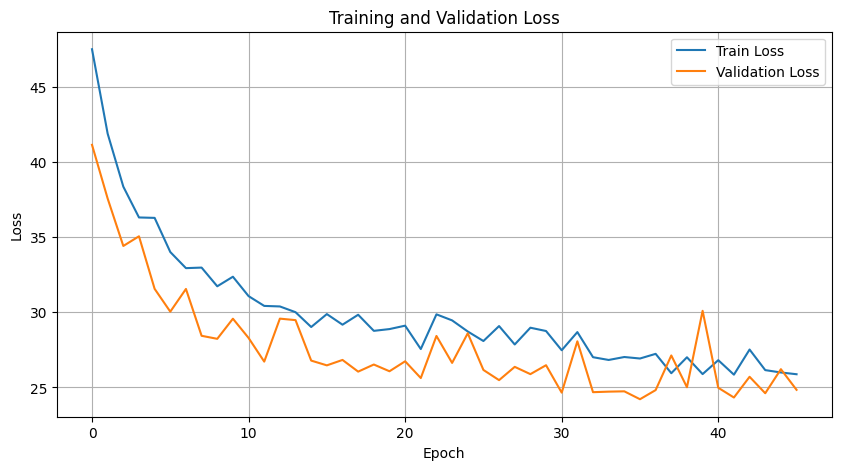

Training Accuracy: 83.6417
Training Precision Scores: [19.27236971 99.53861098]
Training Recall Scores: [91.1627907  83.31300813]
Training F1 Scores: [31.81818182 90.70590839]

Validation Accuracy: 84.0343
Validation Precision Scores: [17.45379877 99.61556944]
Validation Recall Scores: [91.39784946 83.75757576]
Validation F1 Scores: [29.31034483 91.00087796]

Threshold: 0.5
Validation Accuracy: 84.0343
Validation Precision Scores: [17.45379877 99.61556944]
Validation Recall Scores: [91.39784946 83.75757576]
Validation F1 Scores: [29.31034483 91.00087796]


Threshold: 0.6
Validation Accuracy: 90.6542
Validation Precision Scores: [25.74257426 99.33774834]
Validation Recall Scores: [83.87096774 90.90909091]
Validation F1 Scores: [39.39393939 94.93670886]


Threshold: 0.7
Validation Accuracy: 94.5872
Validation Precision Scores: [36.62790698 98.74791319]
Validation Recall Scores: [67.74193548 95.5959596 ]
Validation F1 Scores: [47.54716981 97.14637651]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 31.5558, Val Loss: 29.0795
Epoch 10/50, Train Loss: 28.6552, Val Loss: 26.4281
Epoch 15/50, Train Loss: 25.6056, Val Loss: 25.1203
Epoch 20/50, Train Loss: 25.4525, Val Loss: 22.8609
Epoch 25/50, Train Loss: 25.1398, Val Loss: 22.0270
Epoch 30/50, Train Loss: 22.2103, Val Loss: 22.6185
Epoch 35/50, Train Loss: 23.0401, Val Loss: 21.9560
Epoch 40/50, Train Loss: 23.4443, Val Loss: 23.3337
Epoch 45/50, Train Loss: 22.4256, Val Loss: 22.7557
Epoch 50/50, Train Loss: 22.2630, Val Loss: 21.9501
The function took 66.71 seconds to execute.


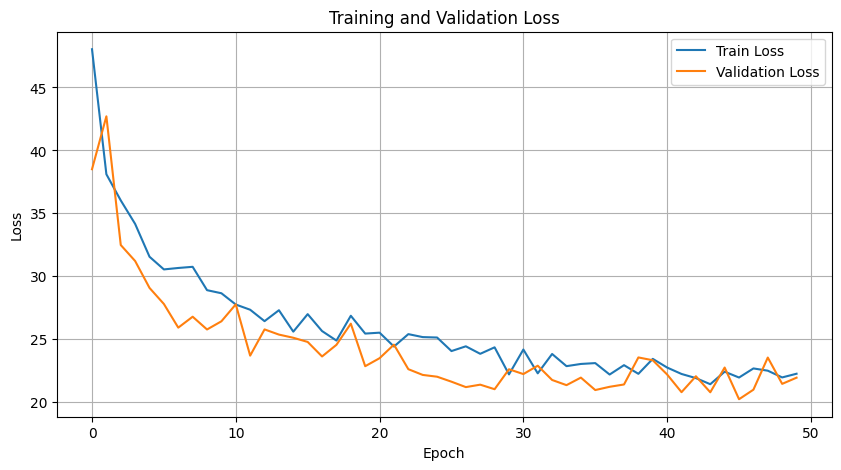

Training Accuracy: 88.8510
Training Precision Scores: [26.18254497 99.57805907]
Training Recall Scores: [91.39534884 88.7398374 ]
Training F1 Scores: [40.70429829 93.84706325]

Validation Accuracy: 88.7072
Validation Precision Scores: [23.01369863 99.59146618]
Validation Recall Scores: [90.32258065 88.64646465]
Validation F1 Scores: [36.68122271 93.80076956]

Threshold: 0.5
Validation Accuracy: 88.7072
Validation Precision Scores: [23.01369863 99.59146618]
Validation Recall Scores: [90.32258065 88.64646465]
Validation F1 Scores: [36.68122271 93.80076956]


Threshold: 0.6
Validation Accuracy: 92.6402
Validation Precision Scores: [31.1023622  99.39498704]
Validation Recall Scores: [84.94623656 92.92929293]
Validation F1 Scores: [45.53314121 96.05345584]


Threshold: 0.7
Validation Accuracy: 95.9112
Validation Precision Scores: [46.20253165 99.17012448]
Validation Recall Scores: [78.49462366 96.56565657]
Validation F1 Scores: [58.16733068 97.85056295]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 30.9248, Val Loss: 32.3322
Epoch 10/50, Train Loss: 25.4581, Val Loss: 24.1710
Epoch 15/50, Train Loss: 22.9427, Val Loss: 22.8787
Epoch 20/50, Train Loss: 21.7010, Val Loss: 21.7503
Epoch 25/50, Train Loss: 21.2944, Val Loss: 20.9064
Epoch 30/50, Train Loss: 20.3780, Val Loss: 21.0414
Early stopping triggered after 35 epochs because no improvements over 10 subsequent epochs!
Epoch 35/50, Train Loss: 20.6454, Val Loss: 28.6037
The function took 47.88 seconds to execute.


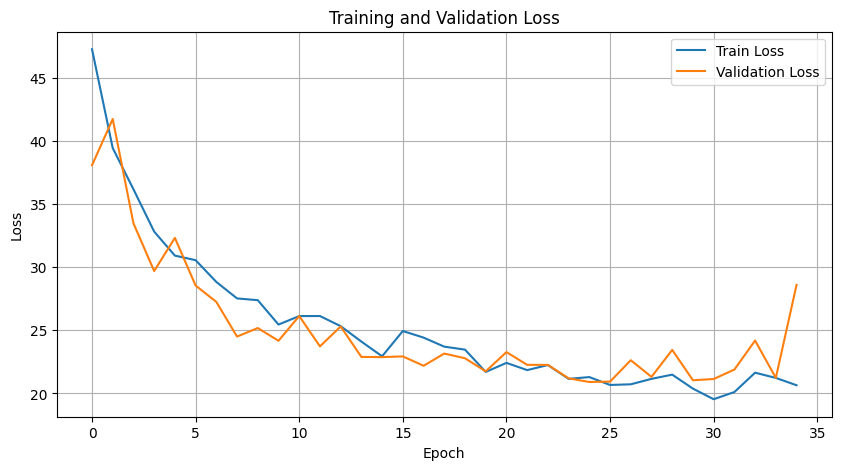

Training Accuracy: 89.1529
Training Precision Scores: [26.63934426 99.54576425]
Training Recall Scores: [90.69767442 89.08536585]
Training F1 Scores: [41.18268215 94.02552826]

Validation Accuracy: 89.9922
Validation Precision Scores: [24.84662577 99.4647636 ]
Validation Recall Scores: [87.09677419 90.1010101 ]
Validation F1 Scores: [38.66348449 94.55162179]

Threshold: 0.5
Validation Accuracy: 89.9922
Validation Precision Scores: [24.84662577 99.4647636 ]
Validation Recall Scores: [87.09677419 90.1010101 ]
Validation F1 Scores: [38.66348449 94.55162179]


Threshold: 0.6
Validation Accuracy: 93.4579
Validation Precision Scores: [33.9055794  99.40042827]
Validation Recall Scores: [84.94623656 93.77777778]
Validation F1 Scores: [48.46625767 96.50727651]


Threshold: 0.7
Validation Accuracy: 95.6776
Validation Precision Scores: [44.57831325 99.20899251]
Validation Recall Scores: [79.56989247 96.28282828]
Validation F1 Scores: [57.14285714 97.72401066]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 33.9144, Val Loss: 33.1917
Epoch 10/50, Train Loss: 26.1333, Val Loss: 25.6123
Epoch 15/50, Train Loss: 22.6714, Val Loss: 23.1422
Epoch 20/50, Train Loss: 21.4640, Val Loss: 24.3631
Epoch 25/50, Train Loss: 19.5920, Val Loss: 22.8986
Early stopping triggered after 29 epochs because no improvements over 10 subsequent epochs!
Epoch 29/50, Train Loss: 20.6041, Val Loss: 24.9230
The function took 41.47 seconds to execute.


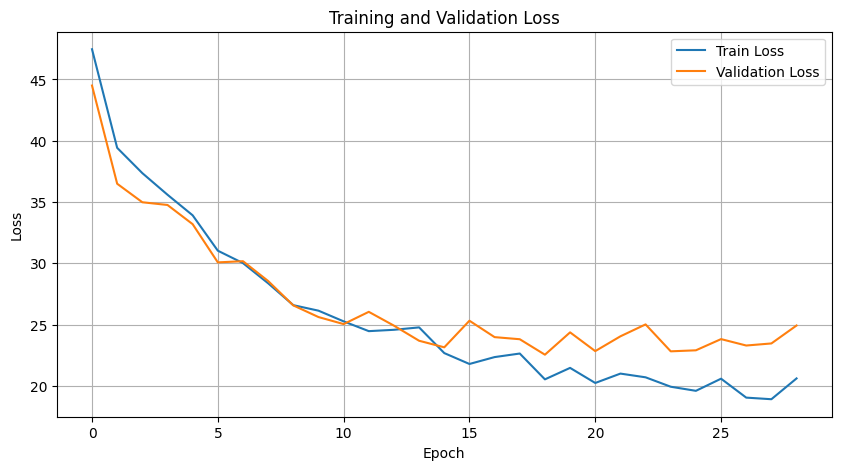

Training Accuracy: 89.0750
Training Precision Scores: [26.58998647 99.57916288]
Training Recall Scores: [91.39534884 88.97357724]
Training F1 Scores: [41.19496855 93.97810219]

Validation Accuracy: 88.4735
Validation Precision Scores: [21.56862745 99.27634555]
Validation Recall Scores: [82.79569892 88.68686869]
Validation F1 Scores: [34.22222222 93.68331199]

Threshold: 0.5
Validation Accuracy: 88.4735
Validation Precision Scores: [21.56862745 99.27634555]
Validation Recall Scores: [82.79569892 88.68686869]
Validation F1 Scores: [34.22222222 93.68331199]


Threshold: 0.6
Validation Accuracy: 91.5109
Validation Precision Scores: [26.93726937 99.12929909]
Validation Recall Scores: [78.49462366 92.        ]
Validation F1 Scores: [40.10989011 95.43168483]


Threshold: 0.7
Validation Accuracy: 94.1978
Validation Precision Scores: [35.10638298 98.86554622]
Validation Recall Scores: [70.96774194 95.07070707]
Validation F1 Scores: [46.97508897 96.93099897]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 31.8027, Val Loss: 28.1338
Epoch 10/50, Train Loss: 25.0108, Val Loss: 23.4783
Epoch 15/50, Train Loss: 20.3087, Val Loss: 20.1943
Epoch 20/50, Train Loss: 20.8769, Val Loss: 47.0581
Epoch 25/50, Train Loss: 17.6215, Val Loss: 19.2830
Epoch 30/50, Train Loss: 17.8003, Val Loss: 21.9305
Epoch 35/50, Train Loss: 16.4759, Val Loss: 19.9718
Epoch 40/50, Train Loss: 14.9338, Val Loss: 20.9749
Early stopping triggered after 41 epochs because no improvements over 10 subsequent epochs!
Epoch 41/50, Train Loss: 14.5505, Val Loss: 23.5578
The function took 62.89 seconds to execute.


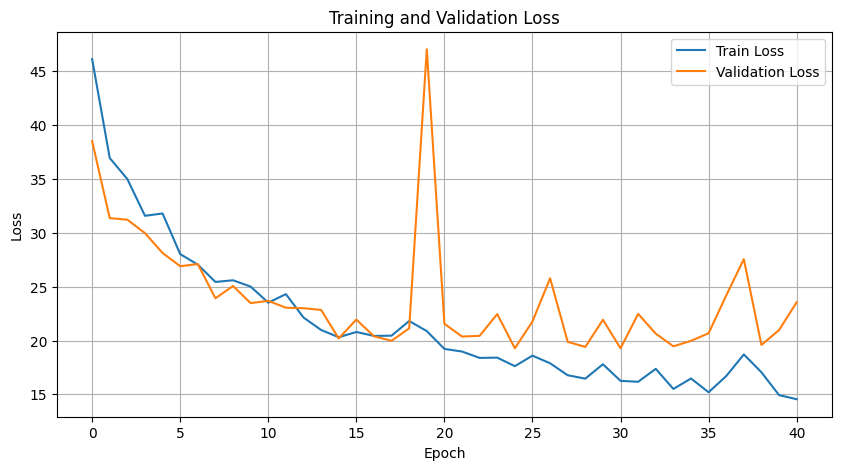

Training Accuracy: 92.8432
Training Precision Scores: [36.22402891 99.68350977]
Training Recall Scores: [93.25581395 92.82520325]
Training F1 Scores: [52.17957059 96.13218965]

Validation Accuracy: 92.7181
Validation Precision Scores: [31.0483871  99.31034483]
Validation Recall Scores: [82.79569892 93.09090909]
Validation F1 Scores: [45.16129032 96.10010428]

Threshold: 0.5
Validation Accuracy: 92.7181
Validation Precision Scores: [31.0483871  99.31034483]
Validation Recall Scores: [82.79569892 93.09090909]
Validation F1 Scores: [45.16129032 96.10010428]


Threshold: 0.6
Validation Accuracy: 94.8209
Validation Precision Scores: [39.13043478 99.11912752]
Validation Recall Scores: [77.41935484 95.47474747]
Validation F1 Scores: [51.98555957 97.26281128]


Threshold: 0.7
Validation Accuracy: 96.2227
Validation Precision Scores: [48.61111111 99.05115512]
Validation Recall Scores: [75.2688172  97.01010101]
Validation F1 Scores: [59.07172996 98.02000408]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 28.3723, Val Loss: 38.2858
Epoch 10/50, Train Loss: 23.2788, Val Loss: 23.0850
Epoch 15/50, Train Loss: 20.6338, Val Loss: 20.2360
Epoch 20/50, Train Loss: 20.0716, Val Loss: 20.4951
Epoch 25/50, Train Loss: 17.9836, Val Loss: 21.7204
Epoch 30/50, Train Loss: 17.8814, Val Loss: 24.0799
Epoch 35/50, Train Loss: 15.6311, Val Loss: 23.8789
Epoch 40/50, Train Loss: 16.9494, Val Loss: 28.7198
Epoch 45/50, Train Loss: 15.6311, Val Loss: 31.0077
Early stopping triggered after 47 epochs because no improvements over 10 subsequent epochs!
Epoch 47/50, Train Loss: 14.4090, Val Loss: 21.2372
The function took 77.36 seconds to execute.


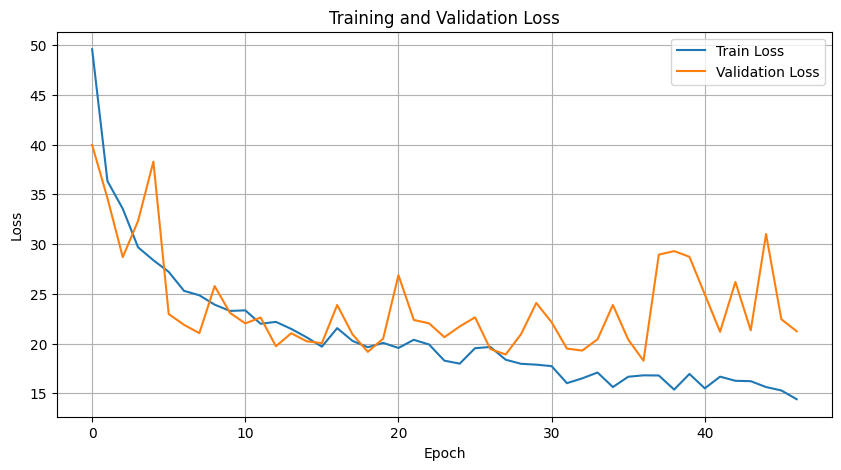

Training Accuracy: 92.2493
Training Precision Scores: [34.49152542 99.7469747 ]
Training Recall Scores: [94.65116279 92.14430894]
Training F1 Scores: [50.55900621 95.79503434]

Validation Accuracy: 91.7056
Validation Precision Scores: [28.41726619 99.38864629]
Validation Recall Scores: [84.94623656 91.95959596]
Validation F1 Scores: [42.58760108 95.52990556]

Threshold: 0.5
Validation Accuracy: 91.7056
Validation Precision Scores: [28.41726619 99.38864629]
Validation Recall Scores: [84.94623656 91.95959596]
Validation F1 Scores: [42.58760108 95.52990556]


Threshold: 0.6
Validation Accuracy: 94.5872
Validation Precision Scores: [38.26530612 99.24114671]
Validation Recall Scores: [80.64516129 95.11111111]
Validation F1 Scores: [51.90311419 97.13224675]


Threshold: 0.7
Validation Accuracy: 96.0670
Validation Precision Scores: [47.33333333 99.09015715]
Validation Recall Scores: [76.34408602 96.80808081]
Validation F1 Scores: [58.43621399 97.93582669]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 30.5363, Val Loss: 25.1447
Epoch 10/50, Train Loss: 24.6430, Val Loss: 22.7104
Epoch 15/50, Train Loss: 21.5560, Val Loss: 24.0029
Epoch 20/50, Train Loss: 19.5405, Val Loss: 21.8971
Epoch 25/50, Train Loss: 17.8450, Val Loss: 21.4440
Epoch 30/50, Train Loss: 16.3136, Val Loss: 21.3680
Epoch 35/50, Train Loss: 17.3979, Val Loss: 26.1066
Early stopping triggered after 38 epochs because no improvements over 10 subsequent epochs!
Epoch 38/50, Train Loss: 16.0644, Val Loss: 24.7448
The function took 64.93 seconds to execute.


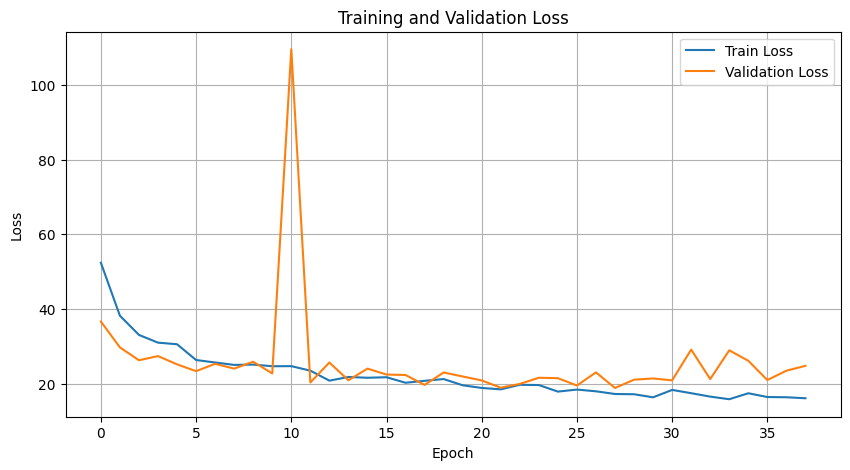

Training Accuracy: 90.3797
Training Precision Scores: [29.6350365  99.73033708]
Training Recall Scores: [94.41860465 90.20325203]
Training F1 Scores: [45.11111111 94.72785486]

Validation Accuracy: 89.9143
Validation Precision Scores: [24.69512195 99.46428571]
Validation Recall Scores: [87.09677419 90.02020202]
Validation F1 Scores: [38.47980998 94.5068929 ]

Threshold: 0.5
Validation Accuracy: 89.9143
Validation Precision Scores: [24.69512195 99.46428571]
Validation Recall Scores: [87.09677419 90.02020202]
Validation F1 Scores: [38.47980998 94.5068929 ]


Threshold: 0.6
Validation Accuracy: 92.7570
Validation Precision Scores: [31.17408907 99.31064196]
Validation Recall Scores: [82.79569892 93.13131313]
Validation F1 Scores: [45.29411765 96.12176814]


Threshold: 0.7
Validation Accuracy: 94.7819
Validation Precision Scores: [39.03743316 99.1600168 ]
Validation Recall Scores: [78.49462366 95.39393939]
Validation F1 Scores: [52.14285714 97.24052718]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 39.0428, Val Loss: 39.4749
Epoch 10/50, Train Loss: 33.9119, Val Loss: 34.2339
Epoch 15/50, Train Loss: 30.9134, Val Loss: 31.4996
Epoch 20/50, Train Loss: 29.0024, Val Loss: 36.1539
Epoch 25/50, Train Loss: 27.7994, Val Loss: 34.0702
Early stopping triggered after 29 epochs because no improvements over 10 subsequent epochs!
Epoch 29/50, Train Loss: 26.2424, Val Loss: 36.4408
The function took 54.22 seconds to execute.


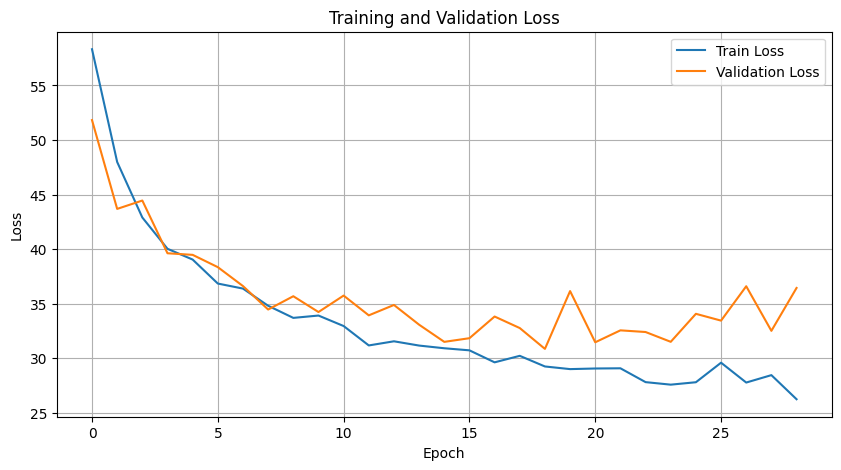

Training Accuracy: 80.7400
Training Precision Scores: [16.05263158 99.19899875]
Training Recall Scores: [85.11627907 80.54878049]
Training F1 Scores: [27.01107011 88.90633763]

Validation Accuracy: 79.7897
Validation Precision Scores: [13.14878893 99.14572864]
Validation Recall Scores: [81.72043011 79.71717172]
Validation F1 Scores: [22.65275708 88.3762598 ]

Threshold: 0.5
Validation Accuracy: 79.7897
Validation Precision Scores: [13.14878893 99.14572864]
Validation Recall Scores: [81.72043011 79.71717172]
Validation F1 Scores: [22.65275708 88.3762598 ]


Threshold: 0.6
Validation Accuracy: 83.9953
Validation Precision Scores: [14.82300885 98.77126654]
Validation Recall Scores: [72.04301075 84.44444444]
Validation F1 Scores: [24.58715596 91.04770203]


Threshold: 0.7
Validation Accuracy: 89.6417
Validation Precision Scores: [20.87542088 98.63496257]
Validation Recall Scores: [66.66666667 90.50505051]
Validation F1 Scores: [31.79487179 94.39528024]


Threshold: 0.8
Validation Accuracy:

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Validation Accuracy: 96.3785
Validation Precision Scores: [ 0.         96.37850467]
Validation Recall Scores: [  0. 100.]
Validation F1 Scores: [ 0.         98.15585961]


-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 32 and hidden dim 32


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 30.0831, Val Loss: 25.9861
Epoch 10/50, Train Loss: 25.5547, Val Loss: 22.5183
Epoch 15/50, Train Loss: 24.0023, Val Loss: 20.1427
Epoch 20/50, Train Loss: 23.6512, Val Loss: 20.1142
Epoch 25/50, Train Loss: 21.6874, Val Loss: 19.8884
Epoch 30/50, Train Loss: 22.4624, Val Loss: 20.1421
Epoch 35/50, Train Loss: 20.8581, Val Loss: 18.8428
Epoch 40/50, Train Loss: 19.7004, Val Loss: 19.6339
Early stopping triggered after 45 epochs because no improvements over 10 subsequent epochs!
Epoch 45/50, Train Loss: 20.6610, Val Loss: 19.4815
The function took 63.17 seconds to execute.


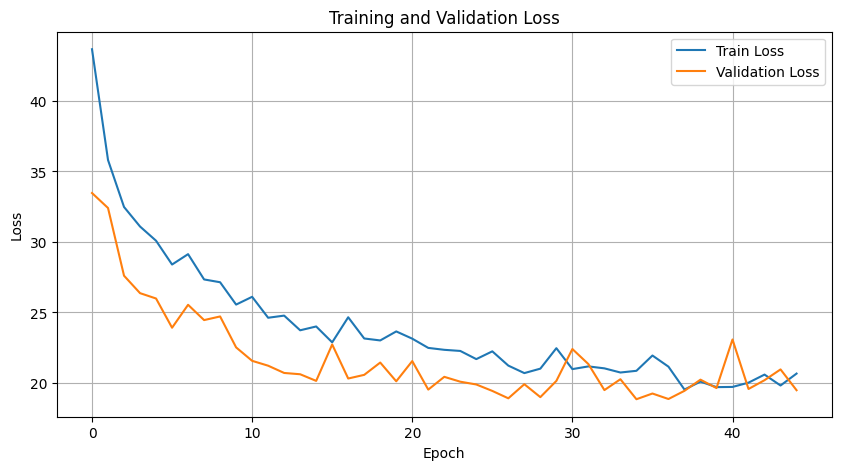

Training Accuracy: 92.9601
Training Precision Scores: [36.24413146 99.52199891]
Training Recall Scores: [89.76744186 93.0995935 ]
Training F1 Scores: [51.63879599 96.20372801]

Validation Accuracy: 93.2632
Validation Precision Scores: [33.33333333 99.44158076]
Validation Recall Scores: [86.02150538 93.53535354]
Validation F1 Scores: [48.04804805 96.39808453]

Threshold: 0.5
Validation Accuracy: 93.2632
Validation Precision Scores: [33.33333333 99.44158076]
Validation Recall Scores: [86.02150538 93.53535354]
Validation F1 Scores: [48.04804805 96.39808453]


Threshold: 0.6
Validation Accuracy: 95.3660
Validation Precision Scores: [42.44186047 99.16527546]
Validation Recall Scores: [78.49462366 96.        ]
Validation F1 Scores: [55.09433962 97.55696982]


Threshold: 0.7
Validation Accuracy: 96.4564
Validation Precision Scores: [50.78125    98.85245902]
Validation Recall Scores: [69.89247312 97.45454545]
Validation F1 Scores: [58.82352941 98.14852492]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 28.2175, Val Loss: 26.4341
Epoch 10/50, Train Loss: 24.4861, Val Loss: 23.0793
Epoch 15/50, Train Loss: 21.7148, Val Loss: 23.8319
Early stopping triggered after 16 epochs because no improvements over 10 subsequent epochs!
Epoch 16/50, Train Loss: 21.8489, Val Loss: 22.8323
The function took 22.74 seconds to execute.


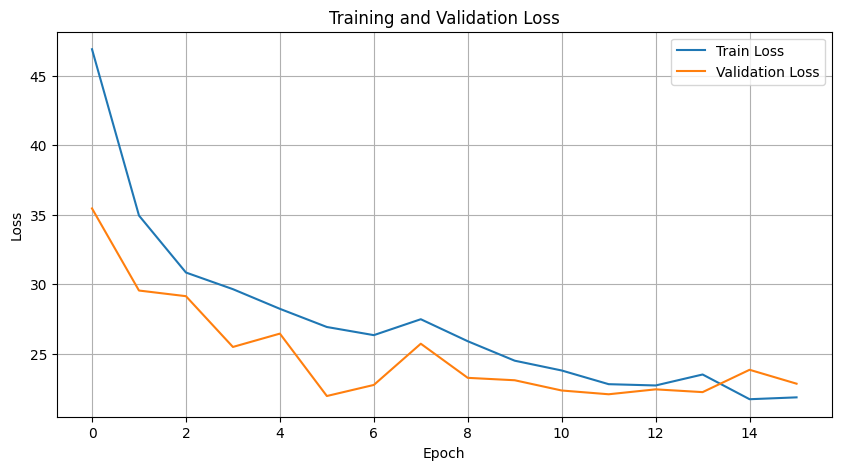

Training Accuracy: 88.8413
Training Precision Scores: [24.82419128 99.12974684]
Training Recall Scores: [82.09302326 89.13617886]
Training F1 Scores: [38.12095032 93.8677226 ]

Validation Accuracy: 88.4346
Validation Precision Scores: [21.82320442 99.36536718]
Validation Recall Scores: [84.94623656 88.56565657]
Validation F1 Scores: [34.72527473 93.65520188]

Threshold: 0.5
Validation Accuracy: 88.4346
Validation Precision Scores: [21.82320442 99.36536718]
Validation Recall Scores: [84.94623656 88.56565657]
Validation F1 Scores: [34.72527473 93.65520188]


Threshold: 0.6
Validation Accuracy: 91.1994
Validation Precision Scores: [26.16487455 99.12625601]
Validation Recall Scores: [78.49462366 91.67676768]
Validation F1 Scores: [39.24731183 95.25608732]


Threshold: 0.7
Validation Accuracy: 94.3925
Validation Precision Scores: [36.50793651 98.99117276]
Validation Recall Scores: [74.19354839 95.15151515]
Validation F1 Scores: [48.93617021 97.03337454]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 26.9850, Val Loss: 23.8013
Epoch 10/50, Train Loss: 22.6596, Val Loss: 21.0199
Epoch 15/50, Train Loss: 20.3139, Val Loss: 21.0062
Early stopping triggered after 17 epochs because no improvements over 10 subsequent epochs!
Epoch 17/50, Train Loss: 18.2938, Val Loss: 21.5227
The function took 24.57 seconds to execute.


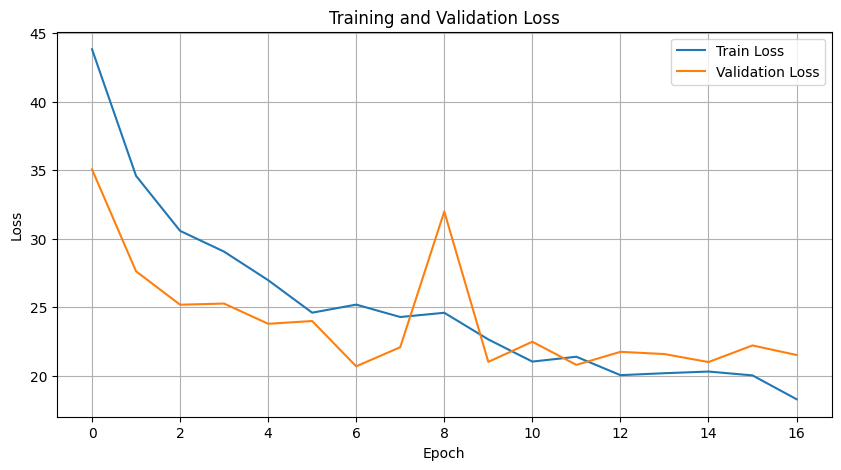

Training Accuracy: 92.1130
Training Precision Scores: [32.9443447  99.31192661]
Training Recall Scores: [85.34883721 92.40853659]
Training F1 Scores: [47.5388601  95.73594441]

Validation Accuracy: 92.5234
Validation Precision Scores: [30.88803089 99.43698571]
Validation Recall Scores: [86.02150538 92.76767677]
Validation F1 Scores: [45.45454545 95.98662207]

Threshold: 0.5
Validation Accuracy: 92.5234
Validation Precision Scores: [30.88803089 99.43698571]
Validation Recall Scores: [86.02150538 92.76767677]
Validation F1 Scores: [45.45454545 95.98662207]


Threshold: 0.6
Validation Accuracy: 95.1324
Validation Precision Scores: [40.58823529 98.99916597]
Validation Recall Scores: [74.19354839 95.91919192]
Validation F1 Scores: [52.47148289 97.43484506]


Threshold: 0.7
Validation Accuracy: 96.3006
Validation Precision Scores: [49.15254237 98.57142857]
Validation Recall Scores: [62.3655914  97.57575758]
Validation F1 Scores: [54.97630332 98.07106599]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 28.9043, Val Loss: 25.8407
Epoch 10/50, Train Loss: 21.9696, Val Loss: 26.8077
Epoch 15/50, Train Loss: 21.9414, Val Loss: 25.6349
Epoch 20/50, Train Loss: 20.3947, Val Loss: 29.2541
Epoch 25/50, Train Loss: 18.8309, Val Loss: 26.3692
Epoch 30/50, Train Loss: 17.3322, Val Loss: 27.7264
Early stopping triggered after 32 epochs because no improvements over 10 subsequent epochs!
Epoch 32/50, Train Loss: 16.1444, Val Loss: 31.1067
The function took 51.11 seconds to execute.


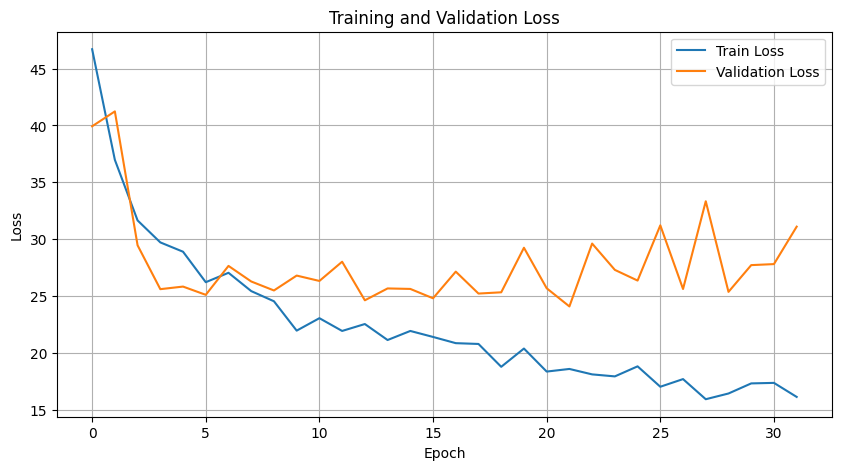

Training Accuracy: 91.2853
Training Precision Scores: [31.35525261 99.56777125]
Training Recall Scores: [90.93023256 91.30081301]
Training F1 Scores: [46.63088849 95.25526162]

Validation Accuracy: 90.6542
Validation Precision Scores: [25.58139535 99.29422144]
Validation Recall Scores: [82.79569892 90.94949495]
Validation F1 Scores: [39.08629442 94.93884437]

Threshold: 0.5
Validation Accuracy: 90.6542
Validation Precision Scores: [25.58139535 99.29422144]
Validation Recall Scores: [82.79569892 90.94949495]
Validation F1 Scores: [39.08629442 94.93884437]


Threshold: 0.6
Validation Accuracy: 93.6916
Validation Precision Scores: [33.6492891 99.0666101]
Validation Recall Scores: [76.34408602 94.34343434]
Validation F1 Scores: [46.71052632 96.64735099]


Threshold: 0.7
Validation Accuracy: 95.6776
Validation Precision Scores: [44.         98.88337469]
Validation Recall Scores: [70.96774194 96.60606061]
Validation F1 Scores: [54.32098765 97.7314531 ]


Threshold: 0.8
Validation Accuracy: 9

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 28.1831, Val Loss: 24.0955
Epoch 10/50, Train Loss: 24.6502, Val Loss: 26.1780
Epoch 15/50, Train Loss: 23.0936, Val Loss: 24.2280
Epoch 20/50, Train Loss: 20.8321, Val Loss: 24.5903
Epoch 25/50, Train Loss: 19.1420, Val Loss: 25.6780
Early stopping triggered after 28 epochs because no improvements over 10 subsequent epochs!
Epoch 28/50, Train Loss: 17.1670, Val Loss: 25.6399
The function took 46.95 seconds to execute.


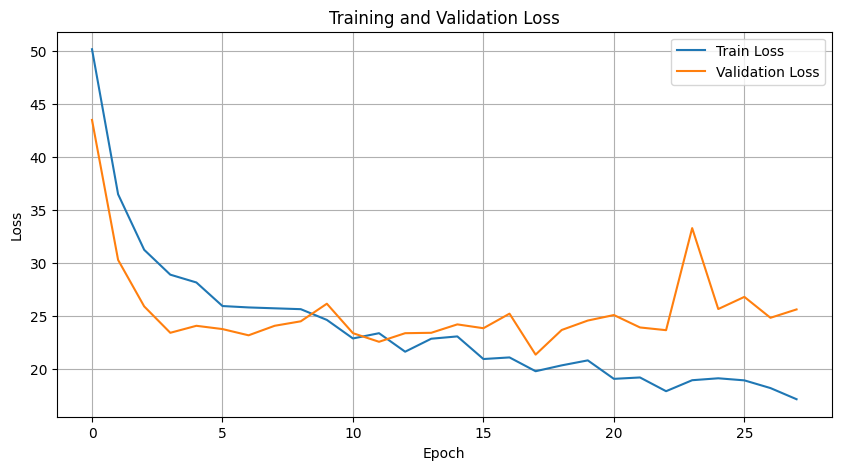

Training Accuracy: 92.6680
Training Precision Scores: [35.1425943 99.477295 ]
Training Recall Scores: [88.8372093  92.83536585]
Training F1 Scores: [50.36255768 96.04163381]

Validation Accuracy: 92.1729
Validation Precision Scores: [29.06976744 99.22077922]
Validation Recall Scores: [80.64516129 92.60606061]
Validation F1 Scores: [42.73504274 95.79937304]

Threshold: 0.5
Validation Accuracy: 92.1729
Validation Precision Scores: [29.06976744 99.22077922]
Validation Recall Scores: [80.64516129 92.60606061]
Validation F1 Scores: [42.73504274 95.79937304]


Threshold: 0.6
Validation Accuracy: 94.0031
Validation Precision Scores: [34.35897436 98.9043405 ]
Validation Recall Scores: [72.04301075 94.82828283]
Validation F1 Scores: [46.52777778 96.82343234]


Threshold: 0.7
Validation Accuracy: 95.8333
Validation Precision Scores: [45.         98.76441516]
Validation Recall Scores: [67.74193548 96.88888889]
Validation F1 Scores: [54.07725322 97.81766266]


Threshold: 0.8
Validation Accuracy: 9

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 28.5593, Val Loss: 25.8037
Epoch 10/50, Train Loss: 21.4137, Val Loss: 21.3057
Epoch 15/50, Train Loss: 19.7933, Val Loss: 22.2284
Epoch 20/50, Train Loss: 17.5159, Val Loss: 28.3911
Early stopping triggered after 24 epochs because no improvements over 10 subsequent epochs!
Epoch 24/50, Train Loss: 17.2128, Val Loss: 22.8734
The function took 42.37 seconds to execute.


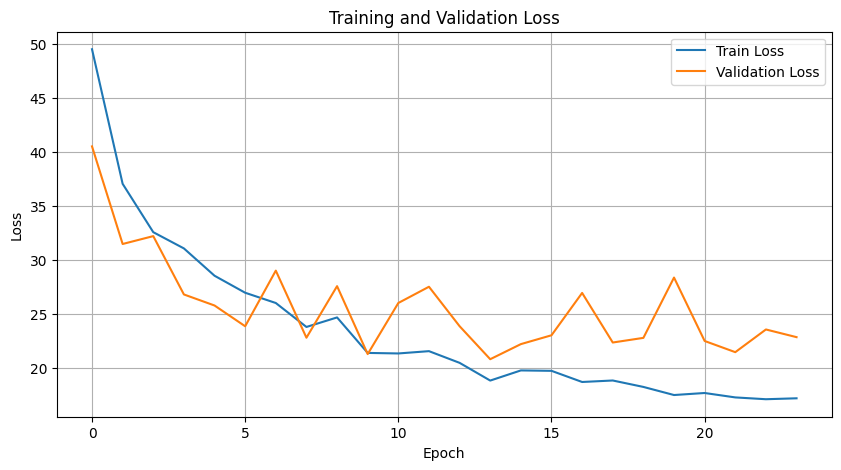

Training Accuracy: 88.0331
Training Precision Scores: [25.17091361 99.71134973]
Training Recall Scores: [94.18604651 87.76422764]
Training F1 Scores: [39.72535557 93.35711583]

Validation Accuracy: 87.9283
Validation Precision Scores: [21.37203166 99.45180448]
Validation Recall Scores: [87.09677419 87.95959596]
Validation F1 Scores: [34.3220339  93.35334477]

Threshold: 0.5
Validation Accuracy: 87.9283
Validation Precision Scores: [21.37203166 99.45180448]
Validation Recall Scores: [87.09677419 87.95959596]
Validation F1 Scores: [34.3220339  93.35334477]


Threshold: 0.6
Validation Accuracy: 91.3551
Validation Precision Scores: [27.20848057 99.29978118]
Validation Recall Scores: [82.79569892 91.67676768]
Validation F1 Scores: [40.95744681 95.33613445]


Threshold: 0.7
Validation Accuracy: 94.0031
Validation Precision Scores: [35.26570048 99.15290131]
Validation Recall Scores: [78.49462366 94.58585859]
Validation F1 Scores: [48.66666667 96.81555004]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 26.6003, Val Loss: 22.6351
Epoch 10/50, Train Loss: 22.5553, Val Loss: 21.9814
Epoch 15/50, Train Loss: 18.9885, Val Loss: 20.3403
Epoch 20/50, Train Loss: 18.9350, Val Loss: 22.9871
Early stopping triggered after 23 epochs because no improvements over 10 subsequent epochs!
Epoch 23/50, Train Loss: 17.7580, Val Loss: 22.0324
The function took 44.00 seconds to execute.


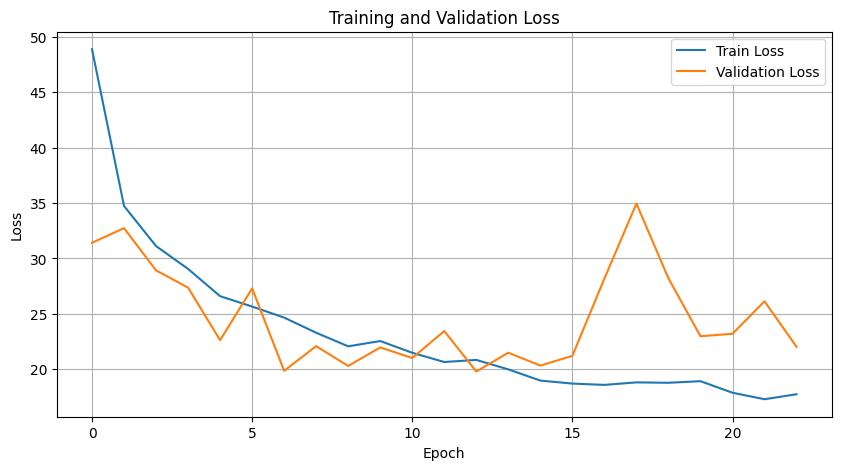

Training Accuracy: 88.4810
Training Precision Scores: [25.88084561 99.70145826]
Training Recall Scores: [93.95348837 88.24186992]
Training F1 Scores: [40.5826218 93.6222977]

Validation Accuracy: 88.7072
Validation Precision Scores: [23.01369863 99.59146618]
Validation Recall Scores: [90.32258065 88.64646465]
Validation F1 Scores: [36.68122271 93.80076956]

Threshold: 0.5
Validation Accuracy: 88.7072
Validation Precision Scores: [23.01369863 99.59146618]
Validation Recall Scores: [90.32258065 88.64646465]
Validation F1 Scores: [36.68122271 93.80076956]


Threshold: 0.6
Validation Accuracy: 92.3676
Validation Precision Scores: [30.41825095 99.43600868]
Validation Recall Scores: [86.02150538 92.60606061]
Validation F1 Scores: [44.94382022 95.89958159]


Threshold: 0.7
Validation Accuracy: 94.7430
Validation Precision Scores: [39.17525773 99.28390901]
Validation Recall Scores: [81.72043011 95.23232323]
Validation F1 Scores: [52.96167247 97.21592081]


Threshold: 0.8
Validation Accuracy: 9

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 26.9364, Val Loss: 22.6612
Epoch 10/50, Train Loss: 24.2907, Val Loss: 23.6795
Epoch 15/50, Train Loss: 19.9746, Val Loss: 21.4657
Epoch 20/50, Train Loss: 19.2911, Val Loss: 22.5909
Epoch 25/50, Train Loss: 19.9148, Val Loss: 22.2925
Early stopping triggered after 29 epochs because no improvements over 10 subsequent epochs!
Epoch 29/50, Train Loss: 17.3456, Val Loss: 20.8786
The function took 44.72 seconds to execute.


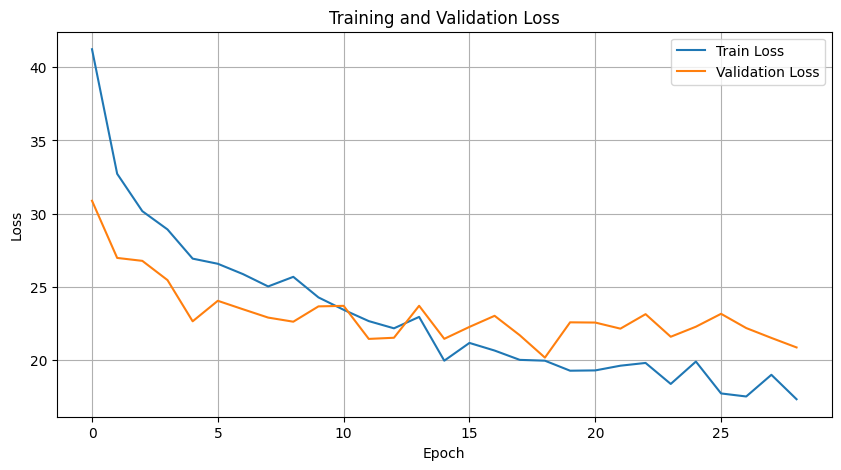

Training Accuracy: 87.8676
Training Precision Scores: [24.96932515 99.7337963 ]
Training Recall Scores: [94.65116279 87.57113821]
Training F1 Scores: [39.51456311 93.25757576]

Validation Accuracy: 87.1885
Validation Precision Scores: [20.64676617 99.53831948]
Validation Recall Scores: [89.24731183 87.11111111]
Validation F1 Scores: [33.53535354 92.91101056]

Threshold: 0.5
Validation Accuracy: 87.1885
Validation Precision Scores: [20.64676617 99.53831948]
Validation Recall Scores: [89.24731183 87.11111111]
Validation F1 Scores: [33.53535354 92.91101056]


Threshold: 0.6
Validation Accuracy: 93.0685
Validation Precision Scores: [32.06751055 99.27069927]
Validation Recall Scores: [81.72043011 93.49494949]
Validation F1 Scores: [46.06060606 96.2962963 ]


Threshold: 0.7
Validation Accuracy: 95.5218
Validation Precision Scores: [43.03797468 98.9626556 ]
Validation Recall Scores: [73.11827957 96.36363636]
Validation F1 Scores: [54.18326693 97.64585466]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 25.9277, Val Loss: 24.7019
Epoch 10/50, Train Loss: 20.6754, Val Loss: 21.6448
Epoch 15/50, Train Loss: 19.1554, Val Loss: 22.5969
Early stopping triggered after 19 epochs because no improvements over 10 subsequent epochs!
Epoch 19/50, Train Loss: 18.3732, Val Loss: 29.2883
The function took 29.92 seconds to execute.


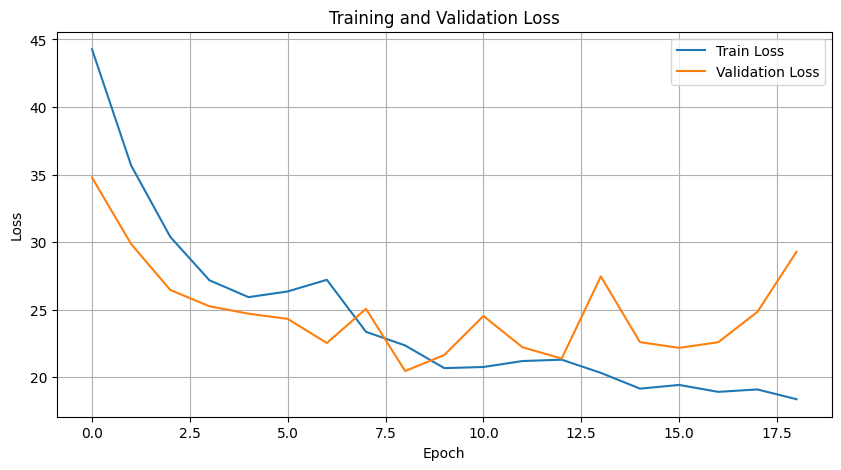

Training Accuracy: 91.3437
Training Precision Scores: [31.35662063 99.51322049]
Training Recall Scores: [89.76744186 91.41260163]
Training F1 Scores: [46.47802529 95.29106415]

Validation Accuracy: 91.2773
Validation Precision Scores: [27.64505119 99.47252747]
Validation Recall Scores: [87.09677419 91.43434343]
Validation F1 Scores: [41.96891192 95.28421053]

Threshold: 0.5
Validation Accuracy: 91.2773
Validation Precision Scores: [27.64505119 99.47252747]
Validation Recall Scores: [87.09677419 91.43434343]
Validation F1 Scores: [41.96891192 95.28421053]


Threshold: 0.6
Validation Accuracy: 93.6916
Validation Precision Scores: [34.24657534 99.23371648]
Validation Recall Scores: [80.64516129 94.18181818]
Validation F1 Scores: [48.07692308 96.64179104]


Threshold: 0.7
Validation Accuracy: 95.5997
Validation Precision Scores: [43.90243902 99.12645591]
Validation Recall Scores: [77.41935484 96.28282828]
Validation F1 Scores: [56.0311284  97.68395163]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 24.8474, Val Loss: 27.8234
Epoch 10/50, Train Loss: 21.2621, Val Loss: 25.1837
Epoch 15/50, Train Loss: 17.5756, Val Loss: 28.5194
Epoch 20/50, Train Loss: 16.9798, Val Loss: 19.8292
Epoch 25/50, Train Loss: 15.2126, Val Loss: 31.7794
Early stopping triggered after 30 epochs because no improvements over 10 subsequent epochs!
Epoch 30/50, Train Loss: 13.9144, Val Loss: 36.0606
The function took 51.71 seconds to execute.


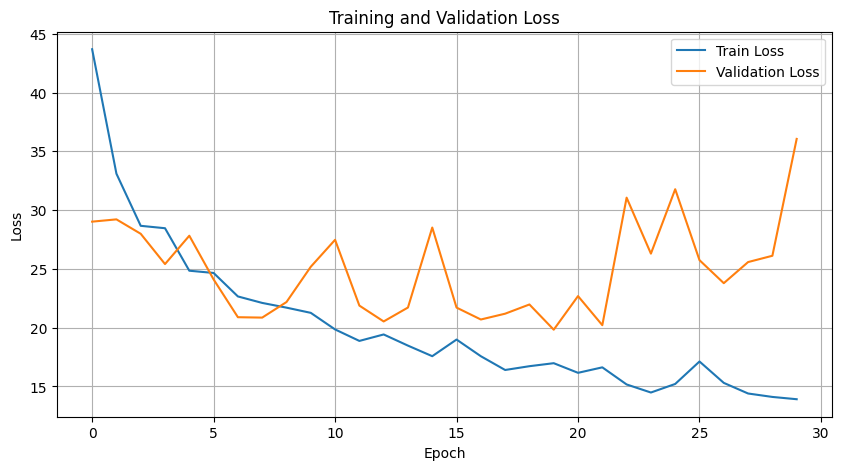

Training Accuracy: 90.6621
Training Precision Scores: [30.59427733 99.85404738]
Training Recall Scores: [96.97674419 90.38617886]
Training F1 Scores: [46.51422197 94.88451486]

Validation Accuracy: 89.9922
Validation Precision Scores: [24.69135802 99.42067736]
Validation Recall Scores: [86.02150538 90.14141414]
Validation F1 Scores: [38.36930456 94.55393092]

Threshold: 0.5
Validation Accuracy: 89.9922
Validation Precision Scores: [24.69135802 99.42067736]
Validation Recall Scores: [86.02150538 90.14141414]
Validation F1 Scores: [38.36930456 94.55393092]


Threshold: 0.6
Validation Accuracy: 92.9128
Validation Precision Scores: [31.6872428  99.31182796]
Validation Recall Scores: [82.79569892 93.29292929]
Validation F1 Scores: [45.83333333 96.20833333]


Threshold: 0.7
Validation Accuracy: 94.9766
Validation Precision Scores: [39.88764045 99.07949791]
Validation Recall Scores: [76.34408602 95.67676768]
Validation F1 Scores: [52.39852399 97.34840699]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 34.2836, Val Loss: 33.5547
Epoch 10/50, Train Loss: 29.3603, Val Loss: 30.9909
Epoch 15/50, Train Loss: 26.5914, Val Loss: 39.7731
Epoch 20/50, Train Loss: 27.5414, Val Loss: 30.8492
Early stopping triggered after 24 epochs because no improvements over 10 subsequent epochs!
Epoch 24/50, Train Loss: 25.0730, Val Loss: 29.0656
The function took 44.87 seconds to execute.


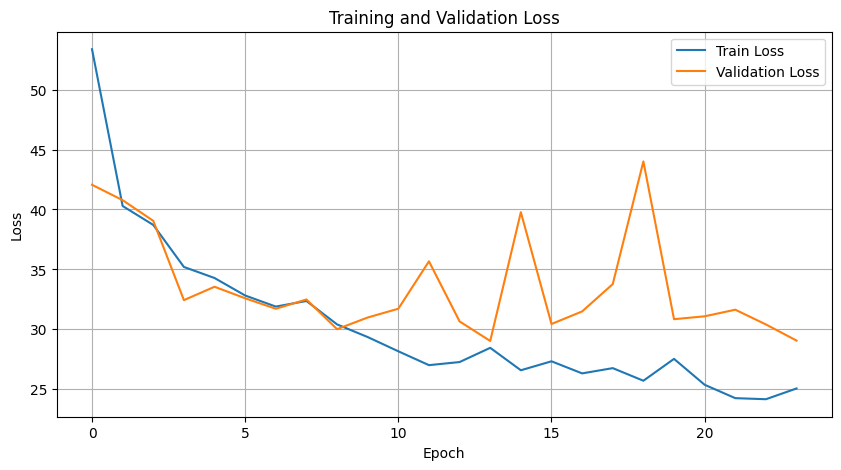

Training Accuracy: 81.1100
Training Precision Scores: [17.28769497 99.61065059]
Training Recall Scores: [92.79069767 80.5995935 ]
Training F1 Scores: [29.14536158 89.10234805]

Validation Accuracy: 81.3863
Validation Precision Scores: [14.67889908 99.35739001]
Validation Recall Scores: [86.02150538 81.21212121]
Validation F1 Scores: [25.07836991 89.37305469]

Threshold: 0.5
Validation Accuracy: 81.3863
Validation Precision Scores: [14.67889908 99.35739001]
Validation Recall Scores: [86.02150538 81.21212121]
Validation F1 Scores: [25.07836991 89.37305469]


Threshold: 0.6
Validation Accuracy: 85.5140
Validation Precision Scores: [17.63341067 99.20449228]
Validation Recall Scores: [81.72043011 85.65656566]
Validation F1 Scores: [29.00763359 91.934085  ]


Threshold: 0.7
Validation Accuracy: 88.6682
Validation Precision Scores: [20.35928144 98.88093107]
Validation Recall Scores: [73.11827957 89.25252525]
Validation F1 Scores: [31.8501171  93.82034402]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 34.6684, Val Loss: 33.8397
Epoch 10/50, Train Loss: 29.1103, Val Loss: 33.4789
Epoch 15/50, Train Loss: 26.1147, Val Loss: 33.0259
Epoch 20/50, Train Loss: 25.7866, Val Loss: 31.6822
Epoch 25/50, Train Loss: 27.2418, Val Loss: 32.1745
Early stopping triggered after 27 epochs because no improvements over 10 subsequent epochs!
Epoch 27/50, Train Loss: 23.5823, Val Loss: 34.5373
The function took 52.13 seconds to execute.


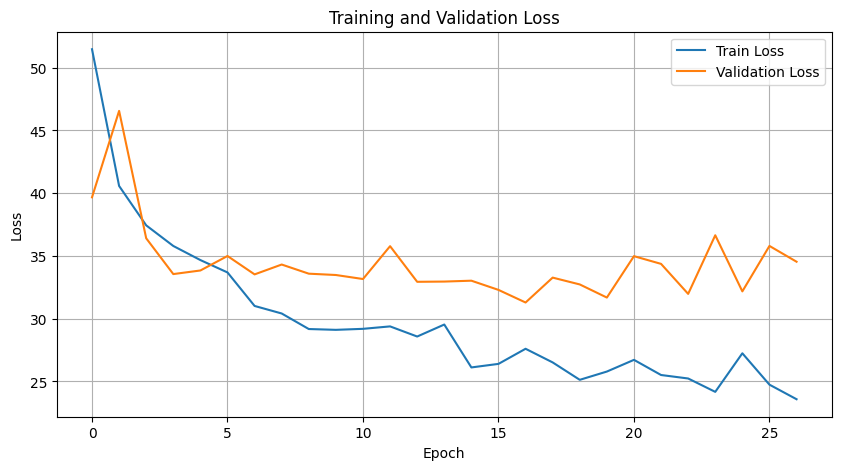

Training Accuracy: 78.8608
Training Precision Scores: [15.95619867 99.71476728]
Training Recall Scores: [94.88372093 78.16056911]
Training F1 Scores: [27.31837965 87.63174386]

Validation Accuracy: 78.1153
Validation Precision Scores: [13.07086614 99.48266943]
Validation Recall Scores: [89.24731183 77.6969697 ]
Validation F1 Scores: [22.8021978  87.25045372]

Threshold: 0.5
Validation Accuracy: 78.1153
Validation Precision Scores: [13.07086614 99.48266943]
Validation Recall Scores: [89.24731183 77.6969697 ]
Validation F1 Scores: [22.8021978  87.25045372]


Threshold: 0.6
Validation Accuracy: 82.6713
Validation Precision Scores: [15.625      99.36770428]
Validation Recall Scores: [86.02150538 82.54545455]
Validation F1 Scores: [26.44628099 90.17876848]


Threshold: 0.7
Validation Accuracy: 86.4097
Validation Precision Scores: [18.15920398 99.07663897]
Validation Recall Scores: [78.49462366 86.70707071]
Validation F1 Scores: [29.49494949 92.48006895]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 25.4428, Val Loss: 24.7843
Epoch 10/50, Train Loss: 21.3522, Val Loss: 25.0574
Epoch 15/50, Train Loss: 18.2956, Val Loss: 21.8457
Epoch 20/50, Train Loss: 15.8972, Val Loss: 27.3139
Early stopping triggered after 25 epochs because no improvements over 10 subsequent epochs!
Epoch 25/50, Train Loss: 18.2115, Val Loss: 22.7816
The function took 52.40 seconds to execute.


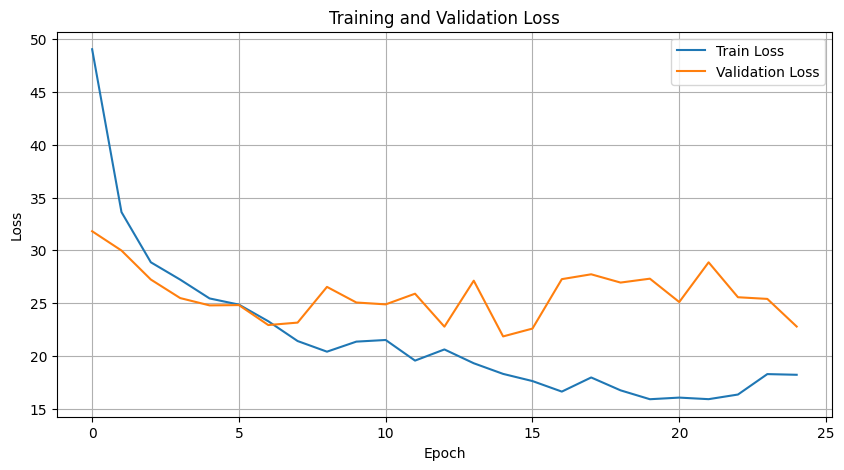

Training Accuracy: 91.1490
Training Precision Scores: [31.33281372 99.68843886]
Training Recall Scores: [93.48837209 91.04674797]
Training F1 Scores: [46.9352014  95.17182769]

Validation Accuracy: 91.1215
Validation Precision Scores: [26.96245734 99.38461538]
Validation Recall Scores: [84.94623656 91.35353535]
Validation F1 Scores: [40.93264249 95.2       ]

Threshold: 0.5
Validation Accuracy: 91.1215
Validation Precision Scores: [26.96245734 99.38461538]
Validation Recall Scores: [84.94623656 91.35353535]
Validation F1 Scores: [40.93264249 95.2       ]


Threshold: 0.6
Validation Accuracy: 93.3022
Validation Precision Scores: [32.44444444 99.14639351]
Validation Recall Scores: [78.49462366 93.85858586]
Validation F1 Scores: [45.91194969 96.43005396]


Threshold: 0.7
Validation Accuracy: 95.2492
Validation Precision Scores: [41.21212121 98.95963379]
Validation Recall Scores: [73.11827957 96.08080808]
Validation F1 Scores: [52.71317829 97.49897499]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 26.1242, Val Loss: 21.9478
Epoch 10/50, Train Loss: 23.0291, Val Loss: 22.9733
Epoch 15/50, Train Loss: 18.3506, Val Loss: 26.1328
Epoch 20/50, Train Loss: 18.0447, Val Loss: 21.2710
Early stopping triggered after 24 epochs because no improvements over 10 subsequent epochs!
Epoch 24/50, Train Loss: 16.1969, Val Loss: 23.2196
The function took 45.32 seconds to execute.


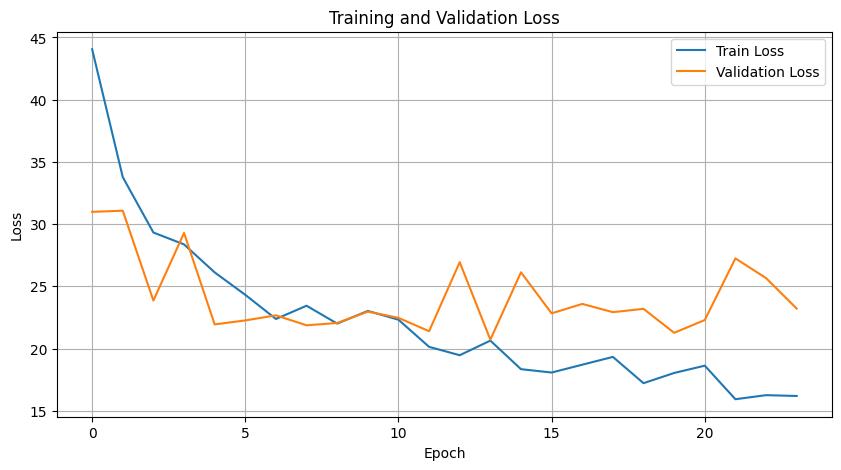

Training Accuracy: 90.1461
Training Precision Scores: [28.79008746 99.60665318]
Training Recall Scores: [91.86046512 90.07113821]
Training F1 Scores: [43.84017758 94.59921016]

Validation Accuracy: 89.6028
Validation Precision Scores: [24.41176471 99.55116697]
Validation Recall Scores: [89.24731183 89.61616162]
Validation F1 Scores: [38.33718245 94.3227727 ]

Threshold: 0.5
Validation Accuracy: 89.6028
Validation Precision Scores: [24.41176471 99.55116697]
Validation Recall Scores: [89.24731183 89.61616162]
Validation F1 Scores: [38.33718245 94.3227727 ]


Threshold: 0.6
Validation Accuracy: 92.0561
Validation Precision Scores: [28.73563218 99.21976593]
Validation Recall Scores: [80.64516129 92.48484848]
Validation F1 Scores: [42.37288136 95.73400251]


Threshold: 0.7
Validation Accuracy: 94.1589
Validation Precision Scores: [35.23316062 98.94736842]
Validation Recall Scores: [73.11827957 94.94949495]
Validation F1 Scores: [47.55244755 96.90721649]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 25.7412, Val Loss: 27.8013
Epoch 10/50, Train Loss: 22.1580, Val Loss: 23.7855
Epoch 15/50, Train Loss: 20.9876, Val Loss: 29.3248
Early stopping triggered after 20 epochs because no improvements over 10 subsequent epochs!
Epoch 20/50, Train Loss: 20.3855, Val Loss: 27.4963
The function took 41.81 seconds to execute.


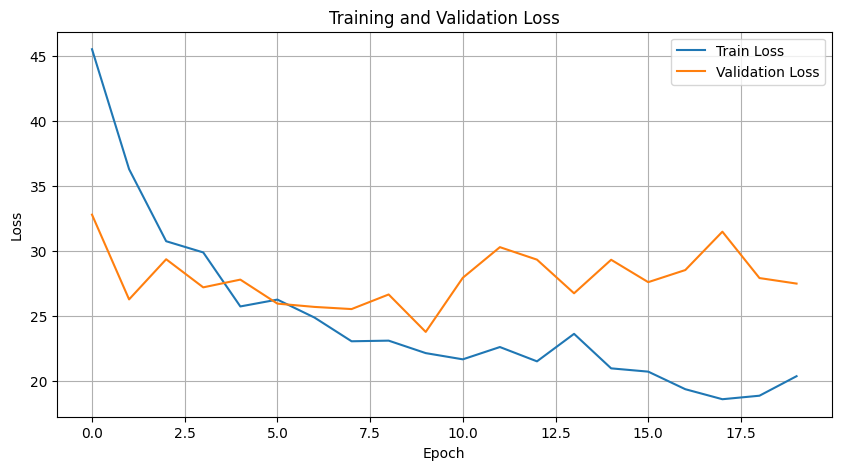

Training Accuracy: 91.0808
Training Precision Scores: [30.59105431 99.47882014]
Training Recall Scores: [89.06976744 91.16869919]
Training F1 Scores: [45.54102259 95.14264503]

Validation Accuracy: 90.3816
Validation Precision Scores: [24.67105263 99.204947  ]
Validation Recall Scores: [80.64516129 90.74747475]
Validation F1 Scores: [37.78337531 94.78792994]

Threshold: 0.5
Validation Accuracy: 90.3816
Validation Precision Scores: [24.67105263 99.204947  ]
Validation Recall Scores: [80.64516129 90.74747475]
Validation F1 Scores: [37.78337531 94.78792994]


Threshold: 0.6
Validation Accuracy: 94.1199
Validation Precision Scores: [35.5        99.07094595]
Validation Recall Scores: [76.34408602 94.78787879]
Validation F1 Scores: [48.46416382 96.88209787]


Threshold: 0.7
Validation Accuracy: 95.3271
Validation Precision Scores: [41.71779141 98.96049896]
Validation Recall Scores: [73.11827957 96.16161616]
Validation F1 Scores: [53.125      97.54098361]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 27.5092, Val Loss: 28.0371
Epoch 10/50, Train Loss: 22.6324, Val Loss: 31.6975
Early stopping triggered after 15 epochs because no improvements over 10 subsequent epochs!
Epoch 15/50, Train Loss: 20.4260, Val Loss: 33.3761
The function took 32.45 seconds to execute.


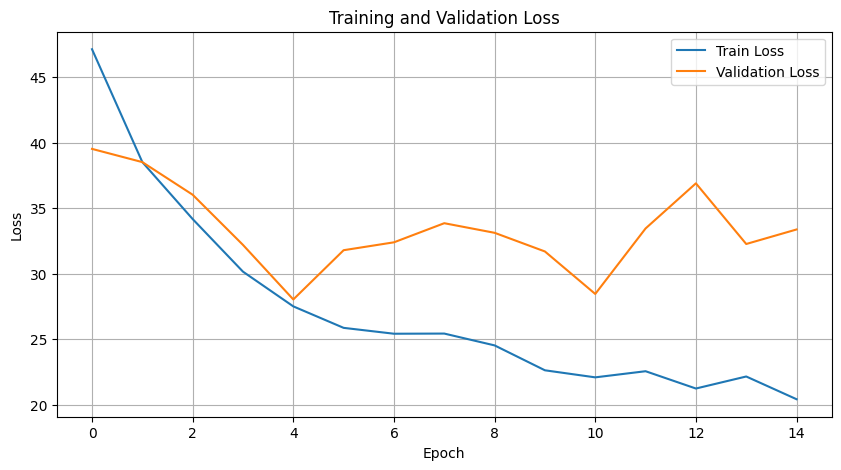

Training Accuracy: 89.3768
Training Precision Scores: [24.90508732 98.86071708]
Training Recall Scores: [76.27906977 89.94918699]
Training F1 Scores: [37.55008586 94.19464694]

Validation Accuracy: 88.9798
Validation Precision Scores: [21.21212121 98.97229669]
Validation Recall Scores: [75.2688172  89.49494949]
Validation F1 Scores: [33.09692671 93.99533206]

Threshold: 0.5
Validation Accuracy: 88.9798
Validation Precision Scores: [21.21212121 98.97229669]
Validation Recall Scores: [75.2688172  89.49494949]
Validation F1 Scores: [33.09692671 93.99533206]


Threshold: 0.6
Validation Accuracy: 93.3022
Validation Precision Scores: [30.15075377 98.60700718]
Validation Recall Scores: [64.51612903 94.38383838]
Validation F1 Scores: [41.09589041 96.44921552]


Threshold: 0.7
Validation Accuracy: 94.9766
Validation Precision Scores: [36.36363636 98.15270936]
Validation Recall Scores: [51.61290323 96.60606061]
Validation F1 Scores: [42.66666667 97.37324374]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 25.8026, Val Loss: 22.9581
Epoch 10/50, Train Loss: 23.5490, Val Loss: 23.2874
Epoch 15/50, Train Loss: 21.9899, Val Loss: 24.1232
Epoch 20/50, Train Loss: 19.4286, Val Loss: 26.8190
Early stopping triggered after 24 epochs because no improvements over 10 subsequent epochs!
Epoch 24/50, Train Loss: 17.0860, Val Loss: 23.2527
The function took 52.89 seconds to execute.


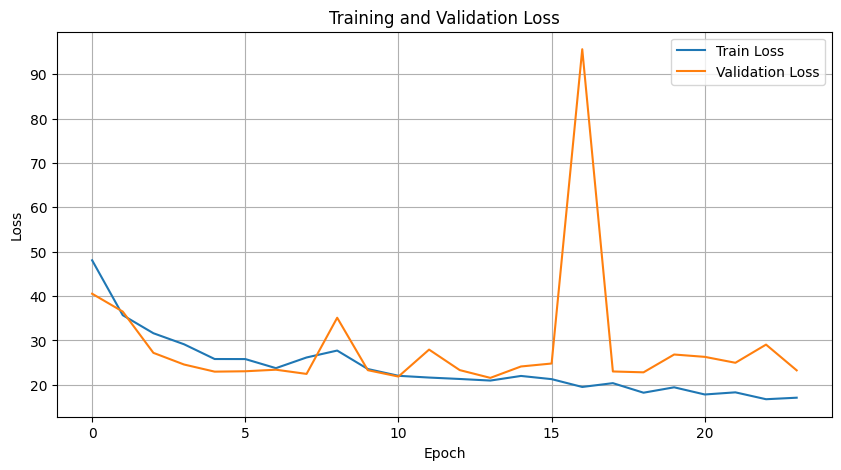

Training Accuracy: 88.8510
Training Precision Scores: [26.40264026 99.65733866]
Training Recall Scores: [93.02325581 88.66869919]
Training F1 Scores: [41.1311054  93.84243076]

Validation Accuracy: 88.3956
Validation Precision Scores: [22.66666667 99.63520292]
Validation Recall Scores: [91.39784946 88.28282828]
Validation F1 Scores: [36.32478632 93.61610968]

Threshold: 0.5
Validation Accuracy: 88.3956
Validation Precision Scores: [22.66666667 99.63520292]
Validation Recall Scores: [91.39784946 88.28282828]
Validation F1 Scores: [36.32478632 93.61610968]


Threshold: 0.6
Validation Accuracy: 92.7570
Validation Precision Scores: [31.3253012  99.35316947]
Validation Recall Scores: [83.87096774 93.09090909]
Validation F1 Scores: [45.61403509 96.12015019]


Threshold: 0.7
Validation Accuracy: 96.1838
Validation Precision Scores: [48.27586207 99.05076352]
Validation Recall Scores: [75.2688172  96.96969697]
Validation F1 Scores: [58.82352941 97.99918334]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 28.0761, Val Loss: 23.0171
Epoch 10/50, Train Loss: 24.0684, Val Loss: 22.7654
Early stopping triggered after 13 epochs because no improvements over 10 subsequent epochs!
Epoch 13/50, Train Loss: 21.2287, Val Loss: 23.5803
The function took 30.52 seconds to execute.


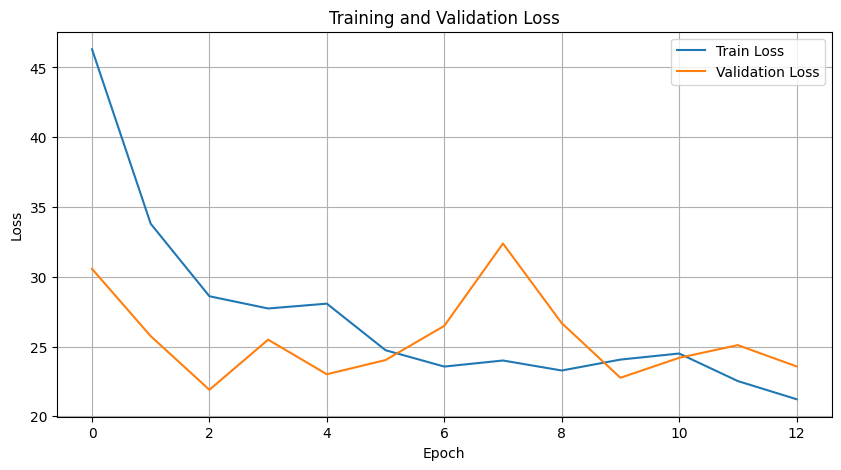

Training Accuracy: 90.0292
Training Precision Scores: [25.85365854 98.76106195]
Training Recall Scores: [73.95348837 90.73170732]
Training F1 Scores: [38.31325301 94.57627119]

Validation Accuracy: 90.3816
Validation Precision Scores: [24.50331126 99.16151809]
Validation Recall Scores: [79.56989247 90.78787879]
Validation F1 Scores: [37.46835443 94.79012866]

Threshold: 0.5
Validation Accuracy: 90.3816
Validation Precision Scores: [24.50331126 99.16151809]
Validation Recall Scores: [79.56989247 90.78787879]
Validation F1 Scores: [37.46835443 94.79012866]


Threshold: 0.6
Validation Accuracy: 93.4190
Validation Precision Scores: [32.56880734 99.06382979]
Validation Recall Scores: [76.34408602 94.06060606]
Validation F1 Scores: [45.65916399 96.49740933]


Threshold: 0.7
Validation Accuracy: 95.5218
Validation Precision Scores: [42.66666667 98.8006617 ]
Validation Recall Scores: [68.8172043  96.52525253]
Validation F1 Scores: [52.67489712 97.64970366]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 24.8792, Val Loss: 23.6952
Epoch 10/50, Train Loss: 20.0086, Val Loss: 22.8912
Epoch 15/50, Train Loss: 21.8312, Val Loss: 30.5929
Early stopping triggered after 20 epochs because no improvements over 10 subsequent epochs!
Epoch 20/50, Train Loss: 18.4261, Val Loss: 25.4104
The function took 50.86 seconds to execute.


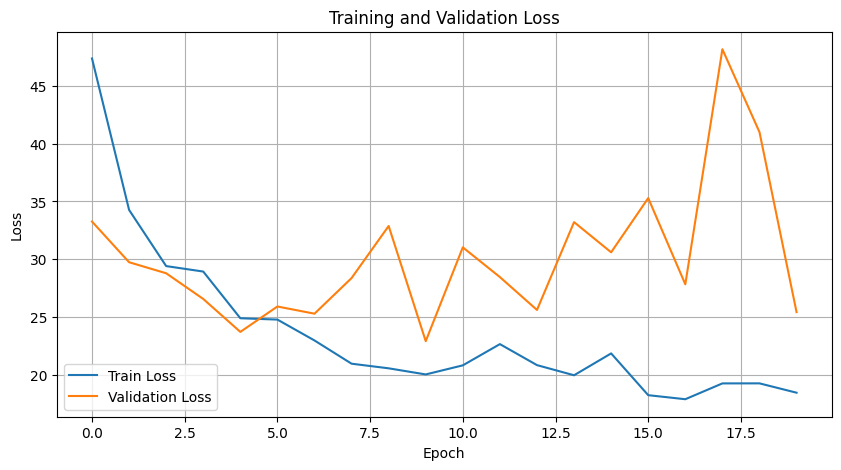

Training Accuracy: 89.8832
Training Precision Scores: [28.29650748 99.62783354]
Training Recall Scores: [92.3255814  89.77642276]
Training F1 Scores: [43.31696672 94.44592933]

Validation Accuracy: 88.9798
Validation Precision Scores: [22.70114943 99.36936937]
Validation Recall Scores: [84.94623656 89.13131313]
Validation F1 Scores: [35.8276644  93.97231097]

Threshold: 0.5
Validation Accuracy: 88.9798
Validation Precision Scores: [22.70114943 99.36936937]
Validation Recall Scores: [84.94623656 89.13131313]
Validation F1 Scores: [35.8276644  93.97231097]


Threshold: 0.6
Validation Accuracy: 92.4455
Validation Precision Scores: [29.7188755  99.18068133]
Validation Recall Scores: [79.56989247 92.92929293]
Validation F1 Scores: [43.2748538  95.95327493]


Threshold: 0.7
Validation Accuracy: 95.6386
Validation Precision Scores: [44.02515723 99.04524699]
Validation Recall Scores: [75.2688172 96.4040404]
Validation F1 Scores: [55.55555556 97.70679771]


Threshold: 0.8
Validation Accuracy: 9

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 25.9213, Val Loss: 30.6943
Epoch 10/50, Train Loss: 23.8911, Val Loss: 27.2544
Early stopping triggered after 13 epochs because no improvements over 10 subsequent epochs!
Epoch 13/50, Train Loss: 18.2578, Val Loss: 25.8883
The function took 34.61 seconds to execute.


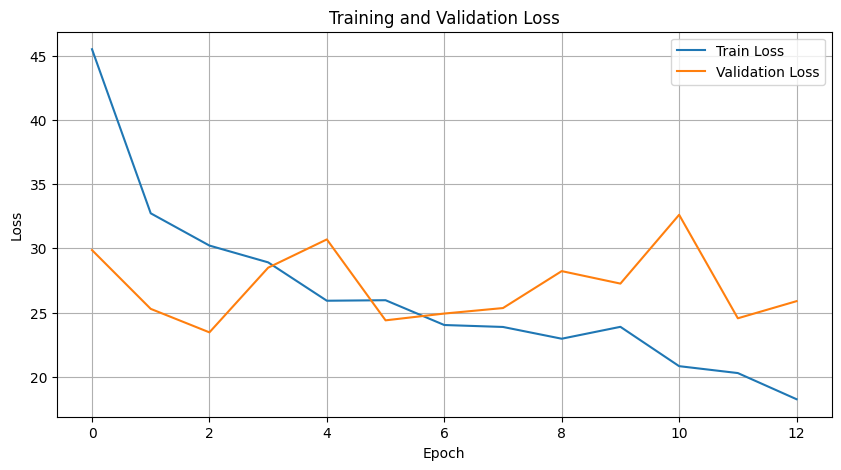

Training Accuracy: 86.8257
Training Precision Scores: [21.97935641 99.21141134]
Training Recall Scores: [84.18604651 86.94105691]
Training F1 Scores: [34.85796822 92.67183015]

Validation Accuracy: 86.2150
Validation Precision Scores: [18.70503597 99.30264993]
Validation Recall Scores: [83.87096774 86.3030303 ]
Validation F1 Scores: [30.58823529 92.34760052]

Threshold: 0.5
Validation Accuracy: 86.2150
Validation Precision Scores: [18.70503597 99.30264993]
Validation Recall Scores: [83.87096774 86.3030303 ]
Validation F1 Scores: [30.58823529 92.34760052]


Threshold: 0.6
Validation Accuracy: 92.1340
Validation Precision Scores: [27.75510204 98.92380542]
Validation Recall Scores: [73.11827957 92.84848485]
Validation F1 Scores: [40.23668639 95.78991246]


Threshold: 0.7
Validation Accuracy: 95.0935
Validation Precision Scores: [39.35483871 98.67384998]
Validation Recall Scores: [65.59139785 96.2020202 ]
Validation F1 Scores: [49.19354839 97.42225859]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 27.2971, Val Loss: 28.6508
Epoch 10/50, Train Loss: 26.5712, Val Loss: 25.4273
Epoch 15/50, Train Loss: 20.6089, Val Loss: 23.0051
Early stopping triggered after 16 epochs because no improvements over 10 subsequent epochs!
Epoch 16/50, Train Loss: 19.0696, Val Loss: 30.0144
The function took 45.21 seconds to execute.


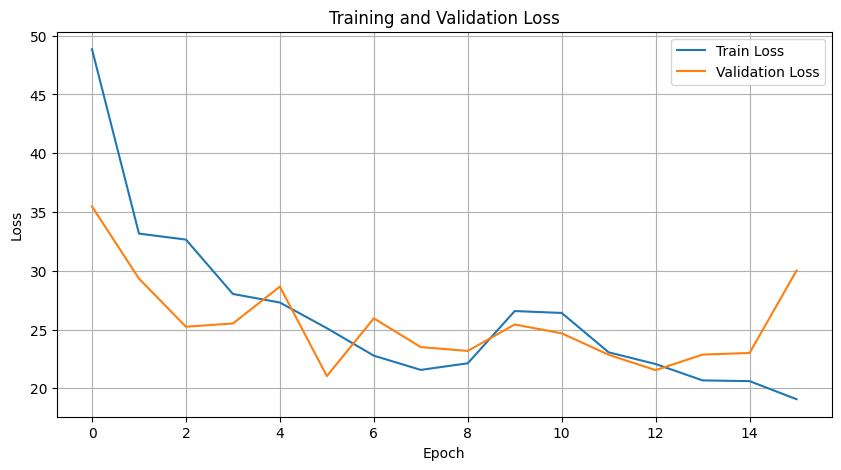

Training Accuracy: 90.8666
Training Precision Scores: [29.4165316  99.25852147]
Training Recall Scores: [84.41860465 91.14837398]
Training F1 Scores: [43.62980769 95.03072685]

Validation Accuracy: 91.2383
Validation Precision Scores: [26.76056338 99.25569177]
Validation Recall Scores: [81.72043011 91.5959596 ]
Validation F1 Scores: [40.31830239 95.27211599]

Threshold: 0.5
Validation Accuracy: 91.2383
Validation Precision Scores: [26.76056338 99.25569177]
Validation Recall Scores: [81.72043011 91.5959596 ]
Validation F1 Scores: [40.31830239 95.27211599]


Threshold: 0.6
Validation Accuracy: 93.4579
Validation Precision Scores: [33.03167421 99.14784832]
Validation Recall Scores: [78.49462366 94.02020202]
Validation F1 Scores: [46.49681529 96.51596848]


Threshold: 0.7
Validation Accuracy: 94.9766
Validation Precision Scores: [39.88764045 99.07949791]
Validation Recall Scores: [76.34408602 95.67676768]
Validation F1 Scores: [52.39852399 97.34840699]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 25.2597, Val Loss: 26.4426
Epoch 10/50, Train Loss: 22.2792, Val Loss: 28.7916
Epoch 15/50, Train Loss: 22.3347, Val Loss: 27.5345
Epoch 20/50, Train Loss: 19.1259, Val Loss: 36.1332
Early stopping triggered after 21 epochs because no improvements over 10 subsequent epochs!
Epoch 21/50, Train Loss: 18.6059, Val Loss: 37.0555
The function took 62.19 seconds to execute.


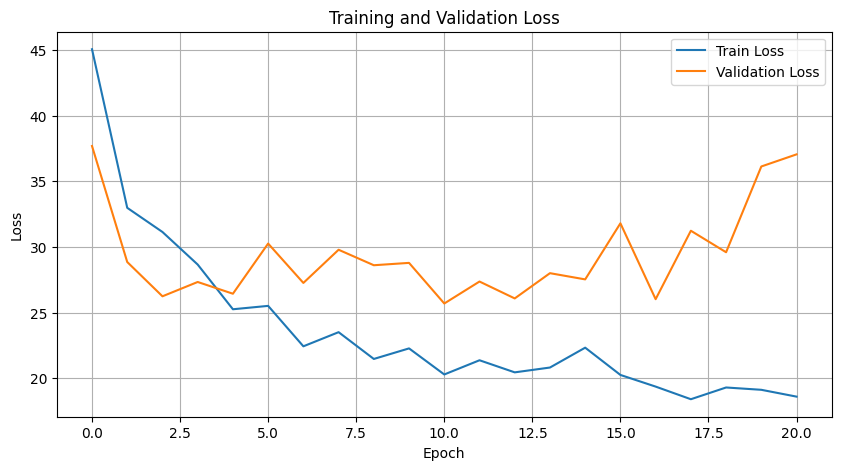

Training Accuracy: 91.0613
Training Precision Scores: [30.         99.29281768]
Training Recall Scores: [85.11627907 91.32113821]
Training F1 Scores: [44.36363636 95.14028587]

Validation Accuracy: 90.0701
Validation Precision Scores: [24.03846154 99.20212766]
Validation Recall Scores: [80.64516129 90.42424242]
Validation F1 Scores: [37.03703704 94.61001902]

Threshold: 0.5
Validation Accuracy: 90.0701
Validation Precision Scores: [24.03846154 99.20212766]
Validation Recall Scores: [80.64516129 90.42424242]
Validation F1 Scores: [37.03703704 94.61001902]


Threshold: 0.6
Validation Accuracy: 93.4969
Validation Precision Scores: [32.21153846 98.89830508]
Validation Recall Scores: [72.04301075 94.3030303 ]
Validation F1 Scores: [44.51827243 96.54601861]


Threshold: 0.7
Validation Accuracy: 95.6386
Validation Precision Scores: [42.63565891 98.44198442]
Validation Recall Scores: [59.13978495 97.01010101]
Validation F1 Scores: [49.54954955 97.72079772]


Threshold: 0.8
Validation Accuracy:

In [15]:
embedding_sizes = [8,16,32,64,128,256]
hidden_dims = [8,16,32,64,128,256,320, 384, 512]

for i in range(len(embedding_sizes)):
    for j in range(i,len(hidden_dims)):
        embedding_size=embedding_sizes[i]
        hidden_dim=hidden_dims[j]
        print("-------------------------------------------------------------------------")
        print("-------------------------------------------------------------------------")
        print("-------------------------------------------------------------------------")
        print(f"Trying with embedding size {embedding_size} and hidden dim {hidden_dim}")

        # Create embedding layer with the given vocabulary size and embedding size
        vocabulary_size = len(vectorizer.vocabulary_) + 1  # Add 1 for out-of-vocabulary
        embeddings = nn.Embedding(vocabulary_size, embedding_size)
        X_train_graph = GraphDataset(X_train, y_train, embeddings)
        X_val_graph = GraphDataset(X_val, y_val, embeddings)
        X_test_graph = GraphDataset(X_test, y_test, embeddings)
        
        # Create DataLoader for batching
        # NOTICE: This data loader is from torch_geometric.loader!! It is not from torch.utils.data
        batch_size = 64
        train_loader = torch_geometric.loader.DataLoader(X_train_graph, batch_size=batch_size, shuffle=True)
        val_loader = torch_geometric.loader.DataLoader(X_val_graph, batch_size=batch_size, shuffle=False)
        test_loader = torch_geometric.loader.DataLoader(X_test_graph, batch_size=batch_size, shuffle=False)
        
        class_weight = compute_class_weight(class_weight='balanced', classes=np.unique(y_train_original), y=y_train_original)  # Computing class weights
        class_weight_tensor = torch.tensor(class_weight, dtype=torch.float32).to(device)  # Converting to PyTorch tensor
        criterion = nn.CrossEntropyLoss(weight=class_weight_tensor)
        num_epochs = 50
        model = GraphSAGE(input_dim=embedding_size, hidden_dim=hidden_dim, output_dim=2).to(device)
        optimizer = optim.AdamW(model.parameters(), lr=0.01, weight_decay=0.01)
        training_loop(model, train_loader, val_loader, X_train_graph, X_val_graph, device, optimizer, num_epochs, criterion)
        
        train_accuracy, train_precisionscores, train_recallscores, train_f1scores, _, _ = testing_model(model,train_loader,device)
        val_accuracy, val_precisionscores, val_recallscores, val_f1scores, _, _ = testing_model(model,val_loader,device)
        #test_accuracy, test_precisionscores, test_recallscores, test_f1scores, all_labels_test, all_predictions_test = testing_model(model,test_loader,device)
        
        stats(train_accuracy, train_precisionscores, train_recallscores, train_f1scores, 'Training')
        stats(val_accuracy, val_precisionscores, val_recallscores, val_f1scores, 'Validation')
        #stats(test_accuracy, test_precisionscores, test_recallscores, test_f1scores, 'Test')
        #ConfusionMatrixDisplay.from_predictions(all_labels_test, all_predictions_test, cmap='Blues')
        #ConfusionMatrixDisplay.from_predictions(all_labels_test, all_predictions_test, normalize='true', cmap='Blues')
        
        # Test with different thresholds
        for threshold in [0.5, 0.6, 0.7, 0.8, 0.9]:
            print(f"Threshold: {threshold}")
            val_accuracy, val_precisionscores, val_recallscores, val_f1scores, _, _ = testing_model_with_threshold(model,val_loader,device,threshold=threshold)
            stats(val_accuracy, val_precisionscores, val_recallscores, val_f1scores, 'Validation')
            print()

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 29.8540, Val Loss: 32.2394
Epoch 10/50, Train Loss: 23.8979, Val Loss: 23.4067
Epoch 15/50, Train Loss: 22.0149, Val Loss: 25.1712
Early stopping triggered after 20 epochs because no improvements over 10 subsequent epochs!
Epoch 20/50, Train Loss: 20.2248, Val Loss: 23.6084
The function took 29.33 seconds to execute.


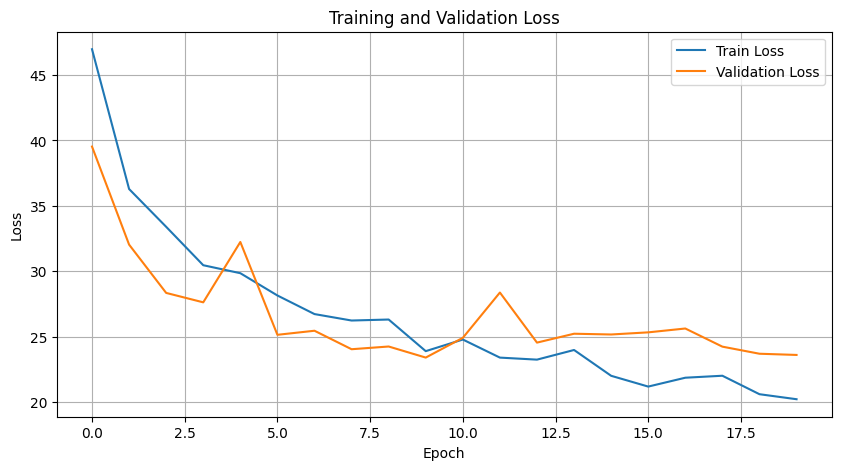

Test Accuracy: 96.5732
Test Precision Scores: [53.01204819 98.02816901]
Test Recall Scores: [47.31182796 98.42424242]
Test F1 Scores: [50.         98.22580645]



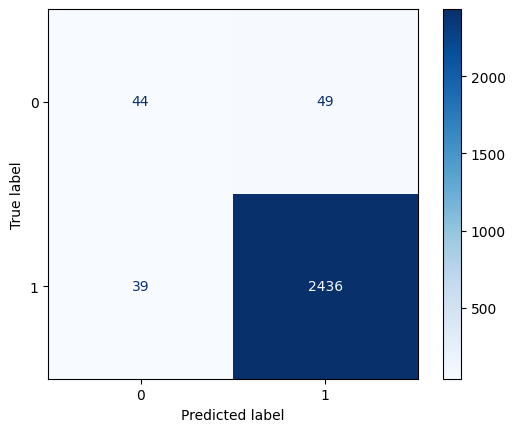

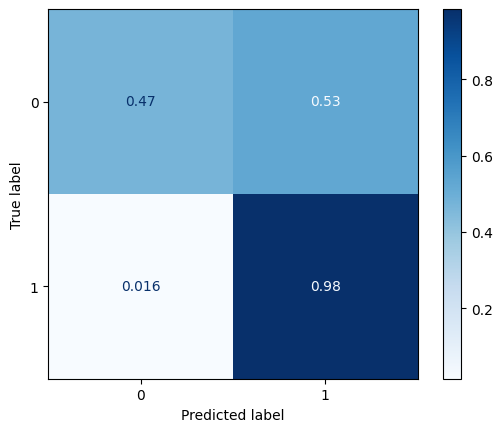

In [27]:
# 16 and hidden dim 256 threshold 0.9

embedding_size=16
hidden_dim=256
threshold = 0.9 

# Create embedding layer with the given vocabulary size and embedding size
vocabulary_size = len(vectorizer.vocabulary_) + 1  # Add 1 for out-of-vocabulary
embeddings = nn.Embedding(vocabulary_size, embedding_size)
X_train_graph = GraphDataset(X_train, y_train, embeddings)
X_val_graph = GraphDataset(X_val, y_val, embeddings)
X_test_graph = GraphDataset(X_test, y_test, embeddings)

# Create DataLoader for batching
# NOTICE: This data loader is from torch_geometric.loader!! It is not from torch.utils.data
batch_size = 64
train_loader = torch_geometric.loader.DataLoader(X_train_graph, batch_size=batch_size, shuffle=True)
val_loader = torch_geometric.loader.DataLoader(X_val_graph, batch_size=batch_size, shuffle=False)
test_loader = torch_geometric.loader.DataLoader(X_test_graph, batch_size=batch_size, shuffle=False)

class_weight = compute_class_weight(class_weight='balanced', classes=np.unique(y_train_original), y=y_train_original)  # Computing class weights
class_weight_tensor = torch.tensor(class_weight, dtype=torch.float32).to(device)  # Converting to PyTorch tensor
criterion = nn.CrossEntropyLoss(weight=class_weight_tensor)
num_epochs = 50
model = GraphSAGE(input_dim=embedding_size, hidden_dim=hidden_dim, output_dim=2).to(device)
optimizer = optim.AdamW(model.parameters(), lr=0.01, weight_decay=0.01)
training_loop(model, train_loader, val_loader, X_train_graph, X_val_graph, device, optimizer, num_epochs, criterion)

test_accuracy, test_precisionscores, test_recallscores, test_f1scores, all_labels_test, all_predictions_test = testing_model_with_threshold(model,val_loader,device,threshold=threshold)

stats(test_accuracy, test_precisionscores, test_recallscores, test_f1scores, 'Test')
ConfusionMatrixDisplay.from_predictions(all_labels_test, all_predictions_test, cmap='Blues')
ConfusionMatrixDisplay.from_predictions(all_labels_test, all_predictions_test, normalize='true', cmap='Blues')

## GAT

-------------------------------------------------------------------------
-------------------------------------------------------------------------
-------------------------------------------------------------------------
Trying with embedding size 8 and hidden dim 8


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 39.0102, Val Loss: 38.1614
Epoch 10/50, Train Loss: 33.1951, Val Loss: 32.8341
Epoch 15/50, Train Loss: 30.4372, Val Loss: 30.8448
Epoch 20/50, Train Loss: 30.3905, Val Loss: 31.0182
Epoch 25/50, Train Loss: 28.0026, Val Loss: 26.8883
Epoch 30/50, Train Loss: 27.4088, Val Loss: 27.7825
Early stopping triggered after 33 epochs because no improvements over 10 subsequent epochs!
Epoch 33/50, Train Loss: 26.3089, Val Loss: 29.9954
The function took 56.98 seconds to execute.


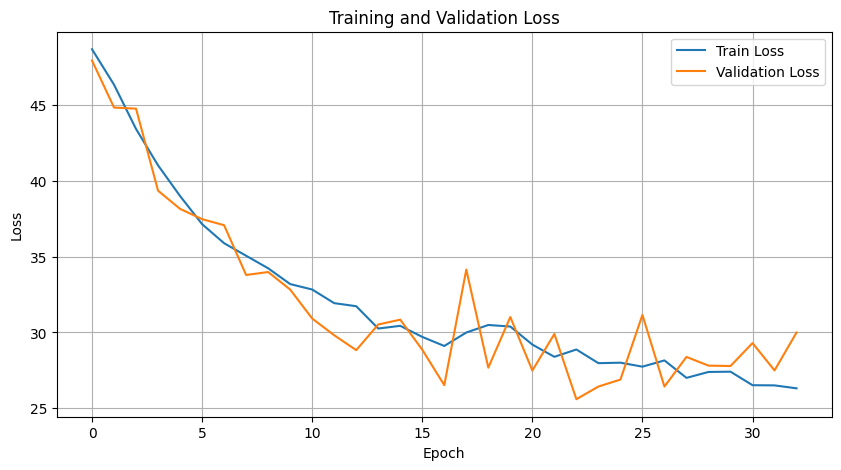

Training Accuracy: 86.1831
Training Precision Scores: [20.7223209  99.06770773]
Training Recall Scores: [81.39534884 86.39227642]
Training F1 Scores: [33.03445021 92.29683513]

Validation Accuracy: 86.7212
Validation Precision Scores: [19.45812808 99.35245143]
Validation Recall Scores: [84.94623656 86.78787879]
Validation F1 Scores: [31.66332665 92.6461074 ]

Threshold: 0.5
Validation Accuracy: 86.7212
Validation Precision Scores: [19.45812808 99.35245143]
Validation Recall Scores: [84.94623656 86.78787879]
Validation F1 Scores: [31.66332665 92.6461074 ]


Threshold: 0.6
Validation Accuracy: 90.9657
Validation Precision Scores: [25.26690391 99.0380411 ]
Validation Recall Scores: [76.34408602 91.51515152]
Validation F1 Scores: [37.96791444 95.12809744]


Threshold: 0.7
Validation Accuracy: 94.4315
Validation Precision Scores: [35.46511628 98.66444073]
Validation Recall Scores: [65.59139785 95.51515152]
Validation F1 Scores: [46.03773585 97.06425785]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 38.8971, Val Loss: 35.2171
Epoch 10/50, Train Loss: 33.2826, Val Loss: 31.8862
Epoch 15/50, Train Loss: 31.6364, Val Loss: 27.9429
Epoch 20/50, Train Loss: 31.4714, Val Loss: 29.5137
Epoch 25/50, Train Loss: 28.5403, Val Loss: 24.5040
Epoch 30/50, Train Loss: 29.9110, Val Loss: 28.7493
Early stopping triggered after 35 epochs because no improvements over 10 subsequent epochs!
Epoch 35/50, Train Loss: 27.2175, Val Loss: 24.9689
The function took 60.12 seconds to execute.


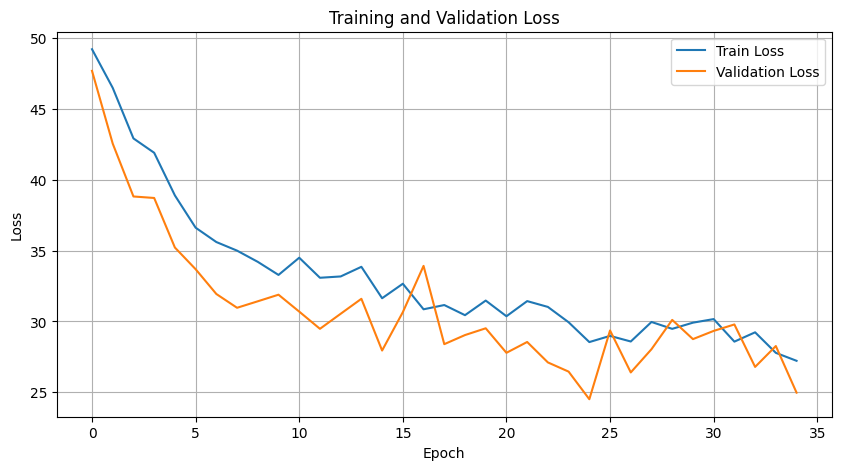

Training Accuracy: 88.0526
Training Precision Scores: [23.27297116 99.05456202]
Training Recall Scores: [80.69767442 88.37398374]
Training F1 Scores: [36.12701718 93.40995757]

Validation Accuracy: 89.0187
Validation Precision Scores: [22.12389381 99.19246299]
Validation Recall Scores: [80.64516129 89.33333333]
Validation F1 Scores: [34.72222222 94.00510204]

Threshold: 0.5
Validation Accuracy: 89.0187
Validation Precision Scores: [22.12389381 99.19246299]
Validation Recall Scores: [80.64516129 89.33333333]
Validation F1 Scores: [34.72222222 94.00510204]


Threshold: 0.6
Validation Accuracy: 92.2118
Validation Precision Scores: [28.51405622 99.05131522]
Validation Recall Scores: [76.34408602 92.80808081]
Validation F1 Scores: [41.52046784 95.82811848]


Threshold: 0.7
Validation Accuracy: 94.0421
Validation Precision Scores: [32.75862069 98.4962406 ]
Validation Recall Scores: [61.29032258 95.27272727]
Validation F1 Scores: [42.69662921 96.85767098]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 41.5580, Val Loss: 57.4460
Epoch 10/50, Train Loss: 35.8319, Val Loss: 33.9315
Epoch 15/50, Train Loss: 33.2896, Val Loss: 34.8361
Epoch 20/50, Train Loss: 31.0224, Val Loss: 40.6379
Epoch 25/50, Train Loss: 28.6341, Val Loss: 31.0588
Epoch 30/50, Train Loss: 28.1938, Val Loss: 29.2019
Epoch 35/50, Train Loss: 25.9330, Val Loss: 27.9621
Epoch 40/50, Train Loss: 26.5195, Val Loss: 28.8038
Epoch 45/50, Train Loss: 25.4159, Val Loss: 26.9866
Epoch 50/50, Train Loss: 25.6434, Val Loss: 30.0298
The function took 86.10 seconds to execute.


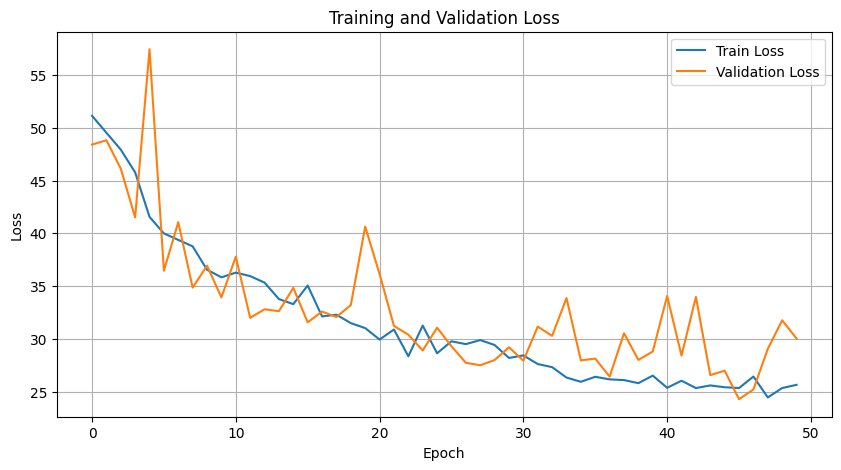

Training Accuracy: 85.7936
Training Precision Scores: [20.51575931 99.15542522]
Training Recall Scores: [83.25581395 85.90447154]
Training F1 Scores: [32.91954023 92.05554043]

Validation Accuracy: 85.6308
Validation Precision Scores: [18.05555556 99.29775281]
Validation Recall Scores: [83.87096774 85.6969697 ]
Validation F1 Scores: [29.71428571 91.99739753]

Threshold: 0.5
Validation Accuracy: 85.6308
Validation Precision Scores: [18.05555556 99.29775281]
Validation Recall Scores: [83.87096774 85.6969697 ]
Validation F1 Scores: [29.71428571 91.99739753]


Threshold: 0.6
Validation Accuracy: 90.9657
Validation Precision Scores: [25.78397213 99.167032  ]
Validation Recall Scores: [79.56989247 91.39393939]
Validation F1 Scores: [38.94736842 95.12195122]


Threshold: 0.7
Validation Accuracy: 93.4190
Validation Precision Scores: [31.55339806 98.81456393]
Validation Recall Scores: [69.89247312 94.3030303 ]
Validation F1 Scores: [43.47826087 96.50609882]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 44.9863, Val Loss: 43.3956
Epoch 10/50, Train Loss: 43.3156, Val Loss: 35.1859
Epoch 15/50, Train Loss: 38.0289, Val Loss: 37.2140
Epoch 20/50, Train Loss: 33.1039, Val Loss: 30.1235
Epoch 25/50, Train Loss: 32.1548, Val Loss: 29.6338
Epoch 30/50, Train Loss: 30.4889, Val Loss: 32.2712
Early stopping triggered after 33 epochs because no improvements over 10 subsequent epochs!
Epoch 33/50, Train Loss: 29.4609, Val Loss: 29.1637
The function took 59.00 seconds to execute.


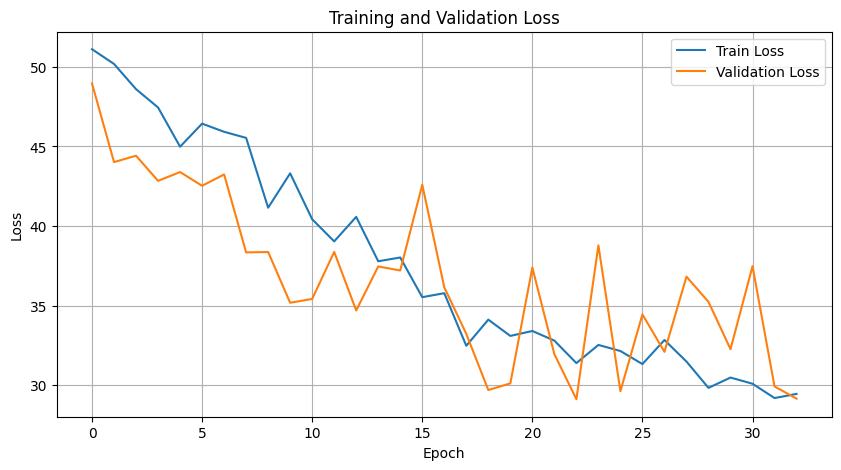

Training Accuracy: 79.3866
Training Precision Scores: [14.95637723 99.10975455]
Training Recall Scores: [83.72093023 79.19715447]
Training F1 Scores: [25.3789214  88.04157487]

Validation Accuracy: 78.8941
Validation Precision Scores: [12.64559068 99.13573971]
Validation Recall Scores: [81.72043011 78.78787879]
Validation F1 Scores: [21.90201729 87.79828906]

Threshold: 0.5
Validation Accuracy: 78.8941
Validation Precision Scores: [12.64559068 99.13573971]
Validation Recall Scores: [81.72043011 78.78787879]
Validation F1 Scores: [21.90201729 87.79828906]


Threshold: 0.6
Validation Accuracy: 86.0981
Validation Precision Scores: [17.48768473 98.98242368]
Validation Recall Scores: [76.34408602 86.46464646]
Validation F1 Scores: [28.45691383 92.30105672]


Threshold: 0.7
Validation Accuracy: 91.7056
Validation Precision Scores: [25.40983607 98.66609294]
Validation Recall Scores: [66.66666667 92.64646465]
Validation F1 Scores: [36.79525223 95.56157533]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 46.6823, Val Loss: 41.9380
Epoch 10/50, Train Loss: 40.7365, Val Loss: 48.2736
Epoch 15/50, Train Loss: 37.8866, Val Loss: 36.3605
Epoch 20/50, Train Loss: 36.7250, Val Loss: 49.6080
Epoch 25/50, Train Loss: 35.3319, Val Loss: 30.6111
Epoch 30/50, Train Loss: 32.0186, Val Loss: 27.8222
Epoch 35/50, Train Loss: 35.3670, Val Loss: 29.7200
Epoch 40/50, Train Loss: 32.7869, Val Loss: 26.8910
Early stopping triggered after 41 epochs because no improvements over 10 subsequent epochs!
Epoch 41/50, Train Loss: 39.5270, Val Loss: 36.2600
The function took 80.66 seconds to execute.


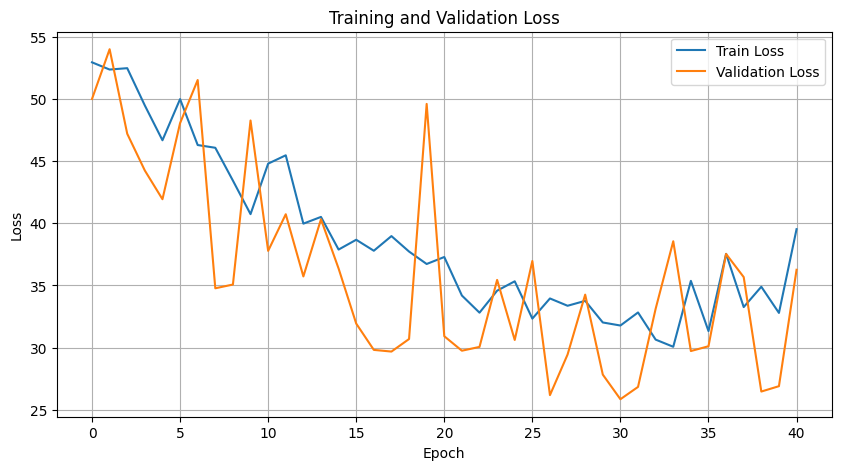

Training Accuracy: 83.5735
Training Precision Scores: [17.88451712 99.03765187]
Training Recall Scores: [81.39534884 83.66869919]
Training F1 Scores: [29.3255132  90.70677023]

Validation Accuracy: 83.8006
Validation Precision Scores: [16.         99.18776875]
Validation Recall Scores: [81.72043011 83.87878788]
Validation F1 Scores: [26.76056338 90.89316988]

Threshold: 0.5
Validation Accuracy: 83.8006
Validation Precision Scores: [16.         99.18776875]
Validation Recall Scores: [81.72043011 83.87878788]
Validation F1 Scores: [26.76056338 90.89316988]


Threshold: 0.6
Validation Accuracy: 87.6947
Validation Precision Scores: [19.45205479 99.00136178]
Validation Recall Scores: [76.34408602 88.12121212]
Validation F1 Scores: [31.00436681 93.24497649]


Threshold: 0.7
Validation Accuracy: 91.8614
Validation Precision Scores: [26.2295082  98.75215146]
Validation Recall Scores: [68.8172043  92.72727273]
Validation F1 Scores: [37.98219585 95.64492603]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 64.0878, Val Loss: 43.8936
Epoch 10/50, Train Loss: 46.2565, Val Loss: 36.4003
Epoch 15/50, Train Loss: 58.5463, Val Loss: 42.2643
Early stopping triggered after 18 epochs because no improvements over 10 subsequent epochs!
Epoch 18/50, Train Loss: 49.8148, Val Loss: 50.8831
The function took 44.05 seconds to execute.


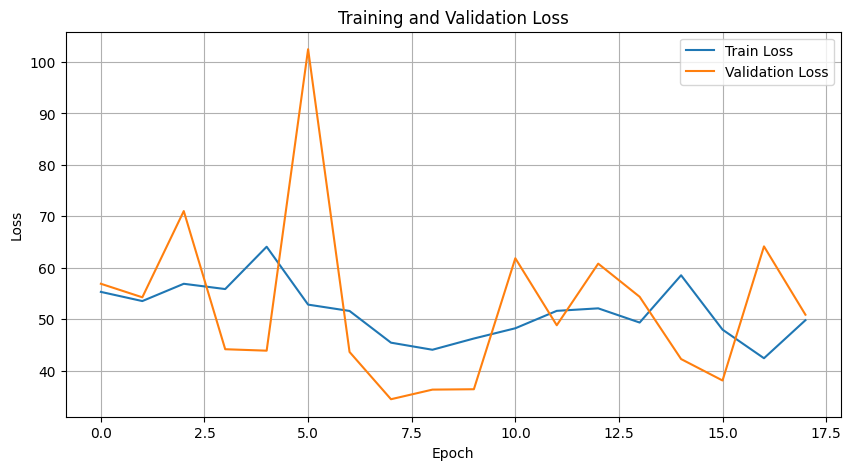

Training Accuracy: 84.2064
Training Precision Scores: [15.78645235 98.18245779]
Training Recall Scores: [63.95348837 85.09146341]
Training F1 Scores: [25.32228361 91.16942509]

Validation Accuracy: 84.3847
Validation Precision Scores: [14.67889908 98.63977486]
Validation Recall Scores: [68.8172043  84.96969697]
Validation F1 Scores: [24.19659735 91.29585414]

Threshold: 0.5
Validation Accuracy: 84.3847
Validation Precision Scores: [14.67889908 98.63977486]
Validation Recall Scores: [68.8172043  84.96969697]
Validation F1 Scores: [24.19659735 91.29585414]


Threshold: 0.6
Validation Accuracy: 89.7586
Validation Precision Scores: [18.04511278 98.04517811]
Validation Recall Scores: [51.61290323 91.19191919]
Validation F1 Scores: [26.74094708 94.49445259]


Threshold: 0.7
Validation Accuracy: 93.6916
Validation Precision Scores: [22.83464567 97.37812372]
Validation Recall Scores: [31.1827957  96.04040404]
Validation F1 Scores: [26.36363636 96.70463792]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 62.4660, Val Loss: 68.8774
Epoch 10/50, Train Loss: 58.6102, Val Loss: 49.6964
Epoch 15/50, Train Loss: 55.2249, Val Loss: 43.9672
Epoch 20/50, Train Loss: 46.3743, Val Loss: 37.5197
Epoch 25/50, Train Loss: 53.6285, Val Loss: 79.5858
Early stopping triggered after 30 epochs because no improvements over 10 subsequent epochs!
Epoch 30/50, Train Loss: 46.2963, Val Loss: 41.7887
The function took 83.69 seconds to execute.


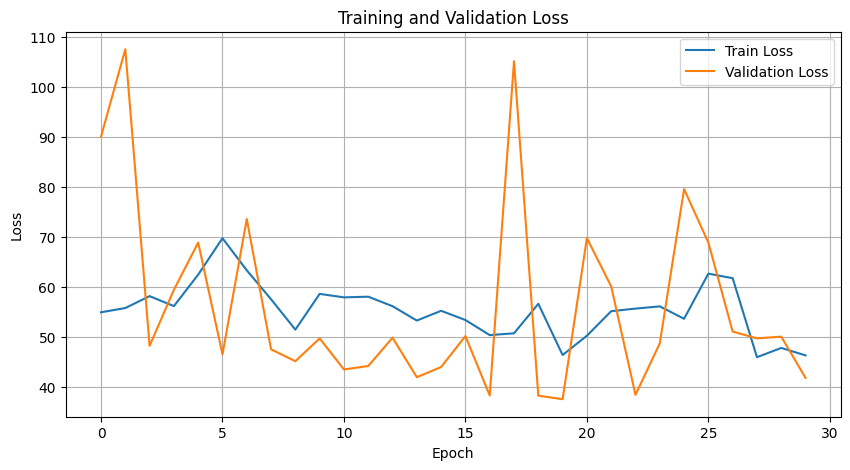

Training Accuracy: 69.7274
Training Precision Scores: [10.33461652 98.82489482]
Training Recall Scores: [81.1627907  69.22764228]
Training F1 Scores: [18.3346467 81.4199486]

Validation Accuracy: 69.0421
Validation Precision Scores: [ 9.18604651 99.18032787]
Validation Recall Scores: [84.94623656 68.44444444]
Validation F1 Scores: [16.5792235  80.99450155]

Threshold: 0.5
Validation Accuracy: 69.0421
Validation Precision Scores: [ 9.18604651 99.18032787]
Validation Recall Scores: [84.94623656 68.44444444]
Validation F1 Scores: [16.5792235  80.99450155]


Threshold: 0.6
Validation Accuracy: 77.1028
Validation Precision Scores: [10.90047393 98.75968992]
Validation Recall Scores: [74.19354839 77.21212121]
Validation F1 Scores: [19.00826446 86.66666667]


Threshold: 0.7
Validation Accuracy: 85.2804
Validation Precision Scores: [12.5984252  97.94238683]
Validation Recall Scores: [51.61290323 86.54545455]
Validation F1 Scores: [20.25316456 91.89189189]


Threshold: 0.8
Validation Accuracy: 9

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 63.3516, Val Loss: 69.9085
Epoch 10/50, Train Loss: 55.3681, Val Loss: 47.4163
Early stopping triggered after 11 epochs because no improvements over 10 subsequent epochs!
Epoch 11/50, Train Loss: 52.8863, Val Loss: 93.5456
The function took 33.76 seconds to execute.


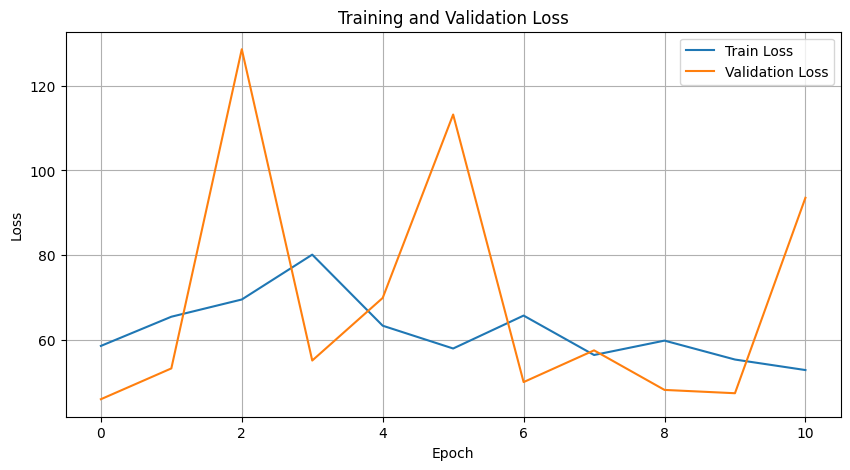

Training Accuracy: 75.8325
Training Precision Scores: [ 9.47867299 97.54458516]
Training Recall Scores: [55.81395349 76.70731707]
Training F1 Scores: [16.20526671 85.88007737]

Validation Accuracy: 75.8567
Validation Precision Scores: [ 8.76369327 98.08190772]
Validation Recall Scores: [60.21505376 76.44444444]
Validation F1 Scores: [15.30054645 85.92188919]

Threshold: 0.5
Validation Accuracy: 75.8567
Validation Precision Scores: [ 8.76369327 98.08190772]
Validation Recall Scores: [60.21505376 76.44444444]
Validation F1 Scores: [15.30054645 85.92188919]


Threshold: 0.6
Validation Accuracy: 86.0981
Validation Precision Scores: [ 9.00621118 97.15048976]
Validation Recall Scores: [31.1827957  88.16161616]
Validation F1 Scores: [13.97590361 92.43804279]


Threshold: 0.7
Validation Accuracy: 93.1075
Validation Precision Scores: [12.5        96.78338762]
Validation Recall Scores: [15.05376344 96.04040404]
Validation F1 Scores: [13.65853659 96.41046441]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 65.7680, Val Loss: 51.6774
Epoch 10/50, Train Loss: 63.5539, Val Loss: 46.2024
Epoch 15/50, Train Loss: 77.2209, Val Loss: 50.1317
Early stopping triggered after 20 epochs because no improvements over 10 subsequent epochs!
Epoch 20/50, Train Loss: 109.7992, Val Loss: 54.4292
The function took 72.86 seconds to execute.


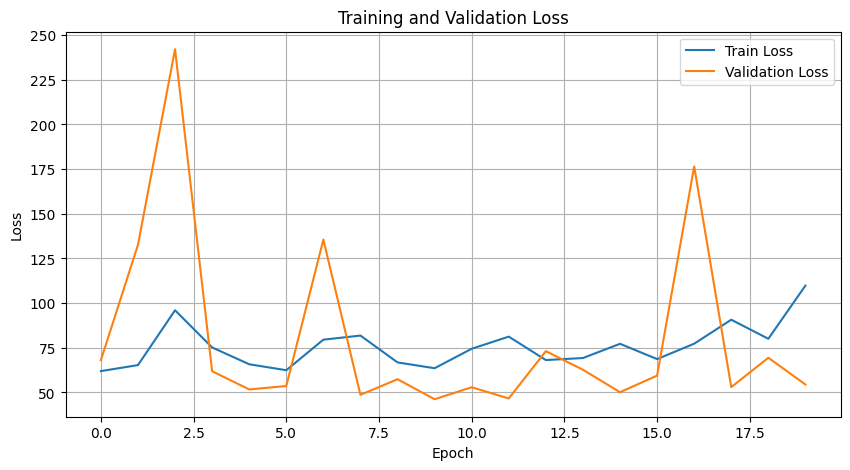

Training Accuracy: 80.9834
Training Precision Scores: [10.88854648 97.38075213]
Training Recall Scores: [49.30232558 82.36788618]
Training F1 Scores: [17.83761043 89.24737103]

Validation Accuracy: 80.7243
Validation Precision Scores: [10.11904762 97.96511628]
Validation Recall Scores: [54.83870968 81.6969697 ]
Validation F1 Scores: [17.08542714 89.09451421]

Threshold: 0.5
Validation Accuracy: 80.7243
Validation Precision Scores: [10.11904762 97.96511628]
Validation Recall Scores: [54.83870968 81.6969697 ]
Validation F1 Scores: [17.08542714 89.09451421]


Threshold: 0.6
Validation Accuracy: 90.1869
Validation Precision Scores: [12.67605634 97.19745223]
Validation Recall Scores: [29.03225806 92.48484848]
Validation F1 Scores: [17.64705882 94.7826087 ]


Threshold: 0.7
Validation Accuracy: 94.8988
Validation Precision Scores: [13.46153846 96.58187599]
Validation Recall Scores: [ 7.52688172 98.18181818]
Validation F1 Scores: [ 9.65517241 97.3752755 ]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 34.1345, Val Loss: 31.5635
Epoch 10/50, Train Loss: 29.2327, Val Loss: 27.8675
Epoch 15/50, Train Loss: 26.7887, Val Loss: 29.0780
Epoch 20/50, Train Loss: 24.8438, Val Loss: 25.7108
Epoch 25/50, Train Loss: 24.8751, Val Loss: 26.0386
Epoch 30/50, Train Loss: 23.0415, Val Loss: 23.5316
Epoch 35/50, Train Loss: 20.7618, Val Loss: 22.3247
Epoch 40/50, Train Loss: 21.5685, Val Loss: 22.3910
Epoch 45/50, Train Loss: 21.1798, Val Loss: 25.2821
Epoch 50/50, Train Loss: 20.2502, Val Loss: 25.9048
The function took 87.52 seconds to execute.


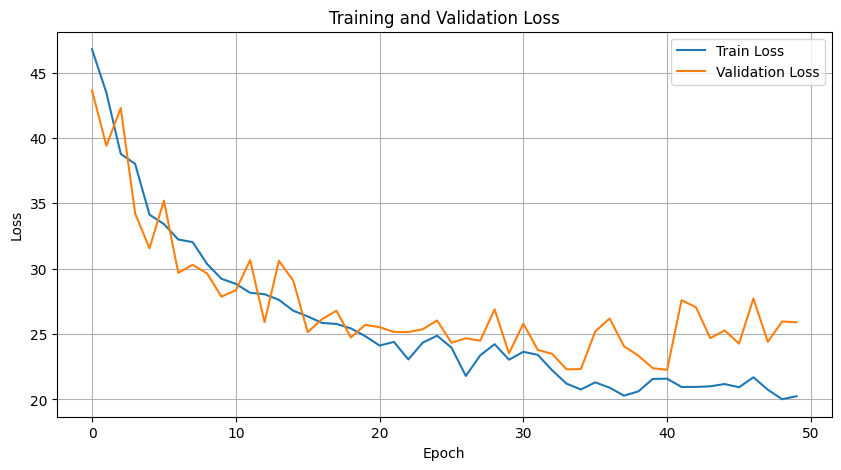

Training Accuracy: 92.0643
Training Precision Scores: [33.00970874 99.38710737]
Training Recall Scores: [86.97674419 92.28658537]
Training F1 Scores: [47.85668586 95.7053275 ]

Validation Accuracy: 91.3162
Validation Precision Scores: [27.43055556 99.38596491]
Validation Recall Scores: [84.94623656 91.55555556]
Validation F1 Scores: [41.46981627 95.31019979]

Threshold: 0.5
Validation Accuracy: 91.3162
Validation Precision Scores: [27.43055556 99.38596491]
Validation Recall Scores: [84.94623656 91.55555556]
Validation F1 Scores: [41.46981627 95.31019979]


Threshold: 0.6
Validation Accuracy: 93.2243
Validation Precision Scores: [32.46753247 99.22978177]
Validation Recall Scores: [80.64516129 93.6969697 ]
Validation F1 Scores: [46.2962963 96.3840399]


Threshold: 0.7
Validation Accuracy: 94.7430
Validation Precision Scores: [38.20224719 98.9539749 ]
Validation Recall Scores: [73.11827957 95.55555556]
Validation F1 Scores: [50.18450185 97.22507708]


Threshold: 0.8
Validation Accuracy: 9

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 37.2835, Val Loss: 33.8163
Epoch 10/50, Train Loss: 32.6587, Val Loss: 35.4304
Epoch 15/50, Train Loss: 30.8448, Val Loss: 26.6918
Epoch 20/50, Train Loss: 29.3204, Val Loss: 28.6762
Early stopping triggered after 25 epochs because no improvements over 10 subsequent epochs!
Epoch 25/50, Train Loss: 27.3044, Val Loss: 27.7777
The function took 44.15 seconds to execute.


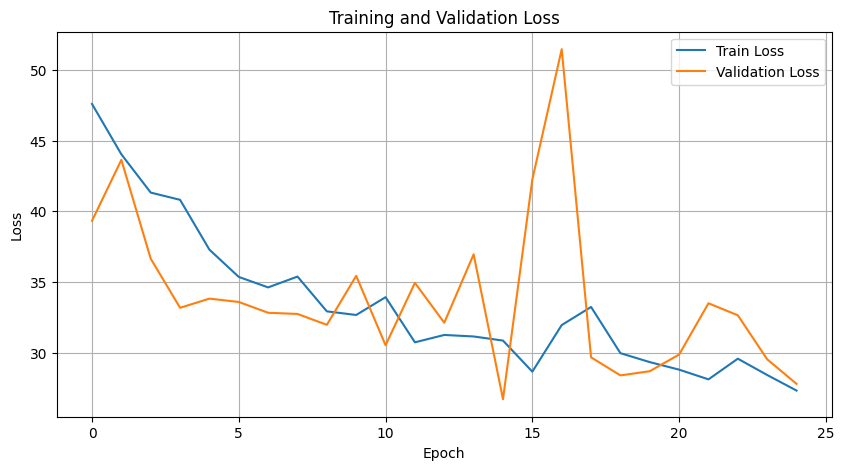

Training Accuracy: 83.0088
Training Precision Scores: [17.56290084 99.10226859]
Training Recall Scores: [82.79069767 83.01829268]
Training F1 Scores: [28.97842898 90.35005254]

Validation Accuracy: 83.5670
Validation Precision Scores: [16.22176591 99.32724652]
Validation Recall Scores: [84.94623656 83.51515152]
Validation F1 Scores: [27.24137931 90.73748903]

Threshold: 0.5
Validation Accuracy: 83.5670
Validation Precision Scores: [16.22176591 99.32724652]
Validation Recall Scores: [84.94623656 83.51515152]
Validation F1 Scores: [27.24137931 90.73748903]


Threshold: 0.6
Validation Accuracy: 89.1745
Validation Precision Scores: [21.71253823 99.0182954 ]
Validation Recall Scores: [76.34408602 89.65656566]
Validation F1 Scores: [33.80952381 94.10517388]


Threshold: 0.7
Validation Accuracy: 93.1854
Validation Precision Scores: [29.29292929 98.52320675]
Validation Recall Scores: [62.3655914  94.34343434]
Validation F1 Scores: [39.86254296 96.3880289 ]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 40.8258, Val Loss: 34.7488
Epoch 10/50, Train Loss: 30.4454, Val Loss: 32.1898
Epoch 15/50, Train Loss: 27.7552, Val Loss: 27.7033
Epoch 20/50, Train Loss: 27.8521, Val Loss: 26.0819
Epoch 25/50, Train Loss: 25.2240, Val Loss: 26.1282
Epoch 30/50, Train Loss: 23.3502, Val Loss: 24.5768
Early stopping triggered after 33 epochs because no improvements over 10 subsequent epochs!
Epoch 33/50, Train Loss: 23.5237, Val Loss: 26.7141
The function took 60.21 seconds to execute.


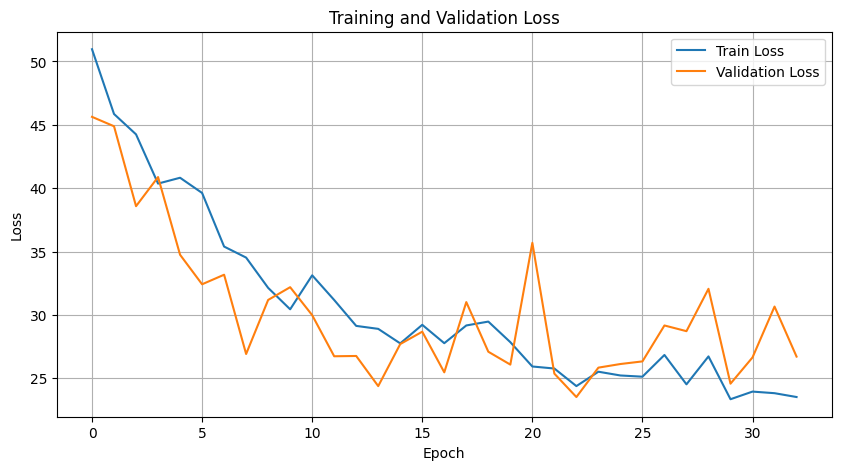

Training Accuracy: 85.5794
Training Precision Scores: [21.64058284 99.65545919]
Training Recall Scores: [93.25581395 85.24390244]
Training F1 Scores: [35.12921594 91.88804294]

Validation Accuracy: 85.6308
Validation Precision Scores: [18.63636364 99.48308271]
Validation Recall Scores: [88.17204301 85.53535354]
Validation F1 Scores: [30.76923077 91.98348903]

Threshold: 0.5
Validation Accuracy: 85.6308
Validation Precision Scores: [18.63636364 99.48308271]
Validation Recall Scores: [88.17204301 85.53535354]
Validation F1 Scores: [30.76923077 91.98348903]


Threshold: 0.6
Validation Accuracy: 89.4860
Validation Precision Scores: [23.7388724  99.41730166]
Validation Recall Scores: [86.02150538 89.61616162]
Validation F1 Scores: [37.20930233 94.26264343]


Threshold: 0.7
Validation Accuracy: 92.7570
Validation Precision Scores: [30.54393305 99.14126234]
Validation Recall Scores: [78.49462366 93.29292929]
Validation F1 Scores: [43.97590361 96.12822648]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 40.4202, Val Loss: 32.9761
Epoch 10/50, Train Loss: 35.3946, Val Loss: 33.1016
Epoch 15/50, Train Loss: 32.8148, Val Loss: 40.8753
Epoch 20/50, Train Loss: 37.1091, Val Loss: 35.9317
Early stopping triggered after 24 epochs because no improvements over 10 subsequent epochs!
Epoch 24/50, Train Loss: 34.8422, Val Loss: 28.5075
The function took 48.92 seconds to execute.


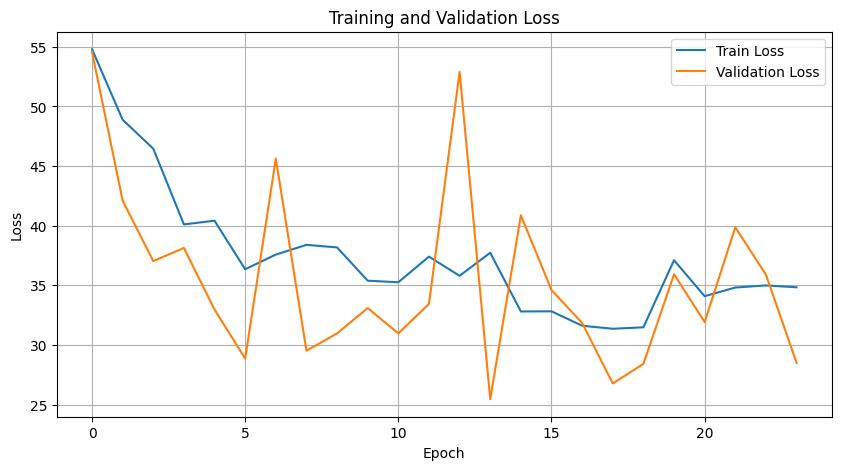

Training Accuracy: 83.2717
Training Precision Scores: [17.8        99.10519952]
Training Recall Scores: [82.79069767 83.29268293]
Training F1 Scores: [29.30041152 90.51352844]

Validation Accuracy: 83.5670
Validation Precision Scores: [16.63286004 99.46987952]
Validation Recall Scores: [88.17204301 83.39393939]
Validation F1 Scores: [27.98634812 90.72527473]

Threshold: 0.5
Validation Accuracy: 83.5670
Validation Precision Scores: [16.63286004 99.46987952]
Validation Recall Scores: [88.17204301 83.39393939]
Validation F1 Scores: [27.98634812 90.72527473]


Threshold: 0.6
Validation Accuracy: 88.3178
Validation Precision Scores: [21.32963989 99.27503398]
Validation Recall Scores: [82.79569892 88.52525253]
Validation F1 Scores: [33.92070485 93.59248185]


Threshold: 0.7
Validation Accuracy: 92.1340
Validation Precision Scores: [26.80851064 98.71410201]
Validation Recall Scores: [67.74193548 93.05050505]
Validation F1 Scores: [38.41463415 95.79866889]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 49.9153, Val Loss: 64.4564
Epoch 10/50, Train Loss: 48.0615, Val Loss: 56.3368
Epoch 15/50, Train Loss: 65.9540, Val Loss: 54.8457
Early stopping triggered after 16 epochs because no improvements over 10 subsequent epochs!
Epoch 16/50, Train Loss: 51.4240, Val Loss: 61.7117
The function took 39.62 seconds to execute.


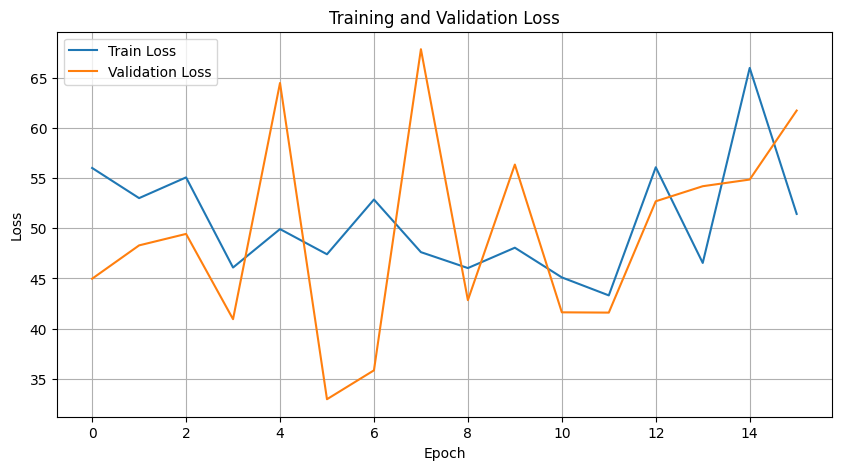

Training Accuracy: 83.9435
Training Precision Scores: [16.30735213 98.40444392]
Training Recall Scores: [68.60465116 84.61382114]
Training F1 Scores: [26.35104958 90.98956341]

Validation Accuracy: 82.5156
Validation Precision Scores: [14.54183267 99.03194579]
Validation Recall Scores: [78.49462366 82.66666667]
Validation F1 Scores: [24.53781513 90.11231006]

Threshold: 0.5
Validation Accuracy: 82.5156
Validation Precision Scores: [14.54183267 99.03194579]
Validation Recall Scores: [78.49462366 82.66666667]
Validation F1 Scores: [24.53781513 90.11231006]


Threshold: 0.6
Validation Accuracy: 91.6277
Validation Precision Scores: [24.3697479  98.49785408]
Validation Recall Scores: [62.3655914  92.72727273]
Validation F1 Scores: [35.04531722 95.52549428]


Threshold: 0.7
Validation Accuracy: 94.5872
Validation Precision Scores: [31.4516129  97.79050736]
Validation Recall Scores: [41.93548387 96.56565657]
Validation F1 Scores: [35.94470046 97.1742224 ]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 62.7902, Val Loss: 69.1210
Epoch 10/50, Train Loss: 103.4131, Val Loss: 75.1006
Epoch 15/50, Train Loss: 44.4062, Val Loss: 45.0601
Early stopping triggered after 16 epochs because no improvements over 10 subsequent epochs!
Epoch 16/50, Train Loss: 47.5345, Val Loss: 41.9938
The function took 45.24 seconds to execute.


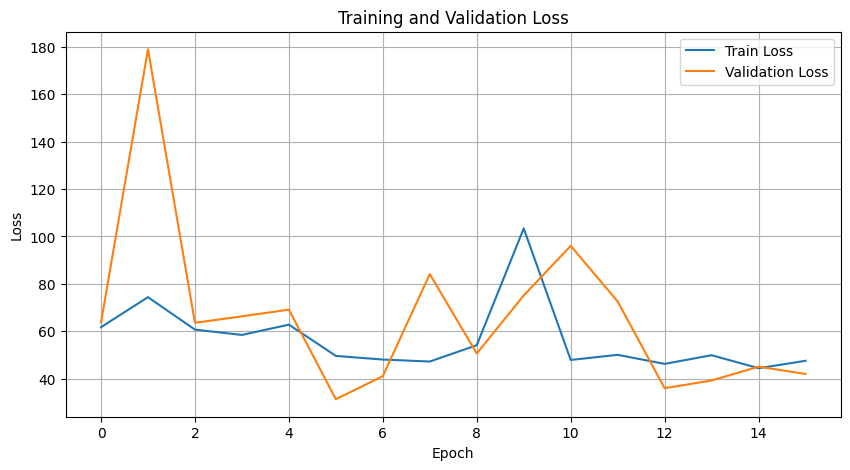

Training Accuracy: 83.4372
Training Precision Scores: [17.15762274 98.82423515]
Training Recall Scores: [77.20930233 83.70934959]
Training F1 Scores: [28.07610994 90.64099037]

Validation Accuracy: 83.7617
Validation Precision Scores: [16.39004149 99.32885906]
Validation Recall Scores: [84.94623656 83.71717172]
Validation F1 Scores: [27.47826087 90.85726814]

Threshold: 0.5
Validation Accuracy: 83.7617
Validation Precision Scores: [16.39004149 99.32885906]
Validation Recall Scores: [84.94623656 83.71717172]
Validation F1 Scores: [27.47826087 90.85726814]


Threshold: 0.6
Validation Accuracy: 88.7850
Validation Precision Scores: [20.18348624 98.79518072]
Validation Recall Scores: [70.96774194 89.45454545]
Validation F1 Scores: [31.42857143 93.89312977]


Threshold: 0.7
Validation Accuracy: 91.3941
Validation Precision Scores: [23.55371901 98.45227859]
Validation Recall Scores: [61.29032258 92.52525253]
Validation F1 Scores: [34.02985075 95.39679233]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 63.4676, Val Loss: 34.8579
Epoch 10/50, Train Loss: 46.2697, Val Loss: 40.7314
Epoch 15/50, Train Loss: 61.5719, Val Loss: 43.2691
Epoch 20/50, Train Loss: 54.5525, Val Loss: 56.6257
Early stopping triggered after 24 epochs because no improvements over 10 subsequent epochs!
Epoch 24/50, Train Loss: 45.1673, Val Loss: 37.7554
The function took 74.77 seconds to execute.


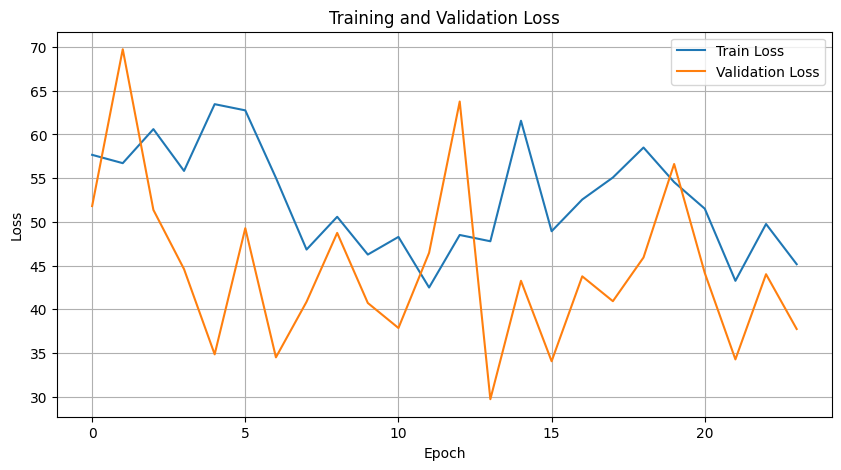

Training Accuracy: 89.1431
Training Precision Scores: [22.70916335 98.39156961]
Training Recall Scores: [66.27906977 90.14227642]
Training F1 Scores: [33.82789318 94.08644922]

Validation Accuracy: 89.7975
Validation Precision Scores: [20.55749129 98.50942569]
Validation Recall Scores: [63.44086022 90.78787879]
Validation F1 Scores: [31.05263158 94.49116905]

Threshold: 0.5
Validation Accuracy: 89.7975
Validation Precision Scores: [20.55749129 98.50942569]
Validation Recall Scores: [63.44086022 90.78787879]
Validation F1 Scores: [31.05263158 94.49116905]


Threshold: 0.6
Validation Accuracy: 92.4455
Validation Precision Scores: [26.06635071 98.38778108]
Validation Recall Scores: [59.13978495 93.6969697 ]
Validation F1 Scores: [36.18421053 95.98509934]


Threshold: 0.7
Validation Accuracy: 94.3925
Validation Precision Scores: [31.91489362 98.02224969]
Validation Recall Scores: [48.38709677 96.12121212]
Validation F1 Scores: [38.46153846 97.0624235 ]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 60.3527, Val Loss: 49.3524
Epoch 10/50, Train Loss: 52.6831, Val Loss: 61.1173
Epoch 15/50, Train Loss: 56.0051, Val Loss: 38.3192
Epoch 20/50, Train Loss: 101.9491, Val Loss: 53.2053
Early stopping triggered after 25 epochs because no improvements over 10 subsequent epochs!
Epoch 25/50, Train Loss: 49.5788, Val Loss: 47.0921
The function took 92.87 seconds to execute.


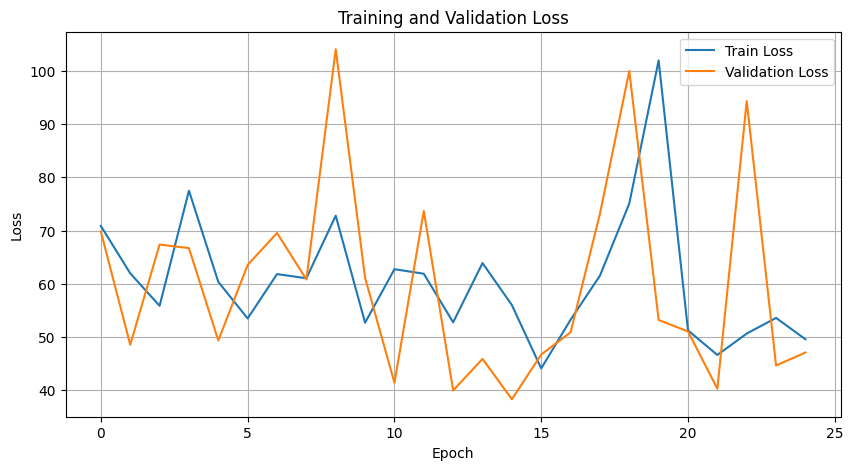

Training Accuracy: 78.5394
Training Precision Scores: [13.40759076 98.66173847]
Training Recall Scores: [75.58139535 78.66869919]
Training F1 Scores: [22.77505256 87.53816578]

Validation Accuracy: 77.6090
Validation Precision Scores: [10.87662338 98.66803279]
Validation Recall Scores: [72.04301075 77.81818182]
Validation F1 Scores: [18.89985896 87.01152022]

Threshold: 0.5
Validation Accuracy: 77.6090
Validation Precision Scores: [10.87662338 98.66803279]
Validation Recall Scores: [72.04301075 77.81818182]
Validation F1 Scores: [18.89985896 87.01152022]


Threshold: 0.6
Validation Accuracy: 84.8131
Validation Precision Scores: [13.15136476 98.15242494]
Validation Recall Scores: [56.98924731 85.85858586]
Validation F1 Scores: [21.37096774 91.59482759]


Threshold: 0.7
Validation Accuracy: 90.4595
Validation Precision Scores: [16.95652174 97.69033362]
Validation Recall Scores: [41.93548387 92.28282828]
Validation F1 Scores: [24.14860681 94.90961978]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 33.7671, Val Loss: 33.8390
Epoch 10/50, Train Loss: 29.6380, Val Loss: 28.0906
Epoch 15/50, Train Loss: 27.4501, Val Loss: 27.4199
Epoch 20/50, Train Loss: 26.7367, Val Loss: 32.8043
Early stopping triggered after 24 epochs because no improvements over 10 subsequent epochs!
Epoch 24/50, Train Loss: 25.1395, Val Loss: 30.5434
The function took 43.50 seconds to execute.


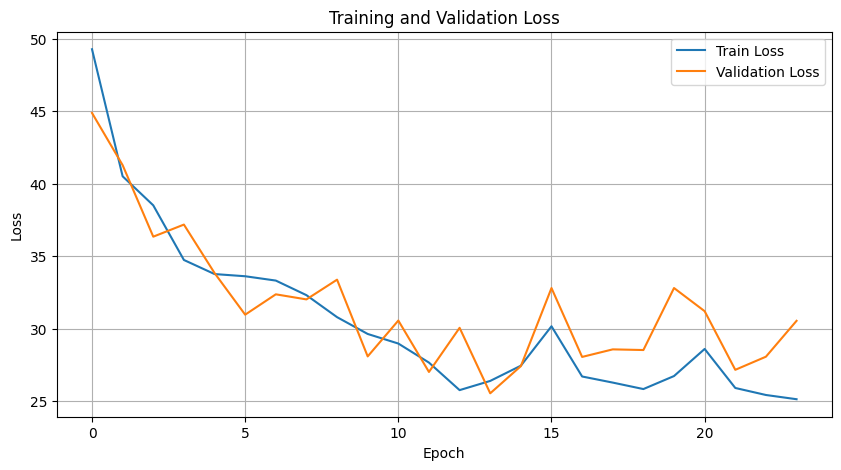

Training Accuracy: 84.5083
Training Precision Scores: [19.87545407 99.43665348]
Training Recall Scores: [89.06976744 84.30894309]
Training F1 Scores: [32.49893933 91.25006875]

Validation Accuracy: 84.3458
Validation Precision Scores: [17.74530271 99.61704165]
Validation Recall Scores: [91.39784946 84.08080808]
Validation F1 Scores: [29.72027972 91.1919369 ]

Threshold: 0.5
Validation Accuracy: 84.3458
Validation Precision Scores: [17.74530271 99.61704165]
Validation Recall Scores: [91.39784946 84.08080808]
Validation F1 Scores: [29.72027972 91.1919369 ]


Threshold: 0.6
Validation Accuracy: 89.2913
Validation Precision Scores: [23.39181287 99.41599281]
Validation Recall Scores: [86.02150538 89.41414141]
Validation F1 Scores: [36.7816092  94.15018081]


Threshold: 0.7
Validation Accuracy: 93.3801
Validation Precision Scores: [32.88888889 99.18907384]
Validation Recall Scores: [79.56989247 93.8989899 ]
Validation F1 Scores: [46.5408805  96.47156496]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 34.8468, Val Loss: 33.7676
Epoch 10/50, Train Loss: 32.1142, Val Loss: 28.4629
Epoch 15/50, Train Loss: 30.3931, Val Loss: 32.0379
Epoch 20/50, Train Loss: 25.5999, Val Loss: 23.4243
Epoch 25/50, Train Loss: 25.0089, Val Loss: 26.0679
Early stopping triggered after 30 epochs because no improvements over 10 subsequent epochs!
Epoch 30/50, Train Loss: 27.9731, Val Loss: 37.8336
The function took 56.55 seconds to execute.


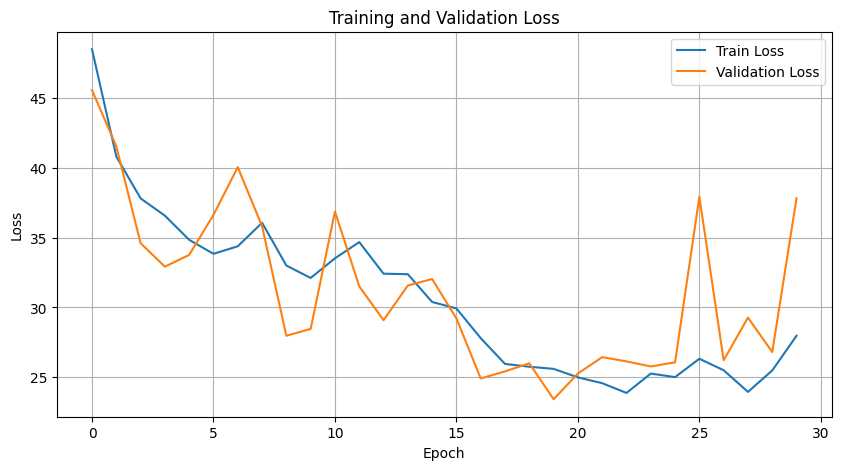

Training Accuracy: 87.4294
Training Precision Scores: [23.24425109 99.35342339]
Training Recall Scores: [86.97674419 87.44918699]
Training F1 Scores: [36.68464934 93.02199881]

Validation Accuracy: 87.9673
Validation Precision Scores: [21.57894737 99.49725777]
Validation Recall Scores: [88.17204301 87.95959596]
Validation F1 Scores: [34.67230444 93.37336479]

Threshold: 0.5
Validation Accuracy: 87.9673
Validation Precision Scores: [21.57894737 99.49725777]
Validation Recall Scores: [88.17204301 87.95959596]
Validation F1 Scores: [34.67230444 93.37336479]


Threshold: 0.6
Validation Accuracy: 91.0826
Validation Precision Scores: [26.55172414 99.2976295 ]
Validation Recall Scores: [82.79569892 91.39393939]
Validation F1 Scores: [40.20887728 95.18199032]


Threshold: 0.7
Validation Accuracy: 93.2243
Validation Precision Scores: [32.46753247 99.22978177]
Validation Recall Scores: [80.64516129 93.6969697 ]
Validation F1 Scores: [46.2962963 96.3840399]


Threshold: 0.8
Validation Accuracy: 9

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 39.8849, Val Loss: 39.8646
Epoch 10/50, Train Loss: 35.5747, Val Loss: 37.6756
Epoch 15/50, Train Loss: 30.7568, Val Loss: 29.1598
Epoch 20/50, Train Loss: 31.6825, Val Loss: 28.2356
Early stopping triggered after 24 epochs because no improvements over 10 subsequent epochs!
Epoch 24/50, Train Loss: 30.2242, Val Loss: 28.3046
The function took 49.87 seconds to execute.


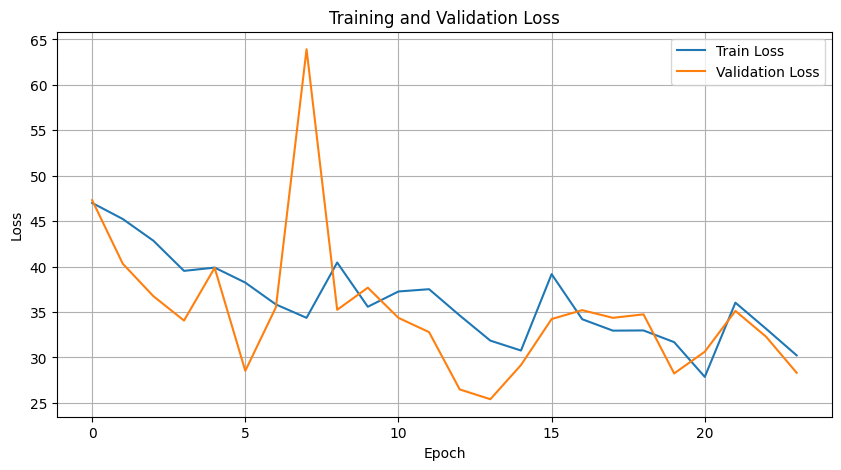

Training Accuracy: 82.9990
Training Precision Scores: [17.80821918 99.19766594]
Training Recall Scores: [84.65116279 82.92682927]
Training F1 Scores: [29.42603072 90.33543673]

Validation Accuracy: 82.9439
Validation Precision Scores: [15.70576541 99.3220339 ]
Validation Recall Scores: [84.94623656 82.86868687]
Validation F1 Scores: [26.51006711 90.35242291]

Threshold: 0.5
Validation Accuracy: 82.9439
Validation Precision Scores: [15.70576541 99.3220339 ]
Validation Recall Scores: [84.94623656 82.86868687]
Validation F1 Scores: [26.51006711 90.35242291]


Threshold: 0.6
Validation Accuracy: 87.2274
Validation Precision Scores: [18.99736148 99.04065783]
Validation Recall Scores: [77.41935484 87.5959596 ]
Validation F1 Scores: [30.50847458 92.96740995]


Threshold: 0.7
Validation Accuracy: 92.2118
Validation Precision Scores: [27.80082988 98.88268156]
Validation Recall Scores: [72.04301075 92.96969697]
Validation F1 Scores: [40.11976048 95.83506872]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 50.4116, Val Loss: 39.0281
Epoch 10/50, Train Loss: 42.8541, Val Loss: 38.5277
Epoch 15/50, Train Loss: 41.0493, Val Loss: 44.8510
Epoch 20/50, Train Loss: 52.8881, Val Loss: 44.6988
Early stopping triggered after 21 epochs because no improvements over 10 subsequent epochs!
Epoch 21/50, Train Loss: 39.7932, Val Loss: 34.5731
The function took 53.61 seconds to execute.


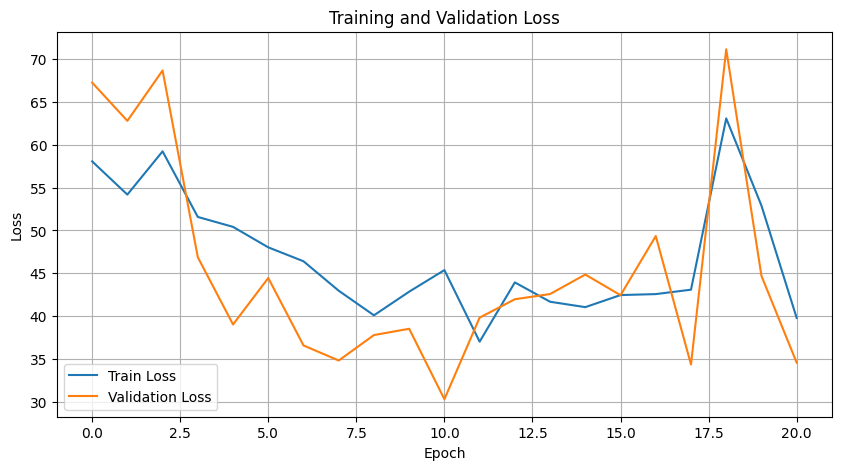

Training Accuracy: 86.8160
Training Precision Scores: [20.90680101 98.87122783]
Training Recall Scores: [77.20930233 87.23577236]
Training F1 Scores: [32.90386521 92.68977432]

Validation Accuracy: 87.0717
Validation Precision Scores: [19.43734015 99.21910887]
Validation Recall Scores: [81.72043011 87.27272727]
Validation F1 Scores: [31.40495868 92.86328461]

Threshold: 0.5
Validation Accuracy: 87.0717
Validation Precision Scores: [19.43734015 99.21910887]
Validation Recall Scores: [81.72043011 87.27272727]
Validation F1 Scores: [31.40495868 92.86328461]


Threshold: 0.6
Validation Accuracy: 90.6931
Validation Precision Scores: [23.35766423 98.73583261]
Validation Recall Scores: [68.8172043  91.51515152]
Validation F1 Scores: [34.8773842  94.98846718]


Threshold: 0.7
Validation Accuracy: 92.8349
Validation Precision Scores: [24.58100559 97.94893261]
Validation Recall Scores: [47.31182796 94.54545455]
Validation F1 Scores: [32.35294118 96.21710526]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 57.1849, Val Loss: 45.5530
Epoch 10/50, Train Loss: 44.0882, Val Loss: 29.7315
Epoch 15/50, Train Loss: 45.4767, Val Loss: 34.4734
Early stopping triggered after 20 epochs because no improvements over 10 subsequent epochs!
Epoch 20/50, Train Loss: 51.8350, Val Loss: 42.3385
The function took 57.40 seconds to execute.


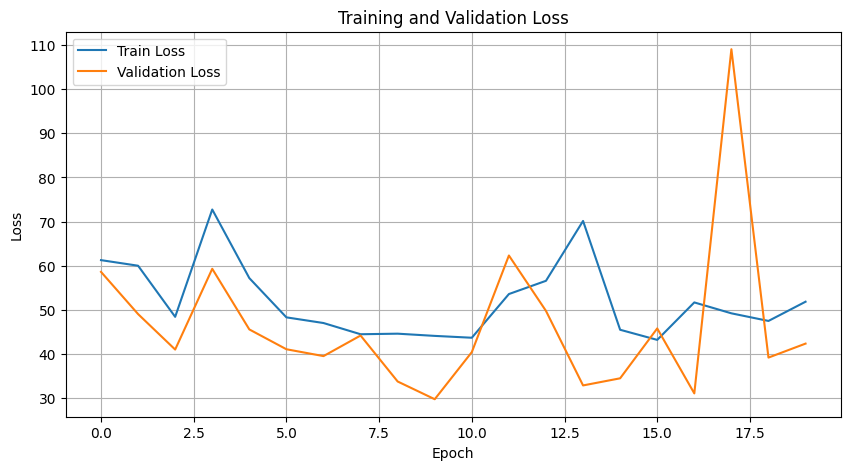

Training Accuracy: 89.7371
Training Precision Scores: [23.64864865 98.34910852]
Training Recall Scores: [65.11627907 90.81300813]
Training F1 Scores: [34.69640644 94.43094156]

Validation Accuracy: 90.3037
Validation Precision Scores: [23.82550336 99.030837  ]
Validation Recall Scores: [76.34408602 90.82828283]
Validation F1 Scores: [36.31713555 94.75237092]

Threshold: 0.5
Validation Accuracy: 90.3037
Validation Precision Scores: [23.82550336 99.030837  ]
Validation Recall Scores: [76.34408602 90.82828283]
Validation F1 Scores: [36.31713555 94.75237092]


Threshold: 0.6
Validation Accuracy: 92.3287
Validation Precision Scores: [26.78571429 98.59215017]
Validation Recall Scores: [64.51612903 93.37373737]
Validation F1 Scores: [37.85488959 95.91201494]


Threshold: 0.7
Validation Accuracy: 94.1589
Validation Precision Scores: [32.51533742 98.33679834]
Validation Recall Scores: [56.98924731 95.55555556]
Validation F1 Scores: [41.40625    96.92622951]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 55.7635, Val Loss: 44.7936
Epoch 10/50, Train Loss: 40.8467, Val Loss: 38.7768
Epoch 15/50, Train Loss: 44.5060, Val Loss: 52.2695
Epoch 20/50, Train Loss: 77.0556, Val Loss: 35.7570
Epoch 25/50, Train Loss: 52.6911, Val Loss: 38.1255
Epoch 30/50, Train Loss: 49.3987, Val Loss: 37.6152
Early stopping triggered after 33 epochs because no improvements over 10 subsequent epochs!
Epoch 33/50, Train Loss: 46.4249, Val Loss: 49.6761
The function took 104.80 seconds to execute.


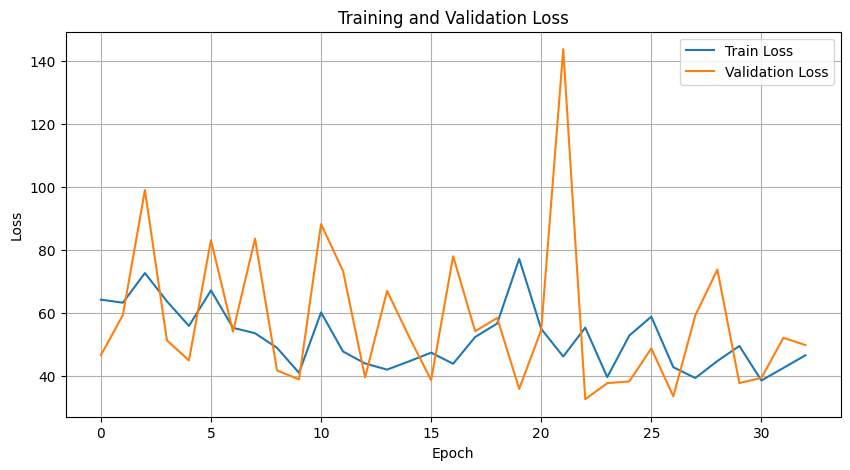

Training Accuracy: 81.4606
Training Precision Scores: [16.37773723 99.12106957]
Training Recall Scores: [83.48837209 81.37195122]
Training F1 Scores: [27.38367658 89.37381404]

Validation Accuracy: 80.1012
Validation Precision Scores: [13.96551724 99.39637827]
Validation Recall Scores: [87.09677419 79.83838384]
Validation F1 Scores: [24.07132244 88.55030249]

Threshold: 0.5
Validation Accuracy: 80.1012
Validation Precision Scores: [13.96551724 99.39637827]
Validation Recall Scores: [87.09677419 79.83838384]
Validation F1 Scores: [24.07132244 88.55030249]


Threshold: 0.6
Validation Accuracy: 85.9034
Validation Precision Scores: [17.27493917 98.9800649 ]
Validation Recall Scores: [76.34408602 86.26262626]
Validation F1 Scores: [28.17460317 92.18480138]


Threshold: 0.7
Validation Accuracy: 90.2648
Validation Precision Scores: [20.81784387 98.39060461]
Validation Recall Scores: [60.21505376 91.39393939]
Validation F1 Scores: [30.93922652 94.76330121]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 55.8639, Val Loss: 49.1705
Epoch 10/50, Train Loss: 48.8122, Val Loss: 117.4936
Epoch 15/50, Train Loss: 58.5856, Val Loss: 37.8413
Epoch 20/50, Train Loss: 47.2577, Val Loss: 33.6201
Epoch 25/50, Train Loss: 62.4749, Val Loss: 47.0653
Early stopping triggered after 30 epochs because no improvements over 10 subsequent epochs!
Epoch 30/50, Train Loss: 56.4464, Val Loss: 80.3027
The function took 112.90 seconds to execute.


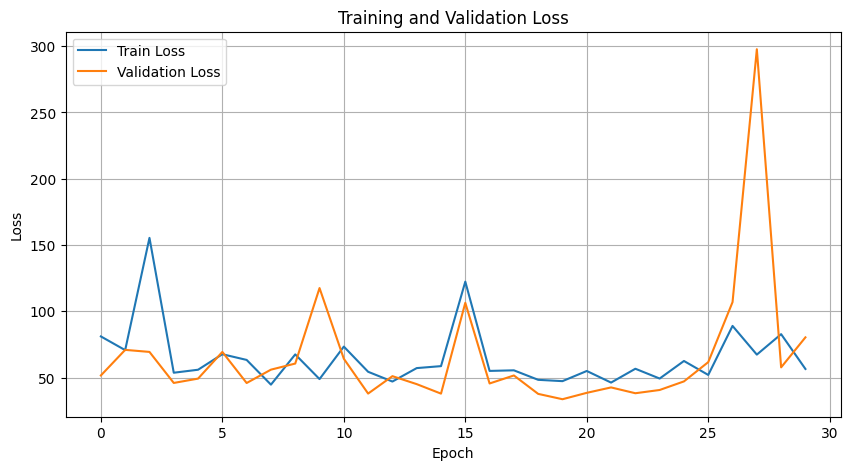

Training Accuracy: 89.4937
Training Precision Scores: [22.61603376 98.21684095]
Training Recall Scores: [62.3255814  90.68089431]
Training F1 Scores: [33.18885449 94.2985469 ]

Validation Accuracy: 88.2788
Validation Precision Scores: [17.29559748 98.31111111]
Validation Recall Scores: [59.13978495 89.37373737]
Validation F1 Scores: [26.76399027 93.62962963]

Threshold: 0.5
Validation Accuracy: 88.2788
Validation Precision Scores: [17.29559748 98.31111111]
Validation Recall Scores: [59.13978495 89.37373737]
Validation F1 Scores: [26.76399027 93.62962963]


Threshold: 0.6
Validation Accuracy: 91.0047
Validation Precision Scores: [20.51282051 98.07197943]
Validation Recall Scores: [51.61290323 92.48484848]
Validation F1 Scores: [29.35779817 95.19650655]


Threshold: 0.7
Validation Accuracy: 92.6791
Validation Precision Scores: [24.04371585 97.94549266]
Validation Recall Scores: [47.31182796 94.38383838]
Validation F1 Scores: [31.88405797 96.13168724]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 35.2130, Val Loss: 44.7467
Epoch 10/50, Train Loss: 29.0355, Val Loss: 29.7030
Epoch 15/50, Train Loss: 29.2398, Val Loss: 40.4835
Early stopping triggered after 19 epochs because no improvements over 10 subsequent epochs!
Epoch 19/50, Train Loss: 27.9417, Val Loss: 37.7175
The function took 37.93 seconds to execute.


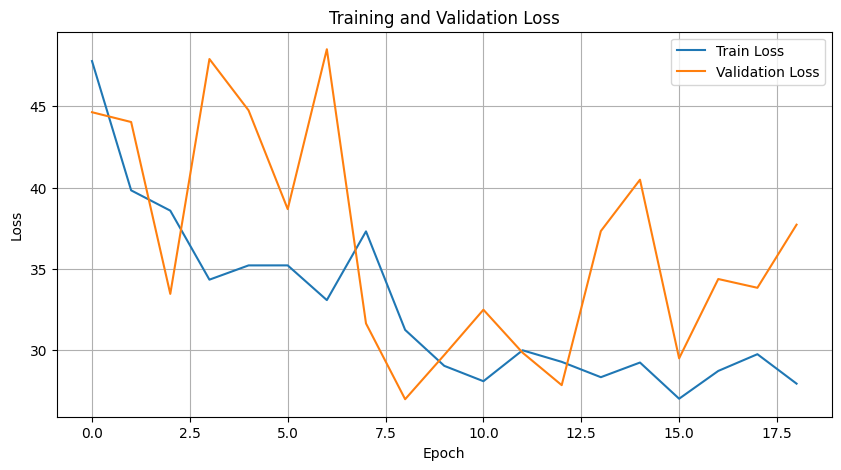

Training Accuracy: 88.7926
Training Precision Scores: [24.45074415 99.04052376]
Training Recall Scores: [80.23255814 89.16666667]
Training F1 Scores: [37.47963064 93.84459062]

Validation Accuracy: 88.2399
Validation Precision Scores: [20.22792023 99.00766802]
Validation Recall Scores: [76.34408602 88.68686869]
Validation F1 Scores: [31.98198198 93.56351236]

Threshold: 0.5
Validation Accuracy: 88.2399
Validation Precision Scores: [20.22792023 99.00766802]
Validation Recall Scores: [76.34408602 88.68686869]
Validation F1 Scores: [31.98198198 93.56351236]


Threshold: 0.6
Validation Accuracy: 91.6667
Validation Precision Scores: [26.08695652 98.8336933 ]
Validation Recall Scores: [70.96774194 92.44444444]
Validation F1 Scores: [38.15028902 95.53235908]


Threshold: 0.7
Validation Accuracy: 94.3146
Validation Precision Scores: [34.50292398 98.58156028]
Validation Recall Scores: [63.44086022 95.47474747]
Validation F1 Scores: [44.6969697  97.00328407]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 37.4374, Val Loss: 42.2310
Epoch 10/50, Train Loss: 34.8094, Val Loss: 39.3751
Epoch 15/50, Train Loss: 35.0429, Val Loss: 31.7742
Epoch 20/50, Train Loss: 33.0401, Val Loss: 34.9874
Epoch 25/50, Train Loss: 33.2939, Val Loss: 36.5560
Early stopping triggered after 26 epochs because no improvements over 10 subsequent epochs!
Epoch 26/50, Train Loss: 32.1226, Val Loss: 54.0640
The function took 57.62 seconds to execute.


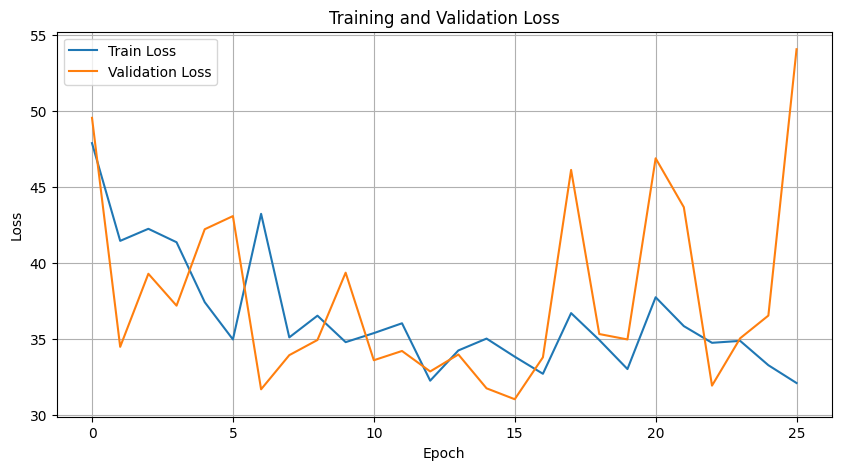

Training Accuracy: 78.4615
Training Precision Scores: [15.35769829 99.54533645]
Training Recall Scores: [91.86046512 77.87601626]
Training F1 Scores: [26.31578947 87.38738739]

Validation Accuracy: 77.6480
Validation Precision Scores: [12.94298921 99.53100573]
Validation Recall Scores: [90.32258065 77.17171717]
Validation F1 Scores: [22.64150943 86.93673191]

Threshold: 0.5
Validation Accuracy: 77.6480
Validation Precision Scores: [12.94298921 99.53100573]
Validation Recall Scores: [90.32258065 77.17171717]
Validation F1 Scores: [22.64150943 86.93673191]


Threshold: 0.6
Validation Accuracy: 83.4502
Validation Precision Scores: [16.2601626  99.37379576]
Validation Recall Scores: [86.02150538 83.35353535]
Validation F1 Scores: [27.35042735 90.6613931 ]


Threshold: 0.7
Validation Accuracy: 88.5903
Validation Precision Scores: [21.75141243 99.27732611]
Validation Recall Scores: [82.79569892 88.80808081]
Validation F1 Scores: [34.45190157 93.75133291]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 48.7994, Val Loss: 53.0937
Epoch 10/50, Train Loss: 44.3505, Val Loss: 55.3668
Early stopping triggered after 12 epochs because no improvements over 10 subsequent epochs!
Epoch 12/50, Train Loss: 44.6267, Val Loss: 542.6777
The function took 32.30 seconds to execute.


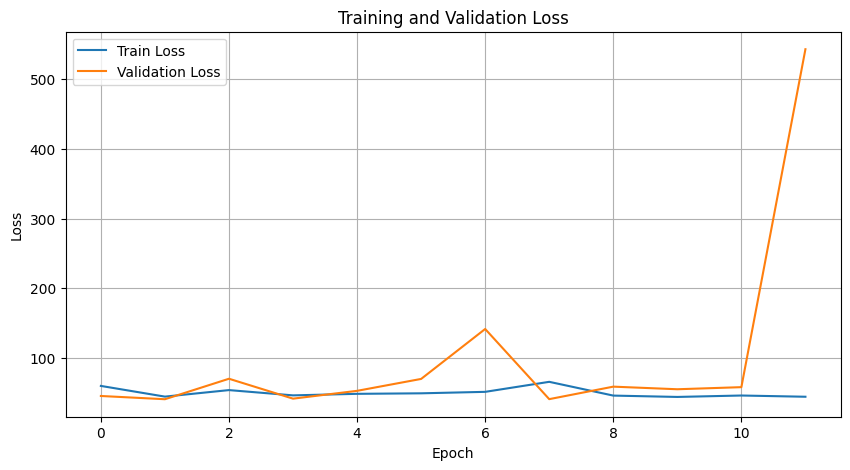

Training Accuracy: 75.8617
Training Precision Scores: [12.29297019 98.72898186]
Training Recall Scores: [77.6744186  75.78252033]
Training F1 Scores: [21.22656498 85.74713965]

Validation Accuracy: 73.7539
Validation Precision Scores: [ 9.70873786 98.75473741]
Validation Recall Scores: [75.2688172 73.6969697]
Validation F1 Scores: [17.1990172  84.40536789]

Threshold: 0.5
Validation Accuracy: 73.7539
Validation Precision Scores: [ 9.70873786 98.75473741]
Validation Recall Scores: [75.2688172 73.6969697]
Validation F1 Scores: [17.1990172  84.40536789]


Threshold: 0.6
Validation Accuracy: 81.1916
Validation Precision Scores: [11.76470588 98.39650146]
Validation Recall Scores: [64.51612903 81.81818182]
Validation F1 Scores: [19.90049751 89.34480477]


Threshold: 0.7
Validation Accuracy: 87.5000
Validation Precision Scores: [15.24390244 98.08035714]
Validation Recall Scores: [53.76344086 88.76767677]
Validation F1 Scores: [23.75296912 93.19194062]


Threshold: 0.8
Validation Accuracy: 91.

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 65.8963, Val Loss: 45.0337
Epoch 10/50, Train Loss: 45.3449, Val Loss: 113.9213
Epoch 15/50, Train Loss: 40.8135, Val Loss: 68.8911
Epoch 20/50, Train Loss: 40.7620, Val Loss: 42.8764
Epoch 25/50, Train Loss: 49.0298, Val Loss: 47.2294
Early stopping triggered after 27 epochs because no improvements over 10 subsequent epochs!
Epoch 27/50, Train Loss: 40.5243, Val Loss: 43.1132
The function took 80.86 seconds to execute.


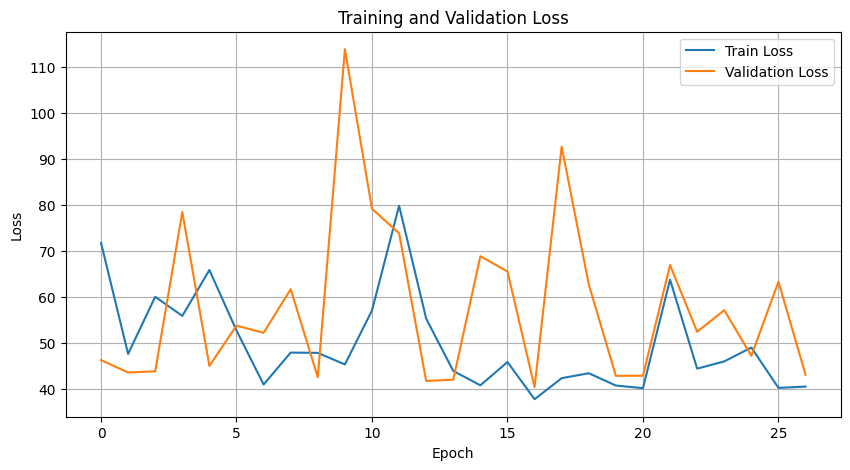

Training Accuracy: 76.7965
Training Precision Scores: [13.84672344 99.26014004]
Training Recall Scores: [86.97674419 76.35162602]
Training F1 Scores: [23.89013095 86.31167787]

Validation Accuracy: 76.1682
Validation Precision Scores: [11.44130758 99.15567282]
Validation Recall Scores: [82.79569892 75.91919192]
Validation F1 Scores: [20.10443864 85.99542334]

Threshold: 0.5
Validation Accuracy: 76.1682
Validation Precision Scores: [11.44130758 99.15567282]
Validation Recall Scores: [82.79569892 75.91919192]
Validation F1 Scores: [20.10443864 85.99542334]


Threshold: 0.6
Validation Accuracy: 83.9564
Validation Precision Scores: [15.09846827 98.86309806]
Validation Recall Scores: [74.19354839 84.32323232]
Validation F1 Scores: [25.09090909 91.01613607]


Threshold: 0.7
Validation Accuracy: 90.4984
Validation Precision Scores: [19.18367347 98.01980198]
Validation Recall Scores: [50.53763441 92.        ]
Validation F1 Scores: [27.81065089 94.91454773]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 45.9954, Val Loss: 61.7473
Epoch 10/50, Train Loss: 62.1685, Val Loss: 46.9586
Early stopping triggered after 11 epochs because no improvements over 10 subsequent epochs!
Epoch 11/50, Train Loss: 53.7007, Val Loss: 100.3963
The function took 36.98 seconds to execute.


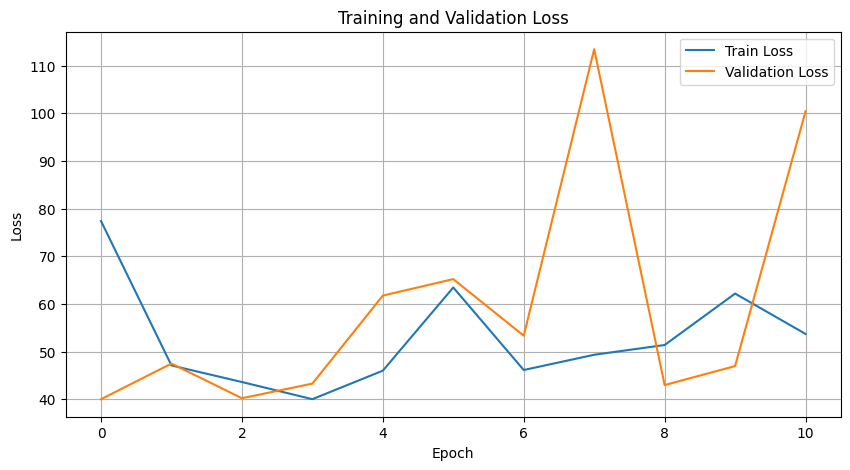

Training Accuracy: 62.5998
Training Precision Scores: [ 9.30565497 99.34199704]
Training Recall Scores: [90.69767442 61.37195122]
Training F1 Scores: [16.87946332 75.87159997]

Validation Accuracy: 62.1106
Validation Precision Scores: [ 8.33333333 99.66931217]
Validation Recall Scores: [94.62365591 60.88888889]
Validation F1 Scores: [15.31766754 75.59568598]

Threshold: 0.5
Validation Accuracy: 62.1106
Validation Precision Scores: [ 8.33333333 99.66931217]
Validation Recall Scores: [94.62365591 60.88888889]
Validation F1 Scores: [15.31766754 75.59568598]


Threshold: 0.6
Validation Accuracy: 71.0280
Validation Precision Scores: [ 9.86436498 99.26010245]
Validation Recall Scores: [86.02150538 70.46464646]
Validation F1 Scores: [17.69911504 82.41965974]


Threshold: 0.7
Validation Accuracy: 82.5935
Validation Precision Scores: [13.87755102 98.79692012]
Validation Recall Scores: [73.11827957 82.94949495]
Validation F1 Scores: [23.32761578 90.18229739]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 53.5404, Val Loss: 42.1515
Epoch 10/50, Train Loss: 57.1636, Val Loss: 56.8081
Early stopping triggered after 15 epochs because no improvements over 10 subsequent epochs!
Epoch 15/50, Train Loss: 53.8153, Val Loss: 48.0214
The function took 58.94 seconds to execute.


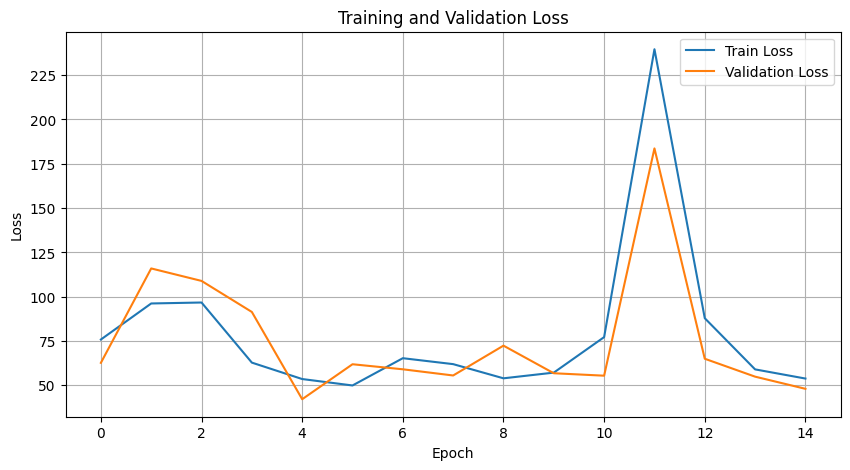

Training Accuracy: 79.2308
Training Precision Scores: [13.28158689 98.46560181]
Training Recall Scores: [71.62790698 79.56300813]
Training F1 Scores: [22.40814842 88.01079197]

Validation Accuracy: 79.1277
Validation Precision Scores: [11.6117851  98.69412356]
Validation Recall Scores: [72.04301075 79.39393939]
Validation F1 Scores: [20.         87.99820869]

Threshold: 0.5
Validation Accuracy: 79.1277
Validation Precision Scores: [11.6117851  98.69412356]
Validation Recall Scores: [72.04301075 79.39393939]
Validation F1 Scores: [20.         87.99820869]


Threshold: 0.6
Validation Accuracy: 83.2555
Validation Precision Scores: [12.96703297 98.39091339]
Validation Recall Scores: [63.44086022 84.        ]
Validation F1 Scores: [21.53284672 90.6277245 ]


Threshold: 0.7
Validation Accuracy: 91.6667
Validation Precision Scores: [18.97435897 97.64011799]
Validation Recall Scores: [39.78494624 93.61616162]
Validation F1 Scores: [25.69444444 95.58580858]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 35.4427, Val Loss: 39.1711
Epoch 10/50, Train Loss: 30.2086, Val Loss: 36.6473
Epoch 15/50, Train Loss: 30.8356, Val Loss: 42.9238
Epoch 20/50, Train Loss: 41.7856, Val Loss: 52.1033
Early stopping triggered after 21 epochs because no improvements over 10 subsequent epochs!
Epoch 21/50, Train Loss: 32.0611, Val Loss: 46.7448
The function took 52.01 seconds to execute.


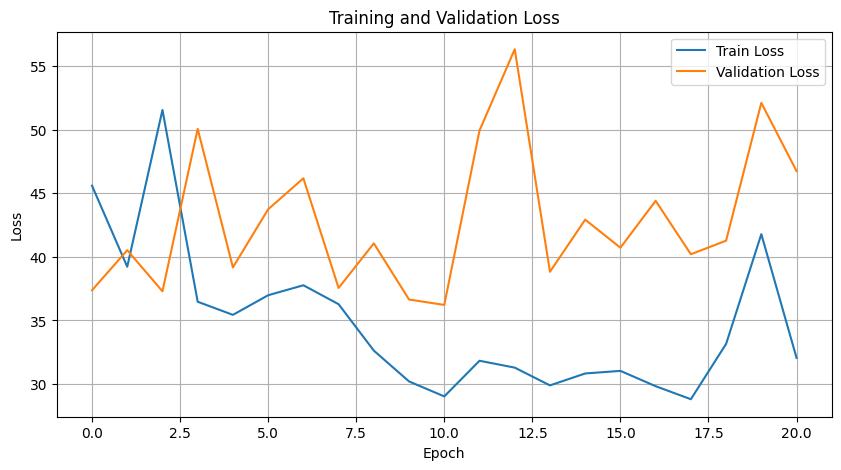

Training Accuracy: 85.7644
Training Precision Scores: [19.61130742 98.86840877]
Training Recall Scores: [77.44186047 86.12804878]
Training F1 Scores: [31.29699248 92.0595264 ]

Validation Accuracy: 84.3069
Validation Precision Scores: [15.55555556 98.91406988]
Validation Recall Scores: [75.2688172  84.64646465]
Validation F1 Scores: [25.78268877 91.22577836]

Threshold: 0.5
Validation Accuracy: 84.3069
Validation Precision Scores: [15.55555556 98.91406988]
Validation Recall Scores: [75.2688172  84.64646465]
Validation F1 Scores: [25.78268877 91.22577836]


Threshold: 0.6
Validation Accuracy: 86.9548
Validation Precision Scores: [16.57458564 98.50407978]
Validation Recall Scores: [64.51612903 87.7979798 ]
Validation F1 Scores: [26.37362637 92.84340953]


Threshold: 0.7
Validation Accuracy: 89.4081
Validation Precision Scores: [18.14946619 98.16353301]
Validation Recall Scores: [54.83870968 90.70707071]
Validation F1 Scores: [27.27272727 94.28811424]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 44.7740, Val Loss: 48.9682
Epoch 10/50, Train Loss: 41.2241, Val Loss: 41.0986
Epoch 15/50, Train Loss: 41.6777, Val Loss: 38.3102
Early stopping triggered after 19 epochs because no improvements over 10 subsequent epochs!
Epoch 19/50, Train Loss: 42.4159, Val Loss: 42.3838
The function took 55.69 seconds to execute.


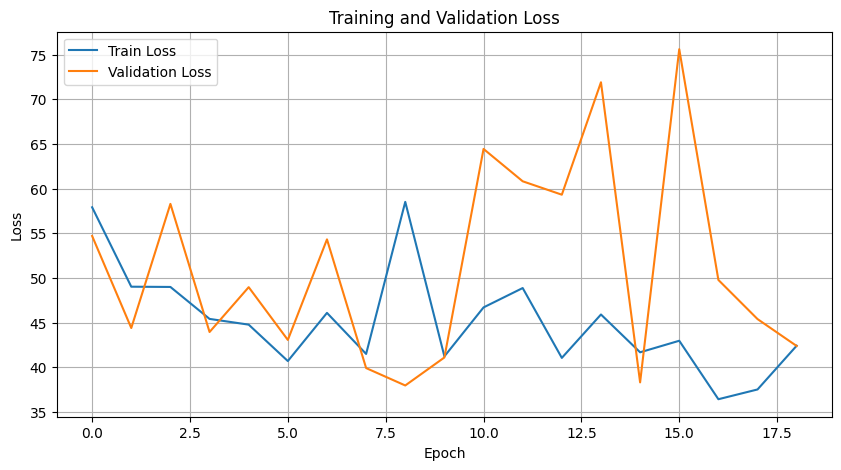

Training Accuracy: 77.1081
Training Precision Scores: [13.57603337 99.05672737]
Training Recall Scores: [83.25581395 76.83943089]
Training F1 Scores: [23.34528856 86.54495507]

Validation Accuracy: 75.8178
Validation Precision Scores: [11.62790698 99.30851064]
Validation Recall Scores: [86.02150538 75.43434343]
Validation F1 Scores: [20.4865557  85.74052813]

Threshold: 0.5
Validation Accuracy: 75.8178
Validation Precision Scores: [11.62790698 99.30851064]
Validation Recall Scores: [86.02150538 75.43434343]
Validation F1 Scores: [20.4865557  85.74052813]


Threshold: 0.6
Validation Accuracy: 80.7243
Validation Precision Scores: [13.32116788 99.00990099]
Validation Recall Scores: [78.49462366 80.80808081]
Validation F1 Scores: [22.77691108 88.98776418]


Threshold: 0.7
Validation Accuracy: 87.0717
Validation Precision Scores: [17.4386921  98.68241708]
Validation Recall Scores: [68.8172043  87.75757576]
Validation F1 Scores: [27.82608696 92.89991446]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 42.8486, Val Loss: 57.9186
Epoch 10/50, Train Loss: 47.2935, Val Loss: 47.7640
Epoch 15/50, Train Loss: 48.6684, Val Loss: 45.6595
Early stopping triggered after 19 epochs because no improvements over 10 subsequent epochs!
Epoch 19/50, Train Loss: 85.9424, Val Loss: 76.7440
The function took 62.29 seconds to execute.


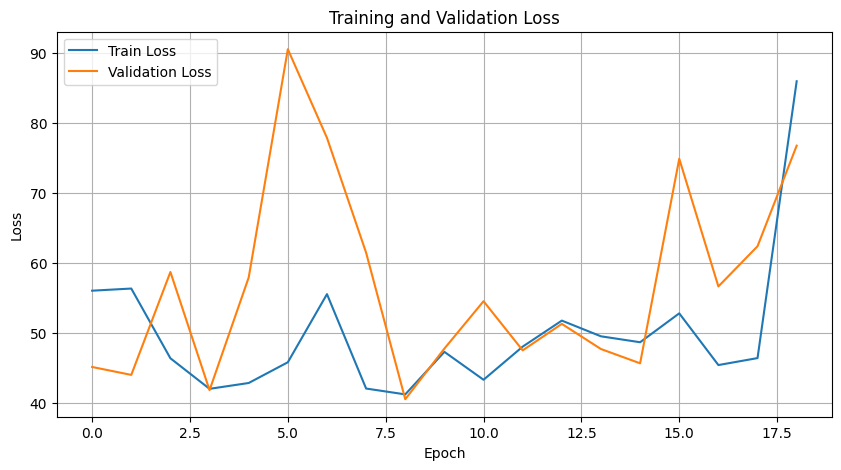

Training Accuracy: 83.3204
Training Precision Scores: [17.35368957 98.92835641]
Training Recall Scores: [79.30232558 83.49593496]
Training F1 Scores: [28.47599165 90.55938275]

Validation Accuracy: 83.0607
Validation Precision Scores: [14.81481481 98.99135447]
Validation Recall Scores: [77.41935484 83.27272727]
Validation F1 Scores: [24.87046632 90.45424621]

Threshold: 0.5
Validation Accuracy: 83.0607
Validation Precision Scores: [14.81481481 98.99135447]
Validation Recall Scores: [77.41935484 83.27272727]
Validation F1 Scores: [24.87046632 90.45424621]


Threshold: 0.6
Validation Accuracy: 87.5389
Validation Precision Scores: [17.10144928 98.47053531]
Validation Recall Scores: [63.44086022 88.44444444]
Validation F1 Scores: [26.94063927 93.18859089]


Threshold: 0.7
Validation Accuracy: 90.3816
Validation Precision Scores: [18.69918699 97.97588286]
Validation Recall Scores: [49.46236559 91.91919192]
Validation F1 Scores: [27.13864307 94.85094851]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 62.2723, Val Loss: 46.9413
Epoch 10/50, Train Loss: 44.6124, Val Loss: 38.9098
Epoch 15/50, Train Loss: 51.3315, Val Loss: 51.0891
Early stopping triggered after 16 epochs because no improvements over 10 subsequent epochs!
Epoch 16/50, Train Loss: 52.7822, Val Loss: 40.0075
The function took 57.67 seconds to execute.


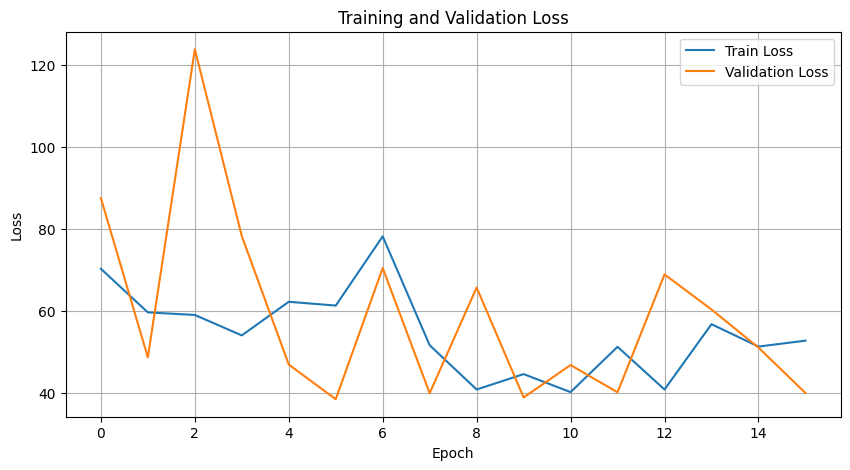

Training Accuracy: 72.5219
Training Precision Scores: [11.91082803 99.21458626]
Training Recall Scores: [86.97674419 71.8902439 ]
Training F1 Scores: [20.95238095 83.3706541 ]

Validation Accuracy: 71.7679
Validation Precision Scores: [ 9.89847716 99.15730337]
Validation Recall Scores: [83.87096774 71.31313131]
Validation F1 Scores: [17.70715096 82.96122209]

Threshold: 0.5
Validation Accuracy: 71.7679
Validation Precision Scores: [ 9.89847716 99.15730337]
Validation Recall Scores: [83.87096774 71.31313131]
Validation F1 Scores: [17.70715096 82.96122209]


Threshold: 0.6
Validation Accuracy: 82.1262
Validation Precision Scores: [12.65306122 98.50818094]
Validation Recall Scores: [66.66666667 82.70707071]
Validation F1 Scores: [21.26929674 89.9187349 ]


Threshold: 0.7
Validation Accuracy: 87.8505
Validation Precision Scores: [16.09907121 98.17371938]
Validation Recall Scores: [55.91397849 89.05050505]
Validation F1 Scores: [25.         93.38983051]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 59.6383, Val Loss: 141.1408
Epoch 10/50, Train Loss: 67.5209, Val Loss: 148.3487
Early stopping triggered after 11 epochs because no improvements over 10 subsequent epochs!
Epoch 11/50, Train Loss: 112.2532, Val Loss: 67.8539
The function took 46.21 seconds to execute.


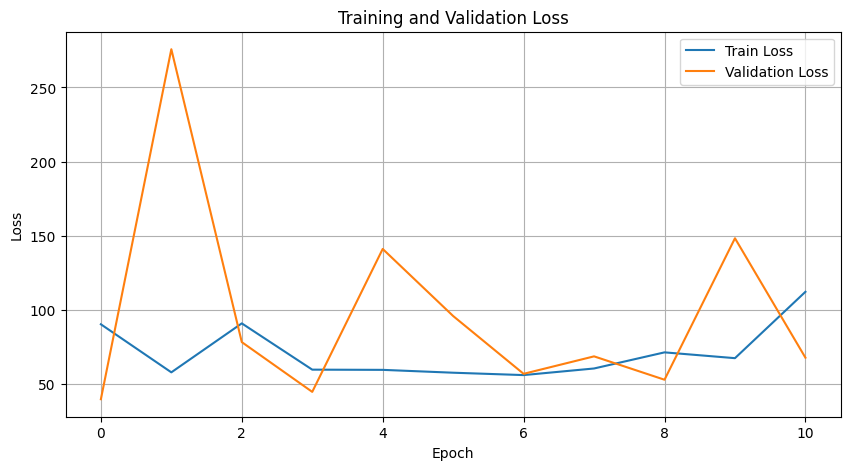

Training Accuracy: 81.9474
Training Precision Scores: [13.67346939 98.05054152]
Training Recall Scores: [62.3255814  82.80487805]
Training F1 Scores: [22.42677824 89.78512397]

Validation Accuracy: 82.5156
Validation Precision Scores: [12.60504202 98.42256214]
Validation Recall Scores: [64.51612903 83.19191919]
Validation F1 Scores: [21.08963093 90.16860083]

Threshold: 0.5
Validation Accuracy: 82.5156
Validation Precision Scores: [12.60504202 98.42256214]
Validation Recall Scores: [64.51612903 83.19191919]
Validation F1 Scores: [21.08963093 90.16860083]


Threshold: 0.6
Validation Accuracy: 89.6028
Validation Precision Scores: [17.29323308 97.95829713]
Validation Recall Scores: [49.46236559 91.11111111]
Validation F1 Scores: [25.62674095 94.41071802]


Threshold: 0.7
Validation Accuracy: 93.0296
Validation Precision Scores: [19.71830986 97.3206925 ]
Validation Recall Scores: [30.10752688 95.39393939]
Validation F1 Scores: [23.82978723 96.34768415]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 45.7443, Val Loss: 37.2501
Epoch 10/50, Train Loss: 49.9239, Val Loss: 47.0525
Early stopping triggered after 14 epochs because no improvements over 10 subsequent epochs!
Epoch 14/50, Train Loss: 64.8983, Val Loss: 44.1815
The function took 49.37 seconds to execute.


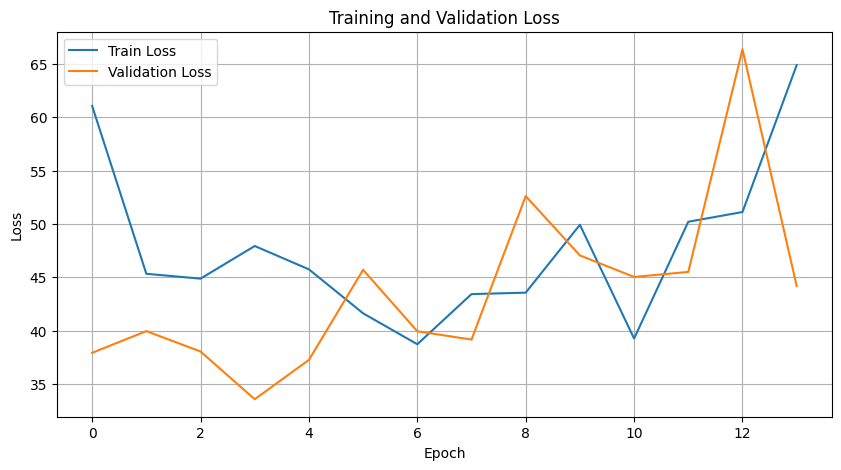

Training Accuracy: 75.1412
Training Precision Scores: [13.25718242 99.36322991]
Training Recall Scores: [89.06976744 74.53252033]
Training F1 Scores: [23.07924074 85.17507694]

Validation Accuracy: 74.5717
Validation Precision Scores: [11.74863388 99.61873638]
Validation Recall Scores: [92.47311828 73.8989899 ]
Validation F1 Scores: [20.84848485 84.85270239]

Threshold: 0.5
Validation Accuracy: 74.5717
Validation Precision Scores: [11.74863388 99.61873638]
Validation Recall Scores: [92.47311828 73.8989899 ]
Validation F1 Scores: [20.84848485 84.85270239]


Threshold: 0.6
Validation Accuracy: 82.4766
Validation Precision Scores: [15.33980583 99.31807112]
Validation Recall Scores: [84.94623656 82.38383838]
Validation F1 Scores: [25.98684211 90.06183746]


Threshold: 0.7
Validation Accuracy: 89.5249
Validation Precision Scores: [21.05263158 98.71908127]
Validation Recall Scores: [68.8172043 90.3030303]
Validation F1 Scores: [32.2418136  94.32369698]


Threshold: 0.8
Validation Accuracy: 9

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 45.8144, Val Loss: 147.2531
Epoch 10/50, Train Loss: 58.0587, Val Loss: 57.4010
Early stopping triggered after 11 epochs because no improvements over 10 subsequent epochs!
Epoch 11/50, Train Loss: 128.1200, Val Loss: 153.7509
The function took 42.92 seconds to execute.


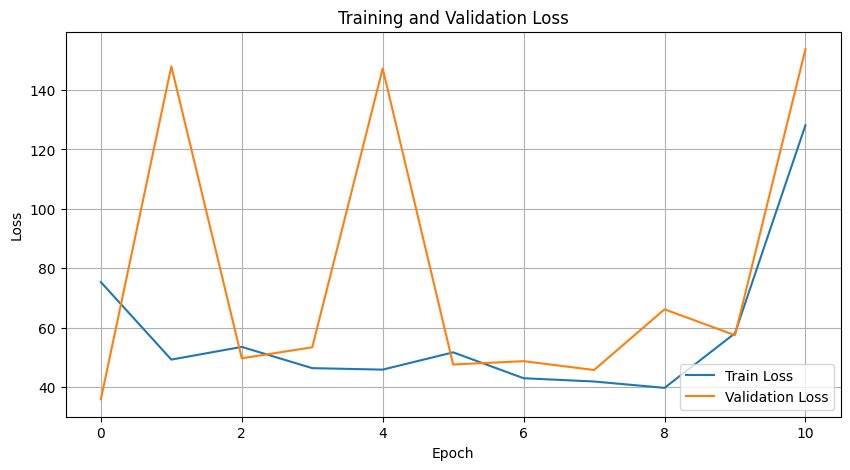

Training Accuracy: 76.2999
Training Precision Scores: [12.9985229  98.96852684]
Training Recall Scores: [81.86046512 76.05691057]
Training F1 Scores: [22.43467177 86.01310194]

Validation Accuracy: 74.6495
Validation Precision Scores: [10.92436975 99.19093851]
Validation Recall Scores: [83.87096774 74.3030303 ]
Validation F1 Scores: [19.33085502 84.96188496]

Threshold: 0.5
Validation Accuracy: 74.6495
Validation Precision Scores: [10.92436975 99.19093851]
Validation Recall Scores: [83.87096774 74.3030303 ]
Validation F1 Scores: [19.33085502 84.96188496]


Threshold: 0.6
Validation Accuracy: 81.7368
Validation Precision Scores: [12.8458498  98.64209505]
Validation Recall Scores: [69.89247312 82.18181818]
Validation F1 Scores: [21.70283806 89.66277276]


Threshold: 0.7
Validation Accuracy: 87.8505
Validation Precision Scores: [13.62126246 97.70621967]
Validation Recall Scores: [44.08602151 89.49494949]
Validation F1 Scores: [20.81218274 93.42049768]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 50.6457, Val Loss: 54.0096
Epoch 10/50, Train Loss: 57.9158, Val Loss: 63.1784
Early stopping triggered after 11 epochs because no improvements over 10 subsequent epochs!
Epoch 11/50, Train Loss: 55.0177, Val Loss: 81.5015
The function took 46.51 seconds to execute.


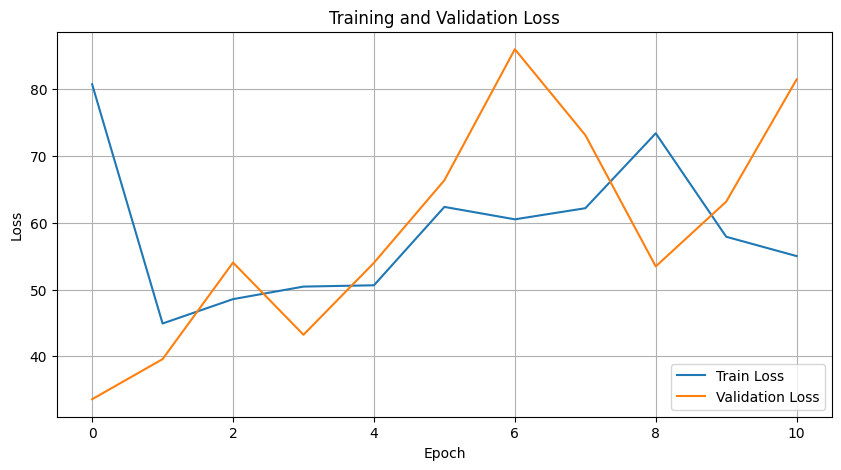

Training Accuracy: 78.2181
Training Precision Scores: [13.67108967 98.84363356]
Training Recall Scores: [79.06976744 78.18089431]
Training F1 Scores: [23.31162153 87.30636101]

Validation Accuracy: 76.3629
Validation Precision Scores: [11.29518072 99.05462185]
Validation Recall Scores: [80.64516129 76.2020202 ]
Validation F1 Scores: [19.81505945 86.13838776]

Threshold: 0.5
Validation Accuracy: 76.3629
Validation Precision Scores: [11.29518072 99.05462185]
Validation Recall Scores: [80.64516129 76.2020202 ]
Validation F1 Scores: [19.81505945 86.13838776]


Threshold: 0.6
Validation Accuracy: 86.9548
Validation Precision Scores: [16.01123596 98.37251356]
Validation Recall Scores: [61.29032258 87.91919192]
Validation F1 Scores: [25.38975501 92.85257094]


Threshold: 0.7
Validation Accuracy: 92.4844
Validation Precision Scores: [24.22680412 98.06234204]
Validation Recall Scores: [50.53763441 94.06060606]
Validation F1 Scores: [32.75261324 96.0197979 ]


Threshold: 0.8
Validation Accuracy:

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 88.0098, Val Loss: 67.3749
Epoch 10/50, Train Loss: 44.6553, Val Loss: 51.4087
Epoch 15/50, Train Loss: 60.4612, Val Loss: 82.3411
Epoch 20/50, Train Loss: 54.3925, Val Loss: 223.0944
Early stopping triggered after 23 epochs because no improvements over 10 subsequent epochs!
Epoch 23/50, Train Loss: 72.2414, Val Loss: 53.0238
The function took 113.05 seconds to execute.


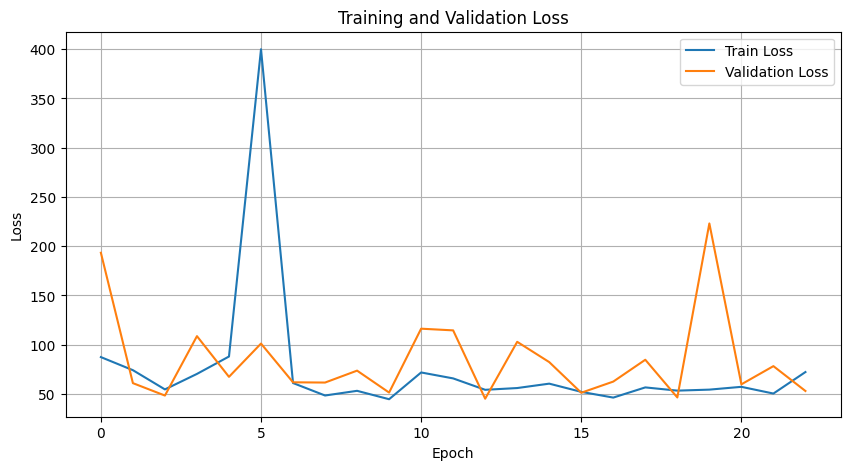

Training Accuracy: 92.5998
Training Precision Scores: [27.7027027  97.63903463]
Training Recall Scores: [47.6744186  94.56300813]
Training F1 Scores: [35.04273504 96.07640681]

Validation Accuracy: 93.0296
Validation Precision Scores: [23.7804878  97.75374376]
Validation Recall Scores: [41.93548387 94.94949495]
Validation F1 Scores: [30.35019455 96.33121541]

Threshold: 0.5
Validation Accuracy: 93.0296
Validation Precision Scores: [23.7804878  97.75374376]
Validation Recall Scores: [41.93548387 94.94949495]
Validation F1 Scores: [30.35019455 96.33121541]


Threshold: 0.6
Validation Accuracy: 94.2368
Validation Precision Scores: [28.34645669 97.66489144]
Validation Recall Scores: [38.70967742 96.32323232]
Validation F1 Scores: [32.72727273 96.98942229]


Threshold: 0.7
Validation Accuracy: 95.1713
Validation Precision Scores: [32.96703297 97.45660073]
Validation Recall Scores: [32.25806452 97.53535354]
Validation F1 Scores: [32.60869565 97.49596123]


Threshold: 0.8
Validation Accuracy:

In [17]:
embedding_sizes = [8,16,32,64,128,256]
hidden_dims = [8,16,32,64,128,256,320, 384, 512]

for i in range(len(embedding_sizes)):
    for j in range(i,len(hidden_dims)):
        embedding_size=embedding_sizes[i]
        hidden_dim=hidden_dims[j]
        print("-------------------------------------------------------------------------")
        print("-------------------------------------------------------------------------")
        print("-------------------------------------------------------------------------")
        print(f"Trying with embedding size {embedding_size} and hidden dim {hidden_dim}")

        # Create embedding layer with the given vocabulary size and embedding size
        vocabulary_size = len(vectorizer.vocabulary_) + 1  # Add 1 for out-of-vocabulary
        embeddings = nn.Embedding(vocabulary_size, embedding_size)
        X_train_graph = GraphDataset(X_train, y_train, embeddings)
        X_val_graph = GraphDataset(X_val, y_val, embeddings)
        X_test_graph = GraphDataset(X_test, y_test, embeddings)
        
        # Create DataLoader for batching
        # NOTICE: This data loader is from torch_geometric.loader!! It is not from torch.utils.data
        batch_size = 64
        train_loader = torch_geometric.loader.DataLoader(X_train_graph, batch_size=batch_size, shuffle=True)
        val_loader = torch_geometric.loader.DataLoader(X_val_graph, batch_size=batch_size, shuffle=False)
        test_loader = torch_geometric.loader.DataLoader(X_test_graph, batch_size=batch_size, shuffle=False)
        
        class_weight = compute_class_weight(class_weight='balanced', classes=np.unique(y_train_original), y=y_train_original)  # Computing class weights
        class_weight_tensor = torch.tensor(class_weight, dtype=torch.float32).to(device)  # Converting to PyTorch tensor
        criterion = nn.CrossEntropyLoss(weight=class_weight_tensor)
        num_epochs = 50
        model = GAT(input_dim=embedding_size, hidden_dim=hidden_dim, output_dim=2).to(device)
        optimizer = optim.AdamW(model.parameters(), lr=0.01, weight_decay=0.01)
        training_loop(model, train_loader, val_loader, X_train_graph, X_val_graph, device, optimizer, num_epochs, criterion)
        
        train_accuracy, train_precisionscores, train_recallscores, train_f1scores, _, _ = testing_model(model,train_loader,device)
        val_accuracy, val_precisionscores, val_recallscores, val_f1scores, _, _ = testing_model(model,val_loader,device)
        #test_accuracy, test_precisionscores, test_recallscores, test_f1scores, all_labels_test, all_predictions_test = testing_model(model,test_loader,device)
        
        stats(train_accuracy, train_precisionscores, train_recallscores, train_f1scores, 'Training')
        stats(val_accuracy, val_precisionscores, val_recallscores, val_f1scores, 'Validation')
        #stats(test_accuracy, test_precisionscores, test_recallscores, test_f1scores, 'Test')
        #ConfusionMatrixDisplay.from_predictions(all_labels_test, all_predictions_test, cmap='Blues')
        #ConfusionMatrixDisplay.from_predictions(all_labels_test, all_predictions_test, normalize='true', cmap='Blues')
        
        # Test with different thresholds
        for threshold in [0.5, 0.6, 0.7, 0.8, 0.9]:
            print(f"Threshold: {threshold}")
            val_accuracy, val_precisionscores, val_recallscores, val_f1scores, _, _ = testing_model_with_threshold(model,val_loader,device,threshold=threshold)
            stats(val_accuracy, val_precisionscores, val_recallscores, val_f1scores, 'Validation')
            print()

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 34.6077, Val Loss: 33.0638
Epoch 10/50, Train Loss: 29.7320, Val Loss: 27.8456
Epoch 15/50, Train Loss: 26.9065, Val Loss: 25.7897
Epoch 20/50, Train Loss: 23.3077, Val Loss: 26.8553
Epoch 25/50, Train Loss: 24.6751, Val Loss: 27.1542
Epoch 30/50, Train Loss: 21.1759, Val Loss: 26.9506
Early stopping triggered after 32 epochs because no improvements over 10 subsequent epochs!
Epoch 32/50, Train Loss: 20.9676, Val Loss: 27.2604
The function took 50.99 seconds to execute.


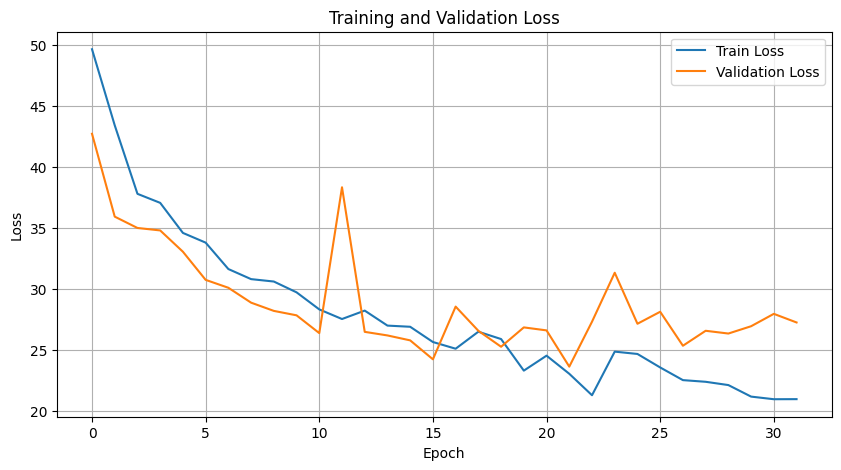

Test Accuracy: 94.4315
Test Precision Scores: [35.63218391 98.70509607]
Test Recall Scores: [66.66666667 95.47474747]
Test F1 Scores: [46.44194757 97.06305196]



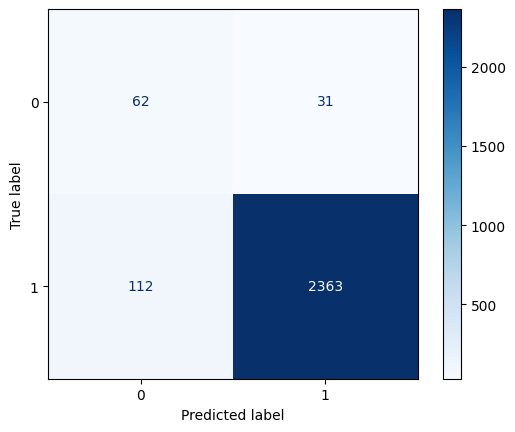

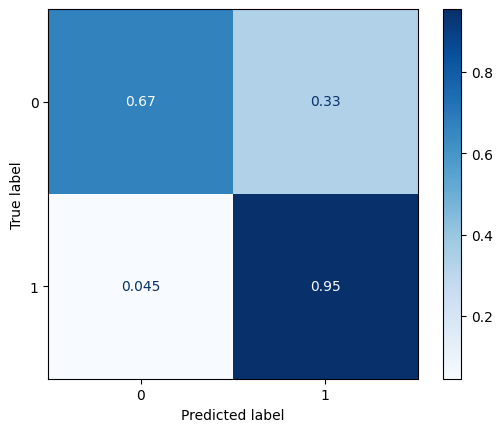

In [11]:
#16 and hidden dim 16  threhsol 0.8

embedding_size=16
hidden_dim=16
threshold = 0.8

# Create embedding layer with the given vocabulary size and embedding size
vocabulary_size = len(vectorizer.vocabulary_) + 1  # Add 1 for out-of-vocabulary
embeddings = nn.Embedding(vocabulary_size, embedding_size)
X_train_graph = GraphDataset(X_train, y_train, embeddings)
X_val_graph = GraphDataset(X_val, y_val, embeddings)
X_test_graph = GraphDataset(X_test, y_test, embeddings)

# Create DataLoader for batching
# NOTICE: This data loader is from torch_geometric.loader!! It is not from torch.utils.data
batch_size = 64
train_loader = torch_geometric.loader.DataLoader(X_train_graph, batch_size=batch_size, shuffle=True)
val_loader = torch_geometric.loader.DataLoader(X_val_graph, batch_size=batch_size, shuffle=False)
test_loader = torch_geometric.loader.DataLoader(X_test_graph, batch_size=batch_size, shuffle=False)

class_weight = compute_class_weight(class_weight='balanced', classes=np.unique(y_train_original), y=y_train_original)  # Computing class weights
class_weight_tensor = torch.tensor(class_weight, dtype=torch.float32).to(device)  # Converting to PyTorch tensor
criterion = nn.CrossEntropyLoss(weight=class_weight_tensor)
num_epochs = 50
model = GAT(input_dim=embedding_size, hidden_dim=hidden_dim, output_dim=2).to(device)
optimizer = optim.AdamW(model.parameters(), lr=0.01, weight_decay=0.01)
training_loop(model, train_loader, val_loader, X_train_graph, X_val_graph, device, optimizer, num_epochs, criterion)

test_accuracy, test_precisionscores, test_recallscores, test_f1scores, all_labels_test, all_predictions_test = testing_model_with_threshold(model,val_loader,device,threshold=threshold)

stats(test_accuracy, test_precisionscores, test_recallscores, test_f1scores, 'Test')
ConfusionMatrixDisplay.from_predictions(all_labels_test, all_predictions_test, cmap='Blues')
ConfusionMatrixDisplay.from_predictions(all_labels_test, all_predictions_test, normalize='true', cmap='Blues')

## Simple GCN on CPU

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 5/50, Train Loss: 36.8246, Val Loss: 35.8298
Epoch 10/50, Train Loss: 33.8961, Val Loss: 32.5482
Epoch 15/50, Train Loss: 31.0544, Val Loss: 34.1158
Epoch 20/50, Train Loss: 29.4902, Val Loss: 29.2766
Epoch 25/50, Train Loss: 27.9879, Val Loss: 30.2824
Epoch 30/50, Train Loss: 27.1075, Val Loss: 26.0054
Epoch 35/50, Train Loss: 26.2199, Val Loss: 27.2533
Epoch 40/50, Train Loss: 25.4207, Val Loss: 25.0337
Epoch 45/50, Train Loss: 25.4130, Val Loss: 26.8479
Early stopping triggered after 50 epochs because no improvements over 10 subsequent epochs!
Epoch 50/50, Train Loss: 24.1975, Val Loss: 28.1010
The function took 204.92 seconds to execute.


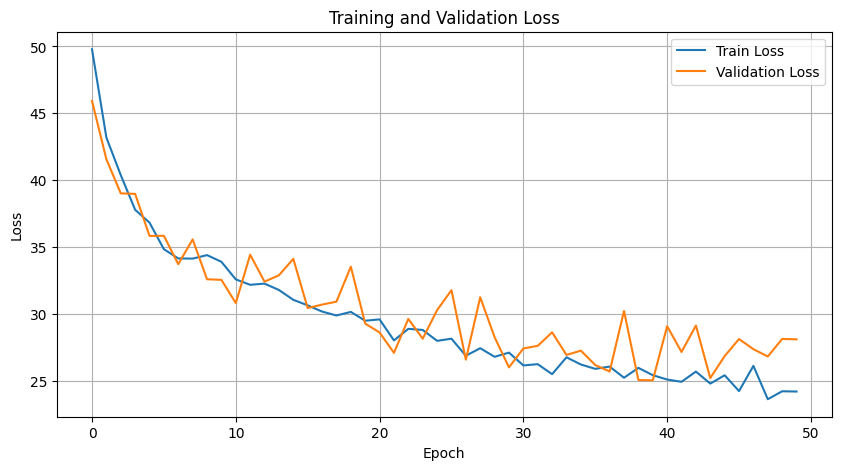

Training Accuracy: 87.8968
Training Precision Scores: [24.41787288 99.51618477]
Training Recall Scores: [90.23255814 87.79471545]
Training F1 Scores: [38.43486875 93.28869931]

Validation Accuracy: 87.1106
Validation Precision Scores: [20.10050251 99.40092166]
Validation Recall Scores: [86.02150538 87.15151515]
Validation F1 Scores: [32.58655804 92.87405813]

Test Accuracy: 87.7398
Test Precision Scores: [19.14691943 99.23736892]
Test Recall Scores: [80.8        87.98422313]
Test F1 Scores: [30.95785441 93.27260509]

Threshold: 0.9
Test 0.9 Accuracy: 97.1425
Test 0.9 Precision Scores: [64.49275362 97.76729996]
Test 0.9 Recall Scores: [35.6        99.30976194]
Test 0.9 F1 Scores: [45.87628866 98.53249476]




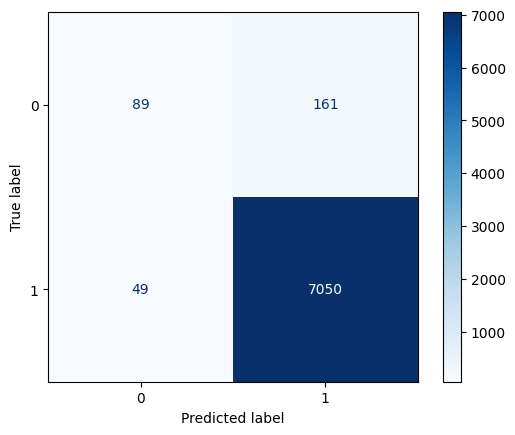

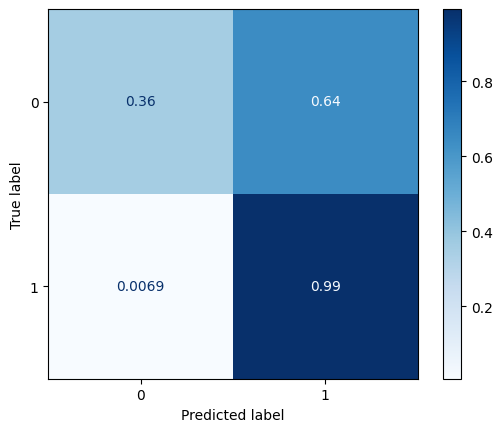

In [14]:
# 16 and hidden dim 128 threshold 0.9

device = 'cpu'
embedding_size=16
hidden_dim=128
threshold = 0.9 

# Create embedding layer with the given vocabulary size and embedding size
vocabulary_size = len(vectorizer.vocabulary_) + 1  # Add 1 for out-of-vocabulary
embeddings = nn.Embedding(vocabulary_size, embedding_size)
X_train_graph = GraphDataset(X_train, y_train, embeddings)
X_val_graph = GraphDataset(X_val, y_val, embeddings)
X_test_graph = GraphDataset(X_test, y_test, embeddings)

# Create DataLoader for batching
# NOTICE: This data loader is from torch_geometric.loader!! It is not from torch.utils.data
batch_size = 64
train_loader = torch_geometric.loader.DataLoader(X_train_graph, batch_size=batch_size, shuffle=True)
val_loader = torch_geometric.loader.DataLoader(X_val_graph, batch_size=batch_size, shuffle=False)
test_loader = torch_geometric.loader.DataLoader(X_test_graph, batch_size=batch_size, shuffle=False)

class_weight = compute_class_weight(class_weight='balanced', classes=np.unique(y_train_original), y=y_train_original)  # Computing class weights
class_weight_tensor = torch.tensor(class_weight, dtype=torch.float32).to(device)  # Converting to PyTorch tensor
criterion = nn.CrossEntropyLoss(weight=class_weight_tensor)
num_epochs = 50
model = GCN(input_dim=embedding_size, hidden_dim=hidden_dim, output_dim=2).to(device)
optimizer = optim.AdamW(model.parameters(), lr=0.01, weight_decay=0.01)
training_loop(model, train_loader, val_loader, X_train_graph, X_val_graph, device, optimizer, num_epochs, criterion)

train_accuracy, train_precisionscores, train_recallscores, train_f1scores, _, _ = testing_model(model,train_loader,device)
val_accuracy, val_precisionscores, val_recallscores, val_f1scores, _, _ = testing_model(model,val_loader,device)
test_accuracy, test_precisionscores, test_recallscores, test_f1scores, all_labels_test, all_predictions_test = testing_model(model,test_loader,device)

stats(train_accuracy, train_precisionscores, train_recallscores, train_f1scores, 'Training')
stats(val_accuracy, val_precisionscores, val_recallscores, val_f1scores, 'Validation')
stats(test_accuracy, test_precisionscores, test_recallscores, test_f1scores, 'Test')

# Test with threshold
print(f"Threshold: {threshold}")
test_accuracy, test_precisionscores, test_recallscores, test_f1scores, all_labels_test, all_predictions_test = testing_model_with_threshold(model, test_loader, device, threshold=threshold)
stats(test_accuracy, test_precisionscores, test_recallscores, test_f1scores, f'Test {threshold}')
ConfusionMatrixDisplay.from_predictions(all_labels_test, all_predictions_test, cmap='Blues')
ConfusionMatrixDisplay.from_predictions(all_labels_test, all_predictions_test, normalize='true', cmap='Blues')
print()